# ANALYSIS OF LLM INFERENCE DATA
---
This notebook contains a data analytics pipeline that consumes JSON data held against the following keys: 'concat_key', 'user_id', 'year', 'month_num', 'month_abbr', 'month_name', 'mnth_yr_text', 'languages', 'hap_lvl', 'hap_conf', 'hap_topics', 'hap_explain', 'anx_lvl', 'anx_conf', 'anx_topics',  'anx_explain', 'emotions', 'glc_topics'.

These data were output by a Large Language Model (GPT4o-mini), which was prompted to make inferences on user/month blocks of tweet data.

The pipeline:
- loads data from JSON source files
- carries out simple EDA and calculates some summary statistics
- performs pre-processing, filtering based on confidence levels, and cleansing topic data
- cross-references LLM-derived mean happiness and anxiety levels against published ONS statistics
- performs month-on-month longitudinal analysis of happiness and anxiety levels
- word cloud visualisations
- TF-IDF experimentation (not included in final analysis)
- statistical modelling of data aggregated to a monthly prevalence measure
- visualisation

# LOAD LIBRARIES AND DATA
---

## Import Libraries

In [60]:
import os
import json
import math
import string
import gc
import re
import calendar
import datetime
import random
import pyarrow
import openpyxl
from collections import Counter
from collections import OrderedDict
from itertools import product
import numpy as np
import pandas as pd
import openpyxl
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.colors as mcolors
from matplotlib.pyplot import plot, savefig
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.patches import FancyArrowPatch
from highlight_text import fig_text, ax_text
from wordcloud import (WordCloud, get_single_color_func)
from wordcloud import WordCloud
from PIL import Image
import seaborn as sns
import nltk
from nltk.stem import PorterStemmer
from nltk.stem import SnowballStemmer
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
#nltk.download('punkt')
#nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
from nltk.tokenize import word_tokenize
from nltk.corpus import words
import nltk.data
from Levenshtein import distance as levenshtein_distance
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import mean_squared_error

import scipy.stats as stats
from scipy.stats import spearmanr
from scipy.stats import kendalltau
from scipy.stats import linregress
from scipy.stats import pearsonr
from scipy.stats import kendalltau
from scipy.interpolate import make_interp_spline
from scipy.interpolate import UnivariateSpline
from scipy.stats import f

import statsmodels.api as sm
from statsmodels.formula.api import logit
from statsmodels.formula.api import ols
from statsmodels.genmod.generalized_estimating_equations import GEE
from statsmodels.genmod.families import Binomial
from statsmodels.genmod.cov_struct import Exchangeable

from fuzzywuzzy import fuzz

import ruptures as rpt


## Initial Load, consolidation and storage of data (run once)


In [ ]:
## DEFINE FUNCTION TO LOAD DATA FROM MANY JSON FILES
def load_json_files_to_dataframe(folder_path):
    """
    Loads all JSON files in the specified folder into a single Pandas DataFrame.
    The DataFrame will include a column for the filename and one column for each key in the JSON objects.
    Parameters:
        folder_path (str): Path to the folder containing JSON files.
    Returns:
        pd.DataFrame: A DataFrame containing the combined data from all JSON files.
    """
    all_data = []
    for filename in os.listdir(folder_path):  # Iterate over all files in the folder
        if filename.endswith('.json'):  # Only process JSON files
            file_path = os.path.join(folder_path, filename)
            try:
                with open(file_path, 'r', encoding='utf-8') as file:
                    data = json.load(file)  # Load JSON data
                    data = json.loads(data)
                    if isinstance(data, dict):  # JSON is a single dictionary                    
                        data["filename"] = filename
                        data["concat_key"]  = filename.replace('_', '|').replace('.json', '')
                        data_as_str = str(data)
                        #token_count = o200k_tokens_from_string(data_as_str)
                        #data["output_token_count"] = token_count                 
                        all_data.append(data)    
                    elif isinstance(data, list):  # JSON is a list of records
                        for record in data:
                            if isinstance(record, dict):  # Ensure each record is a dictionary
                                record["filename"] = filename
                                all_data.append(record)
                            else:
                                print(f"Skipping non-dict record in {filename}: {record}")
                    elif isinstance(data, str):  # JSON is a single string
                        all_data.append({"filename": filename, "content": data})
                    else:  # JSON is neither a list, dictionary, nor string
                        print(f"Skipping unsupported JSON structure in {filename}: {type(data)}")
            except Exception as e:
                print(f"Error loading {filename}: {e}")
        data["concat_key"] = filename.replace('_', '|').replace('.json', '')
    # Convert the list of data into a Pandas DataFrame
    return pd.DataFrame(all_data)

In [ ]:
## LOAD DATA FROM JSON FILES INTO SINGLE DATAFRAME
folder_path = 'E:/twitter_analysis_data/llm_outputs/jan_03_full_extraction/'
df = load_json_files_to_dataframe(folder_path)

In [ ]:
## DERIVING VARIABLES FROM CONCAT KEY 
# snsure usr_mnth_df is a copy, not a slice
df = df.copy()
# split 'concat_key' and assign directly
split_cols = df['concat_key'].str.split('|', expand=True)
split_cols.columns = ['year', 'month_num', 'user_id']
df.loc[:, 'year'] = pd.to_numeric(split_cols['year'], errors='coerce')
df.loc[:, 'month_num'] = pd.to_numeric(split_cols['month_num'], errors='coerce').fillna(0).astype(int)
df.loc[:, 'user_id'] = split_cols['user_id'].astype(str)
# Map month abbreviations and names
month_abbrs = {1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun',
              7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'}
df.loc[:, 'month_abbr'] = df['month_num'].map(month_abbrs)
month_names = {1: 'January', 2: 'February', 3: 'March', 4: 'April', 5: 'May', 6: 'June',
              7: 'July', 8: 'August', 9: 'September', 10: 'October', 11: 'November', 12: 'December'}
df.loc[:, 'month_name'] = df['month_num'].map(month_names)
# create mnth_year_txt variable
df['mnth_yr_text'] = df['month_name'] + " " + df['year'].astype(str)
# tweaking column order and dropping file_name
col_order = ['concat_key', 'user_id', 'year', 'month_num', 'month_abbr', 'month_name', 'mnth_yr_text',
             'languages',
             'hap_lvl', 'hap_conf', 'hap_topics','hap_explain', 
             'anx_lvl', 'anx_conf', 'anx_topics', 'anx_explain',
             'emotions', 'glc_topics']
df = df[col_order]

In [ ]:
# STORE DATA TO SINGLE JSON FILE
path = "E:/twitter_analysis_data/llm_outputs/full_extraction_consolidated_data/"
df.to_json(path + "full_data_json.json", orient="records", lines=True)

## Load data from single file

In [2]:
# LOAD DATA FROM SINGLE JSON FILE
path = "E:/twitter_analysis_data/llm_outputs/full_extraction_consolidated_data/"
df_json = pd.read_json(path + "full_data_json.json", orient="records", lines=True)
df_json['user_id'] = df_json['user_id'].astype(str)
df = df_json
del df_json

# EXPLORATORY DATA ANALYSIS
---

## Basic EDA

In [3]:
df.columns

Index(['concat_key', 'user_id', 'year', 'month_num', 'month_abbr',
       'month_name', 'mnth_yr_text', 'languages', 'hap_lvl', 'hap_conf',
       'hap_topics', 'hap_explain', 'anx_lvl', 'anx_conf', 'anx_topics',
       'anx_explain', 'emotions', 'glc_topics'],
      dtype='object')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66998 entries, 0 to 66997
Data columns (total 18 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   concat_key    66998 non-null  object 
 1   user_id       66998 non-null  object 
 2   year          66998 non-null  int64  
 3   month_num     66998 non-null  int64  
 4   month_abbr    66998 non-null  object 
 5   month_name    66998 non-null  object 
 6   mnth_yr_text  66998 non-null  object 
 7   languages     66998 non-null  object 
 8   hap_lvl       66998 non-null  int64  
 9   hap_conf      66998 non-null  float64
 10  hap_topics    66998 non-null  object 
 11  hap_explain   66998 non-null  object 
 12  anx_lvl       66998 non-null  int64  
 13  anx_conf      66998 non-null  float64
 14  anx_topics    66998 non-null  object 
 15  anx_explain   66998 non-null  object 
 16  emotions      66998 non-null  object 
 17  glc_topics    66998 non-null  object 
dtypes: float64(2), int64(4), o

In [5]:
df.describe()

,year,month_num,hap_lvl,hap_conf,anx_lvl,anx_conf
count,66998.000000,66998.000000,66998.000000,66998.000000,66998.000000,66998.000000
mean,2019.960670,6.259739,6.905579,0.829488,3.635079,0.723283
std,1.497511,3.495299,1.321272,0.073402,1.561469,0.068720
min,2018.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,2019.000000,3.000000,6.000000,0.800000,2.000000,0.700000
50%,2020.000000,6.000000,7.000000,0.800000,3.000000,0.700000
75%,2021.000000,9.000000,8.000000,0.900000,4.000000,0.800000
max,2023.000000,12.000000,10.000000,1.000000,9.000000,1.000000


In [6]:
df.sample(3)

,concat_key,user_id,year,month_num,month_abbr,month_name,mnth_yr_text,languages,hap_lvl,hap_conf,hap_topics,hap_explain,anx_lvl,anx_conf,anx_topics,anx_explain,emotions,glc_topics
56121,2022|12|513049774,513049774,2022,12,Dec,December,December 2022,[English],8,0.9,"[celebration, new beginnings, community, festi...",The tweets express excitement about the openin...,2,0.8,"[business operations, customer engagement]","While the tweets are predominantly positive, t...","[excitement, joy, anticipation, festivity]","[local services, community connections]"
59608,2022|4|3046906715,3046906715,2022,4,Apr,April,April 2022,[English],8,0.9,"[community connections, local environment, fam...","The tweets reflect a positive and upbeat tone,...",2,0.8,[none],There are no significant indicators of anxiety...,"[happiness, excitement, joy, enthusiasm]","[community connections, local environment]"
65728,2023|2|254185468,254185468,2023,2,Feb,February,February 2023,[English],5,0.7,"[political commentary, social issues, communit...",The individual expresses a mix of political en...,6,0.8,"[political instability, economic concerns, Bre...",The tweets reflect a significant concern about...,"[frustration, sarcasm, concern, disappointment...","[community connections, local services, employ..."


## Summary Statistics

In [7]:
## summary stats:
print("SUMMARY STATISTICS:")
# total user/month blocks
print("Total user / month blocks: " + str(len(df['concat_key'])))
# unique users
print("Total unique users: " + str(df['user_id'].nunique(dropna=False)))
# unique months
print("Total unique months: " + str(df['mnth_yr_text'].nunique(dropna=False)))

# Count occurrences of concat_key for each month-year combination
monthly_counts = df.groupby(['year', 'month_num']).size().reset_index(name='count')
# Convert month numbers to readable format
monthly_counts['month'] = monthly_counts['month_num'].apply(lambda x: f'{x:02d}')
# Create a year-month column for plotting
monthly_counts['year_month'] = monthly_counts['year'].astype(str) + '-' + monthly_counts['month']
# Convert year_month to datetime format for proper chronological sorting
monthly_counts['year_month'] = pd.to_datetime(monthly_counts['year_month'], format='%Y-%m')
# Sort the data by date
monthly_counts = monthly_counts.sort_values(by='year_month')

print("Maximum unique users within month: " + str(monthly_counts['count'].max()))
print("Minimum unique users within month: " + str(monthly_counts['count'].min()))

## Defining counting function to count all items, and unique items, in all lists within a df column as a series
def count_items_in_lists_col(series):
    list_of_lists = []
    for x in series:    
        for item in x:
            list_of_lists.append(item)        
    total_items = len(list_of_lists)
    unique_items = len(set(list_of_lists))
    print("Total items: " +  str(total_items))
    print("Unique items: " + str(unique_items))

# Languages
print("\n\033[1mLanguages:\033[0m")
count_items_in_lists_col(df['languages'])

# Happiness Topics
print("\n\033[1mHappiness Topics:\033[0m")
count_items_in_lists_col(df['hap_topics'])
# Anxiety Topics
print("\n\033[1mAnxiety Topics:\033[0m")
count_items_in_lists_col(df['anx_topics'])
# Emotions
print("\n\033[1mEmotions:\033[0m")
count_items_in_lists_col(df['emotions'])
# Emotions
print("\n\033[1mGood Life Camden Topics:\033[0m")
count_items_in_lists_col(df['glc_topics'])

SUMMARY STATISTICS:
Total user / month blocks: 66998
Total unique users: 1970
Total unique months: 63
Maximum unique users within month: 1280
Minimum unique users within month: 799

Languages:
Total items: 72295
Unique items: 106

Happiness Topics:
Total items: 207783
Unique items: 13219

Anxiety Topics:
Total items: 122955
Unique items: 14745

Emotions:
Total items: 234653
Unique items: 722

Good Life Camden Topics:
Total items: 112959
Unique items: 194


## Summary of Numeric Data

In [8]:
# SUMMARY OF NUMERIC DATA
# Summary statistics for numerical columns
numerical_summary = df.describe()
# Distribution of happiness and anxiety levels
hap_anx_distribution = df[['hap_lvl', 'anx_lvl']].value_counts().reset_index(name='count')
# Yearly trend of happiness and anxiety levels
yearly_trend = df.groupby('year')[['hap_lvl', 'anx_lvl']].mean().reset_index()
numerical_summary

,year,month_num,hap_lvl,hap_conf,anx_lvl,anx_conf
count,66998.000000,66998.000000,66998.000000,66998.000000,66998.000000,66998.000000
mean,2019.960670,6.259739,6.905579,0.829488,3.635079,0.723283
std,1.497511,3.495299,1.321272,0.073402,1.561469,0.068720
min,2018.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,2019.000000,3.000000,6.000000,0.800000,2.000000,0.700000
50%,2020.000000,6.000000,7.000000,0.800000,3.000000,0.700000
75%,2021.000000,9.000000,8.000000,0.900000,4.000000,0.800000
max,2023.000000,12.000000,10.000000,1.000000,9.000000,1.000000


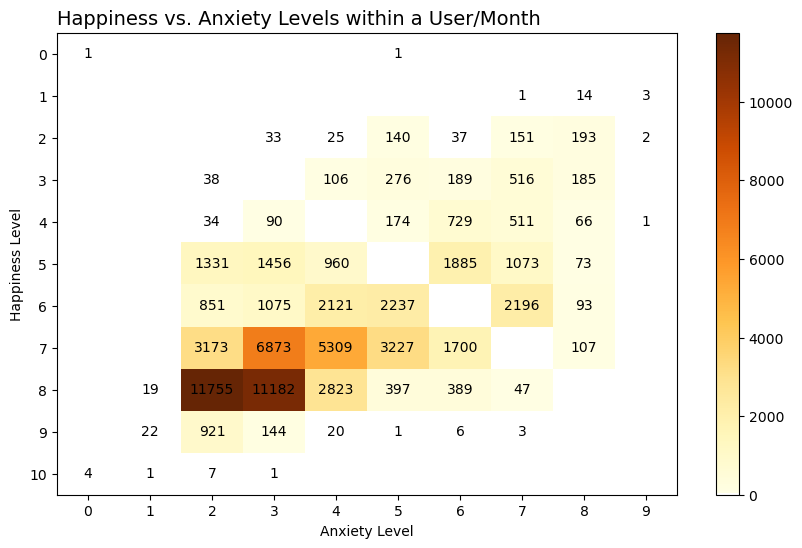

In [9]:
## VISULATISATION OF HAP ANX DISTRIBUTION
# Create a pivot table for the cross table heatmap
hap_anx_pivot = df.pivot_table(index='hap_lvl', columns='anx_lvl', aggfunc='size', fill_value=0)
# Create a custom colormap where 0 values are white
cmap = plt.cm.YlOrBr  # Original colormap
cmap_colors = cmap(np.arange(cmap.N))  # Extract colors
# Set the first color (corresponding to 0 values) to white
cmap_colors[0] = [1, 1, 1, 1]  # RGBA for white
custom_cmap = mcolors.ListedColormap(cmap_colors)
# Plot heatmap using Matplotlib
fig, ax = plt.subplots(figsize=(10, 6))
# Create heatmap with the custom colormap and white for 0 values
cax = ax.imshow(hap_anx_pivot, cmap=custom_cmap, aspect='auto')
# Add colorbar
fig.colorbar(cax, ax=ax)
# Set labels and title
ax.set_xlabel("Anxiety Level")
ax.set_ylabel("Happiness Level")
ax.set_title("Happiness vs. Anxiety Levels within a User/Month", loc="left", fontsize=14)
# Set ticks and labels
ax.set_xticks(np.arange(len(hap_anx_pivot.columns)))
ax.set_yticks(np.arange(len(hap_anx_pivot.index)))
ax.set_xticklabels(hap_anx_pivot.columns)
ax.set_yticklabels(hap_anx_pivot.index)
# Show values in each cell
for i in range(len(hap_anx_pivot.index)):
    for j in range(len(hap_anx_pivot.columns)):
        color = 'black' if hap_anx_pivot.iloc[i, j] != 0 else 'white'  # Make text invisible on white cells
        ax.text(j, i, hap_anx_pivot.iloc[i, j], ha='center', va='center', color=color)
# Show plot
plt.show()

In [10]:
## Test Hap lvl Anx Levl correlation
lvls_df = df[['hap_lvl','anx_lvl']].copy()
# Compute Pearson's Correlation and p-value using SciPy
lvls_correlation = lvls_df.corr(method='pearson')
corr_coef, p_value = pearsonr(lvls_df["hap_lvl"], lvls_df["anx_lvl"])
print(f"Pearson Correlation Coefficient: {corr_coef}")
print(f"P-value: {p_value}")
# Compute Kendall's Tau and p-value using SciPy
tau, p_value = kendalltau(lvls_df["hap_lvl"], lvls_df["anx_lvl"])
print(f"\nKendall’s Tau: {tau}")
print(f"P-value: {p_value}")

Pearson Correlation Coefficient: -0.5892245078800921
P-value: 0.0

Kendall’s Tau: -0.48323037322514284
P-value: 0.0


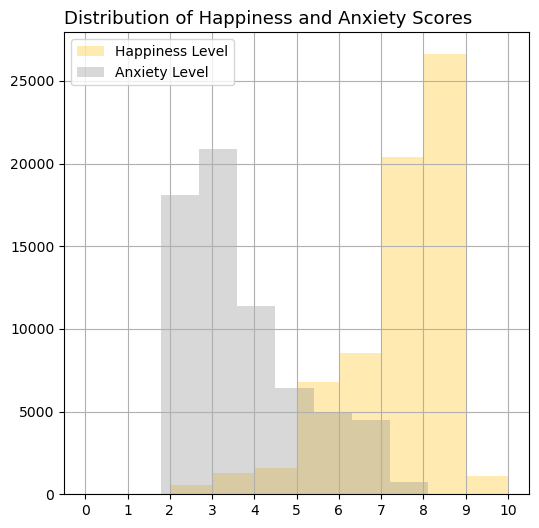

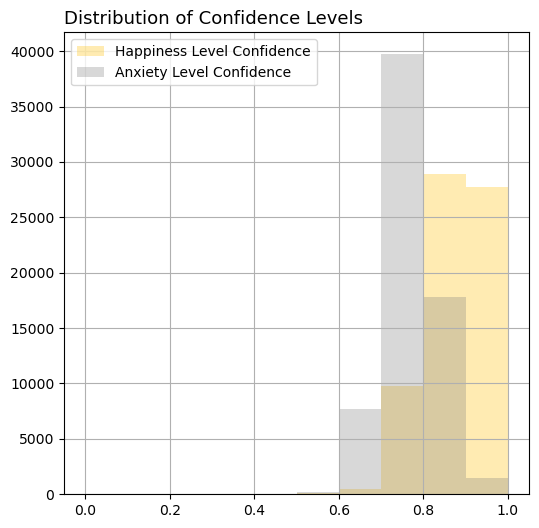

In [11]:
## VISULATISE DISTRIBUTION OF HAP/ANX LEVELS AND CONFIDENCE
# Create a histogram for hap_lvl and anx_lvl with exactly 10 bins
plt.figure(figsize=(6, 6))
# Plot happiness levels with mustard yellow color
plt.hist(df['hap_lvl'], bins=10, color='#FFC000', alpha=0.3, label='Happiness Level')  # Mustard Yellow
# Plot anxiety levels with grey color
plt.hist(df['anx_lvl'], bins=10, color='grey', alpha=0.3, label='Anxiety Level')
# Labels and title
#plt.xlabel("Level")
#plt.ylabel("Frequency")
plt.title("Distribution of Happiness and Anxiety Scores", loc='left', fontsize=13)
plt.legend()
plt.grid(True)
# Ensure all x-axis labels (0 to 10) are present
plt.xticks(range(11))
# Show plot
plt.show()
# Plot distributions for happiness and anxiety confidence
plt.figure(figsize=(6, 6))
df['hap_conf'].hist(bins=10, label='Happiness Level Confidence', color='#FFC000', alpha=0.3)
df['anx_conf'].hist(bins=10, label='Anxiety Level Confidence', color='grey', alpha=0.3)
plt.title('Distribution of Confidence Levels', loc='left', fontsize=13)
#plt.xlabel('Confidence Scores')
#plt.ylabel('Frequency')
plt.legend()
plt.show()

In [1]:
## EXPLORE CORRELATIONS BETWEEN HAPPINESS/ANXIETY LEVELS AND ASSOCIATED CONFIDENCE LEVELS
# Extract the two relevant variables
x = df['hap_lvl']
y = df['hap_conf']
# Calculate correlation coefficient
correlation = np.corrcoef(x, y)[0, 1]
# Create scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(x, y, alpha=0.2, color='#FFC000')
# Add title and labels
plt.xlabel("Happiness Level")
plt.ylabel("Happiness Confidence")
plt.title(f"Scatter Plot of Happiness Confidence vs. Happiness Levels\nCorrelation: {correlation:.2f}", loc='left')
# Show plot
plt.show()
# Extract the two relevant variables
x = df['anx_lvl']
y = df['anx_conf']
# Calculate correlation coefficient
correlation = np.corrcoef(x, y)[0, 1]
# Create scatter plot
plt.figure(figsize=(8, 4))
plt.scatter(x, y, alpha=0.2, color='grey')
# Add title and labels
plt.xlabel("Anxiety Level")
plt.ylabel("Anxiety Confidence")
plt.title(f"Scatter Plot of Anxiety Confidence vs. Anxiety Levels\nCorrelation: {correlation:.2f}", loc='left')
# Show plot
plt.show()


NameError: name 'df' is not defined

# PRE-PROCESSING
---

## Derive Financial Year Varaible

In [13]:
### DERIVE FINANCIAL YEAR VARIABLE
# derive 'financial year' field
df["financial_year"] = df.apply(
    lambda row: f"{row['year']}-{row['year']+1}" if row["month_num"] >= 4 else f"{row['year']-1}-{row['year']}",axis=1)
fin_yr_map = {"2017-2018":"2017-18", "2018-2019":"2018-19", "2019-2020":"2019-20", "2020-2021":"2020-21", "2021-2022":"2021-22", "2022-2023":"2022-23"}
df["financial_year"] = df["financial_year"].map(fin_yr_map)

## Confidence level filtering    

In [14]:
# APPLY CONFIDENCE LEVEL FILTERING
original_rows = df.shape[0]
df = df[(df["hap_conf"] >= 0.7) & (df["anx_lvl"] >= 0.7)]
rows_after_filering = df.shape[0]
rows_remove = original_rows - rows_after_filering
print("Rows removed due to confidence level filtering: " + str(rows_remove))

Rows removed due to confidence level filtering: 545


## Cleansing of Topic Data   

Languages Summary
Total identifications: 71740
Unique Languages identified: 101
Unique users: 1961
Unique months: 63
Unique users/months: 66453


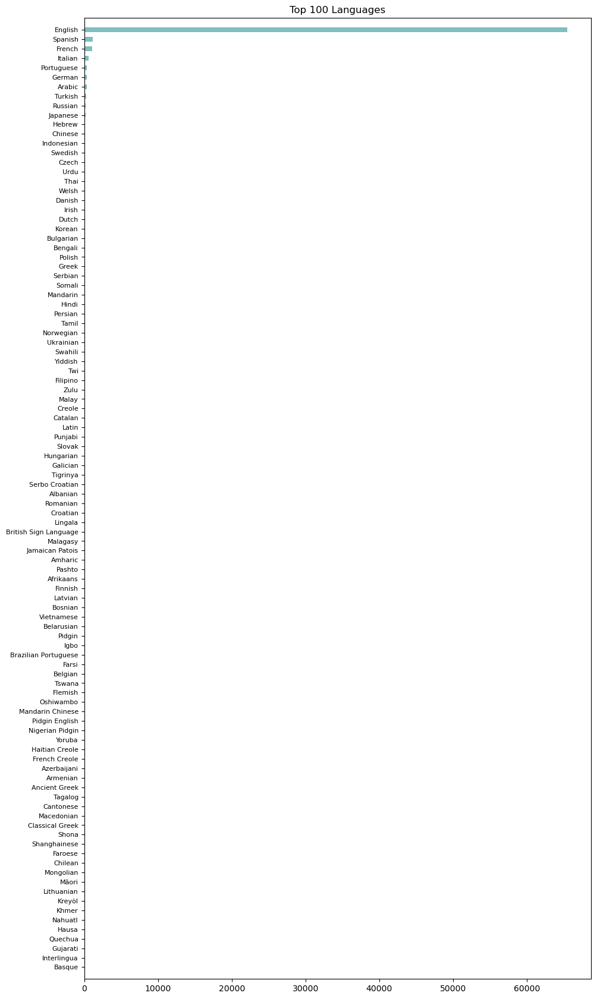

In [15]:
## MODEL AND CLEANSE LANGUAGE DATA
# create languages exploded df
lang_cols = ['concat_key', 'user_id', 'year', 'month_num', 'month_abbr', 'month_name', 'mnth_yr_text', 'languages']
lang_df = df[lang_cols].copy() #create a new dataframe with lang lists and id/time columns
lang_df = lang_df.explode("languages") #explode language lists
lang_df['languages_cleansed'] = [s.title() for s in lang_df['languages']] ### apply standard formatting (capitalisation)
lang_df['languages_cleansed'] = [s.translate(str.maketrans(string.punctuation, ' ' * len(string.punctuation))) for s in lang_df['languages_cleansed']] # replace punctuation with space
lang_df['languages_cleansed'] = [' '.join(s.split()) for s in lang_df['languages_cleansed']] # trim spaces
lang_df = lang_df[~lang_df['languages_cleansed'].str.lower().isin(['nan', 'none'])]
# create groupby count
lang_grouped = lang_df.groupby('languages_cleansed').size().reset_index(name='Count').sort_values(by='Count', ascending=False)
# create list of unique values
unique_lang_values = list(lang_df['languages_cleansed'].unique())

## SUMMARISE LANGUAGES
# print summary info
print("\033[1mLanguages Summary\033[0m")
print("Total identifications: " + str(lang_df.shape[0]))
print("Unique Languages identified: " + str(len(unique_lang_values)))
print("Unique users: " +  str(lang_df['user_id'].nunique()))
print("Unique months: " +  str(lang_df['mnth_yr_text'].nunique()))
print("Unique users/months: " +  str(lang_df['concat_key'].nunique()))
# plot counts of top 100
lang_grouped_top_100 = lang_grouped.sort_values(by='Count', ascending=False).head(100).sort_values(by='Count', ascending=True)
plt.figure(figsize=(11, 21))
plt.title('Top 100 Languages')
plt.barh(lang_grouped_top_100['languages_cleansed'], lang_grouped_top_100['Count'], height=0.5, color='teal', alpha=0.5)
plt.yticks(fontsize=8)
plt.margins(y=0.01)
plt.show()

hap_top (pre merge) shape:  (207184, 9)
RAW / CLEANSED / MERGED DF SHAPE CHECK:
hap_top_raw_grouped shape:  (13169, 2)
hap_top_cleansed_grouped shape:  (12019, 2)
hap_top (post merge) shape:  (207184, 11)
hap_top_check_df shape:  (13169, 4)
Happiness Topics Summary
Total identifications: 207184
Unique Topics: 12019
Unique users: 1955
Unique months: 63
Unique users/months: 65960


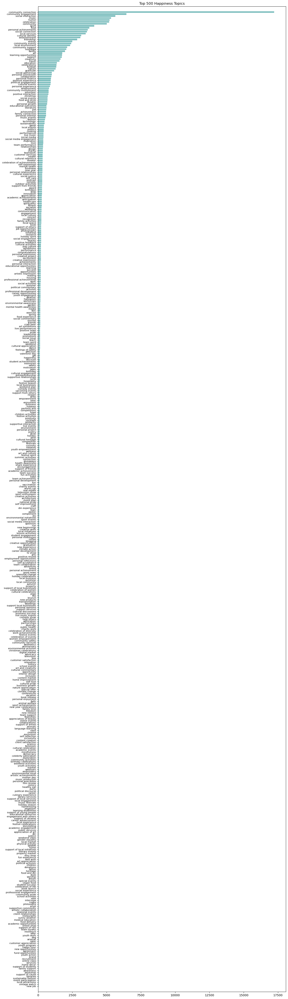

In [16]:
## MODEL AND CLEANSE HAPPINESS TOPICS
# create happiness topics exploded df
hap_top_cols = ['concat_key', 'user_id', 'year', 'month_num', 'month_abbr', 'month_name', 'mnth_yr_text', 'hap_topics']
hap_top_df = df[hap_top_cols].copy() #create a new dataframe with happiness topic lists and id/time columns
hap_top_df = hap_top_df.explode("hap_topics") #explode language lists
hap_top_df['hap_topics'] = [str(s) for s in hap_top_df['hap_topics']] #ensure string format
hap_top_df = hap_top_df.rename(columns={'hap_topics':'hap_topics_raw'}) #rename to retain raw format

## SIMPLE PRE-PROCESSING
# set to lowercase
hap_top_df['hap_topics_cleansed'] = [s.lower() for s in hap_top_df['hap_topics_raw']] #convert all characters to lower case
hap_top_df = hap_top_df[~hap_top_df['hap_topics_cleansed'].isin(['nan', 'none'])] #remove rows containing 'nan' or 'none'
# remove punctuation
hap_top_df['hap_topics_cleansed'] = [s.translate(str.maketrans(string.punctuation, ' ' * len(string.punctuation))) for s in hap_top_df['hap_topics_cleansed']]
# remove " s " left from punctuation removal
hap_top_df['hap_topics_cleansed'] = hap_top_df['hap_topics_cleansed'].str.replace(r'\s+s\s+', ' ', regex=True)
# Remove all numeric characters
hap_top_df['hap_topics_cleansed']  = hap_top_df['hap_topics_cleansed'] .str.replace(r'\d+', '', regex=True)

## STOP WORD REMOVAL
def remove_a_the(text):
    return re.sub(r'\b(?:a|the)\b(?!\w*a\w*)', '', text, flags=re.IGNORECASE).strip()
# apply function to the column
hap_top_df['hap_topics_cleansed'] = hap_top_df['hap_topics_cleansed'].apply(remove_a_the)

##LEMTIZATION
# initialize the lemmatizer
lemmatizer = WordNetLemmatizer()
def lemmatize_text(text):
    words = word_tokenize(text)  # Tokenize into words
    lemmatized_words = [lemmatizer.lemmatize(word, wordnet.VERB) for word in words]  # Lemmatize each word
    return ' '.join(lemmatized_words)  # Join back into a string
# apply lemmatization to the column
hap_top_df['hap_topics_cleansed'] = hap_top_df['hap_topics_cleansed'].apply(lemmatize_text)

## MANUAL TERM SUBSTITUTION
#standardise common words/terms#
#hap_top_df['hap_topics_cleansed'] = hap_top_df['hap_topics_cleansed'].str.replace(r'\bcovid[\s]?19\b', 'covid', regex=True)
hap_top_df['hap_topics_cleansed'] = hap_top_df['hap_topics_cleansed'].str.replace(r'\bcovid[-_ ]?19\b', 'covid', regex=True)
hap_top_df['hap_topics_cleansed'] = hap_top_df['hap_topics_cleansed'].str.replace(r'\bhouse\b', 'housing', regex=True)
hap_top_df['hap_topics_cleansed'] = hap_top_df['hap_topics_cleansed'].str.replace(r'\bfor\b', 'of', regex=True)
hap_top_df['hap_topics_cleansed'] = hap_top_df['hap_topics_cleansed'].str.replace(r'\blearn\b', 'learning', regex=True)
hap_top_df['hap_topics_cleansed'] = hap_top_df['hap_topics_cleansed'].str.replace(r'\bread\b', 'reading', regex=True)
hap_top_df['hap_topics_cleansed'] = hap_top_df['hap_topics_cleansed'].str.replace(r'\bcook\b', 'cooking', regex=True)
hap_top_df['hap_topics_cleansed'] = hap_top_df['hap_topics_cleansed'].str.replace(r'\bserice\b', 'services', regex=True)
hap_top_df['hap_topics_cleansed'] = hap_top_df['hap_topics_cleansed'].str.replace(r'\binteractions\b', 'interaction', regex=True)
hap_top_df['hap_topics_cleansed'] = hap_top_df['hap_topics_cleansed'].str.replace(r'\bconnections\b', 'connection', regex=True)
hap_top_df['hap_topics_cleansed'] = hap_top_df['hap_topics_cleansed'].str.replace(r'\bwell be\b', 'wellbeing', regex=True)
hap_top_df['hap_topics_cleansed'] = hap_top_df['hap_topics_cleansed'].str.replace(r'\bservice\b', 'services', regex=True)

# trim spaces
hap_top_df['hap_topics_cleansed'] = [' '.join(s.split()) for s in hap_top_df['hap_topics_cleansed']]

## FURTHER MODELING TO GROUPED COUNTS
# create list of unique values
unique_hap_top_values = list(hap_top_df['hap_topics_cleansed'].unique())
# print for checking
print("hap_top (pre merge) shape: ", hap_top_df.shape)
# create raw groupby count
hap_top_raw_grouped = hap_top_df.groupby('hap_topics_raw').size().reset_index(name='Count').sort_values(by='Count', ascending=False)
# create cleansed groupby count
hap_top_cleansed_grouped = hap_top_df.groupby('hap_topics_cleansed').size().reset_index(name='Count').sort_values(by='Count', ascending=False)
# merge raw and cleansed groupby counts for review
hap_top_df = hap_top_df.merge(hap_top_raw_grouped, on='hap_topics_raw',how='left')
hap_top_df.rename(columns={'Count': 'raw_term_count'}, inplace=True)
hap_top_df = hap_top_df.merge(hap_top_cleansed_grouped, on='hap_topics_cleansed',how='left')
hap_top_df.rename(columns={'Count': 'cleansed_term_count'}, inplace=True)
hap_top_df.sort_values(by=['cleansed_term_count','hap_topics_cleansed', 'raw_term_count', 'hap_topics_raw']
                       , ascending=[False, False, False, False], inplace=True)
# print for checking
print("RAW / CLEANSED / MERGED DF SHAPE CHECK:")
print("hap_top_raw_grouped shape: ", hap_top_raw_grouped.shape)
print("hap_top_cleansed_grouped shape: ", hap_top_cleansed_grouped.shape)
print("hap_top (post merge) shape: ", hap_top_df.shape)
hap_top_check_df = hap_top_df[['hap_topics_raw', 'hap_topics_cleansed','raw_term_count', 'cleansed_term_count']]
hap_top_check_df = hap_top_check_df.drop_duplicates(subset=['hap_topics_raw'])
# print for checking
print("hap_top_check_df shape: ", hap_top_check_df.shape)

## SUMMARISE HAPPINESS TOPICS
# print summary info
print("\033[1mHappiness Topics Summary\033[0m")
print("Total identifications: " + str(hap_top_df.shape[0]))
print("Unique Topics: " + str(len(unique_hap_top_values)))
print("Unique users: " +  str(hap_top_df['user_id'].nunique()))
print("Unique months: " +  str(hap_top_df['mnth_yr_text'].nunique()))
print("Unique users/months: " +  str(hap_top_df['concat_key'].nunique()))
# plot counts of top 500 cleansed
hap_top_grouped_top_500 = hap_top_cleansed_grouped.sort_values(by='Count', ascending=False).head(500).sort_values(by='Count', ascending=True)
plt.figure(figsize=(15, 60))
plt.title('Top 500 Happiness Topics')
plt.barh(hap_top_grouped_top_500['hap_topics_cleansed'], hap_top_grouped_top_500['Count'], height=0.8, color='teal', alpha=0.5)
plt.yticks(fontsize=8)
plt.margins(y=0.005)
plt.show()

anx_top (pre merge) shape:  (117993, 9)
RAW / CLEANSED / MERGED DF SHAPE CHECK:
anx_top_raw_grouped shape:  (14683, 2)
anx_top_cleansed_grouped shape:  (12547, 2)
anx_top (post merge) shape:  (117993, 11)
anx_top_check_df shape:  (14683, 4)
Anxiety Topics Summary
Total identifications: 117993
Unique Topics: 12547
Unique users: 1924
Unique months: 63
Unique users/months: 57362


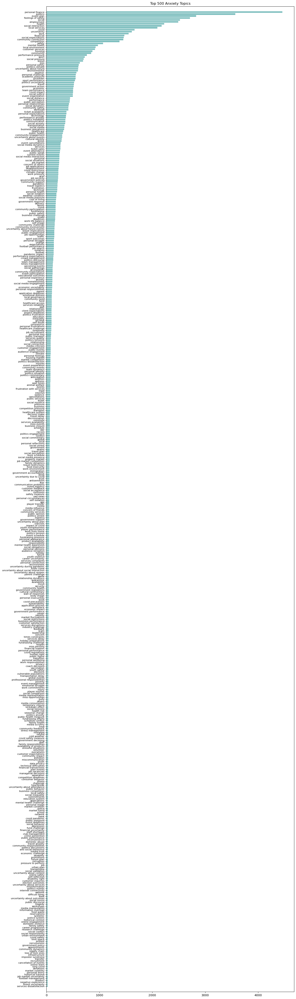

In [17]:
## MODEL ANXIETY TOPICS
# create happiness topics exploded df
anx_top_cols = ['concat_key', 'user_id', 'year', 'month_num', 'month_abbr', 'month_name', 'mnth_yr_text', 'anx_topics']
anx_top_df = df[anx_top_cols].copy() #create a new dataframe with happiness topic lists and id/time columns
anx_top_df = anx_top_df.explode("anx_topics") #explode language lists (reset index??)
anx_top_df['anx_topics'] = [str(s) for s in anx_top_df['anx_topics']] #ensure string format
anx_top_df = anx_top_df.rename(columns={'anx_topics':'anx_topics_raw'}) #rename to retain raw format

###SIMPLE PRE-PROCESSING
# set to lowercase
anx_top_df['anx_topics_cleansed'] = [s.lower() for s in anx_top_df['anx_topics_raw']] #convert all characters to lower case
anx_top_df = anx_top_df[~anx_top_df['anx_topics_cleansed'].isin(['nan', 'none'])] #remove rows containing 'nan' or 'none'
#remove punctuation
anx_top_df['anx_topics_cleansed'] = [s.translate(str.maketrans(string.punctuation, ' ' * len(string.punctuation))) for s in anx_top_df['anx_topics_cleansed']]
# remove " s " left from punctuation removal
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace(r'\s+s\s+', ' ', regex=True)
# Remove all numeric characters
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace(r'\d+', '', regex=True)

## STOPWORD REMOVAL
def remove_a_the(text):
    return re.sub(r'\b(?:a|the)\b(?!\w*a\w*)', '', text, flags=re.IGNORECASE).strip()
# apply function to the column
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].apply(remove_a_the)

## LEMTIZATION
# Initialize the lemmatizer
lemmatizer = WordNetLemmatizer()
def lemmatize_text(text):
    words = word_tokenize(text)  # Tokenize into words
    lemmatized_words = [lemmatizer.lemmatize(word, wordnet.VERB) for word in words]  # Lemmatize each word
    return ' '.join(lemmatized_words)  # Join back into a string
# Apply lemmatization to the column
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].apply(lemmatize_text)

## MANUAL TERM SUBSTITUTION
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace(r'\btime\b', 'times', regex=True)
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace(r'\bcovid[-_ ]?19\b', 'covid', regex=True)
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace(r'-related\b', '', regex=True).str.strip()
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace(r'-relate\b', '', regex=True).str.strip()
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace(r' relate\b', '', regex=True).str.strip()
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace(r' stress\b', '', regex=True).str.strip()
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace(r' issue\b', '', regex=True).str.strip()
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace(r' concern\b', '', regex=True).str.strip()
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace(r' crisis\b', '', regex=True).str.strip()
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace(r'concern about \b', '', regex=True).str.strip()
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace(r'anxiety about \b', '', regex=True).str.strip()
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace(r'\bcost of live\b', 'cost of living', regex=True)
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace(r'\bhouse\b', 'housing', regex=True)
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace(r'\bfor\b', 'of', regex=True)
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace(r'\bservice\b', 'services', regex=True)
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace(r'\binteractions\b', 'interaction', regex=True)
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace(r'\bconnections\b', 'connection', regex=True)
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace(r'\bcelebrations\b', 'celebration', regex=True)
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace('political', 'politics', regex=False)
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace('work relate', 'work', regex=False)
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace('well be', 'wellbeing', regex=False)
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace('crime rat', 'crime rate', regex=False)
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace('live condition', 'living conditions', regex=False)
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace('vaccination rat', 'vaccination rate', regex=False)
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace('covid infection rat', 'covid infection rate', regex=False)
anx_top_df['anx_topics_cleansed'] = anx_top_df['anx_topics_cleansed'].str.replace('fundraise', 'fundraising', regex=False)

# trim spaces
anx_top_df['anx_topics_cleansed'] = [' '.join(s.split()) for s in anx_top_df['anx_topics_cleansed']]

## FURTHER MODELING TO GROUP COUNTS
# create a list of unique values
unique_anx_top_values = list(anx_top_df['anx_topics_cleansed'].unique())
# print for checking
print("anx_top (pre merge) shape: ", anx_top_df.shape)
# create raw groupby count
anx_top_raw_grouped = anx_top_df.groupby('anx_topics_raw').size().reset_index(name='Count').sort_values(by='Count', ascending=False)
# create cleansed groupby count
anx_top_cleansed_grouped = anx_top_df.groupby('anx_topics_cleansed').size().reset_index(name='Count').sort_values(by='Count', ascending=False)
# merge raw and cleansed groupby counts for review
anx_top_df = anx_top_df.merge(anx_top_raw_grouped, on='anx_topics_raw',how='left')
anx_top_df.rename(columns={'Count': 'raw_term_count'}, inplace=True)
anx_top_df = anx_top_df.merge(anx_top_cleansed_grouped, on='anx_topics_cleansed',how='left')
anx_top_df.rename(columns={'Count': 'cleansed_term_count'}, inplace=True)
anx_top_df.sort_values(by=['cleansed_term_count','anx_topics_cleansed', 'raw_term_count', 'anx_topics_raw']
                       , ascending=[False, False, False, False], inplace=True)
# print for checking
print("RAW / CLEANSED / MERGED DF SHAPE CHECK:")
print("anx_top_raw_grouped shape: ", anx_top_raw_grouped.shape)
print("anx_top_cleansed_grouped shape: ", anx_top_cleansed_grouped.shape)
print("anx_top (post merge) shape: ", anx_top_df.shape)
anx_top_check_df = anx_top_df[['anx_topics_raw', 'anx_topics_cleansed','raw_term_count', 'cleansed_term_count']]
anx_top_check_df = anx_top_check_df.drop_duplicates(subset=['anx_topics_raw'])
# print for checking
print("anx_top_check_df shape: ", anx_top_check_df.shape)

## SUMMARISE HAPPINESS TOPICS
# print summary info
print("\033[1mAnxiety Topics Summary\033[0m")
print("Total identifications: " + str(anx_top_df.shape[0]))
print("Unique Topics: " + str(len(unique_anx_top_values)))
print("Unique users: " +  str(anx_top_df['user_id'].nunique()))
print("Unique months: " +  str(anx_top_df['mnth_yr_text'].nunique()))
print("Unique users/months: " +  str(anx_top_df['concat_key'].nunique()))
# plot counts of top 500 cleansed
anx_top_grouped_top_500 = anx_top_cleansed_grouped.sort_values(by='Count', ascending=False).head(500).sort_values(by='Count', ascending=True)
plt.figure(figsize=(15, 60))
plt.title('Top 500 Anxiety Topics')
plt.barh(anx_top_grouped_top_500['anx_topics_cleansed'], anx_top_grouped_top_500['Count'], height=0.8, color='teal', alpha=0.5)
plt.yticks(fontsize=8)
plt.margins(y=0.005)
plt.show()

Emotions Summary
Total identifications: 233459
Unique Emotions: 682
Unique users: 1961
Unique months: 63
Unique users/months: 66452


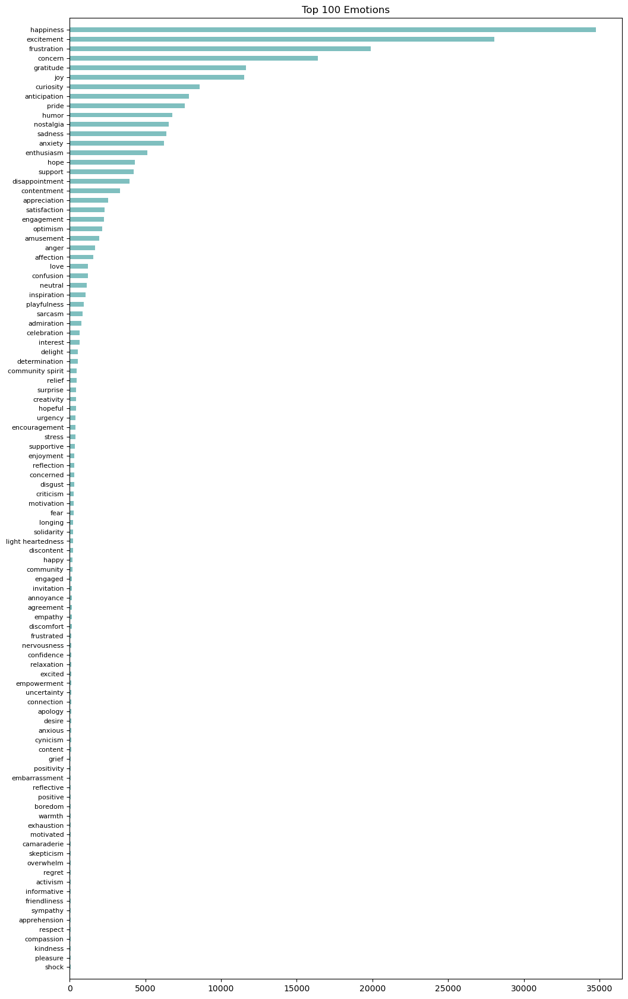

In [18]:
## MODEL AND CLEANSE EMOTIONS
# create happiness topics exploded df
emo_cols = ['concat_key', 'user_id', 'year', 'month_num', 'month_abbr', 'month_name', 'mnth_yr_text', 'emotions']
emo_df = df[emo_cols].copy() #create a new dataframe with happiness topic lists and id/time columns
emo_df = emo_df.explode("emotions") #explode language lists
emo_df = emo_df.rename(columns={'emotions':'emotions_raw'})

### apply standard formatting to consolidate against minor differences
emo_df['emotions_cleansed'] = [str(s) for s in emo_df['emotions_raw']] #ensure string format
emo_df['emotions_cleansed'] = [s.lower() for s in emo_df['emotions_cleansed']] #convert all characters to lower case
emo_df['emotions_cleansed'] = [s.translate(str.maketrans(string.punctuation, ' ' * len(string.punctuation))) for s in emo_df['emotions_cleansed']] # replace punctuation with space
emo_df['emotions_cleansed'] = [' '.join(s.split()) for s in emo_df['emotions_cleansed']] # trim spaces
emo_df = emo_df[~emo_df['emotions_cleansed'].str.lower().isin(['nan', 'none'])]

# create groupby count
emo_grouped = emo_df.groupby('emotions_cleansed').size().reset_index(name='Count').sort_values(by='Count', ascending=False)
# create list of unique values
unique_emo_values = list(emo_df['emotions_cleansed'].unique())

## SUMMARISE HAPPINESS TOPICS
# print summary info
print("\033[1mEmotions Summary\033[0m")
print("Total identifications: " + str(emo_df.shape[0]))
print("Unique Emotions: " + str(len(unique_emo_values)))
print("Unique users: " +  str(emo_df['user_id'].nunique()))
print("Unique months: " +  str(emo_df['mnth_yr_text'].nunique()))
print("Unique users/months: " +  str(emo_df['concat_key'].nunique()))
# plot counts of top 100
emo_grouped_top_100 = emo_grouped.sort_values(by='Count', ascending=False).head(100).sort_values(by='Count', ascending=True)
plt.figure(figsize=(12, 21))
plt.title('Top 100 Emotions')
plt.barh(emo_grouped_top_100['emotions_cleansed'], emo_grouped_top_100['Count'], height=0.5, color='teal', alpha=0.5)
plt.yticks(fontsize=8)
plt.margins(y=0.01)
plt.show()

Good Life Camden Topics Summary
Total rows in exploded df(total identifications): 110898
Unique Topics: 11
Unique users: 1898
Unique months: 63
Unique users/months: 56187


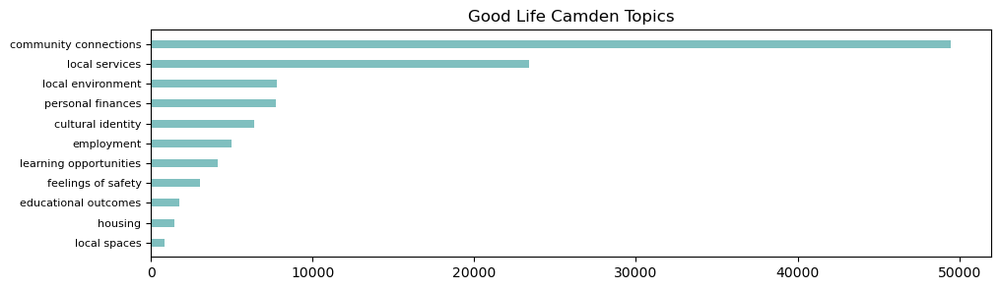

In [19]:
## MODEL AND CLEANSE GLC TOPICS
# create happiness topics exploded df
glc_cols = ['concat_key', 'user_id', 'year', 'month_num', 'month_abbr', 'month_name', 'mnth_yr_text', 'glc_topics']
glc_df = df[glc_cols].copy() #create a new dataframe with happiness topic lists and id/time columns
glc_df = glc_df.explode("glc_topics") #explode language lists
glc_df = glc_df.rename(columns={'glc_topics':'glc_topics_raw'})

### apply standard formatting to consolidate against minor differences
glc_df['glc_topics_cleansed'] = [str(s) for s in glc_df['glc_topics_raw']] #ensure string format
glc_df['glc_topics_cleansed'] = [s.lower() for s in glc_df['glc_topics_cleansed']] #convert all characters to lower case
glc_df['glc_topics_cleansed'] = [s.translate(str.maketrans(string.punctuation, ' ' * len(string.punctuation))) for s in glc_df['glc_topics_cleansed']] # replace punctuation with space
glc_df['glc_topics_cleansed'] = [' '.join(s.split()) for s in glc_df['glc_topics_cleansed']] # trim spaces
glc_df = glc_df[~glc_df['glc_topics_cleansed'].isin(['nan', 'none'])]

# filter to specified topics
glc_tops = ['cultural identity', 'local spaces', 'local services', 'community connections', 'housing', 'employment', \
 'personal finances', 'local environment', 'feelings of safety', 'learning opportunities', 'educational outcomes']
glc_df = glc_df[glc_df['glc_topics_cleansed'].isin(glc_tops)]

# create groupby count
glc_grouped = glc_df.groupby('glc_topics_cleansed').size().reset_index(name='Count').sort_values(by='Count', ascending=False)
# create list of unique values
unique_glc_values = list(glc_df['glc_topics_cleansed'].unique())

## SUMMARISE HAPPINESS TOPICS
# print summary info
print("\033[1mGood Life Camden Topics Summary\033[0m")
print("Total rows in exploded df(total identifications): " + str(glc_df.shape[0]))
print("Unique Topics: " + str(len(unique_glc_values)))
print("Unique users: " +  str(glc_df['user_id'].nunique()))
print("Unique months: " +  str(glc_df['mnth_yr_text'].nunique()))
print("Unique users/months: " +  str(glc_df['concat_key'].nunique()))
# plot counts
glc_grouped = glc_grouped.sort_values(by='Count', ascending=False).head(100).sort_values(by='Count', ascending=True)
plt.figure(figsize=(11, 3))
plt.title('Good Life Camden Topics')
plt.barh(glc_grouped['glc_topics_cleansed'], glc_grouped['Count'], height=0.4, color='teal', alpha=0.5)
plt.yticks(fontsize=8)
plt.margins(y=0.05)
plt.show()

## Checking and examples of consolidated happiness and anxiety topic data

In [ ]:
pd.set_option('display.max_rows', 500)
anx_top_check_df.sample(500)

In [ ]:
path = 'E:/twitter_analysis_data/categorical_data_review/hap_anx_top_groupby_counts/'
anx_top_check_df.to_csv(path+ "anx_top_check_df.csv", index=False)

In [ ]:
pd.set_option('display.max_rows', 500)
anx_top_check_df[anx_top_check_df['anx_topics_cleansed'].isin(['social','employment','politics', 'health'])]

In [ ]:
pd.set_option('display.max_rows', 500)
hap_top_check_df.head(500)

In [ ]:
pd.set_option('display.max_rows', 500)
hap_top_example_list = ['community connection', 'social interaction','sport','community events','design','self care','family connection','wellbeing']
hap_top_check_df[hap_top_check_df['hap_topics_cleansed'].isin(hap_top_example_list)]

## Term Similarity Analysis (run when required)
---

In [ ]:
### DEFINE SIMILARITY FUNCTIONS
## LEVENSHTEIN DISTANCE (EDIT DISTANCE)
# define a function to return lev distance from a comparison between all items in a list of strings
def return_levenshtein_dist_df(input_list):
    lev_sims = []
    for i, s1 in enumerate(input_list):
         for j, s2 in enumerate(input_list):
            if i < j:  # avoid duplicate comparisons
                dist = levenshtein_distance(s1, s2)
                similarity = 1 - dist / max(len(s1), len(s2))
                similarity = round(similarity, 2)
                lev_sims.append((s1, s2, similarity))
    cols = ["term_1", "term_2", "lev_similarity"]
    lev_sim_df = pd.DataFrame(lev_sims, columns=cols)
    lev_sim_df = lev_sim_df.sort_values(by="lev_similarity", ascending=False)
    lev_sim_df = lev_sim_df.reset_index(drop=True)
    lev_sim_df['term_pair_key'] = lev_sim_df['term_1'] + "|" + lev_sim_df['term_2']
    col_order = ['term_pair_key', 'term_1', 'term_2', 'lev_similarity']
    lev_sim_df = lev_sim_df[col_order]
    return lev_sim_df

## COSINE SIMILARITY
# define a function to return cosine similarity from a comparison between all items in a list of strings
def return_cosine_similarity_df(input_list):
    # Convert strings to TF-IDF vectors
    vectorizer = TfidfVectorizer()
    tfidf_matrix = vectorizer.fit_transform(input_list)
    # Compute cosine similarity matrix
    similarity_matrix = cosine_similarity(tfidf_matrix)
    # Create a DataFrame with one row per term pair combination
    similarities = []
    for i, term1 in enumerate(input_list):
        for j, term2 in enumerate(input_list):
            if i < j:  # Avoid duplicate pairs and self-comparisons
                similarities.append((term1, term2, similarity_matrix[i, j]))
    # Create the resulting DataFrame
    cosine_sim_df = pd.DataFrame(similarities, columns=["term_1", "term_2", "cosine_similarity"])
    cosine_sim_df = cosine_sim_df.sort_values(by='cosine_similarity', ascending=False)
    cosine_sim_df = cosine_sim_df.reset_index(drop=True)
    cosine_sim_df['cosine_similarity'] = [round(x,2) for x in cosine_sim_df['cosine_similarity']]
    cosine_sim_df['term_pair_key'] = cosine_sim_df['term_1'] + "|" + cosine_sim_df['term_2']
    col_order = ['term_pair_key', 'term_1', 'term_2', 'cosine_similarity']
    cosine_sim_df = cosine_sim_df[col_order]
    return cosine_sim_df

## JACCARD SIMILARITY
# define a function to return Jaccard similarity from a comparison between all items in a list of strings
def return_jaccard_similarity_df(input_list):
    def jaccard_similarity(s1, s2):
        set1, set2 = set(s1), set(s2)
        return len(set1 & set2) / len(set1 | set2)
    similarities = []
    for i, s1 in enumerate(input_list):
        for j, s2 in enumerate(input_list):
            if i < j:
                similarity = jaccard_similarity(s1, s2)
                similarity = round(similarity, 2)
                similarities.append((s1, s2, similarity))   
    jaccard_sim_df = pd.DataFrame(similarities, columns=["term_1", "term_2", "jaccard_similarity"])
    jaccard_sim_df = jaccard_sim_df.sort_values(by='jaccard_similarity', ascending=False)
    jaccard_sim_df = jaccard_sim_df.reset_index(drop=True)
    jaccard_sim_df['term_pair_key'] = jaccard_sim_df['term_1'] + "|" + jaccard_sim_df['term_2']
    col_order = ['term_pair_key', 'term_1', 'term_2', 'jaccard_similarity']
    jaccard_sim_df = jaccard_sim_df[col_order]
    return jaccard_sim_df

## FUZZY WUZZY
# define a function to return Fuzz similarity from a comparison between all items in a list of strings
def return_fuzz_similarity_df(input_list):
    similarities = []
    for i, s1 in enumerate(input_list):
        for j, s2 in enumerate(input_list):
            if i < j:
                similarity = fuzz.ratio(s1, s2)
                similarity = similarity/100
                similarities.append((s1, s2, similarity))
    fuzz_sim_df = pd.DataFrame(similarities, columns=["term_1", "term_2", "fuzz_similarity"])
    fuzz_sim_df = fuzz_sim_df.sort_values(by='fuzz_similarity', ascending=False)
    fuzz_sim_df = fuzz_sim_df.reset_index(drop=True)
    fuzz_sim_df['term_pair_key'] = fuzz_sim_df['term_1'] + "|" + fuzz_sim_df['term_2']
    col_order = ['term_pair_key', 'term_1', 'term_2', 'fuzz_similarity']
    fuzz_sim_df = fuzz_sim_df[col_order]
    return fuzz_sim_df

In [ ]:
### DEFINE A FUNCTION THAT RETURNS A DF FROM A LIST OF UNIQUE STRINGS APPLYING ALL 4 SIMILARITY MEASURES PLUS A COMPOSITE
def return_similarity_df(input_list):
    levevshtein_df = return_levenshtein_dist_df(input_list)
    print("Leveshtein difference computation completed")
    cosine_df = return_cosine_similarity_df(input_list)
    print("Cosine similarity computation completed")
    similarity_df = levevshtein_df.merge(cosine_df[['term_pair_key', 'cosine_similarity']], on="term_pair_key", how="left")
    del cosine_df
    gc.collect()
    jaccard_df = return_jaccard_similarity_df(input_list)
    print("Jaccard similarity computation completed")
    similarity_df = similarity_df.merge(jaccard_df[['term_pair_key', 'jaccard_similarity']], on="term_pair_key", how="left")
    del jaccard_df
    gc.collect()
    fuzz_df = return_fuzz_similarity_df(input_list)
    print("Fuzz similarity computation completed")
    similarity_df = similarity_df.merge(fuzz_df[['term_pair_key', 'fuzz_similarity']], on="term_pair_key", how="left")
    del fuzz_df
    gc.collect()
    similarity_df['composite_similarity'] = (similarity_df['lev_similarity']
                                             + similarity_df['cosine_similarity']
                                             + similarity_df['jaccard_similarity']
                                             + similarity_df['fuzz_similarity']) / 4
    similarity_df['composite_similarity'] = [round(x,2) for x in similarity_df['composite_similarity']]
    similarity_df = similarity_df.sort_values(by='composite_similarity', ascending=False)
    return similarity_df

In [ ]:
############### LONG RUN: CALCULATE AND STORE HAP SIMILARITY SCORES ##################
path = "E:/twitter_analysis_data/categorical_data_review/similarity scores/"
hap_top_sim_df = return_similarity_df(unique_hap_top_values)
hap_top_sim_df = hap_top_sim_df[hap_top_sim_df['composite_similarity'] > 0.5]
hap_top_sim_df.to_parquet(path + "hap_top_sim_df_parquet.parquet", engine="pyarrow")
del hap_top_sim_df
gc.collect()

In [ ]:
############### LONG RUN: CALCULATE AND STORE ANX SIMILARITY SCORES ##################
path = "E:/twitter_analysis_data/categorical_data_review/similarity scores/"
anx_top_sim_df = return_similarity_df(unique_anx_top_values)
anx_top_sim_df = anx_top_sim_df[anx_top_sim_df['composite_similarity'] > 0.5]
anx_top_sim_df.to_parquet(path + "anx_top_sim_df_parquet.parquet", engine="pyarrow")
del anx_top_sim_df
gc.collect()

In [ ]:
############### LONG RUN: CALCULATE AND STORE EMOTION SIMILARITY SCORES ##################
path = "E:/twitter_analysis_data/categorical_data_review/similarity scores/"
emo_sim_df = return_similarity_df(unique_emo_values)
emo_sim_df = emo_sim_df[emo_sim_df['composite_similarity'] > 0]
emo_sim_df.to_parquet(path + "emo_sim_df_parquet.parquet", engine="pyarrow")
del emo_sim_df
gc.collect()

In [ ]:
### MANUAL IDENTIFICATION OF ASSOCIATED CATEGORICAL VALUES FOR CONSOLIDATION

In [ ]:
# load parquet files of similarity calculations
path = "E:/twitter_analysis_data/categorical_data_review/similarity scores/"
anx_top_sim_df = pd.read_parquet(path + 'anx_top_sim_df_parquet.parquet')
hap_top_sim_df = pd.read_parquet(path + 'hap_top_sim_df_parquet.parquet')
#emo_sim_df = pd.read_parquet(path + 'emo_sim_df_parquet.parquet')

In [ ]:
#remove numbers
# replace "for" with "of"

In [ ]:
anx_top_sim_df.sort_values(by="composite_similarity", ascending=False).head(500)

In [ ]:
hap_top_sim_df.sort_values(by="composite_similarity", ascending=False).head(500)

In [ ]:
hap_top_sim_df.to_csv(path + "hap_top_sim_df_csv.csv", index=False)
anx_top_sim_df.to_csv(path + "hap_top_sim_df_csv.csv", index=False)

In [ ]:
hap_top_sim_df.sample(3)

In [ ]:
emo_sim_df.sample(3)

In [ ]:
#del anx_top_sim_df
del hap_top_sim_df
#del emo_sim_df
gc.collect()

In [ ]:
emo_sim_df = emo_sim_df.sort_values(by='composite_similarity', ascending=False)

In [ ]:
emo_sim_df[emo_sim_df['composite_similarity'] > 0.5].sample(50).sort_values(by='composite_similarity', ascending=False)

In [ ]:
plt.hist(anx_top_sim_df['composite_similarity'], bins=100, edgecolor='black')
plt.show()

## Model cleansed categorical data back into main DF
---

In [20]:
# create new dataframe squishing data previously exploded for term consolidation
lang_df_squish = lang_df.groupby('concat_key')['languages_cleansed'].apply(list).reset_index()
hap_top_df_squish = hap_top_df.groupby('concat_key')['hap_topics_cleansed'].apply(list).reset_index()
anx_top_df_squish = anx_top_df.groupby('concat_key')['anx_topics_cleansed'].apply(list).reset_index()
emo_df_squish = emo_df.groupby('concat_key')['emotions_cleansed'].apply(list).reset_index()
glc_df_squish = glc_df.groupby('concat_key')['glc_topics_cleansed'].apply(list).reset_index()
# combine squished data into main dataframe
cleansed_dfs = [lang_df_squish, hap_top_df_squish, anx_top_df_squish, emo_df_squish, glc_df_squish]
for c_df in cleansed_dfs:
    df = df.merge(c_df, on='concat_key', how='left')
df['languages_cleansed'] = df['languages_cleansed'].apply(lambda x: x if isinstance(x, list) else [])
df['hap_topics_cleansed'] = df['hap_topics_cleansed'].apply(lambda x: x if isinstance(x, list) else [])
df['anx_topics_cleansed'] = df['anx_topics_cleansed'].apply(lambda x: x if isinstance(x, list) else [])
df['emotions_cleansed'] = df['emotions_cleansed'].apply(lambda x: x if isinstance(x, list) else [])
df['glc_topics_cleansed'] = df['glc_topics_cleansed'].apply(lambda x: x if isinstance(x, list) else [])

# CROSS REFERENCING ONS PERSONAL WELLBEING DATA
---

## Agregating to financial year and visualising against ONS Personal Wellbeing

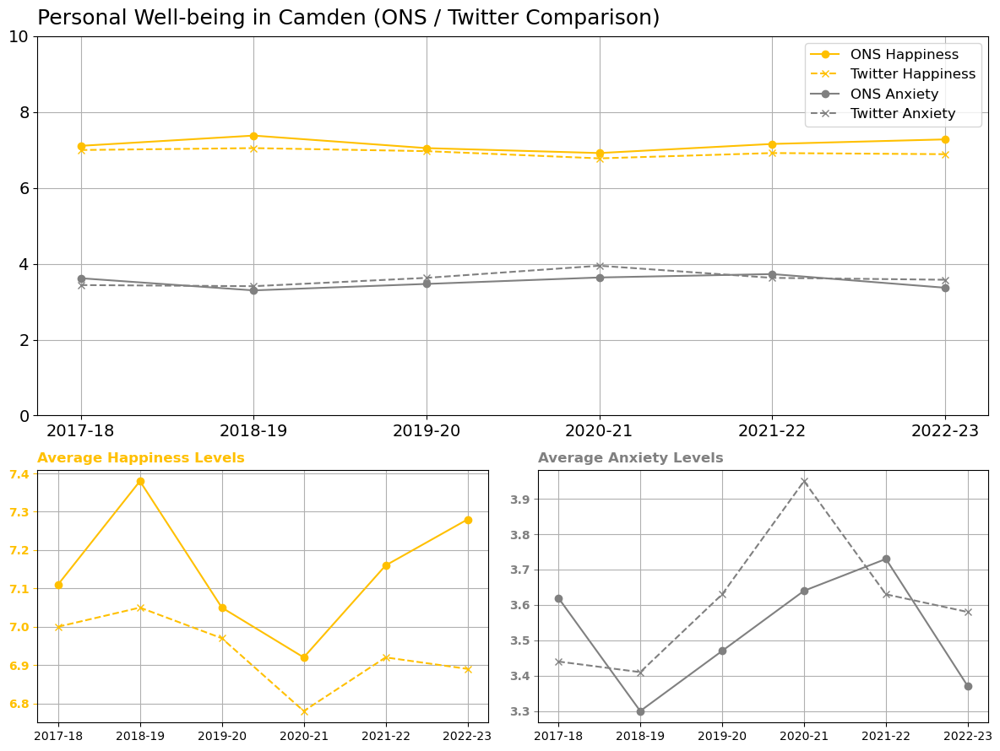

In [21]:
### CREATE MEAN HAP ANX LVL YEAR-ON-YEAR COMPARISON DATA

# create financial year mean values df
fin_year_means = df.groupby("financial_year").agg(
    mean_hap_lvl=("hap_lvl", lambda x: round(x.mean(), 2)),
    mean_anx_lvl=("anx_lvl", lambda x: round(x.mean(), 2))
).reset_index()

# load ONS mean values by financial year
ons_means = {"financial_year": ["2017-18", "2018-19", "2019-20", "2020-21", "2021-22", "2022-23"],
    "ons_cam_mean_hap": [7.11, 7.38, 7.05, 6.92, 7.16, 7.28],"ons_cam_mean_anx": [3.62, 3.3, 3.47, 3.64, 3.73, 3.37]}
ons_means = pd.DataFrame(ons_means)

# merge dataframes
merged_df = ons_means.merge(fin_year_means, on="financial_year")

# Creating the figure with an adjusted layout
fig = plt.figure(figsize=(12, 9))
gs = fig.add_gridspec(2, 2, height_ratios=[1.5, 1], width_ratios=[1, 1])
ax_top = fig.add_subplot(gs[0, :])  # Top visualization spans full width
ax_hap = fig.add_subplot(gs[1, 0])  # Bottom-left
ax_anx = fig.add_subplot(gs[1, 1])  # Bottom-right

# Full data visualization (Top Chart)
ax_top.plot(merged_df["financial_year"], merged_df["ons_cam_mean_hap"], color="#FFC000", linestyle="-", marker='o', label="ONS Happiness")
ax_top.plot(merged_df["financial_year"], merged_df["mean_hap_lvl"], color="#FFC000", linestyle="--", marker='x', label="Twitter Happiness")
ax_top.plot(merged_df["financial_year"], merged_df["ons_cam_mean_anx"], color="grey", linestyle="-", marker='o', label="ONS Anxiety")
ax_top.plot(merged_df["financial_year"], merged_df["mean_anx_lvl"], color="grey", linestyle="--", marker='x', label="Twitter Anxiety")
ax_top.set_ylim(0, 10)
ax_top.tick_params(axis='y', labelsize=14)
ax_top.tick_params(axis='x', labelsize=14)
#ax_top.set_xlabel("Financial Year")
#ax_top.set_ylabel("Well-being Score")
ax_top.set_title("Personal Well-being in Camden (ONS / Twitter Comparison)", loc='left', fontsize=18, pad=10)
ax_top.legend(fontsize="12", loc ="upper right")
ax_top.grid(True)

# Mean Happiness Levels (Bottom-left)
ax_hap.plot(merged_df["financial_year"], merged_df["ons_cam_mean_hap"], color="#FFC000", linestyle="-", marker='o', label="ONS Happiness")
ax_hap.plot(merged_df["financial_year"], merged_df["mean_hap_lvl"], color="#FFC000", linestyle="--", marker='x', label="Local Happiness")
#ax_hap.set_xlabel("Financial Year")
#ax_hap.set_ylabel("Happiness Level")
ax_hap.set_title("Average Happiness Levels", loc='left', color="#FFC000", fontweight="bold")
#ax_hap.legend()
ax_hap.tick_params(axis='y', colors="#FFC000")
plt.setp(ax_hap.get_yticklabels(), fontweight="bold")
ax_hap.grid(True)

# Mean Anxiety Levels (Bottom-right)
ax_anx.plot(merged_df["financial_year"], merged_df["ons_cam_mean_anx"], color="grey", linestyle="-", marker='o', label="ONS Anxiety")
ax_anx.plot(merged_df["financial_year"], merged_df["mean_anx_lvl"], color="grey", linestyle="--", marker='x', label="Local Anxiety")
#ax_anx.set_xlabel("Financial Year")
#ax_anx.set_ylabel("Anxiety Level")
ax_anx.tick_params(axis='y', colors="grey")
plt.setp(ax_anx.get_yticklabels(), fontweight="bold")
ax_anx.set_title("Average Anxiety Levels", loc='left', color="grey", fontweight="bold")
#ax_anx.legend()
ax_anx.grid(True)

# Adjust layout and show the figure
plt.tight_layout()
plt.show()


# LONGITUDINAL ANALYSIS OF HAPPINESS AND ANXIETY LEVELS
---

## Change in mean happiness and anxiety month on month

In [22]:
# create new df filtering to columns required for analysis
hap_anx_longitudinal_cols = ['concat_key', 'user_id', 'year', 'month_num', 'month_abbr', 'month_name', 'mnth_yr_text',
                            'hap_lvl', 'anx_lvl', 'hap_topics_cleansed', 'anx_topics_cleansed']
hap_anx_longitudinal_df = df[hap_anx_longitudinal_cols].copy()

In [23]:
mean_hap_anx_mnth = hap_anx_longitudinal_df.groupby('mnth_yr_text').agg({'hap_lvl': 'mean', 'anx_lvl': 'mean'}).reset_index()
# Convert 'mnth_yr_text' to datetime format
mean_hap_anx_mnth['date'] = pd.to_datetime(mean_hap_anx_mnth['mnth_yr_text'], format='%B %Y')
# Sort DataFrame by the date
mean_hap_anx_mnth = mean_hap_anx_mnth.sort_values(by='date').reset_index(drop=True)

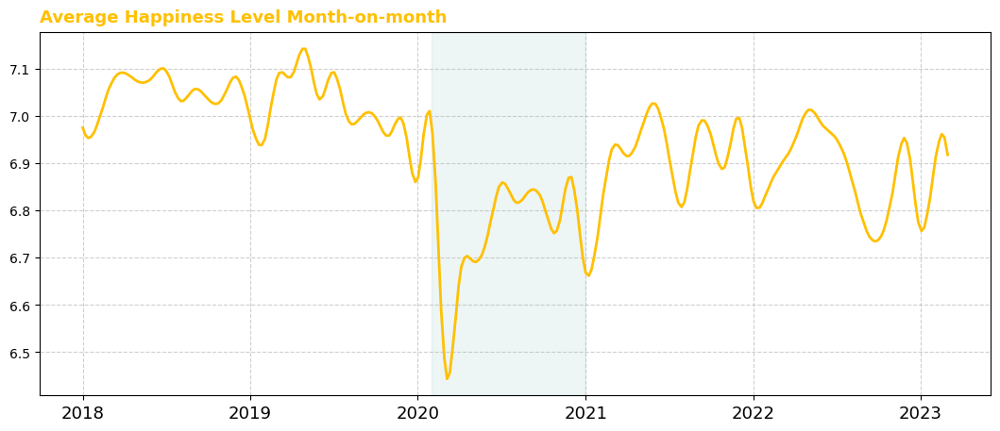

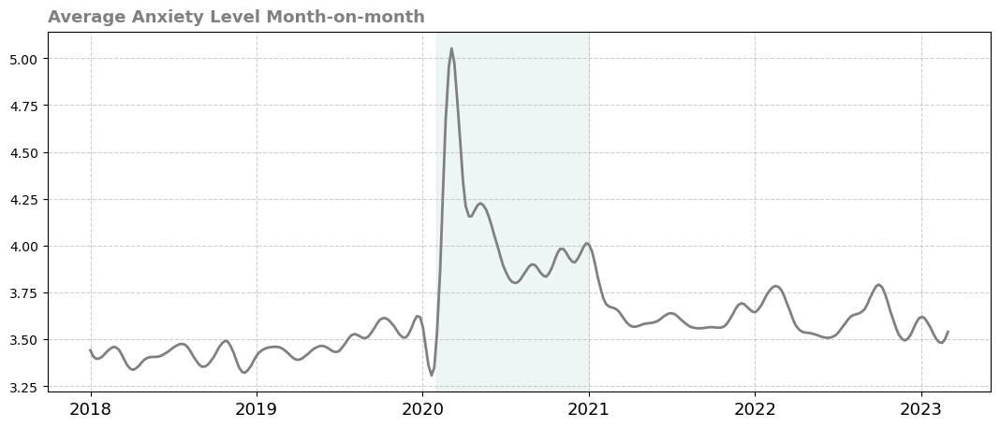

In [24]:
# Define period markers for February 2020 to January 2021
start_period = pd.to_datetime('February 2020')
end_period = pd.to_datetime('January 2021')

## Apply smoothing
# Create a function for smoothing the lines
def smooth_line(x, y, num_points=300):
    """Interpolates data points to create a smooth curve."""
    x_numeric = np.array(x.map(pd.Timestamp.toordinal))  # Convert datetime to ordinal values
    y_numeric = np.array(y)  
    # Create an interpolation function
    spline = make_interp_spline(x_numeric, y_numeric, k=3)  # k=3 for cubic spline
    x_smooth = np.linspace(x_numeric.min(), x_numeric.max(), num_points)
    y_smooth = spline(x_smooth)
    # Convert x_smooth back to datetime
    x_smooth_dates = [pd.Timestamp.fromordinal(int(val)) for val in x_smooth]
    return x_smooth_dates, y_smooth
# Generate smoothed data for hap_lvl
x_smooth_hap, y_smooth_hap = smooth_line(mean_hap_anx_mnth['date'], mean_hap_anx_mnth['hap_lvl'])
# Generate smoothed data for anx_lvl
x_smooth_anx, y_smooth_anx = smooth_line(mean_hap_anx_mnth['date'], mean_hap_anx_mnth['anx_lvl'])

# Plot Happiness Level Trend
plt.figure(figsize=(13, 5))
plt.axvspan(start_period, end_period, color='#51a3a3', alpha=0.1)  # Highlight period with a shaded rectangle
plt.plot(x_smooth_hap, y_smooth_hap, color='#FFC000', linestyle='-', linewidth=2)
#plt.xlabel('Date')
#plt.ylabel('Happiness Level')
plt.title('Average Happiness Level Month-on-month', loc='left', fontsize=13, pad=8, color="#FFC000", fontweight="bold")
plt.xticks(fontsize=13)
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# Plot Anxiety Level Trend
plt.figure(figsize=(13, 5))
plt.axvspan(start_period, end_period, color='#51a3a3', alpha=0.1)  # Highlight period with a shaded rectangle
plt.plot(x_smooth_anx, y_smooth_anx, color='grey', linestyle='-', linewidth=2)
#plt.xlabel('Date')
#plt.ylabel('Anxiety Level')
plt.title('Average Anxiety Level Month-on-month', loc='left', fontsize=13, pad=8, color="grey", fontweight="bold")
plt.xticks(fontsize=13)
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

Staistical summary of high level trend and calculation of statistical signifcance

# DRIVERS OF HAPPINESS AND ANXIETY
---

## Simple Word Clouds

In [25]:
## create count dictionaries from which to build WordColouds
# define a function to deriver word count dict
def unique_item_occurence_counts(series):
    list_of_lists = []
    for x in series:    
        for item in x:
            list_of_lists.append(item)        
    counts_dict = Counter(list_of_lists)
    return counts_dict
# create count dicts
hap_topic_count_dict = unique_item_occurence_counts(df['hap_topics_cleansed'])
anx_topic_count_dict = unique_item_occurence_counts(df['anx_topics_cleansed'])

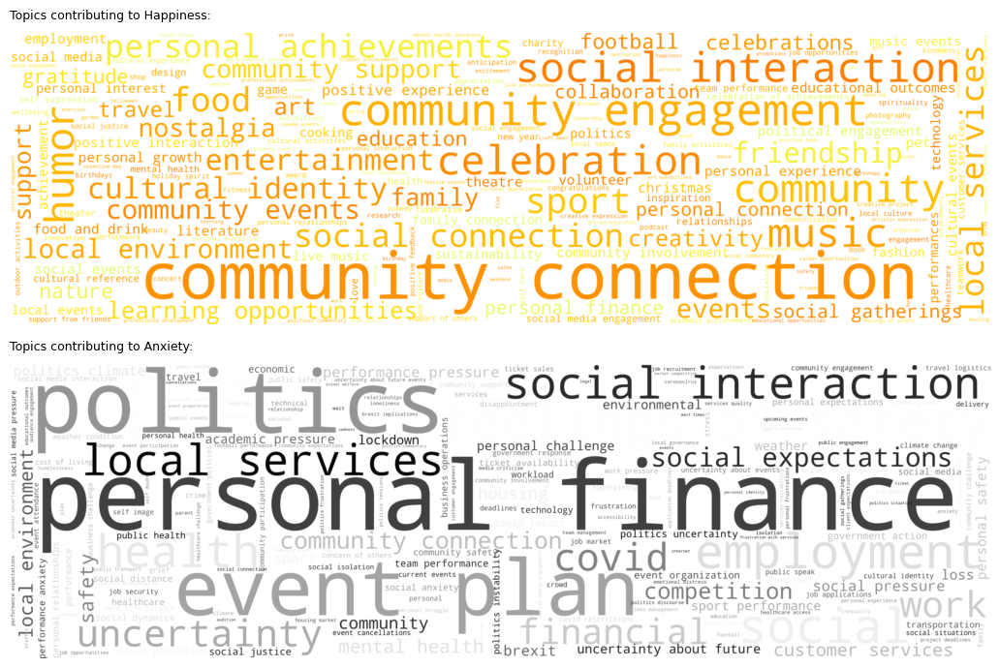

In [26]:
## VISUALISE HAPPINESS AND ANXIETY TOPICS AS SIMPLE WORDCLOUDS (with random colour shading)
# create WordCloud objects for both dictionaries
hap_wc = WordCloud(
    width=1000,
    height=300,
    background_color='white',
    colormap='Wistia',
    prefer_horizontal=0.9,
    scale=10,
    random_state=2,
).generate_from_frequencies(hap_topic_count_dict)
anx_wc = WordCloud(
    width=1000,
    height=300,
    background_color='white',
    colormap='gray',
    prefer_horizontal=0.9,
    scale=10,
    random_state=2,
).generate_from_frequencies(anx_topic_count_dict)
# plot the word clouds side by side
fig, axes = plt.subplots(2, 1, figsize=(14, 7))
# hap word cloud
axes[0].imshow(hap_wc, interpolation='bilinear')
axes[0].set_title("Topics contributing to Happiness:", fontsize=9, loc='left', color='black', pad=10)
axes[0].axis('off')
# anx word cloud
axes[1].imshow(anx_wc, interpolation='bilinear')
axes[1].set_title("Topics contributing to Anxiety:", fontsize=9, loc='left', color='black', pad=10)
axes[1].axis('off')
# display the plot
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

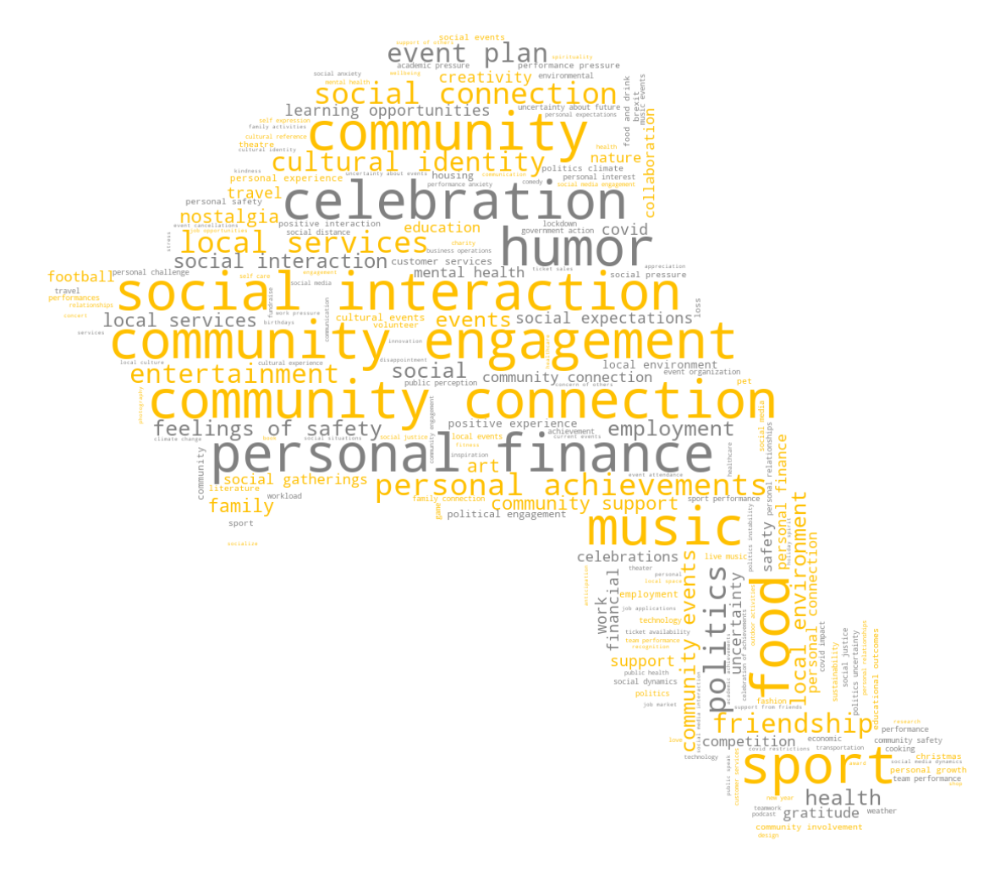

In [27]:
## VISUALISE HAPPINESS AND ANXIETY TOPICS AS SINGLE WORDCLOUD WITH CAMDEN MASK

# process words to visualize overlaps separately
combined_word_counts = {}
hap_topic_words = set(hap_topic_count_dict.keys())
anx_topic_words = set(anx_topic_count_dict.keys())
overlapping_words = hap_topic_words & anx_topic_words

# create combined dictionary (with overlapping words delineated with a " " to indicate and category) 
for word, freq in hap_topic_count_dict.items():
        combined_word_counts[word] = freq
for word, freq in anx_topic_count_dict.items():
    if word in overlapping_words:
        combined_word_counts[word + " "] = freq
    else:
        combined_word_counts[word] = freq

# initialise sets and manage overlaps
hap_words_set = set(hap_topic_count_dict.keys())
anx_words_set = set(anx_topic_count_dict.keys())
overlap_words_set = hap_words_set.intersection(anx_words_set)
anx_words_minus_overlap_set = anx_words_set.symmetric_difference(hap_words_set)
overlap_with_spcae_set = {s + " " for s in overlap_words_set}
anx_words_set_viz = anx_words_minus_overlap_set | overlap_with_spcae_set
hap_words_set_viz = hap_words_set

# define class objects
class SimpleGroupedColorFunc(object):
    """Create a color function object which assigns EXACT colors
       to certain words based on the color to words mapping
       Parameters
        - color_to_words : dict(str -> list(str))   A dictionary that maps a color to the list of words.
        - default_color : str   Color that will be assigned to a word that's not a member of any value from color_to_words.
    """
    def __init__(self, color_to_words, default_color):
        self.word_to_color = {word: color
                              for (color, words) in color_to_words.items()
                              for word in words}

        self.default_color = default_color
    def __call__(self, word, **kwargs):
        return self.word_to_color.get(word, self.default_color)
class GroupedColorFunc(object):
    """Create a color function object which assigns DIFFERENT SHADES of
       specified colors to certain words based on the color to words mapping.
       Uses wordcloud.get_single_color_func
       Parameters: 
           - color_to_words : dict(str -> list(str))    A dictionary that maps a color to the list of words.
           - default_color : str    Color that will be assigned to a word that's not a member of any value from color_to_words.
    """
    def __init__(self, color_to_words, default_color):
        self.color_func_to_words = [
            (get_single_color_func(color), set(words))
            for (color, words) in color_to_words.items()]
        self.default_color_func = get_single_color_func(default_color)
    def get_color_func(self, word):
        """Returns a single_color_func associated with the word"""
        try:
            color_func = next(
                color_func for (color_func, words) in self.color_func_to_words
                if word in words)
        except StopIteration:
            color_func = self.default_color_func
        return color_func
    def __call__(self, word, **kwargs):
        return self.get_color_func(word)(word, **kwargs)

# load Camden mask
camden_mask = np.array(Image.open("C:/Users/Edward/Documents/Twitter Analysis Notebooks/suplimentary_files/camden_mask.png"))

# intitalise wc word cloud object dpcs:https://amueller.github.io/word_cloud/generated/wordcloud.WordCloud.html
wc = WordCloud(
    width=500,
    height=500,
    background_color='white',
    mode='RGBA',
    mask=camden_mask,
    prefer_horizontal=0.8,
    relative_scaling=0.,
    #random_state=1,
).generate_from_frequencies(combined_word_counts)

# colour to words dicts
color_to_words = {
    # words below will be colored with a green single color function
    '#FFC000': list(hap_words_set_viz),
    # will be colored with a red single color function
    'grey': list(anx_words_set_viz)
}
# words that are not in any of the color_to_words values  will be colored with a grey single color function
default_color = 'grey'
# Create a color function with single tone
# grouped_color_func = SimpleGroupedColorFunc(color_to_words, default_color)
# Create a color function with multiple tones
grouped_color_func = SimpleGroupedColorFunc(color_to_words, default_color)
# Apply our color function
wc.recolor(color_func=grouped_color_func)

# save image
path = 'E:/twitter_analysis_data/viz/lbc_wc/'
x = random.randint(10000000, 99999999)
wc.to_file(path + str(x) + "wordcloud.png")  # This may not support transparency in some versions
plt.savefig(path + str(x) + "_lcb_hap_anx_wc_trans.png", transparent=True, format="png", dpi=160, bbox_inches='tight')

# plot visualisation
plt.figure(figsize=(15, 15))
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.show()


## TF-IDF for 3 chronoclogial Periods (experimental)

In [ ]:
# create new df filtering to columns required for analysis
hap_anx_longitudinal_cols = ['concat_key', 'user_id', 'year', 'month_num', 'month_abbr', 'month_name', 'mnth_yr_text',
                            'hap_lvl', 'anx_lvl', 'hap_topics_cleansed', 'anx_topics_cleansed']
hap_anx_longitudinal_df = df[hap_anx_longitudinal_cols].copy()

In [ ]:
hap_anx_longitudinal_df.sample(3)

In [ ]:
## DELINEATING 3 PERIODS
# convert 'mnth_yr_text' to datetime format
hap_anx_longitudinal_df['date'] = pd.to_datetime(df['mnth_yr_text'], format='%B %Y')
# define category labels based on the given periods
def categorise_period(date):
    if date >= pd.to_datetime('January 2018') and date <= pd.to_datetime('January 2020'):
        return 'Jan 2018 - Jan 2020'
    elif date >= pd.to_datetime('February 2020') and date <= pd.to_datetime('January 2021'):
        return 'Feb 2020 - Jan 2021'
    elif date >= pd.to_datetime('February 2021') and date <= pd.to_datetime('March 2023'):
        return 'Feb 2021 - Mar 2023'
    else:
        return 'Other'  # In case there are unexpected values
# apply the categoriSation function
hap_anx_longitudinal_df['period_category'] = hap_anx_longitudinal_df['date'].apply(categorise_period)

In [ ]:
hap_anx_longitudinal_df.sample(3)

In [ ]:
hap_anx_longitudinal_df.columns

In [ ]:
hap_anx_longitudinal_df.shape

In [ ]:
### REMODELING TOPIC DATA FOR TF-IDF COMPUTATION ###

In [ ]:

## create corpus dict for happiness topics
# Filter out rows where 'hap_topics_cleansed' is empty
temp_tfidf_df_hap = hap_anx_longitudinal_df[
    hap_anx_longitudinal_df['hap_topics_cleansed'].apply(lambda x: isinstance(x, list) and len(x) > 0)
].copy()
# Explode lists so each element gets its own row
temp_tfidf_df_hap = temp_tfidf_df_hap.explode('hap_topics_cleansed')
# Ensure 'hap_topics_cleansed' contains only string values
temp_tfidf_df_hap['hap_topics_cleansed'] = temp_tfidf_df_hap['hap_topics_cleansed'].astype(str)
# Remodel topic data into a dictionary (key: period_category, value: list of strings)
hap_period_dict = temp_tfidf_df_hap.groupby('period_category')['hap_topics_cleansed'].agg(list).to_dict()
# specify the desired order
period_order = ['Jan 2018 - Jan 2020', 'Feb 2020 - Jan 2021', 'Feb 2021 - Mar 2023']
# Reconstruct dictionary in the specified order
hap_period_dict = {key: hap_period_dict[key] for key in period_order}
# de,ete temp df
del temp_tfidf_df_hap

## create corpus dict for anxiety topics
# Filter out rows where 'anx_topics_cleansed' is empty
temp_tfidf_df_anx = hap_anx_longitudinal_df[
    hap_anx_longitudinal_df['anx_topics_cleansed'].apply(lambda x: isinstance(x, list) and len(x) > 0)
].copy()
# Explode lists so each element gets its own row
temp_tfidf_df_anx = temp_tfidf_df_anx.explode('anx_topics_cleansed')
# Ensure 'anx_topics_cleansed' contains only string values
temp_tfidf_df_anx['anx_topics_cleansed'] = temp_tfidf_df_anx['anx_topics_cleansed'].astype(str)
# Remodel topic data into a dictionary (key: period_category, value: list of strings)
anx_period_dict = temp_tfidf_df_anx.groupby('period_category')['anx_topics_cleansed'].agg(list).to_dict()
# specify the desired order
period_order = ['Jan 2018 - Jan 2020', 'Feb 2020 - Jan 2021', 'Feb 2021 - Mar 2023']
# Reconstruct dictionary in the specified order
anx_period_dict = {key: anx_period_dict[key] for key in period_order}
# de,ete temp df
del temp_tfidf_df_anx

In [ ]:
### output dicts as json
period_tfidf_path = 'E:/twitter_analysis_data/categorical_data_review/tfidf 3 period analysis/'
with open(period_tfidf_path + "hap_3_doc_dict.json", "w") as json_file:
    json.dump(hap_period_dict, json_file, indent=4)
with open(period_tfidf_path + "anx_3_doc_dict.json", "w") as json_file:
    json.dump(anx_period_dict, json_file, indent=4)


In [ ]:
hap_period_dict

In [ ]:
anx_period_dict

In [ ]:
### ANX TFIDF ANALYSIS



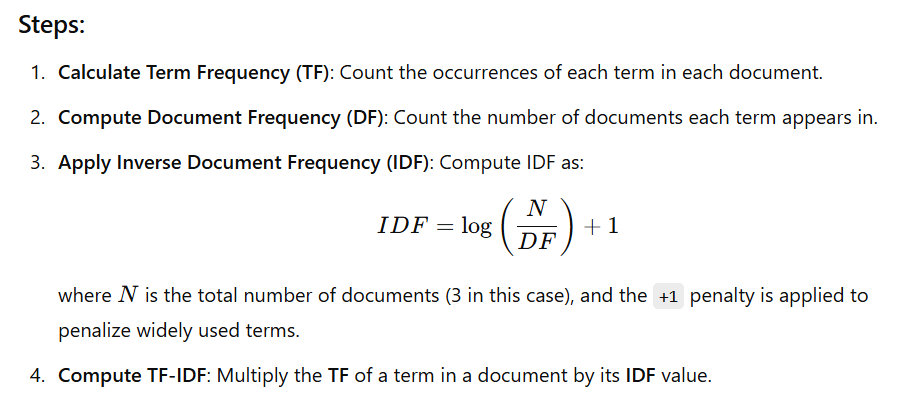

In [ ]:

# Number of documents
N = len(anx_period_dict)

# Step 1: Calculate Term Frequency (TF) for each document
tf_documents = {doc: Counter(terms) for doc, terms in anx_period_dict.items()}

# Step 2: Compute Document Frequency (DF)
doc_freq = Counter()
for terms in tf_documents.values():
    for term in terms.keys():
        doc_freq[term] += 1

# Step 3: Compute Inverse Document Frequency (IDF)
inv_doc_freq = {term: math.log(N / doc_freq[term]) + 1 for term in doc_freq}

# Step 4: Compute TF-IDF for each document
tf_idf_documents = {
    doc: {term: tf * inv_doc_freq[term] for term, tf in tf_counter.items()}
    for doc, tf_counter in tf_documents.items()
}

# Convert to a DataFrame for better visualization
tf_idf_df = pd.DataFrame(tf_idf_documents).fillna(0)

In [ ]:
tf_idf_df

In [ ]:
### DEGING TF-IDF FUNCTION ###

In [ ]:
### APPLYING TFIDF FUNCTION ###

## Longitudinal Analysis of Thematic Drivers of Anxiety and Happiness
---
?mean values after filtering? ? prevalence of topic string?
nb: retain visualisation of mean across full data for reference

In [28]:
# create new df filtering to columns required for analysis
hap_anx_longitudinal_cols = ['concat_key', 'user_id', 'year', 'month_num', 'month_abbr', 'month_name', 'mnth_yr_text',
                            'hap_lvl', 'anx_lvl', 'hap_topics_cleansed', 'anx_topics_cleansed']
hap_anx_longitudinal_df = df[hap_anx_longitudinal_cols].copy()
hap_anx_longitudinal_df['date'] = pd.to_datetime(df['mnth_yr_text'], format='%B %Y')
#create exploded hap df
hap_longitudinal_df = hap_anx_longitudinal_df.explode('hap_topics_cleansed', ignore_index=True).dropna(subset=['hap_topics_cleansed'])
hap_longitudinal_df.drop(['anx_topics_cleansed', 'anx_lvl'], axis=1, inplace=True)
#create exploded anx df
anx_longitudinal_df = hap_anx_longitudinal_df.explode('anx_topics_cleansed', ignore_index=True).dropna(subset=['anx_topics_cleansed'])
anx_longitudinal_df.drop(['hap_topics_cleansed', 'hap_lvl'], axis=1, inplace=True)

Cleansed topic data were categorised into themes via a combination of manual review and categorisation and few-shot learnbing using GPT4o mini.

In [ ]:
#del anx_themes, hap_themes, hap_anx_longitudinal_df, hap_longitudinal_df, anx_longitudinal_df

In [29]:
themes_path = 'E:/twitter_analysis_data/categorical_data_review/hap_anx_top_groupby_counts/labeled terms/final_theme_dfs/'
# load in term/theme datasets (managingh formating issues)
anx_themes = pd.read_csv(themes_path + 'anx_themes.csv', encoding='ISO-8859-1')
anx_themes = anx_themes.rename(columns={'term': 'anx_topics_cleansed'})
hap_themes = pd.read_csv(themes_path + 'hap_themes.csv')
hap_themes = hap_themes.rename(columns={'term': 'hap_topics_cleansed'})
#---
# left join themes into longitudinal datasets
anx_longitudinal_df = anx_longitudinal_df.merge(anx_themes, on='anx_topics_cleansed', how='left')
hap_longitudinal_df = hap_longitudinal_df.merge(hap_themes, on='hap_topics_cleansed', how='left')
#---
# drop rows with no themes
anx_longitudinal_df = anx_longitudinal_df.dropna(subset=['theme'])
hap_longitudinal_df = hap_longitudinal_df.dropna(subset=['theme'])
# ---
anx_longitudinal_df.loc[:, 'theme'] = [s.title() for s in anx_longitudinal_df['theme']]
anx_longitudinal_df.loc[:, 'theme'] = [s.replace('And','and') for s in anx_longitudinal_df['theme']]
hap_longitudinal_df.loc[:, 'theme'] = [s.title() for s in hap_longitudinal_df['theme']]
hap_longitudinal_df.loc[:, 'theme'] = [s.replace('And','and') for s in hap_longitudinal_df['theme']]
anx_longitudinal_df.loc[:, 'theme'] = anx_longitudinal_df['theme'].str.strip()
hap_longitudinal_df.loc[:, 'theme'] = hap_longitudinal_df['theme'].str.strip()
anx_longitudinal_df.loc[:, 'theme'] = [s.replace('Finances and Employment','Personal Finances and Employment') for s in anx_longitudinal_df['theme']]

In [30]:
### MERGE HAPPINESS - WEATHER AND SEASONAL WITH CELEBRATION ---
hap_longitudinal_df.loc[:, 'theme'] = [s.replace('Celebration','Celebration and Seasonal') for s in hap_longitudinal_df['theme']]
hap_longitudinal_df.loc[:, 'theme'] = [s.replace('Weather and Seasonal','Celebration and Seasonal') for s in hap_longitudinal_df['theme']]

In [31]:
hap_longitudinal_df['theme'].unique()

array(['Social and Community', 'Celebration and Seasonal', 'Business',
       'Personal Finances and Employment', 'Other', 'Food and Drink',
       'Environment', 'Education and Research', 'Digital and Data',
       'Personal', 'Family and Friends', 'Art and Culture',
       'Public Services', 'Housing', 'Work Life',
       'Sport and Entertainment', 'Events', 'Politics', 'Health',
       'Travel and Transport', 'Crime and Safety', 'Geopolitics',
       'Covid Pandemic'], dtype=object)

In [32]:
hap_longitudinal_df['theme'].unique()

array(['Social and Community', 'Celebration and Seasonal', 'Business',
       'Personal Finances and Employment', 'Other', 'Food and Drink',
       'Environment', 'Education and Research', 'Digital and Data',
       'Personal', 'Family and Friends', 'Art and Culture',
       'Public Services', 'Housing', 'Work Life',
       'Sport and Entertainment', 'Events', 'Politics', 'Health',
       'Travel and Transport', 'Crime and Safety', 'Geopolitics',
       'Covid Pandemic'], dtype=object)

In [33]:
anx_longitudinal_df

,concat_key,user_id,year,month_num,month_abbr,month_name,mnth_yr_text,anx_lvl,anx_topics_cleansed,date,theme
0,2018|10|1001552611,1001552611,2018,10,Oct,October,October 2018,3,job opportunities,2018-10-01,Personal Finances and Employment
1,2018|10|1001552611,1001552611,2018,10,Oct,October,October 2018,3,competition in creative industries,2018-10-01,Business
2,2018|10|1001850858823454720,1001850858823454720,2018,10,Oct,October,October 2018,3,times constraints,2018-10-01,Other
3,2018|10|1001850858823454720,1001850858823454720,2018,10,Oct,October,October 2018,3,preparation,2018-10-01,Other
4,2018|10|1004696505700233216,1004696505700233216,2018,10,Oct,October,October 2018,3,feelings of safety,2018-10-01,Safety and Crime
...,...,...,...,...,...,...,...,...,...,...,...
117988,2023|3|994518211377889280,994518211377889280,2023,3,Mar,March,March 2023,7,social,2023-03-01,Social and Community
117989,2023|3|994518211377889280,994518211377889280,2023,3,Mar,March,March 2023,7,politics climate,2023-03-01,Politics
117990,2023|3|994518211377889280,994518211377889280,2023,3,Mar,March,March 2023,7,community safety,2023-03-01,Safety and Crime
117991,2023|3|995837608684113920,995837608684113920,2023,3,Mar,March,March 2023,3,war,2023-03-01,Geopolitics


In [34]:
## checking

In [35]:
print("anx_long_df shape: " + str(anx_longitudinal_df.shape))
anx_longitudinal_df.sample(3)

anx_long_df shape: (117991, 11)


,concat_key,user_id,year,month_num,month_abbr,month_name,mnth_yr_text,anx_lvl,anx_topics_cleansed,date,theme
15920,2018|5|4062078915,4062078915,2018,5,May,May,May 2018,3,interview preparation,2018-05-01,Work Life
26135,2019|10|388903679,388903679,2019,10,Oct,October,October 2019,5,social justice,2019-10-01,Politics
95610,2022|10|19076552,19076552,2022,10,Oct,October,October 2022,3,complexity of wine,2022-10-01,Other


In [36]:
print("anx_long_df shape: " + str(hap_longitudinal_df.shape))
hap_longitudinal_df.sample(3)

anx_long_df shape: (207183, 11)


,concat_key,user_id,year,month_num,month_abbr,month_name,mnth_yr_text,hap_lvl,hap_topics_cleansed,date,theme
80036,2019|6|619839401,619839401,2019,6,Jun,June,June 2019,7,psg,2019-06-01,Sport and Entertainment
128349,2020|9|1250312535338676230,1250312535338676224,2020,9,Sep,September,September 2020,8,humor,2020-09-01,Personal
156121,2021|6|1931113416,1931113416,2021,6,Jun,June,June 2021,8,personal achievements,2021-06-01,Personal


Thematic Analysis

In [37]:
### GROUP BY COUNTS
# hap topic groupby counts
hap_theme_groupby_counts = hap_longitudinal_df.groupby('theme')['theme'].count()
hap_theme_groupby_counts = pd.DataFrame(hap_theme_groupby_counts)
hap_theme_groupby_counts = hap_theme_groupby_counts.rename(columns={'theme':'count'})
hap_theme_groupby_counts = hap_theme_groupby_counts.sort_values(by='count', ascending=False)
hap_theme_groupby_counts = hap_theme_groupby_counts.reset_index()
# hap topic groupby counts
anx_theme_groupby_counts = anx_longitudinal_df.groupby('theme')['theme'].count()
anx_theme_groupby_counts = pd.DataFrame(anx_theme_groupby_counts)
anx_theme_groupby_counts = anx_theme_groupby_counts.rename(columns={'theme':'count'})
anx_theme_groupby_counts = anx_theme_groupby_counts.sort_values(by='count', ascending=False)
anx_theme_groupby_counts = anx_theme_groupby_counts.reset_index()

In [38]:
anx_theme_groupby_counts

,theme,count
0,Other,18821
1,Social and Community,16023
2,Personal Finances and Employment,12597
3,Politics,10905
4,Health and Wellbeing,7684
5,Events,7224
6,Safety and Crime,6713
7,Work Life,6158
8,Public Services,5264
9,Covid Pandemic,4962


In [39]:
anx_theme_groupby_counts

,theme,count
0,Other,18821
1,Social and Community,16023
2,Personal Finances and Employment,12597
3,Politics,10905
4,Health and Wellbeing,7684
5,Events,7224
6,Safety and Crime,6713
7,Work Life,6158
8,Public Services,5264
9,Covid Pandemic,4962


In [40]:
hap_theme_groupby_counts

,theme,count
0,Social and Community,61914
1,Personal,22444
2,Sport and Entertainment,16466
3,Celebration and Seasonal,13133
4,Art and Culture,13002
5,Other,11295
6,Family and Friends,10981
7,Education and Research,7565
8,Food and Drink,7519
9,Environment,6246


In [41]:
## save 
theme_analysis_path = 'E:/twitter_analysis_data/categorical_data_review/theme_level_analysis/'
anx_longitudinal_df.to_csv(theme_analysis_path + 'anx_longitudinal_df.csv', index=False)
hap_longitudinal_df.to_csv(theme_analysis_path + 'hap_longitudinal_df.csv', index=False)

In [ ]:
###### ANXIETY LINE VIZ #######

In [42]:
## CREATE PIVOT OF % MEASURE (% of users in month with topic under theme identified)
anx_df = anx_longitudinal_df
# Convert 'date' to datetime format
anx_df['date'] = pd.to_datetime(anx_df['date'])
# Extract year-month for grouping
anx_df['year_month'] = anx_df['date'].dt.to_period('M')
# Group by theme and year-month, count distinct 'concat_key' values
anx_theme_month_counts = anx_df.groupby(["theme", "year_month"])["concat_key"].nunique().reset_index()
# Get the total distinct 'concat_key' count per month
anx_total_month_counts = anx_df.groupby("year_month")["concat_key"].nunique().reset_index()
anx_total_month_counts = anx_total_month_counts.rename(columns={"concat_key": "total_count"})
# Merge the counts
anx_theme_month_counts = anx_theme_month_counts.merge(anx_total_month_counts, on="year_month")
# Calculate percentage
anx_theme_month_counts["percentage"] = (anx_theme_month_counts["concat_key"] / anx_theme_month_counts["total_count"]) * 100
# Pivot the table with columns in chronological order
anx_pivot_table = anx_theme_month_counts.pivot(index="theme", columns="year_month", values="percentage").fillna(0)
anx_pivot_table = anx_pivot_table.round(2)
anx_pivot_table = anx_pivot_table.sort_index(axis=1)  # Ensure chronological order
anx_pivot_table.index = [s.title() for s in anx_pivot_table.index]
anx_pivot_table.index = [s.replace("And","and") for s in anx_pivot_table.index]
anx_pivot_table = anx_pivot_table.round(2)
save_path = 'E:/twitter_analysis_data/viz/theme_analysis/'
anx_pivot_table.to_csv(save_path + 'anx_pivot_table.csv', index=True)
print("% of active users with anxiety driver theme identified per month:")
anx_pivot_table

% of active users with anxiety driver theme identified per month:


year_month,2018-01,2018-02,2018-03,2018-04,2018-05,2018-06,2018-07,2018-08,2018-09,2018-10,...,2022-06,2022-07,2022-08,2022-09,2022-10,2022-11,2022-12,2023-01,2023-02,2023-03
Business,7.87,5.40,6.43,5.26,4.84,5.64,5.54,7.35,6.49,6.29,...,4.49,4.97,5.72,4.29,4.18,4.84,5.65,5.23,3.75,3.91
Covid Pandemic,0.09,0.09,0.00,0.20,0.10,0.00,0.00,0.10,0.00,0.00,...,2.05,2.02,0.70,0.27,0.54,0.67,0.58,0.85,0.30,0.58
Digital and Data,5.95,7.01,6.61,7.14,6.96,6.12,6.80,5.72,7.36,5.21,...,6.68,6.05,4.46,6.17,4.86,8.47,6.67,7.78,7.20,7.83
Education and Research,4.57,4.45,3.21,4.37,3.87,3.50,2.82,3.88,3.87,3.54,...,3.34,2.82,3.49,2.55,3.10,2.96,3.48,4.81,3.45,3.19
Environment,3.75,4.36,4.32,3.87,3.68,3.69,4.76,3.88,4.07,4.33,...,2.95,4.17,4.18,4.16,4.72,5.24,3.77,4.10,2.55,4.64
Events,12.72,12.12,14.97,13.39,14.12,15.74,12.93,11.75,15.88,13.77,...,13.35,10.08,10.18,12.60,11.34,11.29,9.57,8.63,11.54,11.01
Family and Friends,1.74,2.46,1.93,2.28,2.13,1.75,1.55,2.15,2.23,1.38,...,1.28,0.94,1.67,4.16,2.56,2.82,2.32,3.11,1.35,2.46
Geopolitics,0.73,0.95,0.92,0.99,0.48,0.58,0.68,0.82,0.29,0.69,...,1.54,0.94,1.26,1.34,0.94,1.61,0.58,0.85,1.20,1.30
Health and Wellbeing,11.16,10.13,10.56,10.12,10.06,9.82,9.52,9.60,10.75,12.00,...,11.04,10.89,9.62,8.58,10.66,11.16,12.32,10.89,9.75,9.28
Housing,3.57,3.79,3.12,2.78,3.58,3.21,2.24,3.17,2.52,2.56,...,3.85,1.75,2.23,2.28,2.70,2.28,2.32,3.11,3.15,3.62


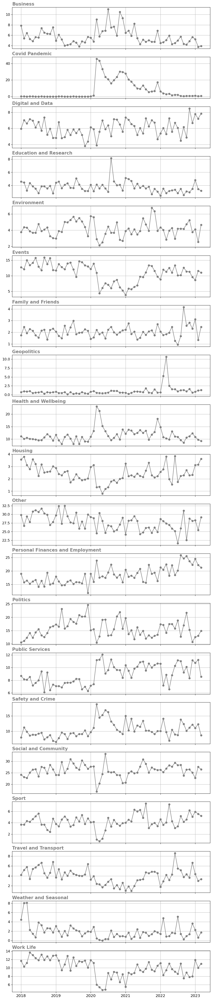

In [43]:
# Plot each theme as a separate line chart stacked vertically
themes = anx_pivot_table.index
#themes = [s.title() for s in themes]
fig, axes = plt.subplots(len(themes), 1, figsize=(12, 3 * len(themes)), sharex=True)
for ax, theme in zip(axes, themes):
    ax.plot(anx_pivot_table.columns.astype(str), anx_pivot_table.loc[theme], marker='o', linestyle='-', color='grey', markerfacecolor='grey', markeredgecolor='grey')
    ax.set_title(theme, fontsize=15, loc='left', fontweight='bold', color='grey')  # Title aligned to the left
    ax.grid(True)
    ax.set_ylabel("")  # Remove the "Percentage" y-axis label
    ax.tick_params(axis='y', labelsize=12)
# Modify x-axis ticks to display only year values on the last chart
last_ax = axes[-1]
last_ax.set_xticks(range(0, len(anx_pivot_table.columns), 12))  # Show only yearly intervals
last_ax.set_xticklabels([str(col)[:4] for col in anx_pivot_table.columns[::12]], fontsize=13)  # Extract year only
#save figure
save_path = "E:/twitter_analysis_data/viz/theme_analysis/anx_themes.png"
plt.savefig(save_path, dpi=1200,pad_inches=0.1,bbox_inches='tight')
#plt.tight_layout()
plt.show()

In [ ]:
##### HAPPINESS LINE VIZ #####

In [44]:
## CREATE PIVOT OF % MEASURE (% of users in month with topic under theme identified)
hap_df = hap_longitudinal_df
# Convert 'date' to datetime format
hap_df['date'] = pd.to_datetime(hap_df['date'])
# Extract year-month for grouping
hap_df['year_month'] = hap_df['date'].dt.to_period('M')
# Group by theme and year-month, count distinct 'concat_key' values
hap_theme_month_counts = hap_df.groupby(["theme", "year_month"])["concat_key"].nunique().reset_index()
# Get the total distinct 'concat_key' count per month
hap_total_month_counts = hap_df.groupby("year_month")["concat_key"].nunique().reset_index()
hap_total_month_counts = hap_total_month_counts.rename(columns={"concat_key": "total_count"})
# Merge the counts
hap_theme_month_counts = hap_theme_month_counts.merge(hap_total_month_counts, on="year_month")
# Calculate percentage
hap_theme_month_counts["percentage"] = (hap_theme_month_counts["concat_key"] / hap_theme_month_counts["total_count"]) * 100
# Pivot the table with columns in chronological order
hap_pivot_table = hap_theme_month_counts.pivot(index="theme", columns="year_month", values="percentage").fillna(0)
hap_pivot_table = hap_pivot_table.round(2)
hap_pivot_table = hap_pivot_table.sort_index(axis=1)  # Ensure chronological order
hap_pivot_table.index = [s.title() for s in hap_pivot_table.index]
hap_pivot_table.index = [s.replace("And","and") for s in hap_pivot_table.index]
hap_pivot_table = hap_pivot_table.round(2)
save_path = 'E:/twitter_analysis_data/viz/theme_analysis/'
hap_pivot_table.to_csv(save_path + 'hap_pivot_table.csv', index=True)
print("% of active users with happiness driver theme identified per month:")
hap_pivot_table

% of active users with happiness driver theme identified per month:


year_month,2018-01,2018-02,2018-03,2018-04,2018-05,2018-06,2018-07,2018-08,2018-09,2018-10,...,2022-06,2022-07,2022-08,2022-09,2022-10,2022-11,2022-12,2023-01,2023-02,2023-03
Art and Culture,16.59,17.96,16.01,16.46,18.67,15.54,16.35,17.29,16.63,16.82,...,14.88,12.92,13.70,13.94,15.95,14.67,12.45,18.04,17.56,16.21
Business,7.81,6.72,6.66,5.38,5.26,6.38,6.56,6.34,6.58,5.88,...,3.58,4.94,4.45,4.61,3.12,5.87,5.37,4.60,4.96,4.24
Celebration and Seasonal,16.35,17.39,20.29,14.59,18.09,16.03,18.76,14.94,13.83,18.81,...,19.46,17.08,14.05,13.48,16.76,17.02,41.03,16.46,12.98,14.84
Covid Pandemic,0.00,0.08,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.11,0.00,0.00,0.12,0.00,0.12,0.00,0.00,0.00
Crime and Safety,0.56,0.40,1.03,0.65,0.90,0.74,0.75,0.61,0.58,0.75,...,0.67,0.45,0.59,0.12,0.46,0.94,0.73,0.97,1.02,0.75
Digital and Data,4.31,4.69,4.91,5.46,4.52,4.25,3.40,3.65,3.95,4.64,...,3.58,4.16,3.98,4.49,4.05,5.99,3.91,5.93,5.09,5.86
Education and Research,9.25,9.47,9.90,8.80,9.05,10.63,9.29,9.30,10.45,10.60,...,9.17,9.66,9.95,10.25,11.33,9.15,7.33,9.44,10.56,10.85
Environment,7.97,8.41,8.00,8.88,8.39,8.67,9.38,7.47,6.91,8.37,...,9.62,8.43,10.77,7.49,10.06,7.28,7.81,7.87,8.40,9.10
Events,8.05,9.79,8.80,8.88,9.70,9.98,9.46,7.82,10.37,9.69,...,6.26,6.40,4.68,5.65,4.74,5.99,3.30,5.81,5.47,6.86
Family and Friends,13.24,14.32,14.34,13.77,12.91,13.00,15.27,16.59,14.73,14.25,...,14.65,15.73,14.52,13.25,13.53,13.50,15.51,14.77,15.90,16.71


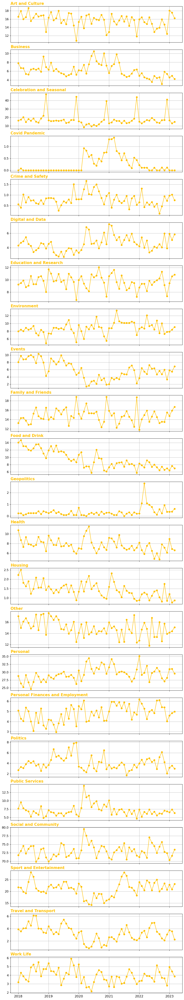

In [45]:
# Plot each theme as a separate line chart stacked vertically
themes = hap_pivot_table.index
fig, axes = plt.subplots(len(themes), 1, figsize=(12, 3 * len(themes)), sharex=True)
for ax, theme in zip(axes, themes):
    ax.plot(hap_pivot_table.columns.astype(str), hap_pivot_table.loc[theme], marker='o', linestyle='-', color='#FFC000', markerfacecolor='#FFC000', markeredgecolor='#FFC000')
    ax.set_title(theme, fontsize=15, loc='left', fontweight='bold', color='#FFC000')  # Title aligned to the left
    ax.grid(True)
    ax.set_ylabel("")  # Remove the "Percentage" y-axis label
    ax.tick_params(axis='y', labelsize=12)
# Modify x-axis ticks to display only year values on the last chart
last_ax = axes[-1]
last_ax.set_xticks(range(0, len(hap_pivot_table.columns), 12))  # Show only yearly intervals
last_ax.set_xticklabels([str(col)[:4] for col in hap_pivot_table.columns[::12]], fontsize=13)  # Extract year only
#save figure
save_path = "E:/twitter_analysis_data/viz/theme_analysis/hap_themes.png"
plt.savefig(save_path, dpi=1200,pad_inches=0.1,bbox_inches='tight')
#plt.tight_layout()
plt.show()

Exporing detail of themes that show particular temporal trend with reference to releveant events

In [ ]:
### GENERATE DATASET FOR STATISTICAL SIGNIFICANCE TESTING
# a dataset that can be used to carry out the analysis of statistical significance of any trends identified with analysis
# of longitudinal trend in prevelance of a particular them 

In [ ]:
### ANX STAT SIG DATASET

In [46]:
anx_longitudinal_df[anx_longitudinal_df['user_id'] == '972246044']

,concat_key,user_id,year,month_num,month_abbr,month_name,mnth_yr_text,anx_lvl,anx_topics_cleansed,date,theme,year_month
2007,2018|10|972246044,972246044,2018,10,Oct,October,October 2018,7,health,2018-10-01,Health and Wellbeing,2018-10
2008,2018|10|972246044,972246044,2018,10,Oct,October,October 2018,7,social anxiety,2018-10-01,Social and Community,2018-10
2009,2018|10|972246044,972246044,2018,10,Oct,October,October 2018,7,fear of judgment,2018-10-01,Other,2018-10
4090,2018|11|972246044,972246044,2018,11,Nov,November,November 2018,6,mental health,2018-11-01,Health and Wellbeing,2018-11
4091,2018|11|972246044,972246044,2018,11,Nov,November,November 2018,6,feelings of loneliness,2018-11-01,Social and Community,2018-11
...,...,...,...,...,...,...,...,...,...,...,...,...
116561,2023|2|972246044,972246044,2023,2,Feb,February,February 2023,6,mental health challenge,2023-02-01,Health and Wellbeing,2023-02
116562,2023|2|972246044,972246044,2023,2,Feb,February,February 2023,6,fear of social situations,2023-02-01,Social and Community,2023-02
117966,2023|3|972246044,972246044,2023,3,Mar,March,March 2023,7,social anxiety,2023-03-01,Social and Community,2023-03
117967,2023|3|972246044,972246044,2023,3,Mar,March,March 2023,7,personal space,2023-03-01,Other,2023-03


### Statistical Modeling Function
---

In [49]:
## create anxiety dataset for statistical mdoeling
anx_stat_sig_df = anx_longitudinal_df[['user_id', 'date', 'theme']]
# drop dupes
anx_stat_sig_df = anx_stat_sig_df.drop_duplicates(subset=['user_id', 'date', 'theme']).copy()
#create a column with value 'Y' for marking presence of theme
anx_stat_sig_df['value'] = 'Y'
#pivot the table
anx_stat_sig_df = anx_stat_sig_df.pivot_table(index=['user_id', 'date'], columns='theme', values='value', aggfunc='first', fill_value='N').reset_index()
anx_stat_sig_df.to_csv('E:/twitter_analysis_data/stat_sig_testing/anx_stat_sig.csv', index=False)

In [327]:
## create happiness dataset for statistical mdoeling
hap_stat_sig_df = hap_longitudinal_df[['user_id', 'date', 'theme']]
# drop dupes
hap_stat_sig_df = hap_stat_sig_df.drop_duplicates(subset=['user_id', 'date', 'theme']).copy()
#create a column with value 'Y' for marking presence of theme
hap_stat_sig_df['value'] = 'Y'
#pivot the table
hap_stat_sig_df = hap_stat_sig_df.pivot_table(index=['user_id', 'date'], columns='theme', values='value', aggfunc='first', fill_value='N').reset_index()
hap_stat_sig_df.to_csv('E:/twitter_analysis_data/stat_sig_testing/hap_stat_sig.csv', index=False)

In [381]:
def stat_analysis_for_theme(
    anx_or_hap,
    input_dataframe,
    theme,
    periods,
    logit_text_positions,
    gee_text_positions,
    line_color_data="grey",
    r_p_pos = (0.98, 0.95)
):
    print("\n\n\033[1mSTATISTICAL ANALYSIS FOR THEME:")
    
     # Convert date and map theme to binary
    df_local = input_dataframe.copy()
    df_local['date'] = pd.to_datetime(df_local['date'])
    df_local['theme_binary'] = df_local[theme].map({'Y': 1, 'N': 0})

    # Monthly prevalence
    monthly_series = df_local.groupby(df_local['date'].dt.to_period("M"))['theme_binary'].mean().reset_index()
    monthly_series['date'] = monthly_series['date'].dt.to_timestamp()

    
    # Permutation test
    print("\n\033[1mTESTING CUBIC SPLINE INTERPOLATION MODEL VERSUS NULL HYPOTHESIS:\033[0m")
    rss_spline = np.sum((y_smooth - np.mean(y_smooth)) ** 2)
    n_permutations = 10000
    rss_random = []
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        for _ in range(n_permutations):
            y_shuffled = np.random.permutation(y)
            try:
                spline_shuffled = UnivariateSpline(x, y_shuffled, k=3, s=len(x) * 2.0)
                y_shuffled_smooth = spline_shuffled(x_smooth)
                rss = np.sum((y_shuffled_smooth - np.mean(y_shuffled_smooth)) ** 2)
                rss_random.append(rss)
            except:
                continue
    p_value = np.mean(np.array(rss_random) > rss_spline)
    print(f"Permutation p-value: {p_value:.8f}")
    print(f"R² = {r_squared:.4f}")

    # Plot spline + raw data
    x_smooth_dates = pd.to_datetime(x_smooth, unit='s')
    plt.figure(figsize=(12, 6))
    plt.plot(monthly_series['date'], y, marker='o', linestyle='-', color=line_color_data, alpha=0.7, label='Observed Data')
    plt.plot(x_smooth_dates, y_smooth, linestyle='--', linewidth=2.5, color='teal', alpha=0.9, label='Cubic Spline Fit')
    plt.text(r_p_pos[0], r_p_pos[1], f"R² = {r_squared:.2f}", color='teal', fontsize=21, fontweight='bold', ha='right', va='top', transform=plt.gca().transAxes)
    plt.text(r_p_pos[0], r_p_pos[1] - 0.08, f"Permutation test\np = {p_value:.3g}", color='teal', fontsize=18, ha='right', va='top', transform=plt.gca().transAxes)
    plt.title(f"Cubic Spline Model vs Raw Observations: {theme} ({anx_or_hap})", loc='left', fontsize=16)
    plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}%'))
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    cubic_save_path = 'E:/twitter_analysis_data/viz/theme_analysis/cubic_spline_fitting/'
    plt.savefig(cubic_save_path + "cubic fit " + anx_or_hap.lower() + " " + theme + '.png', bbox_inches='tight', pad_inches=0.15)
    plt.show()
    plt.close("all")
    
    # Change point detection
    print("\n\033[1mCHANGE POINT DETECTION:\033[0m")
    algo = rpt.Pelt(model="rbf").fit(y_smooth)
    change_points = algo.predict(pen=20)
    change_dates = x_smooth_dates[change_points[:-1]]
    plt.figure(figsize=(12, 6))
    plt.plot(x_smooth_dates, y_smooth, label="Cubic spline model", linewidth=2, color=line_color_data)
    
    if len(change_dates) > 0:
        for cp in change_dates:
            plt.axvline(cp, color='red', linestyle='--', alpha=0.7)
        # Only label the first one
        plt.axvline(change_dates[0], color='red', linestyle='--', alpha=0.7, label='Change Point')
    else:
        print("No change points detected.")
    
    plt.title(f"Change Point Detection: {theme} ({anx_or_hap})", loc='left', fontsize=16)
    plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}%'))
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    change_point_save_path = 'E:/twitter_analysis_data/viz/theme_analysis/change_point_identification/'
    plt.savefig(change_point_save_path + "change point " + anx_or_hap.lower() + " " + theme + '.png', bbox_inches='tight', pad_inches=0.15)
    plt.show()

    print("\n \033[1mDEFINED PERIODS\033[0m")
    for p in periods:
        print(p)
    
    # logistic regression and GEE modelling of periods, with T-test and effect size
    print("\n\n \033[1mLOGISTIC REGRESSION, T-TESTING AND GEE MODELLING\033[0m \n")
    input_dataframe = input_dataframe.copy()
    input_dataframe["month"] = pd.to_datetime(input_dataframe["date"]).dt.to_period("M").dt.to_timestamp()
    input_dataframe["theme_binary"] = input_dataframe[theme].map({"Y": 1, "N": 0})
    input_dataframe["period"] = pd.Series([None] * len(input_dataframe), dtype="object")

    for label, start, end in periods:
        start_date = pd.to_datetime(start + "-01")
        end_date = pd.to_datetime(end + "-01")
        input_dataframe.loc[
            (input_dataframe["date"] >= start_date) & (input_dataframe["date"] <= end_date),
            "period"
        ] = label

    input_dataframe = input_dataframe.dropna(subset=["period"])
    input_dataframe["month_index"] = input_dataframe.groupby("period")["month"].transform(lambda x: (x - x.min()).dt.days // 30)
    raw_monthly = input_dataframe.groupby("month")["theme_binary"].mean().reset_index(name="observed_rate")
    plt.figure(figsize=(12, 6))
    plt.plot(raw_monthly["month"], raw_monthly["observed_rate"], marker='o', linestyle='-', color=line_color_data, alpha=0.5)
    model_summaries = []
    binary_data_by_period = {}

    for period in input_dataframe["period"].unique():
        period_df = input_dataframe[input_dataframe["period"] == period].copy()

        model = logit("theme_binary ~ month_index", data=period_df).fit(disp=False)
        intercept = model.params["Intercept"]
        slope = model.params["month_index"]
        p_intercept = model.pvalues["Intercept"]
        p_slope = model.pvalues["month_index"]
        period_df["predicted_prob"] = model.predict(period_df)

        x_vals = np.arange(0, period_df["month_index"].max() + 1)
        x_dates = pd.date_range(start=period_df["month"].min(), periods=len(x_vals), freq="MS")
        log_odds = intercept + slope * x_vals
        probabilities = 1 / (1 + np.exp(-log_odds))
        plt.plot(x_dates, probabilities, linestyle='--', linewidth=2, color='teal')

        if period in logit_text_positions:
            label_x = x_dates[int(logit_text_positions[period][0] * len(x_dates))]
            label_y = logit_text_positions[period][1]
        else:
            middle_idx = len(x_dates) // 2
            label_x = x_dates[middle_idx]
            label_y = probabilities[middle_idx] + 0.03

        expression = f"{period}\n" + r"$p = \frac{1}{1 + e^{-(" + f"{intercept:.2f} + {slope:.2f} · t" + r")}}$"
        plt.text(label_x, label_y, expression, color='teal', fontsize=14, ha='center', va='bottom')

        empirical_mean = period_df["theme_binary"].mean()

        model_summaries.append({
            "Period": period,
            "Intercept": intercept,
            "Slope": slope,
            "p(Intercept)": p_intercept,
            "p(Slope)": p_slope,
            "Empirical Mean": empirical_mean,
        })

        binary_data_by_period[period] = period_df["theme_binary"]

    plt.title(f"Logistic Regression for Periods: {theme} ({anx_or_hap})", loc='left', fontsize=16, color="black", fontweight='normal')
    plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0%}'))
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    log_reg_save_path = 'E:/twitter_analysis_data/viz/theme_analysis/logistic_reg_by_period/'
    plt.savefig(log_reg_save_path + "log reg " + anx_or_hap.lower() + " " + theme + '.png', bbox_inches='tight', pad_inches=0.15)
    plt.show()

    model_summary_df = pd.DataFrame(model_summaries)
    print("\n\n \033[1mSummary of Logistic Regression Model and Means for Periods:\033[0m")
    print(model_summary_df)

    print("\n\nT-TESTING TO ASSESS VARIATION IN MEANS BETWEEN PERIODS\n")
    periods_list = list(binary_data_by_period.keys())
    pvals = pd.DataFrame(index=periods_list, columns=periods_list, dtype=float)

    for i, p1 in enumerate(periods_list):
        for j, p2 in enumerate(periods_list):
            if i == j:
                pvals.loc[p1, p2] = np.nan
            else:
                stat, pval = stats.ttest_ind(binary_data_by_period[p1], binary_data_by_period[p2], equal_var=False)
                pvals.loc[p1, p2] = pval

    #plt.figure(figsize=(6, 5))
    #cmap = sns.light_palette("teal", as_cmap=True)
    #sns.heatmap(pvals.astype(float), annot=True, fmt=".8f", cmap=cmap, cbar_kws={'label': 'p-value'})
    #plt.title(f"T-Testing: {theme} ({anx_or_hap})", loc='left', fontsize=14)
    #plt.tight_layout()
    #plt.show()

    print("\n\033[1mPairwise T-Test p-values using Welch's T-Test:\033[0m")
    print(pvals)

    print("\n \033[1m Calculation of effect size using Cohen's d:\033[0m")
    effect_sizes = []
    for i, p1 in enumerate(periods_list):
        for j, p2 in enumerate(periods_list):
            if i < j:
                mean1, mean2 = binary_data_by_period[p1].mean(), binary_data_by_period[p2].mean()
                std1, std2 = binary_data_by_period[p1].std(), binary_data_by_period[p2].std()
                n1, n2 = len(binary_data_by_period[p1]), len(binary_data_by_period[p2])
                pooled_std = np.sqrt(((n1-1)*std1**2 + (n2-1)*std2**2) / (n1+n2-2))
                d = (mean1 - mean2) / pooled_std if pooled_std > 0 else np.nan
                effect_sizes.append({"Comparison": f"{p1} vs {p2}", "Cohen's d": d})

    effect_sizes_df = pd.DataFrame(effect_sizes)
    print(effect_sizes_df)

    print("\n\nGEE MODELLING FOR EACH PERIOD\n")
    gee_results = []
    plt.figure(figsize=(12, 6))

    plt.plot(raw_monthly["month"], raw_monthly["observed_rate"], marker='o', linestyle='-', color=line_color_data, alpha=0.5)

    for period in periods_list:
        period_df = input_dataframe[input_dataframe["period"] == period].copy()

        model_gee = GEE.from_formula(
            "theme_binary ~ month_index",
            groups=period_df["user_id"],
            data=period_df,
            family=Binomial(),
            cov_struct=Exchangeable()
        ).fit()

        coef = model_gee.params['month_index']
        intercept = model_gee.params["Intercept"]
        pval = model_gee.pvalues['month_index']

        gee_results.append({"Period": period, "GEE Slope": coef, "GEE p-value": pval})

        prediction_months = pd.date_range(
            start=period_df["month"].min(), end=period_df["month"].max(), freq='MS'
        )
        month_index_pred = (prediction_months - period_df["month"].min()).days // 30

        log_odds_pred = intercept + coef * month_index_pred
        prob_pred = 1 / (1 + np.exp(-log_odds_pred))

        plt.plot(
            prediction_months,
            prob_pred,
            linestyle='--',
            linewidth=2,
            color='teal'
        )

    for period in periods_list:
        period_df = input_dataframe[input_dataframe["period"] == period]
        if not period_df.empty:
            midpoint_month = period_df["month"].min() + (period_df["month"].max() - period_df["month"].min()) / 2
            midpoint_value = period_df["theme_binary"].mean() + gee_text_positions.get(period, 0.05)
            #plt.text(midpoint_month, midpoint_value, period, color="teal", fontsize=14, ha='center', va='bottom')

    plt.title(f"GEE Model Fits for Periods: {theme} ({anx_or_hap})", loc='left', fontsize=16, color="black", fontweight='normal')
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0%}'))
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

    gee_summary_df = pd.DataFrame(gee_results)
    print("\n \033[1m Generalized Estimating Equations (GEE) Analysis:\033[0m")
    print(gee_summary_df)

    #return model_summary_df, pvals, effect_sizes_df, gee_summary_df


## Major Drivers of Anxiety
---

### Covid Pandemic (Anxiety and Happiness)
---

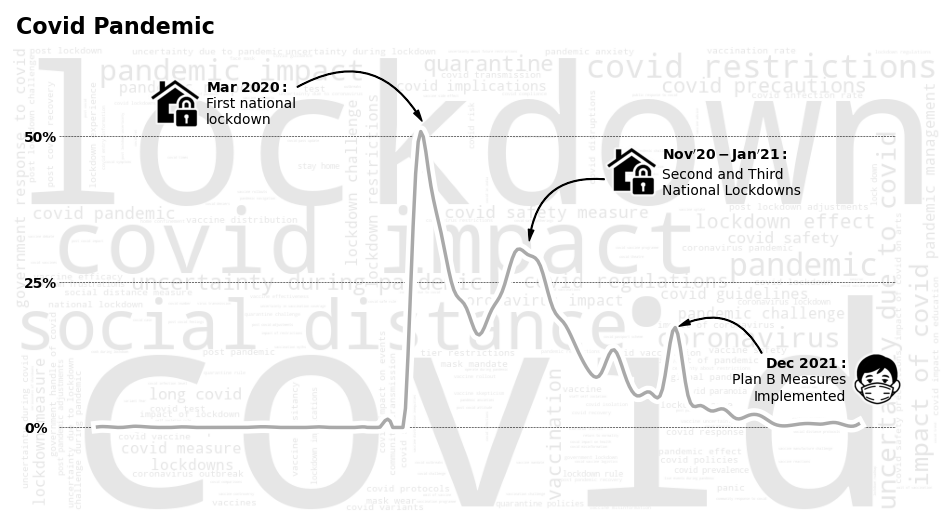



STATISTICAL ANALYSIS FOR THEME:

TESTING CUBIC SPLINE INTERPOLATION MODEL VERSUS NULL HYPOTHESIS:
Permutation p-value: 0.10060000
R² = 0.9846


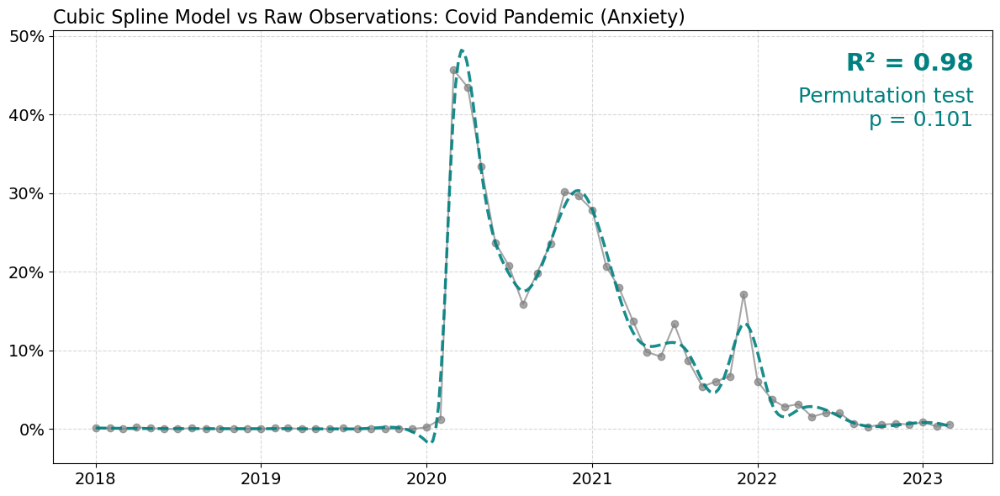


CHANGE POINT DETECTION:


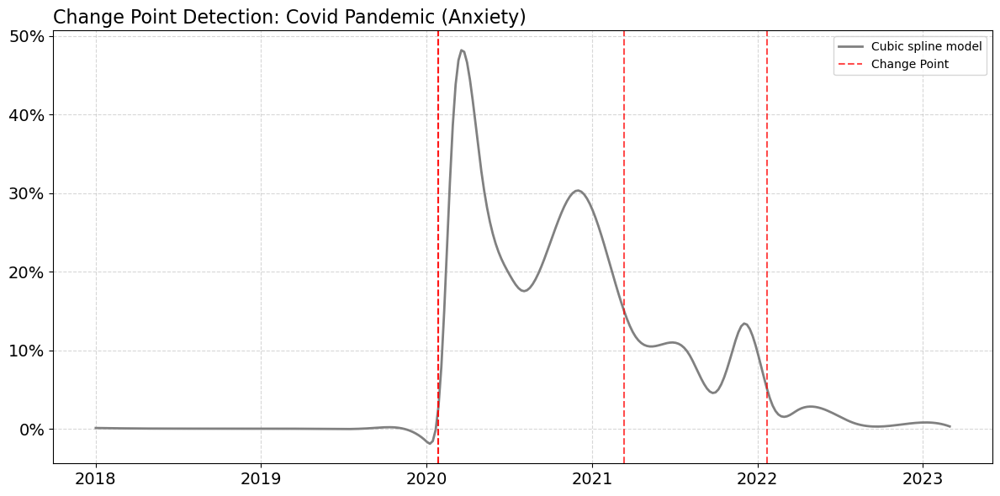


 DEFINED PERIODS
('Pre-pandemic', '1900-01', '2020-01')
('Pandemic', '2020-02', '2021-03')
('Post-pandemic', '2021-04', '2100-01')


 LOGISTIC REGRESSION, T-TESTING AND GEE MODELLING 



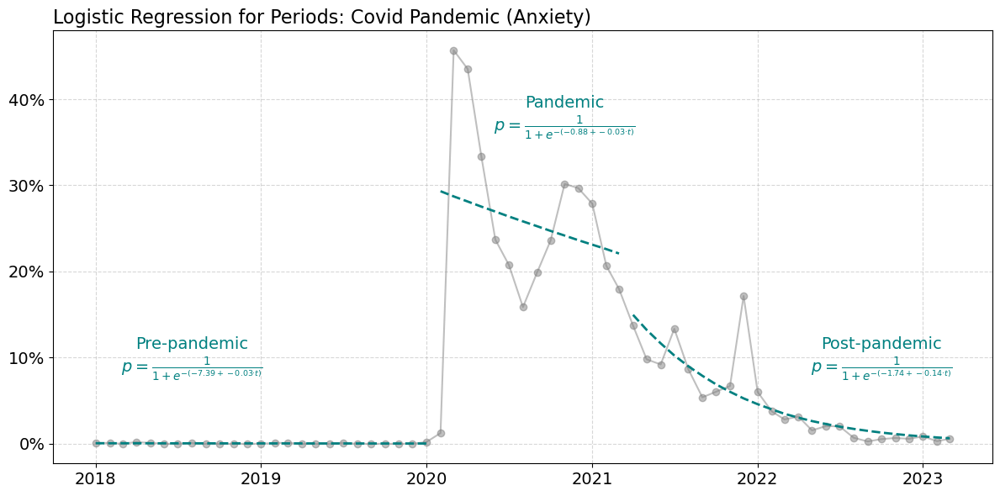



 Summary of Logistic Regression Model and Means for Periods:
          Period  Intercept     Slope   p(Intercept)       p(Slope)  \
0   Pre-pandemic  -7.391001 -0.031303   8.288414e-46   4.561376e-01   
1       Pandemic  -0.879843 -0.029283  2.504076e-143   6.314476e-10   
2  Post-pandemic  -1.737266 -0.144018  1.811552e-261  2.498542e-115   

   Empirical Mean  
0        0.000438  
1        0.257503  
2        0.051001  


T-TESTING TO ASSESS VARIATION IN MEANS BETWEEN PERIODS


Pairwise T-Test p-values using Welch's T-Test:
                Pre-pandemic  Pandemic  Post-pandemic
Pre-pandemic             NaN       0.0  3.214903e-209
Pandemic        0.000000e+00       NaN   0.000000e+00
Post-pandemic  3.214903e-209       0.0            NaN

  Calculation of effect size using Cohen's d:
                      Comparison  Cohen's d
0       Pre-pandemic vs Pandemic  -0.989066
1  Pre-pandemic vs Post-pandemic  -0.350031
2      Pandemic vs Post-pandemic   0.626235


GEE MODELLING FOR EACH PE

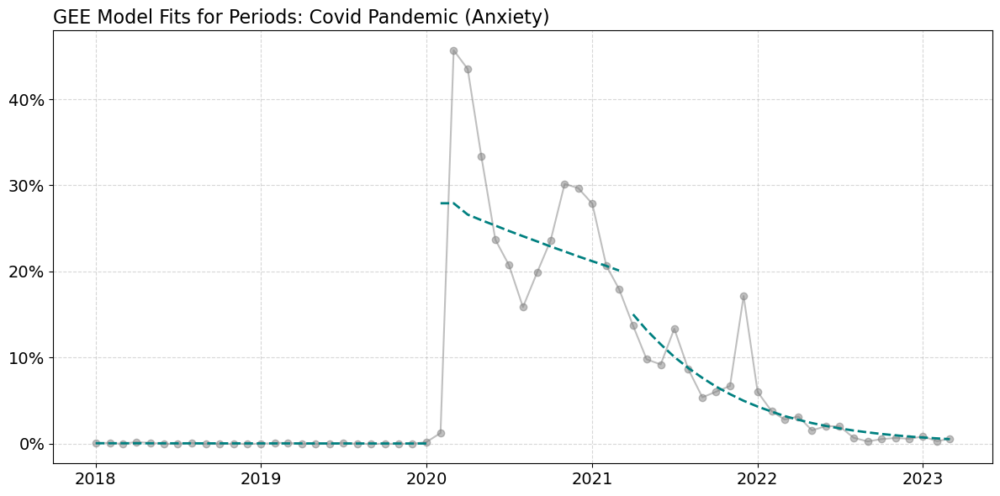


  Generalized Estimating Equations (GEE) Analysis:
          Period  GEE Slope   GEE p-value
0   Pre-pandemic  -0.031229  5.324591e-01
1       Pandemic  -0.033168  3.795551e-11
2  Post-pandemic  -0.151688  3.795681e-71


In [382]:
### CREATE WC / LINE VIZ : ANX - COIVD PANDEMIC
## covid tiemline: https://www.instituteforgovernment.org.uk/sites/default/files/2022-12/timeline-coronavirus-lockdown-december-2021.pdf

# ----------> SELECT THEME --------
theme = 'Covid Pandemic'
# ---------------------------------

anx_wc_count_dict = anx_longitudinal_df[anx_longitudinal_df['theme'] == theme]['anx_topics_cleansed'].value_counts().to_dict()

## ------ Initiate a figure
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

## ------ Define a function to control colour darkness for background wc
def adjusted_grey_scale_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    max_freq = max(anx_wc_count_dict.values())  # Get max frequency for scaling
    frequency = anx_wc_count_dict.get(word, 1)
    min_darkness = 230  # Adjust this to make the lightest words darker
    darkness = int(200 * (1 - frequency / max_freq))  # Scale from black (0) to white (255)
    darkness = max(darkness, min_darkness)  # Ensure minimum darkness level
    return f"rgb({darkness}, {darkness}, {darkness})"  # Return adjusted grayscale color

## ----- Generate the word cloud with adjusted colours
# initialise wc object
wordcloud = WordCloud(
    width=1000,
    height=500,
    background_color='white',
    contour_width=1,
    max_font_size=300,
    relative_scaling=0.2,
    margin=1,
    collocations=False,
    random_state=2,
    color_func=adjusted_grey_scale_color_func
).generate_from_frequencies(anx_wc_count_dict)
# show wordcloud backgorund
ax.imshow(wordcloud)
ax.set_axis_off()

## ----- Create time series of % measure -----
# filter to theme within pivot table
theme_series = anx_pivot_table.loc[theme]
# transpose and reset index
theme_series_trans = theme_series.reset_index()
# rename columns
theme_series_trans.columns = ['year_month', 'value']
# ensure 'year_month' is a string before conversion
theme_series_trans['year_month'] = theme_series_trans['year_month'].astype(str)
# convert 'year_month' to datetime format (assuming YYYY-MM format)
theme_series_trans['year_month'] = pd.to_datetime(theme_series_trans['year_month'], format='%Y-%m')
# ensure 'value' is numeric
theme_series_trans['value'] = pd.to_numeric(theme_series_trans['value'], errors='coerce').round(2)
# create inset axes
sub_ax = inset_axes(ax, width="90%", height="70%", loc='center', borderpad=1)

### ----- Smooth the line using interpolation ----
x = theme_series_trans['year_month'].map(lambda d: d.timestamp())  # Convert datetime to numerical timestamps
y = theme_series_trans['value']
# Create an interpolation function
x_smooth = np.linspace(x.min(), x.max(), 300)  # Generate more points for smooth curve

spline_viz = make_interp_spline(x, y, k=3)  # k=3 for cubic spline smoothing
spline = UnivariateSpline(x, y, k=3, s=len(x)* 2.0)  # s controls the amount of smoothing

y_smooth_viz = spline_viz(x_smooth)
y_smooth = spline(x_smooth)

# === R² CALCULATION ===
y_pred_at_x = spline(x)  # predict at original x
ss_total = np.sum((y - np.mean(y)) ** 2)
ss_res = np.sum((y - y_pred_at_x) ** 2)
r_squared = 1 - (ss_res / ss_total)

# Convert timestamps back to datetime for plotting
x_smooth_dates = pd.to_datetime(x_smooth, unit='s')
#fix y smooth
y_smooth_viz[y_smooth_viz < 0] = 0 
# plot the smooth line chart
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='white', linewidth=9, zorder=5)
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='darkgrey', linewidth=2.5, zorder=5)
# remove background from line chart
sub_ax.set_axis_off()


## ----- Display y-axis labels 
max_rate = 50
min_rate = 0
mid_rate = 25
sub_ax.axhline(y=max_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=min_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=mid_rate, color='black', linestyle='--', lw=0.4)
sub_ax.text(17350, max_rate - 1, f"{max_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold' )
sub_ax.text(17350, min_rate - 1, f"{min_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')
sub_ax.text(17350, mid_rate - 1, f"{mid_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')

# ----- set title
lower_bound = 1960
upper_bound = 2019
title = theme.title()
title = title.replace("And","and")

fig_text(
    0.21, 0.825,
    title, color='black',
    fontweight='bold',
    fontsize=16,
    #highlight_textprops=[{"color": 'darkred'},{"fontsize": 13,"color": 'darkgrey',"fontweight": 'normal'}],
    ha='center')

##### ICON, TEXT, ARROW 1 (retail price index peak) -------------------------------------------------------------------------------------------

## ----- Display icon image(s)
# define function to load and return image
def open_image_local(path_to_image):
    image = Image.open(path_to_image) # Open the image
    image_array = np.array(image) # Convert to a numpy array
    return image_array # Output
# initialise image object from file
ld_mar_image = open_image_local('E:/twitter_analysis_data/viz/theme_analysis/icons/anx_covid_lockdown_png.png')
# define the position and size parameters
ld_mar_image_xaxis = 0.225
ld_mar_image_yaxis = 0.68
ld_mar_image_width = 0.07
ld_mar_image_height = 0.07
ax_ld_mar_image = fig.add_axes([ld_mar_image_xaxis, ld_mar_image_yaxis, ld_mar_image_width, ld_mar_image_height])
# show icon
ax_ld_mar_image.imshow(ld_mar_image)
ax_ld_mar_image.axis('off')  # Remove axis of the image

## ----- Icon text
sub_ax.text(
    0.175, 1.04,  # X, Y in Axes coordinates
    r"$\bf{Mar\ 2020:}$" + "\nFirst national\nlockdown",
    #f"Oct 2022:\nRetail Price Index\npeaks at 11.1%.",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='left',
    va='center')

## ----- Draw arrow
def draw_arrow(tail_position, head_position, invert=True):
    kw = dict(
        arrowstyle="Simple, tail_width=0.5, head_width=4, head_length=8", color="k")
    if invert:
        connectionstyle = "arc3,rad=-.5"
    else:
        connectionstyle = "arc3,rad=.5"
    a = FancyArrowPatch(tail_position, head_position,
                        connectionstyle=connectionstyle,
                        transform=fig.transFigure,
                        **kw)
    fig.patches.append(a)
draw_arrow((0.36, 0.734), (0.467, 0.69))

##### ICON, TEXT, ARROW 2 (cost of living payment) -------------------------------------------------------------------------------------------

## ----- Display icon image(s)
# define function to load and return image
def open_image_local(path_to_image):
    image = Image.open(path_to_image) # Open the image
    image_array = np.array(image) # Convert to a numpy array
    return image_array # Output
# initialise image object from file
ld_nov_image = open_image_local('E:/twitter_analysis_data/viz/theme_analysis/icons/anx_covid_lockdown_png.png')
# define the position and size parameters
ld_nov_image_xaxis = 0.605
ld_nov_image_yaxis = 0.595
ld_nov_image_width = 0.07
ld_nov_image_height = 0.07
ax_ld_nov_image = fig.add_axes([ld_nov_image_xaxis, ld_nov_image_yaxis, ld_nov_image_width, ld_nov_image_height])
# show icon
ax_ld_nov_image.imshow(ld_nov_image)
ax_ld_nov_image.axis('off')  # Remove axis of the image

## ----- Icon text
sub_ax.text(
    0.72, 0.83,  # X, Y in Axes coordinates
    r"$\bf{Nov'20 - Jan'21:}$" + "\nSecond and Third\nNational Lockdowns",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='left',
    va='center')

## ----- Draw arrow
def draw_arrow(tail_position, head_position, invert=False):
    kw = dict(
        arrowstyle="Simple, tail_width=0.5, head_width=4, head_length=8", color="k")
    if invert:
        connectionstyle = "arc3,rad=-.5"
    else:
        connectionstyle = "arc3,rad=.5"
    a = FancyArrowPatch(tail_position, head_position,
                        connectionstyle=connectionstyle,
                        transform=fig.transFigure,
                        **kw)
    fig.patches.append(a)
draw_arrow((0.62, 0.62), (0.555, 0.54))

##### ICON, TEXT, ARROW 3 (plan b measures) -------------------------------------------------------------------------------------------

## ----- Display icon image(s)
# define function to load and return image
def open_image_local(path_to_image):
    image = Image.open(path_to_image) # Open the image
    image_array = np.array(image) # Convert to a numpy array
    return image_array # Output
# initialise image object from file
planb_dec_image = open_image_local('E:/twitter_analysis_data/viz/theme_analysis/icons/anx_covid_planb_png.png')
# define the position and size parameters
planb_dec_image_xaxis = 0.805
planb_dec_image_yaxis = 0.33
planb_dec_image_width = 0.08
planb_dec_image_height = 0.08
ax_planb_dec_image = fig.add_axes([planb_dec_image_xaxis, planb_dec_image_yaxis, planb_dec_image_width, planb_dec_image_height])
# show icon
ax_planb_dec_image.imshow(planb_dec_image)
ax_planb_dec_image.axis('off')  # Remove axis of the image

## ----- Icon text
sub_ax.text(
    0.94, 0.19,  # X, Y in Axes coordinates
    r"$\bf{Dec\ 2021:}$" + "\nPlan B Measures\nImplemented",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='right',
    va='center')

## ----- Draw arrow
def draw_arrow(tail_position, head_position, invert=False):
    kw = dict(
        arrowstyle="Simple, tail_width=0.5, head_width=4, head_length=8", color="k")
    if invert:
        connectionstyle = "arc3,rad=-.5"
    else:
        connectionstyle = "arc3,rad=.5"
    a = FancyArrowPatch(tail_position, head_position,
                        connectionstyle=connectionstyle,
                        transform=fig.transFigure,
                        **kw)
    fig.patches.append(a)
draw_arrow((0.75, 0.4), (0.678, 0.435))

# --------------------------------------------------------------------------------------------------
## ------ Save figure
save_path = 'E:/twitter_analysis_data/viz/theme_analysis/wc_line_detail/'
plt.savefig(save_path + "anx " + theme + '.png', bbox_inches='tight', pad_inches=0.15)

## ------ Show figure 
plt.show()

###################################################### ANALYSIS AND TESTING ######################################

stat_analysis_for_theme(
    anx_or_hap = "Anxiety",
    input_dataframe=anx_stat_sig_df,
    theme="Covid Pandemic",
    periods=[
        ("Pre-pandemic", "1900-01", "2020-01"),
        ("Pandemic", "2020-02", "2021-03"),
        ("Post-pandemic", "2021-04", "2100-01"),
    ],
    logit_text_positions={
        "Pre-pandemic": (0.3, 0.07),
        "Pandemic": (0.655, 0.35),
        "Post-pandemic": (0.75, 0.07)
    },
    gee_text_positions={
        "Pre-pandemic": 0.05,
        "Pandemic": 0.05,
        "Post-pandemic": 0.05
    },
    line_color_data="grey",
    r_p_pos = (0.98, 0.95)
)



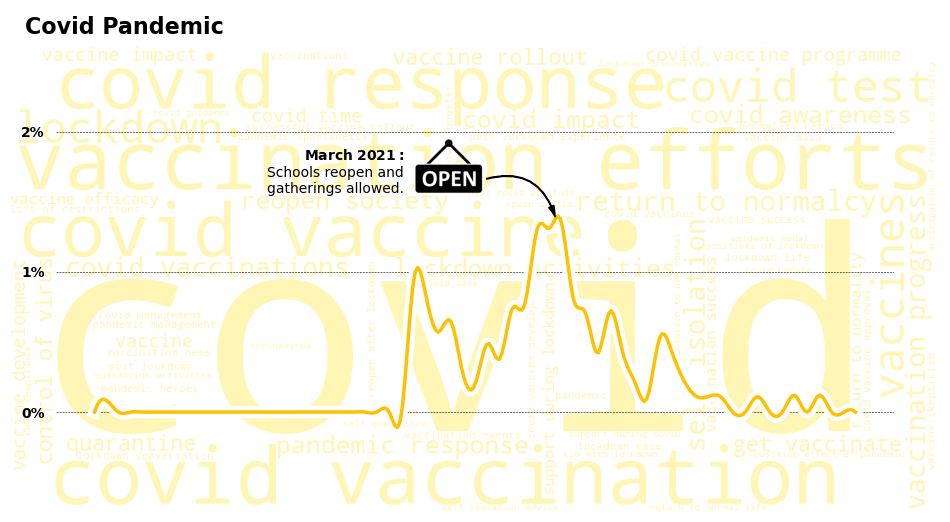



STATISTICAL ANALYSIS FOR THEME:

TESTING CUBIC SPLINE INTERPOLATION MODEL VERSUS NULL HYPOTHESIS:
Permutation p-value: 0.00000000
R² = 0.9237


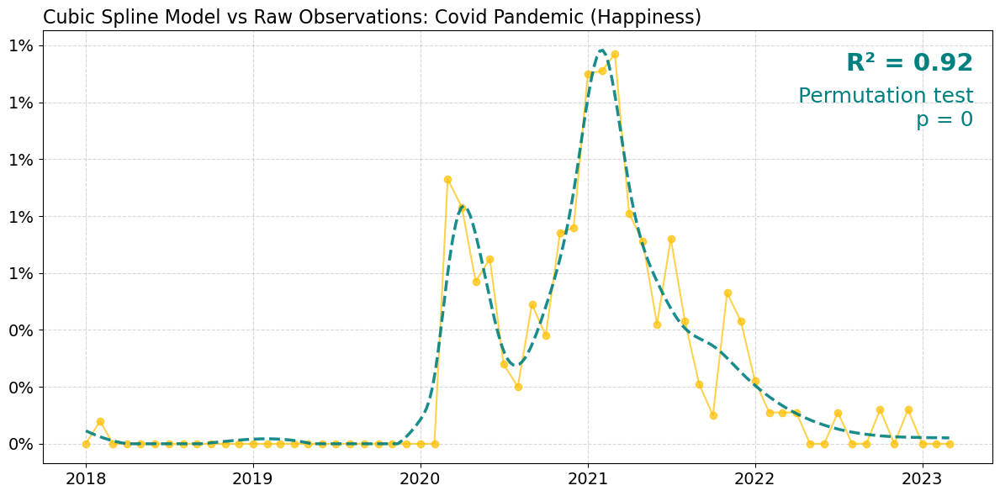


CHANGE POINT DETECTION:


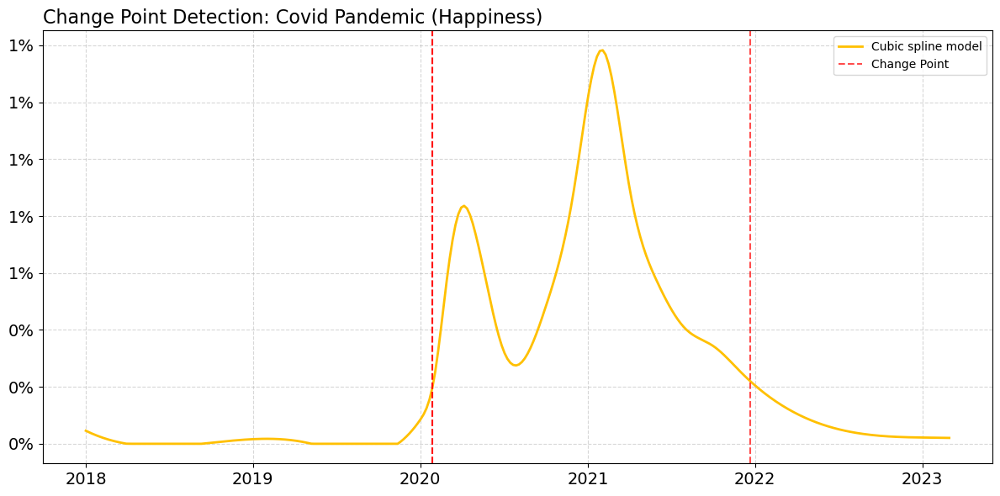


 DEFINED PERIODS
('Pre-pandemic', '1900-01', '2020-01')
('Pandemic', '2020-02', '2021-03')
('Post-pandemic', '2021-04', '2100-01')


 LOGISTIC REGRESSION, T-TESTING AND GEE MODELLING 



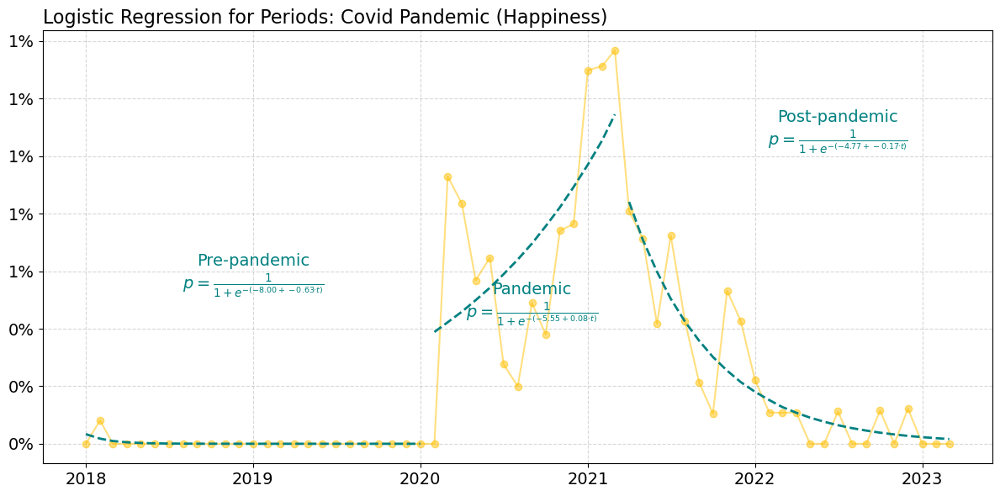



 Summary of Logistic Regression Model and Means for Periods:
          Period  Intercept     Slope   p(Intercept)      p(Slope)  \
0   Pre-pandemic  -8.002546 -0.626299   5.203436e-11  3.687535e-01   
1       Pandemic  -5.546056  0.083708  2.632242e-148  7.075971e-04   
2  Post-pandemic  -4.769809 -0.171697  1.981680e-125  5.967526e-09   

   Empirical Mean  
0        0.000034  
1        0.006954  
2        0.002309  


T-TESTING TO ASSESS VARIATION IN MEANS BETWEEN PERIODS


Pairwise T-Test p-values using Welch's T-Test:
               Pre-pandemic      Pandemic  Post-pandemic
Pre-pandemic            NaN  5.283156e-24   4.094389e-12
Pandemic       5.283156e-24           NaN   8.466193e-10
Post-pandemic  4.094389e-12  8.466193e-10            NaN

  Calculation of effect size using Cohen's d:
                      Comparison  Cohen's d
0       Pre-pandemic vs Pandemic  -0.143326
1  Pre-pandemic vs Post-pandemic  -0.072125
2      Pandemic vs Post-pandemic   0.071913


GEE MODELLING FOR

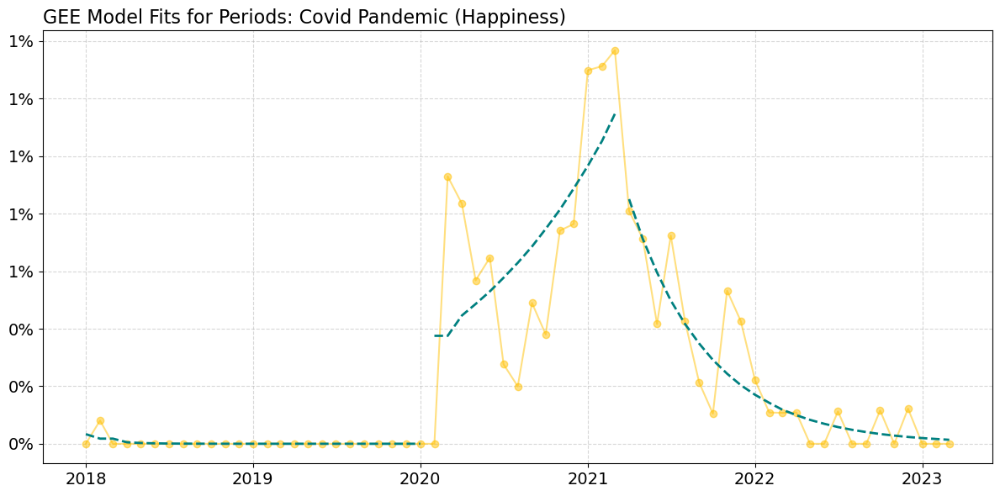


  Generalized Estimating Equations (GEE) Analysis:
          Period  GEE Slope  GEE p-value
0   Pre-pandemic  -0.626294     0.000000
1       Pandemic   0.086528     0.002104
2  Post-pandemic  -0.179442     0.000001


In [393]:
### CREATE WC / LINE VIZ : HAP - COIVD PANDEMIC
## covid tiemline: https://www.instituteforgovernment.org.uk/sites/default/files/2022-12/timeline-coronavirus-lockdown-december-2021.pdf

# ----------> SELECT THEME --------
theme = 'Covid Pandemic'
# ---------------------------------

hap_longitudinal_df.loc[:,'hap_topics_cleansed'] = [s.replace('celebrations','celebration') for s in hap_longitudinal_df['hap_topics_cleansed']]

hap_wc_count_dict = hap_longitudinal_df[hap_longitudinal_df['theme'] == theme]['hap_topics_cleansed'].value_counts().to_dict()

## ------ Initiate a figure
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

## ------ Define a function to control colour darkness for background wc
# Define a light version of #FFC000 — you can tweak this RGB as desired
light_yellow_rgb = (255, 245, 180)  # lighter tint of #FFC000

def constant_light_yellow_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    r, g, b = light_yellow_rgb
    return f"rgb({r}, {g}, {b})"

## ----- Generate the word cloud with adjusted colours
# initialise wc object
wordcloud = WordCloud(
    width=1000,
    height=500,
    background_color='white',
    contour_width=1,
    max_font_size=300,
    relative_scaling=0.2,
    margin=1,
    collocations=False,
    random_state=11,               
    color_func=constant_light_yellow_color_func
).generate_from_frequencies(hap_wc_count_dict)
# show wordcloud backgorund
ax.imshow(wordcloud)
ax.set_axis_off()

## ----- Create time series of % measure -----
# filter to theme within pivot table
theme_series = hap_pivot_table.loc[theme]
# transpose and reset index
theme_series_trans = theme_series.reset_index()
# rename columns
theme_series_trans.columns = ['year_month', 'value']
# ensure 'year_month' is a string before conversion
theme_series_trans['year_month'] = theme_series_trans['year_month'].astype(str)
# convert 'year_month' to datetime format (assuming YYYY-MM format)
theme_series_trans['year_month'] = pd.to_datetime(theme_series_trans['year_month'], format='%Y-%m')
# ensure 'value' is numeric
theme_series_trans['value'] = pd.to_numeric(theme_series_trans['value'], errors='coerce').round(2)
# create inset axes
sub_ax = inset_axes(ax, width="90%", height="70%", loc='center', borderpad=1)

## ----- Smooth the line using interpolation ----
x = theme_series_trans['year_month'].map(lambda d: d.timestamp())  # Convert datetime to numerical timestamps
y = theme_series_trans['value']
# Create interpolation function
x_smooth = np.linspace(x.min(), x.max(), 300)  # Generate more points for smooth curve

spline_viz = make_interp_spline(x, y, k=3)  # k=3 for cubic spline smoothing
spline = UnivariateSpline(x, y, k=3, s=len(x)* 0.01)  # s controls the amount of smoothing

y_smooth_viz = spline_viz(x_smooth)
y_smooth = spline(x_smooth)

# === R² CALCULATION ===
y_pred_at_x = spline(x)  # predict at original x
ss_total = np.sum((y - np.mean(y)) ** 2)
ss_res = np.sum((y - y_pred_at_x) ** 2)
r_squared = 1 - (ss_res / ss_total)


# Convert timestamps back to datetime for plotting
x_smooth_dates = pd.to_datetime(x_smooth, unit='s')
#fix y smooth
y_smooth[y_smooth < 0] = 0 
# plot the smooth line chart
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='white', linewidth=9, zorder=5)
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='#FFC000', linewidth=2.5, zorder=5)
# remove background from line chart
sub_ax.set_axis_off()

## ----- Display y-axis labels 
max_rate = 2
min_rate = 0
mid_rate = 1
sub_ax.axhline(y=max_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=min_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=mid_rate, color='black', linestyle='--', lw=0.4)
sub_ax.text(17350, max_rate - 0.04, f"{max_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold' )
sub_ax.text(17350, min_rate - 0.04, f"{min_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')
sub_ax.text(17350, mid_rate - 0.04, f"{mid_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')

# ----- set title
lower_bound = 1960
upper_bound = 2019
title = theme.title()
title = title.replace("And","and")

fig_text(
    0.22, 0.825,
    title, color='black',
    fontweight='bold',
    fontsize=16,
    #highlight_textprops=[{"color": 'darkred'},{"fontsize": 13,"color": 'darkgrey',"fontweight": 'normal'}],
    ha='center')

##### ICON, TEXT, ARROW 2 (cost of living payment) -------------------------------------------------------------------------------------------

## ----- Display icon image(s)
# define function to load and return image
def open_image_local(path_to_image):
    image = Image.open(path_to_image) # Open the image
    image_array = np.array(image) # Convert to a numpy array
    return image_array # Output
# initialise image object from file
ld_nov_image = open_image_local('E:/twitter_analysis_data/viz/theme_analysis/icons/hap_cov_open_png.png')
# define the position and size parameters
ld_nov_image_xaxis = 0.45
ld_nov_image_yaxis = 0.595
ld_nov_image_width = 0.08
ld_nov_image_height = 0.08
ax_ld_nov_image = fig.add_axes([ld_nov_image_xaxis, ld_nov_image_yaxis, ld_nov_image_width, ld_nov_image_height])
# show icon
ax_ld_nov_image.imshow(ld_nov_image)
ax_ld_nov_image.axis('off')  # Remove axis of the image

## ----- Icon text
sub_ax.text(
    0.415, 0.83,  # X, Y in Axes coordinates
    r"$\bf{March\ 2021:}$" + "\nSchools reopen and\ngatherings allowed.",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='right',
    va='center')

## ----- Draw arrow
def draw_arrow(tail_position, head_position, invert=True):
    kw = dict(
        arrowstyle="Simple, tail_width=0.5, head_width=4, head_length=8", color="k")
    if invert:
        connectionstyle = "arc3,rad=-.5"
    else:
        connectionstyle = "arc3,rad=.5"
    a = FancyArrowPatch(tail_position, head_position,
                        connectionstyle=connectionstyle,
                        transform=fig.transFigure,
                        **kw)
    fig.patches.append(a)
draw_arrow((0.52, 0.62), (0.58, 0.57))

# --------------------------------------------------------------------------------------------------
## ------ Save figure
save_path = 'E:/twitter_analysis_data/viz/theme_analysis/wc_line_detail/'
plt.savefig(save_path + "hap " + theme + '.png', bbox_inches='tight', pad_inches=0.15)

## ------ Show figure 
plt.show()

################################################# S T A T I S T I C A L   A N A L Y S I S ##########################################

p1 = "Pre-pandemic"
p2 = "Pandemic"
p3 = "Post-pandemic"

stat_analysis_for_theme(
    anx_or_hap = "Happiness",
    input_dataframe=hap_stat_sig_df,
    theme=theme,
    periods=[
        (p1, "1900-01", "2020-01"),
        (p2, "2020-02", "2021-03"),
        (p3, "2021-04", "2100-01")
    ],
    logit_text_positions={
        p1: (0.5, 0.005),
        p2: (0.5, 0.004),
        p3: (0.655, 0.01)
    },
    gee_text_positions={
        p1: 0.05,
        p3: 0.05,
        p3: 0.05
    },
    line_color_data='#FFC000',
    r_p_pos = (0.98, 0.95)
)

### Personal Finances and Employment (Anxiety)
---

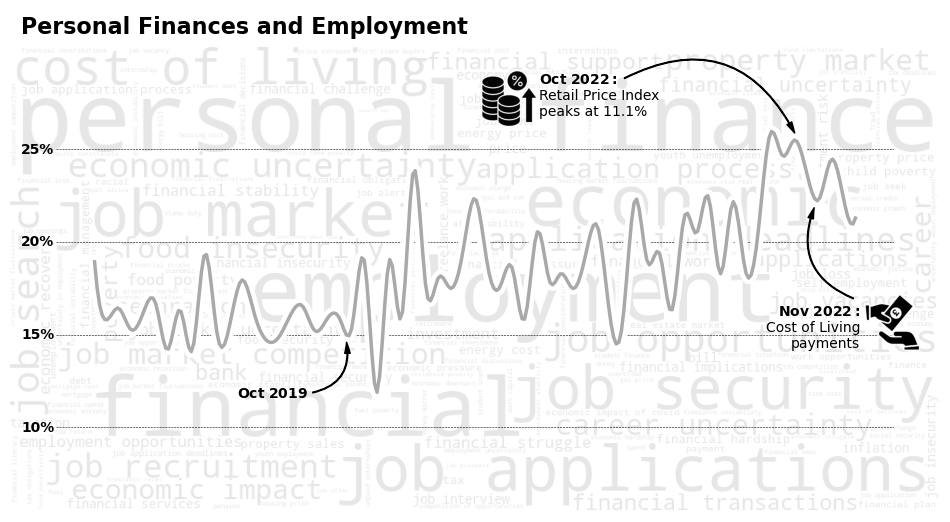



STATISTICAL ANALYSIS FOR THEME:

TESTING CUBIC SPLINE INTERPOLATION MODEL VERSUS NULL HYPOTHESIS:
Permutation p-value: 0.03130000
R² = 0.7922


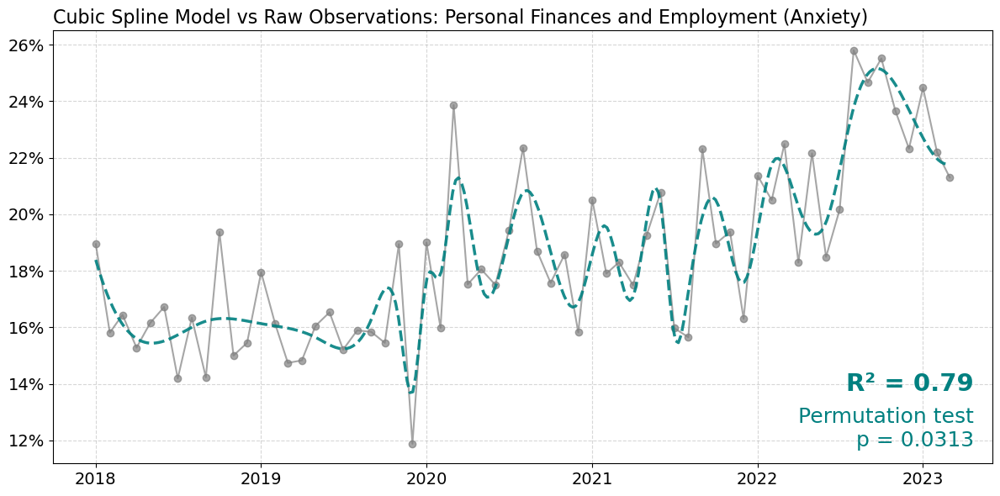


CHANGE POINT DETECTION:


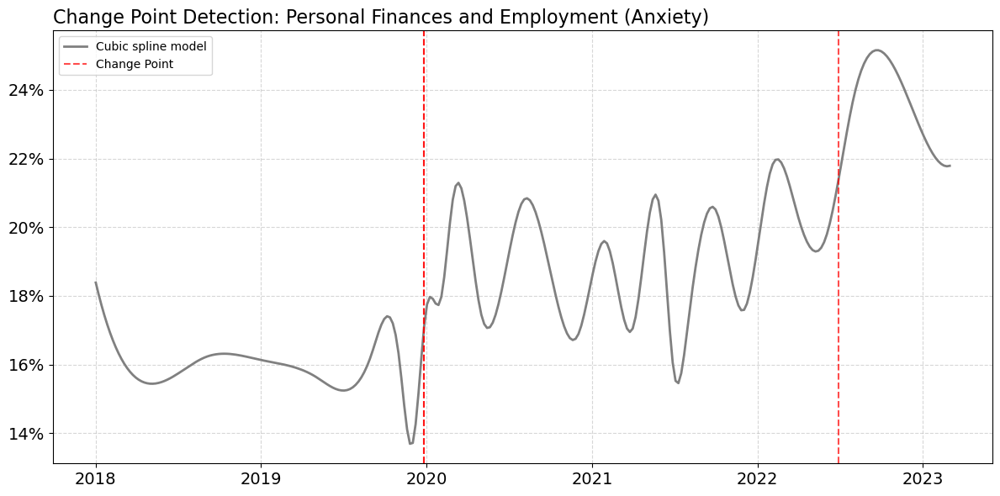


 DEFINED PERIODS
("Stability to Feb'20", '2018-01', '2020-02')
("Gradual Incline Feb'20-Oct'22", '2020-02', '2022-10')
("Decline from Oct'22", '2022-10', '2023-03')


 LOGISTIC REGRESSION, T-TESTING AND GEE MODELLING 



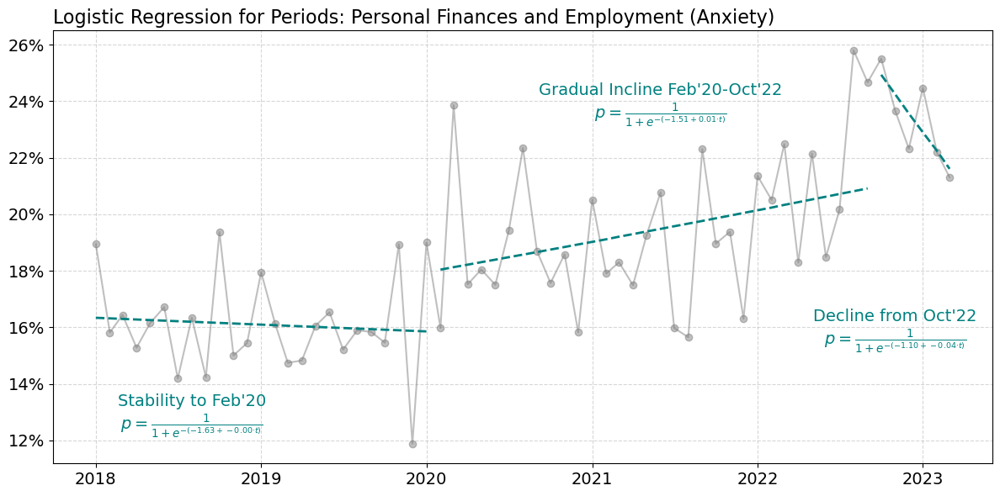



 Summary of Logistic Regression Model and Means for Periods:
                          Period  Intercept     Slope  p(Intercept)  p(Slope)  \
0            Stability to Feb'20  -1.633446 -0.001488  0.000000e+00  0.526709   
1  Gradual Incline Feb'20-Oct'22  -1.513690  0.005917  0.000000e+00  0.000275   
2            Decline from Oct'22  -1.102218 -0.037318  6.893256e-70  0.078920   

   Empirical Mean  
0        0.160991  
1        0.193539  
2        0.232838  


T-TESTING TO ASSESS VARIATION IN MEANS BETWEEN PERIODS


Pairwise T-Test p-values using Welch's T-Test:
                               Stability to Feb'20  \
Stability to Feb'20                            NaN   
Gradual Incline Feb'20-Oct'22         8.298781e-23   
Decline from Oct'22                   3.431847e-25   

                               Gradual Incline Feb'20-Oct'22  \
Stability to Feb'20                             8.298781e-23   
Gradual Incline Feb'20-Oct'22                            NaN   
Decline from Oct'

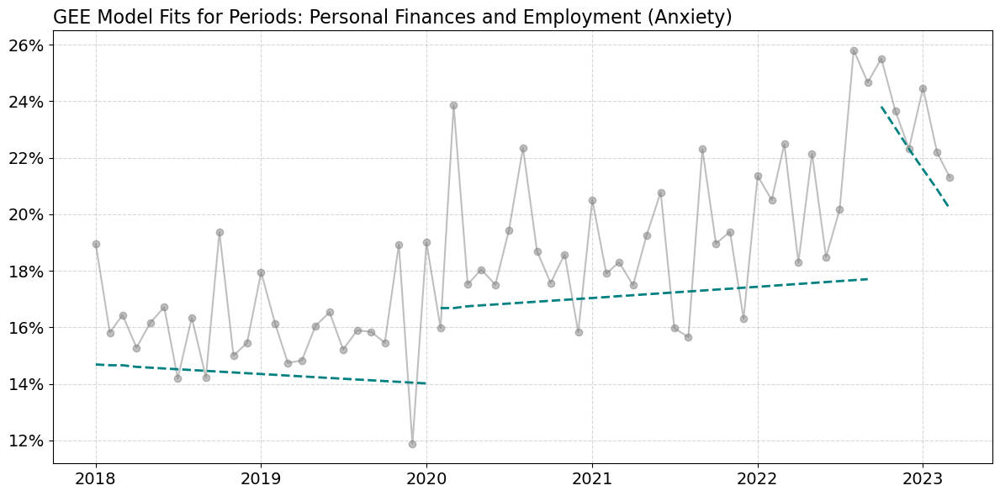


  Generalized Estimating Equations (GEE) Analysis:
                          Period  GEE Slope  GEE p-value
0            Stability to Feb'20  -0.002275     0.378924
1  Gradual Incline Feb'20-Oct'22   0.002318     0.276601
2            Decline from Oct'22  -0.042219     0.043242


In [385]:
### CREATE WC / LINE VIZ : ANX - PERSONAL FINANCE AND EMPLOYMENT

# ----------> SELECT THEME --------
theme = 'Personal Finances and Employment'
# ---------------------------------

anx_wc_count_dict = anx_longitudinal_df[anx_longitudinal_df['theme'] == theme]['anx_topics_cleansed'].value_counts().to_dict()

## ------ Initiate a figure
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

## ------ Define a function to control colour darkness for background wc
def adjusted_grey_scale_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    max_freq = max(anx_wc_count_dict.values())  # Get max frequency for scaling
    frequency = anx_wc_count_dict.get(word, 1)
    min_darkness = 230  # Adjust this to make the lightest words darker
    darkness = int(200 * (1 - frequency / max_freq))  # Scale from black (0) to white (255)
    darkness = max(darkness, min_darkness)  # Ensure minimum darkness level
    return f"rgb({darkness}, {darkness}, {darkness})"  # Return adjusted grayscale color

## ----- Generate the word cloud with adjusted colours
# initialise wc object
wordcloud = WordCloud(
    width=1000,
    height=500,
    background_color='white',
    contour_width=1,
    max_font_size=300,
    relative_scaling=0.2,
    margin=1,
    collocations=False,
    random_state=2,
    color_func=adjusted_grey_scale_color_func
).generate_from_frequencies(anx_wc_count_dict)
# show wordcloud backgorund
ax.imshow(wordcloud)
ax.set_axis_off()

## ----- Create time series of % measure -----
# filter to theme within pivot table
theme_series = anx_pivot_table.loc[theme]
# transpose and reset index
theme_series_trans = theme_series.reset_index()
# rename columns
theme_series_trans.columns = ['year_month', 'value']
# ensure 'year_month' is a string before conversion
theme_series_trans['year_month'] = theme_series_trans['year_month'].astype(str)
# convert 'year_month' to datetime format (assuming YYYY-MM format)
theme_series_trans['year_month'] = pd.to_datetime(theme_series_trans['year_month'], format='%Y-%m')
# ensure 'value' is numeric
theme_series_trans['value'] = pd.to_numeric(theme_series_trans['value'], errors='coerce').round(2)
# create inset axes
sub_ax = inset_axes(ax, width="90%", height="70%", loc='center', borderpad=1)

## ----- Smooth the line using interpolation ----
x = theme_series_trans['year_month'].map(lambda d: d.timestamp())  # Convert datetime to numerical timestamps
y = theme_series_trans['value']
# Create interpolation function
x_smooth = np.linspace(x.min(), x.max(), 300)  # Generate more points for smooth curve

spline_viz = make_interp_spline(x, y, k=3)  # k=3 for cubic spline smoothing
spline = UnivariateSpline(x, y, k=3, s=len(x)* 2.0)  # s controls the amount of smoothing

y_smooth_viz = spline_viz(x_smooth)
y_smooth = spline(x_smooth)

# === R² CALCULATION ===
y_pred_at_x = spline(x)  # predict at original x
ss_total = np.sum((y - np.mean(y)) ** 2)
ss_res = np.sum((y - y_pred_at_x) ** 2)
r_squared = 1 - (ss_res / ss_total)

# Convert timestamps back to datetime for plotting
x_smooth_dates = pd.to_datetime(x_smooth, unit='s')
# plot the smooth line chart
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='white', linewidth=9, zorder=5)
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='darkgrey', linewidth=2.5, zorder=5)
# remove background from line chart
sub_ax.set_axis_off()

## ----- Display y-axis labels 
max_rate = 25
min_rate = 10
mid_rate_1 = 15
mid_rate_2 = 20

sub_ax.axhline(y=max_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=min_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=mid_rate_1, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=mid_rate_2, color='black', linestyle='--', lw=0.4)

sub_ax.text(17350, max_rate - 0.22, f"{max_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold' )
sub_ax.text(17350, min_rate - 0.22, f"{min_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')
sub_ax.text(17350, mid_rate_1 - 0.22, f"{mid_rate_1:.0f}%",
    fontsize=10, color='black', fontweight='bold')
sub_ax.text(17350, mid_rate_2 - 0.22, f"{mid_rate_2:.0f}%",
    fontsize=10, color='black', fontweight='bold')

# ----- set title
lower_bound = 1960
upper_bound = 2019
title = theme.title()
title = title.replace("And","and")
#f"""
#Are movies getting <worse>?
#<Average rating per year on {df.shape[0]} movies published between {lower_bound} and {upper_bound}>
#"""

fig_text(
    0.32, 0.825,
    title, color='black',
    fontweight='bold',
    fontsize=16,
    #highlight_textprops=[{"color": 'darkred'},{"fontsize": 13,"color": 'darkgrey',"fontweight": 'normal'}],
    ha='center')

##### ICON, TEXT, ARROW 1 (retail price index peak) -------------------------------------------------------------------------------------------

## ----- Display icon image(s)
# define function to load and return image
def open_image_local(path_to_image):
    image = Image.open(path_to_image) # Open the image
    image_array = np.array(image) # Convert to a numpy array
    return image_array # Output
# initialise image object from file
rpi_image = open_image_local('E:/twitter_analysis_data/viz/theme_analysis/icons/anx_pfe_rpi_png.png')
# define the position and size parameters
rpi_image_xaxis = 0.5
rpi_image_yaxis = 0.68
rpi_image_width = 0.08
rpi_image_height = 0.08
ax_rpi_image = fig.add_axes([rpi_image_xaxis, rpi_image_yaxis, rpi_image_width, rpi_image_height])
# show icon
ax_rpi_image.imshow(rpi_image)
ax_rpi_image.axis('off')  # Remove axis of the image

## ----- Icon text
sub_ax.text(
    0.577, 1.063,  # X, Y in Axes coordinates
    r"$\bf{Oct\ 2022:}$" + "\nRetail Price Index\npeaks at 11.1%",
    #f"Oct 2022:\nRetail Price Index\npeaks at 11.1%.",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='left',
    va='center')

## ----- Draw arrow
def draw_arrow(tail_position, head_position, invert=True):
    kw = dict(
        arrowstyle="Simple, tail_width=0.5, head_width=4, head_length=8", color="k")
    if invert:
        connectionstyle = "arc3,rad=-.5"
    else:
        connectionstyle = "arc3,rad=.5"
    a = FancyArrowPatch(tail_position, head_position,
                        connectionstyle=connectionstyle,
                        transform=fig.transFigure,
                        **kw)
    fig.patches.append(a)
draw_arrow((0.635, 0.745), (0.78, 0.675))

##### ICON, TEXT, ARROW 2 (cost of living payment) -------------------------------------------------------------------------------------------

## ----- Display icon image(s)
# define function to load and return image
def open_image_local(path_to_image):
    image = Image.open(path_to_image) # Open the image
    image_array = np.array(image) # Convert to a numpy array
    return image_array # Output
# initialise image object from file
col_image = open_image_local('E:/twitter_analysis_data/viz/theme_analysis/icons/anx_pfe_col_png.png')
# define the position and size parameters
col_image_xaxis = 0.82
col_image_yaxis = 0.4
col_image_width = 0.08
col_image_height = 0.08
ax_col_image = fig.add_axes([col_image_xaxis, col_image_yaxis, col_image_width, col_image_height])
# show icon
ax_col_image.imshow(col_image)
ax_col_image.axis('off')  # Remove axis of the image

## ----- Icon text
sub_ax.text(
    0.96, 0.352,  # X, Y in Axes coordinates
    r"$\bf{Nov\ 2022:}$" + "\nCost of Living\npayments",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='right',
    va='center')

## ----- Draw arrow
def draw_arrow(tail_position, head_position, invert=True):
    kw = dict(
        arrowstyle="Simple, tail_width=0.5, head_width=4, head_length=8", color="k")
    if invert:
        connectionstyle = "arc3,rad=-.5"
    else:
        connectionstyle = "arc3,rad=.5"
    a = FancyArrowPatch(tail_position, head_position,
                        connectionstyle=connectionstyle,
                        transform=fig.transFigure,
                        **kw)
    fig.patches.append(a)

draw_arrow((0.83, 0.47), (0.796, 0.588))

sub_ax.text(
    0.3, 0.1,  # X, Y in Axes coordinates
    r"$\bf{Oct\ 2019}$" + "\n\n",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='right',
    va='center')

def draw_arrow(tail_position, head_position, invert=False):
    kw = dict(
        arrowstyle="Simple, tail_width=0.5, head_width=4, head_length=8", color="k")
    if invert:
        connectionstyle = "arc3,rad=-.5"
    else:
        connectionstyle = "arc3,rad=.5"
    a = FancyArrowPatch(tail_position, head_position,
                        connectionstyle=connectionstyle,
                        transform=fig.transFigure,
                        **kw)
    fig.patches.append(a)
draw_arrow((0.375, 0.353), (0.405, 0.42))

# --------------------------------------------------------------------------------------------------
## ------ Save figure
save_path = 'E:/twitter_analysis_data/viz/theme_analysis/wc_line_detail/'
plt.savefig(save_path + "anx " + theme + '.png', bbox_inches='tight', pad_inches=0.15)

## ------ Show figure 
plt.show()

################################################# S T A T I S T I C A L   A N A L Y S I S ##########################################

p1 = "Stability to Feb'20" 
p2 = "Gradual Incline Feb'20-Oct'22"
p3 = "Decline from Oct'22"


stat_analysis_for_theme(
    anx_or_hap = "Anxiety",
    input_dataframe=anx_stat_sig_df,
    theme=theme,
    periods=[
        (p1, "2018-01", "2020-02"),
        (p2, "2020-02", "2022-10"),
        (p3, "2022-10", "2023-03"),
    ],
    logit_text_positions={
        p1: (0.3, 0.12),
        p2: (0.5, 0.23),
        p3: (0.3, 0.15)
    },
    gee_text_positions={
        p1: 0.05,
        p2: 0.05,
        p3: 0.05
    },
    line_color_data="grey",
    r_p_pos = (0.98, 0.21)
)



### Business (Anxiety and Happiness)

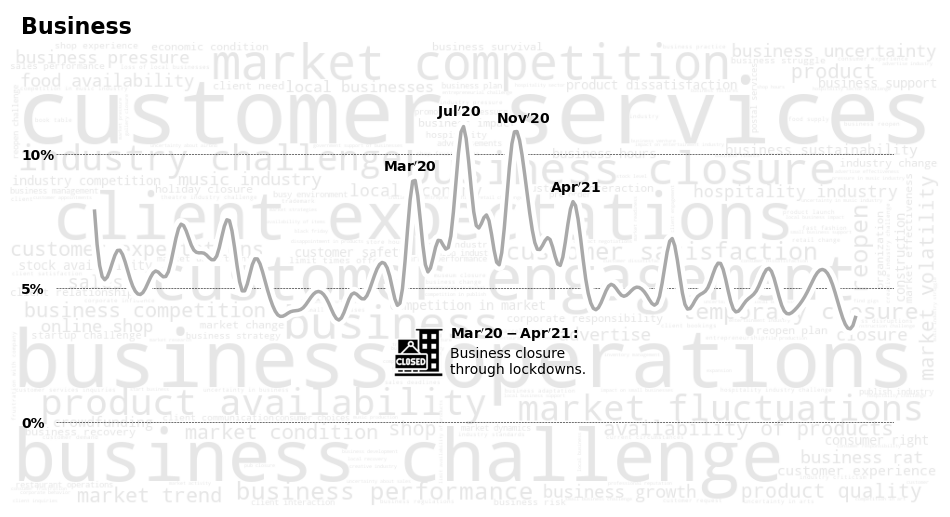



STATISTICAL ANALYSIS FOR THEME:

TESTING CUBIC SPLINE INTERPOLATION MODEL VERSUS NULL HYPOTHESIS:
Permutation p-value: 0.00000000
R² = 0.7913


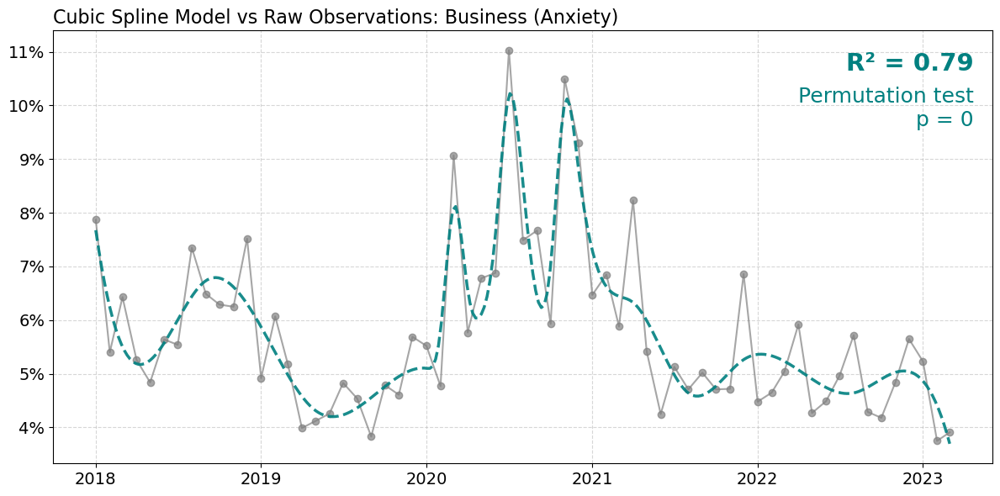


CHANGE POINT DETECTION:


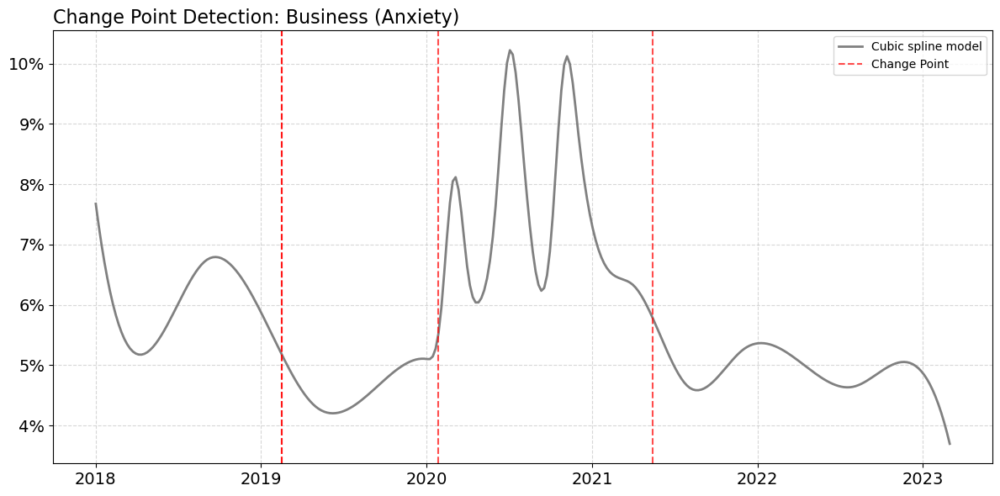


 DEFINED PERIODS
('Pre Lockdowns', '2018-01', '2020-01')
('Business Closures', '2020-01', '2021-05')
('Post Lockdowns', '2021-05', '2023-03')


 LOGISTIC REGRESSION, T-TESTING AND GEE MODELLING 



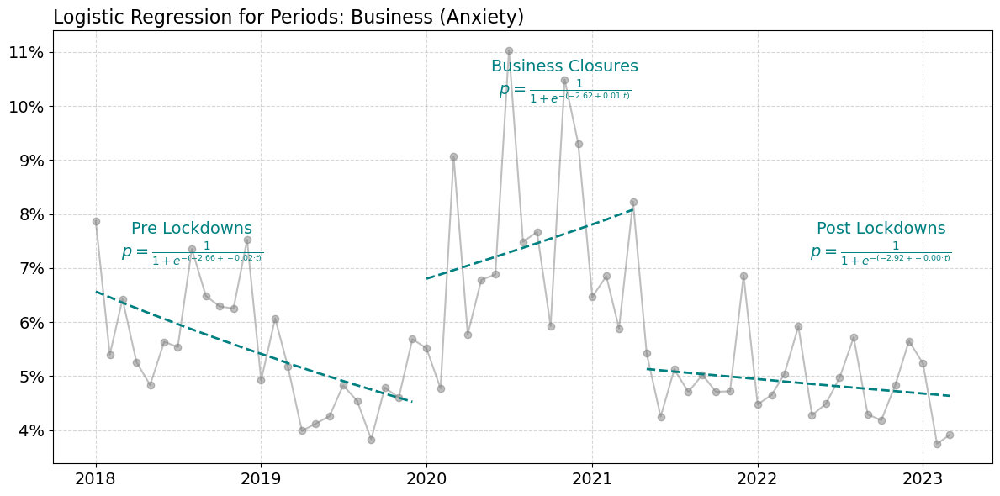



 Summary of Logistic Regression Model and Means for Periods:
              Period  Intercept     Slope  p(Intercept)  p(Slope)  \
0      Pre Lockdowns  -2.655410 -0.017120           0.0  0.000023   
1  Business Closures  -2.617183  0.012384           0.0  0.064031   
2     Post Lockdowns  -2.916939 -0.004868           0.0  0.356391   

   Empirical Mean  
0        0.055123  
1        0.074091  
2        0.048896  


T-TESTING TO ASSESS VARIATION IN MEANS BETWEEN PERIODS


Pairwise T-Test p-values using Welch's T-Test:
                   Pre Lockdowns  Business Closures  Post Lockdowns
Pre Lockdowns                NaN       1.521302e-13    4.395168e-03
Business Closures   1.521302e-13                NaN    2.523627e-21
Post Lockdowns      4.395168e-03       2.523627e-21             NaN

  Calculation of effect size using Cohen's d:
                            Comparison  Cohen's d
0   Pre Lockdowns vs Business Closures  -0.078395
1      Pre Lockdowns vs Post Lockdowns   0.027925
2  Bu

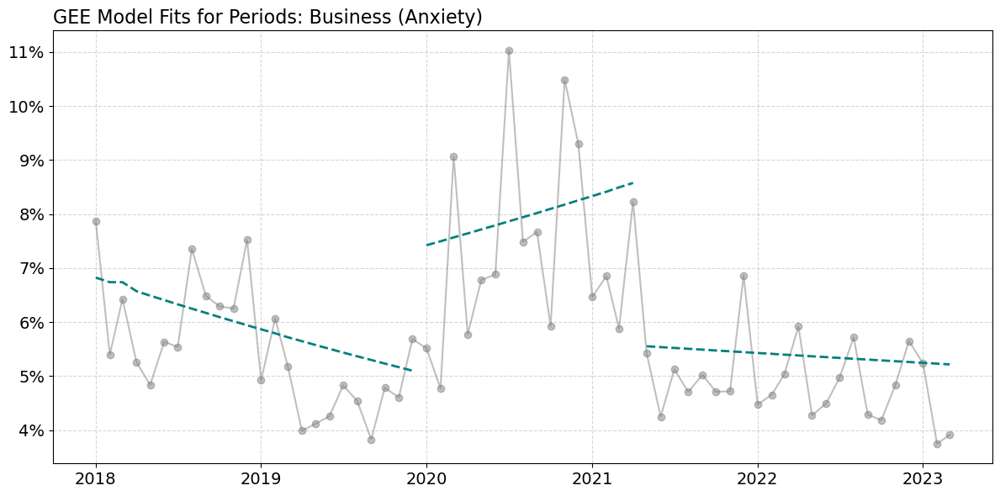


  Generalized Estimating Equations (GEE) Analysis:
              Period  GEE Slope  GEE p-value
0      Pre Lockdowns  -0.013454     0.000556
1  Business Closures   0.010455     0.051265
2     Post Lockdowns  -0.003002     0.549638


In [386]:
### CREATE WC / LINE VIZ : ANX - BUSINESS

# ----------> SELECT THEME --------
theme = 'Business'
# ---------------------------------

anx_wc_count_dict = anx_longitudinal_df[anx_longitudinal_df['theme'] == theme]['anx_topics_cleansed'].value_counts().to_dict()

## ------ Initiate a figure
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

## ------ Define a function to control colour darkness for background wc
def adjusted_grey_scale_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    max_freq = max(anx_wc_count_dict.values())  # Get max frequency for scaling
    frequency = anx_wc_count_dict.get(word, 1)
    min_darkness = 230  # Adjust this to make the lightest words darker
    darkness = int(200 * (1 - frequency / max_freq))  # Scale from black (0) to white (255)
    darkness = max(darkness, min_darkness)  # Ensure minimum darkness level
    return f"rgb({darkness}, {darkness}, {darkness})"  # Return adjusted grayscale color

## ----- Generate the word cloud with adjusted colours
# initialise wc object
wordcloud = WordCloud(
    width=1000,
    height=500,
    background_color='white',
    contour_width=1,
    max_font_size=300,
    relative_scaling=0.2,
    margin=1,
    collocations=False,
    random_state=2,
    color_func=adjusted_grey_scale_color_func
).generate_from_frequencies(anx_wc_count_dict)
# show wordcloud backgorund
ax.imshow(wordcloud)
ax.set_axis_off()

## ----- Create time series of % measure -----
# filter to theme within pivot table
theme_series = anx_pivot_table.loc[theme]
# transpose and reset index
theme_series_trans = theme_series.reset_index()
# rename columns
theme_series_trans.columns = ['year_month', 'value']
# ensure 'year_month' is a string before conversion
theme_series_trans['year_month'] = theme_series_trans['year_month'].astype(str)
# convert 'year_month' to datetime format (assuming YYYY-MM format)
theme_series_trans['year_month'] = pd.to_datetime(theme_series_trans['year_month'], format='%Y-%m')
# ensure 'value' is numeric
theme_series_trans['value'] = pd.to_numeric(theme_series_trans['value'], errors='coerce').round(2)
# create inset axes
sub_ax = inset_axes(ax, width="90%", height="70%", loc='center', borderpad=1)

## ----- Smooth the line using interpolation ----
x = theme_series_trans['year_month'].map(lambda d: d.timestamp())  # Convert datetime to numerical timestamps
y = theme_series_trans['value']
# Create interpolation function
x_smooth = np.linspace(x.min(), x.max(), 300)  # Generate more points for smooth curve

spline_viz = make_interp_spline(x, y, k=3)  # k=3 for cubic spline smoothing
spline = UnivariateSpline(x, y, k=3, s=len(x)* 0.5)  # s controls the amount of smoothing

y_smooth_viz = spline_viz(x_smooth)
y_smooth = spline(x_smooth)

# === R² CALCULATION ===
y_pred_at_x = spline(x)  # predict at original x
ss_total = np.sum((y - np.mean(y)) ** 2)
ss_res = np.sum((y - y_pred_at_x) ** 2)
r_squared = 1 - (ss_res / ss_total)


# Convert timestamps back to datetime for plotting
x_smooth_dates = pd.to_datetime(x_smooth, unit='s')
#fix y smooth
y_smooth_viz[y_smooth_viz < 0] = 0 
# plot the smooth line chart
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='white', linewidth=9, zorder=5)
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='darkgrey', linewidth=2.5, zorder=5)
# remove background from line chart
sub_ax.set_axis_off()

## ----- Display y-axis labels 
max_rate = 10
min_rate = 0
mid_rate = 5
sub_ax.axhline(y=max_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=min_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=mid_rate, color='black', linestyle='--', lw=0.4)
sub_ax.text(17350, max_rate - 0.2, f"{max_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold' )
sub_ax.text(17350, min_rate - 0.2, f"{min_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')
sub_ax.text(17350, mid_rate - 0.2, f"{mid_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')


# ----- set title
lower_bound = 1960
upper_bound = 2019
title = theme.title()
title = title.replace("And","and")

fig_text(
    0.18, 0.819,
    title, color='black',
    fontweight='bold',
    fontsize=16,
    #highlight_textprops=[{"color": 'darkred'},{"fontsize": 13,"color": 'darkgrey',"fontweight": 'normal'}],
    ha='center')



##### ICON, TEXT, ARROW 1 (invasion of ukraine) -------------------------------------------------------------------------------------------

## ----- Display icon image(s)
# define function to load and return image
def open_image_local(path_to_image):
    image = Image.open(path_to_image) # Open the image
    image_array = np.array(image) # Convert to a numpy array
    return image_array # Output
# initialise image object from file
business_image = open_image_local('E:/twitter_analysis_data/viz/theme_analysis/icons/anx_business_png.png')
# define the position and size parameters
business_image_xaxis = 0.425
business_image_yaxis = 0.357
business_image_width = 0.08
business_image_height = 0.08
ax_business_image = fig.add_axes([business_image_xaxis, business_image_yaxis, business_image_width, business_image_height])
# show icon
ax_business_image.imshow(business_image)
ax_business_image.axis('off')  # Remove axis of the image

### 4 PEAKS: Mar20, Jul20, Nov20, Apr21

## ----- Icon text
sub_ax.text(
    0.47, 0.265,  # X, Y in Axes coordinates
    r"$\bf{Mar'20-Apr'21:}$" + "\nBusiness closure\nthrough lockdowns.",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='left',
    va='center')

## ---- Texy: Mar 2020
sub_ax.text(
    0.39, 0.78,  # X, Y in Axes coordinates
    r"$\bf{Mar'20}$" + "\n\n",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='left',
    va='center')

## ---- Texy: Jul 2020
sub_ax.text(
    0.455, 0.95,  # X, Y in Axes coordinates
    r"$\bf{Jul'20}$" + "\n\n",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='left',
    va='center')

## ---- Texy: Nov 2020
sub_ax.text(
    0.525, 0.93,  # X, Y in Axes coordinates
    r"$\bf{Nov'20}$" + "\n\n",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='left',
    va='center')

## ---- Texy: Mar 2021
sub_ax.text(
    0.59, 0.715,  # X, Y in Axes coordinates
    r"$\bf{Apr'21}$" + "\n\n",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='left',
    va='center')

## ----- Draw arrow
def draw_arrow(tail_position, head_position, invert=True):
    kw = dict(
        arrowstyle="Simple, tail_width=0.5, head_width=4, head_length=8", color="k")
    if invert:
        connectionstyle = "arc3,rad=-.5"
    else:
        connectionstyle = "arc3,rad=.5"
    a = FancyArrowPatch(tail_position, head_position,
                        connectionstyle=connectionstyle,
                        transform=fig.transFigure,
                        **kw)
    fig.patches.append(a)
#draw_arrow((0.62, 0.61), (0.702, 0.582))

# --------------------------------------------------------------------------------------------------
## ------ Save figure
save_path = 'E:/twitter_analysis_data/viz/theme_analysis/wc_line_detail/'
plt.savefig(save_path + "anx " + theme + '.png', bbox_inches='tight', pad_inches=0.15)

## ------ Show figure 
plt.show()


################################################# S T A T I S T I C A L   A N A L Y S I S ##########################################

p1 = "Pre Lockdowns"
p2 = "Business Closures"
p3 = "Post Lockdowns"

stat_analysis_for_theme(
    anx_or_hap = "Anxiety",
    input_dataframe=anx_stat_sig_df,
    theme=theme,
    periods=[
        (p1, "2018-01", "2020-01"),
        (p2, "2020-01", "2021-05"),
        (p3, "2021-05", "2023-03"),
    ],
    logit_text_positions={
        p1: (0.3, 0.07),
        p2: (0.655, 0.1),
        p3: (0.75, 0.07)
    },
    gee_text_positions={
        p1: 0.05,
        p2: 0.05,
        p3: 0.05
    },
    line_color_data="grey",
    r_p_pos = (0.98, 0.95)
)



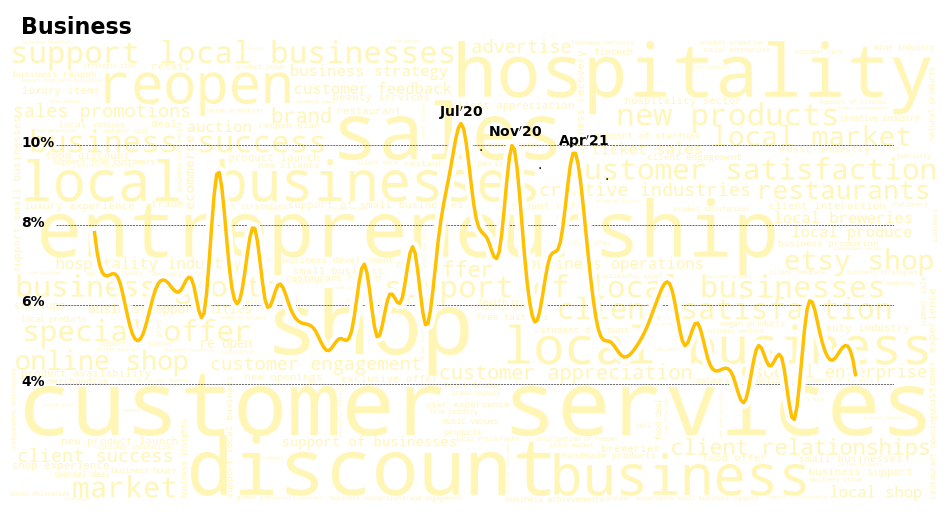



STATISTICAL ANALYSIS FOR THEME:

TESTING CUBIC SPLINE INTERPOLATION MODEL VERSUS NULL HYPOTHESIS:
Permutation p-value: 0.00000000
R² = 0.7920


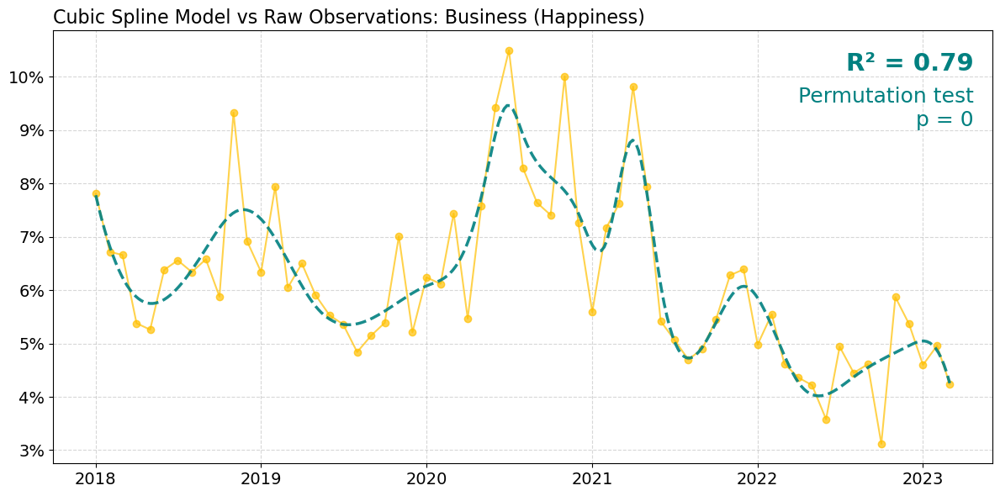


CHANGE POINT DETECTION:


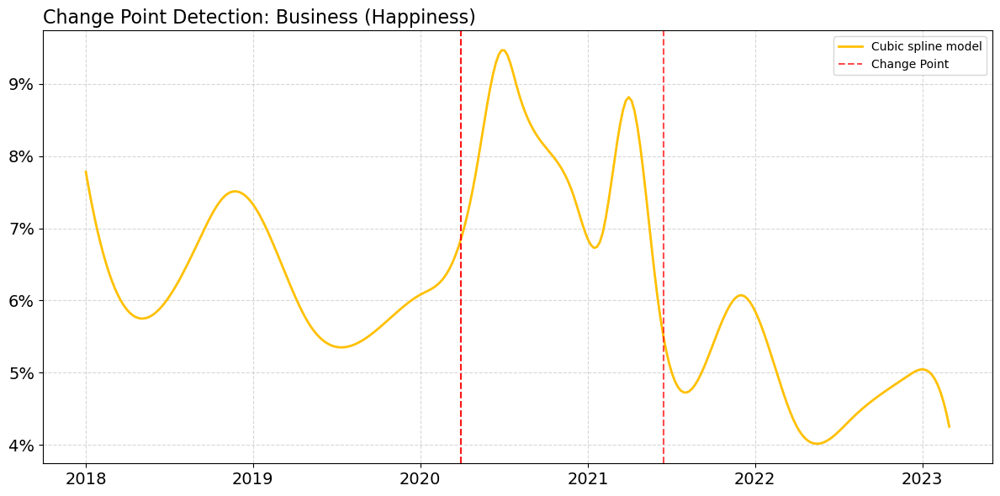


 DEFINED PERIODS
('Pre Lockdowns', '2018-01', '2020-01')
('Business Closures', '2020-01', '2021-05')
('Post Lockdowns', '2021-05', '2023-03')


 LOGISTIC REGRESSION, T-TESTING AND GEE MODELLING 



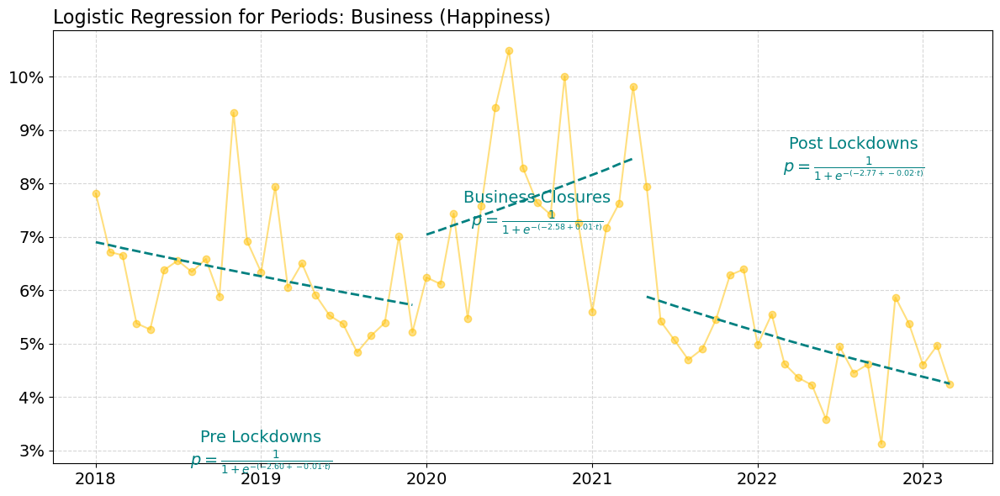



 Summary of Logistic Regression Model and Means for Periods:
              Period  Intercept     Slope  p(Intercept)  p(Slope)  \
0      Pre Lockdowns  -2.602258 -0.008667           0.0  0.013287   
1  Business Closures  -2.580242  0.013306           0.0  0.032907   
2     Post Lockdowns  -2.773383 -0.015539           0.0  0.001352   

   Empirical Mean  
0        0.063093  
1        0.077182  
2        0.050513  


T-TESTING TO ASSESS VARIATION IN MEANS BETWEEN PERIODS


Pairwise T-Test p-values using Welch's T-Test:
                   Pre Lockdowns  Business Closures  Post Lockdowns
Pre Lockdowns                NaN       1.964342e-08    2.059348e-09
Business Closures   1.964342e-08                NaN    1.855524e-25
Post Lockdowns      2.059348e-09       1.855524e-25             NaN

  Calculation of effect size using Cohen's d:
                            Comparison  Cohen's d
0   Pre Lockdowns vs Business Closures  -0.055851
1      Pre Lockdowns vs Post Lockdowns   0.053928
2  Bu

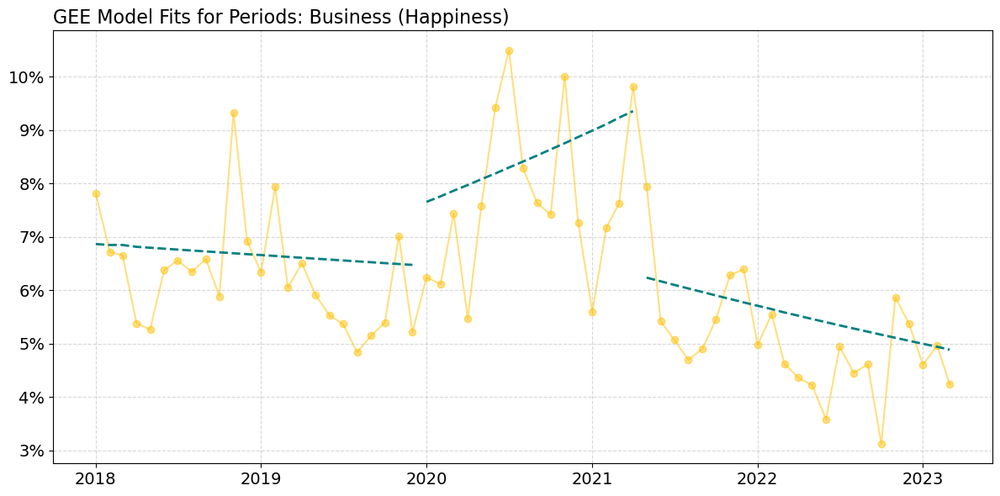


  Generalized Estimating Equations (GEE) Analysis:
              Period  GEE Slope  GEE p-value
0      Pre Lockdowns  -0.002732     0.430995
1  Business Closures   0.014615     0.004527
2     Post Lockdowns  -0.011740     0.009066


In [394]:
### CREATE WC / LINE VIZ : HAP - BUSINESS

# ----------> SELECT THEME --------
theme = 'Business'
# ---------------------------------

hap_longitudinal_df.loc[:,'hap_topics_cleansed'] = [s.replace('celebrations','celebration') for s in hap_longitudinal_df['hap_topics_cleansed']]

hap_wc_count_dict = hap_longitudinal_df[hap_longitudinal_df['theme'] == theme]['hap_topics_cleansed'].value_counts().to_dict()

## ------ Initiate a figure
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

## ------ Define a function to control colour darkness for background wc
# Define a light version of #FFC000 — you can tweak this RGB as desired
light_yellow_rgb = (255, 245, 180)  # lighter tint of #FFC000

def constant_light_yellow_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    r, g, b = light_yellow_rgb
    return f"rgb({r}, {g}, {b})"

## ----- Generate the word cloud with adjusted colours
# initialise wc object
wordcloud = WordCloud(
    width=1000,
    height=500,
    background_color='white',
    contour_width=1,
    max_font_size=300,
    relative_scaling=0.2,
    margin=1,
    collocations=False,
    random_state=11,               
    color_func=constant_light_yellow_color_func
).generate_from_frequencies(hap_wc_count_dict)
# show wordcloud backgorund
ax.imshow(wordcloud)
ax.set_axis_off()

## ----- Create time series of % measure -----
# filter to theme within pivot table
theme_series = hap_pivot_table.loc[theme]
# transpose and reset index
theme_series_trans = theme_series.reset_index()
# rename columns
theme_series_trans.columns = ['year_month', 'value']
# ensure 'year_month' is a string before conversion
theme_series_trans['year_month'] = theme_series_trans['year_month'].astype(str)
# convert 'year_month' to datetime format (assuming YYYY-MM format)
theme_series_trans['year_month'] = pd.to_datetime(theme_series_trans['year_month'], format='%Y-%m')
# ensure 'value' is numeric
theme_series_trans['value'] = pd.to_numeric(theme_series_trans['value'], errors='coerce').round(2)
# create inset axes
sub_ax = inset_axes(ax, width="90%", height="70%", loc='center', borderpad=1)

## ----- Smooth the line using interpolation ----
x = theme_series_trans['year_month'].map(lambda d: d.timestamp())  # Convert datetime to numerical timestamps
y = theme_series_trans['value']
# Create interpolation function
x_smooth = np.linspace(x.min(), x.max(), 300)  # Generate more points for smooth curve

spline_viz = make_interp_spline(x, y, k=3)  # k=3 for cubic spline smoothing
spline = UnivariateSpline(x, y, k=3, s=len(x)* 0.5)  # s controls the amount of smoothing

y_smooth_viz = spline_viz(x_smooth)
y_smooth = spline(x_smooth)

# === R² CALCULATION ===
y_pred_at_x = spline(x)  # predict at original x
ss_total = np.sum((y - np.mean(y)) ** 2)
ss_res = np.sum((y - y_pred_at_x) ** 2)
r_squared = 1 - (ss_res / ss_total)

# Convert timestamps back to datetime for plotting
x_smooth_dates = pd.to_datetime(x_smooth, unit='s')
#fix y smooth
y_smooth[y_smooth < 0] = 0 
# plot the smooth line chart
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='white', linewidth=9, zorder=5)
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='#FFC000', linewidth=2.5, zorder=5)
# remove background from line chart
sub_ax.set_axis_off()

## ----- Display y-axis labels 
max_rate = 10
min_rate = 4
mid_rate_1 = 6
mid_rate_2 = 8
sub_ax.axhline(y=max_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=min_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=mid_rate_1, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=mid_rate_2, color='black', linestyle='--', lw=0.4)
sub_ax.text(17350, max_rate - 0.04, f"{max_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold' )
sub_ax.text(17350, min_rate - 0.04, f"{min_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')
sub_ax.text(17350, mid_rate_1 - 0.04, f"{mid_rate_1:.0f}%",
    fontsize=10, color='black', fontweight='bold')
sub_ax.text(17350, mid_rate_2 - 0.04, f"{mid_rate_2:.0f}%",
    fontsize=10, color='black', fontweight='bold')


# ----- set title
lower_bound = 1960
upper_bound = 2019
title = theme.title()
title = title.replace("And","and")

fig_text(
    0.18, 0.815,
    title, color='black',
    fontweight='bold',
    fontsize=16,
    #highlight_textprops=[{"color": 'darkred'},{"fontsize": 13,"color": 'darkgrey',"fontweight": 'normal'}],
    ha='center')

##### ICON, TEXT, ARROW 2 (cost of living payment) -------------------------------------------------------------------------------------------

## ----- Display icon image(s)
# define function to load and return image
def open_image_local(path_to_image):
    image = Image.open(path_to_image) # Open the image
    image_array = np.array(image) # Convert to a numpy array
    return image_array # Output
# initialise image object from file
ld_nov_image = open_image_local('E:/twitter_analysis_data/viz/theme_analysis/icons/hap_cov_open_png.png')
# define the position and size parameters
ld_nov_image_xaxis = 0.45
ld_nov_image_yaxis = 0.595
ld_nov_image_width = 0.08
ld_nov_image_height = 0.08
ax_ld_nov_image = fig.add_axes([ld_nov_image_xaxis, ld_nov_image_yaxis, ld_nov_image_width, ld_nov_image_height])
# show icon
#ax_ld_nov_image.imshow(ld_nov_image)
ax_ld_nov_image.axis('off')  # Remove axis of the image

# peakes: Jul 2020, Nov 2020, April 2021

## --Text Jul20
sub_ax.text(
    0.51, 0.94,  # X, Y in Axes coordinates
    r"$\bf{Jul'20}$" + "\n\n.",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='right',
    va='center')

## --Text Nov20
sub_ax.text(
    0.58, 0.88,  # X, Y in Axes coordinates
    r"$\bf{Nov'20}$" + "\n\n.",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='right',
    va='center')

## --Text Apr21
sub_ax.text(
    0.66, 0.851,  # X, Y in Axes coordinates
    r"$\bf{Apr'21}$" + "\n\n.",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='right',
    va='center')

## ----- Draw arrow
def draw_arrow(tail_position, head_position, invert=True):
    kw = dict(
        arrowstyle="Simple, tail_width=0.5, head_width=4, head_length=8", color="k")
    if invert:
        connectionstyle = "arc3,rad=-.5"
    else:
        connectionstyle = "arc3,rad=.5"
    a = FancyArrowPatch(tail_position, head_position,
                        connectionstyle=connectionstyle,
                        transform=fig.transFigure,
                        **kw)
    fig.patches.append(a)
#draw_arrow((0.52, 0.62), (0.58, 0.57))

# --------------------------------------------------------------------------------------------------
## ------ Save figure
save_path = 'E:/twitter_analysis_data/viz/theme_analysis/wc_line_detail/'
plt.savefig(save_path + "hap " + theme + '.png', bbox_inches='tight', pad_inches=0.15)

## ------ Show figure 
plt.show()

################################################# S T A T I S T I C A L   A N A L Y S I S ##########################################

p1 = "Pre Lockdowns"
p2 = "Business Closures"
p3 = "Post Lockdowns"

stat_analysis_for_theme(
    anx_or_hap = "Happiness",
    input_dataframe=hap_stat_sig_df,
    theme=theme,
    periods=[
        (p1, "2018-01", "2020-01"),
        (p2, "2020-01", "2021-05"),
        (p3, "2021-05", "2023-03"),
    ],
    logit_text_positions={
        p1: (0.5, 0.025),
        p2: (0.5, 0.07),
        p3: (0.655, 0.08)
    },
    gee_text_positions={
        p1: 0.05,
        p3: 0.05,
        p3: 0.05
    },
    line_color_data='#FFC000',
    r_p_pos = (0.98, 0.95)
)

### Work Life Anxiety and Happiness)

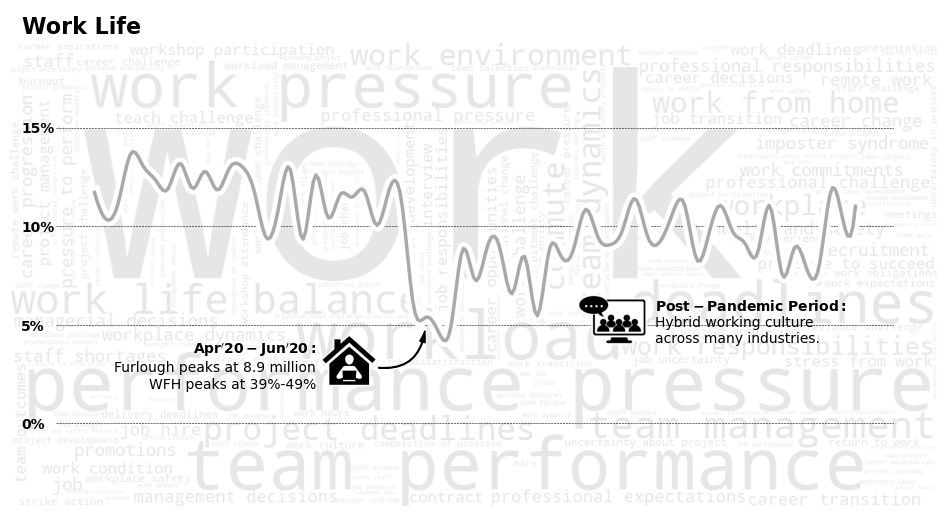



STATISTICAL ANALYSIS FOR THEME:

TESTING CUBIC SPLINE INTERPOLATION MODEL VERSUS NULL HYPOTHESIS:
Permutation p-value: 0.00640000
R² = 0.7825


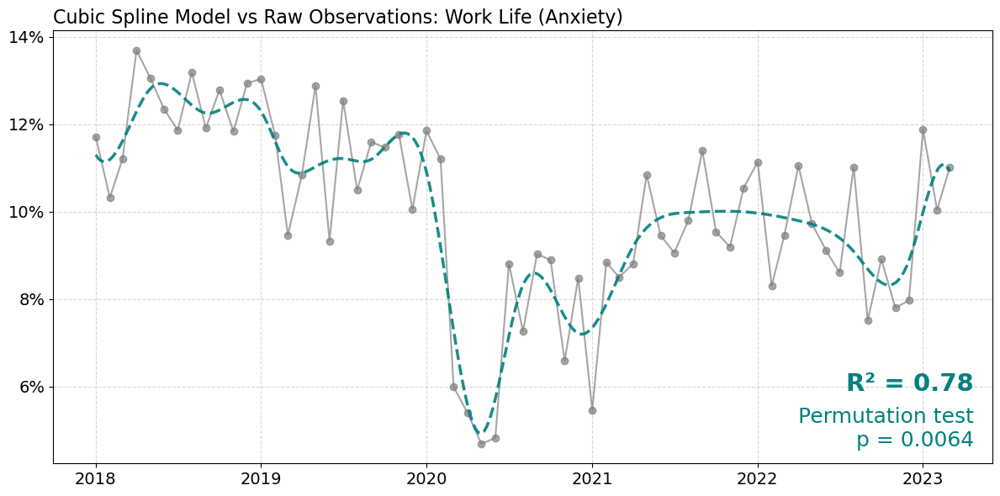


CHANGE POINT DETECTION:


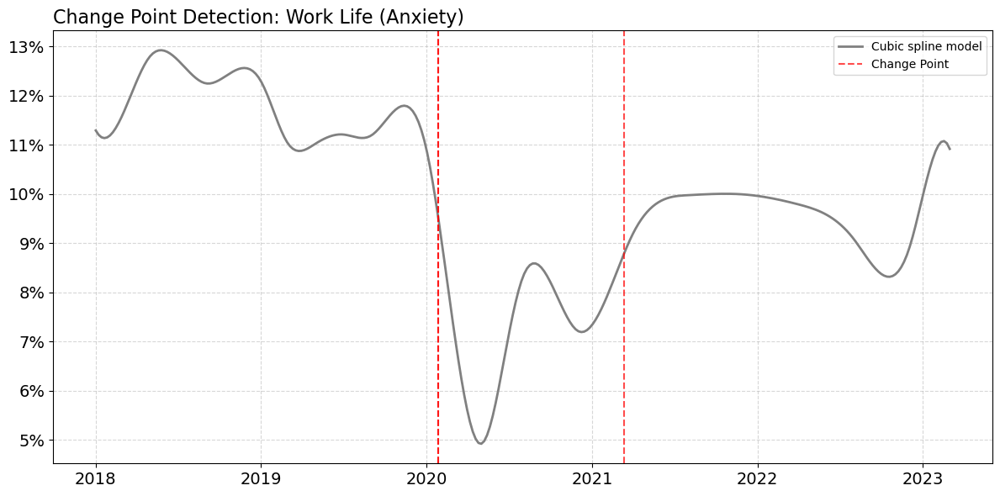


 DEFINED PERIODS
('Pre-Furlough', '2018-01', '2020-02')
('Furlough', '2020-03', '2021-01')
('Hybrid Working', '2021-02', '2023-03')


 LOGISTIC REGRESSION, T-TESTING AND GEE MODELLING 



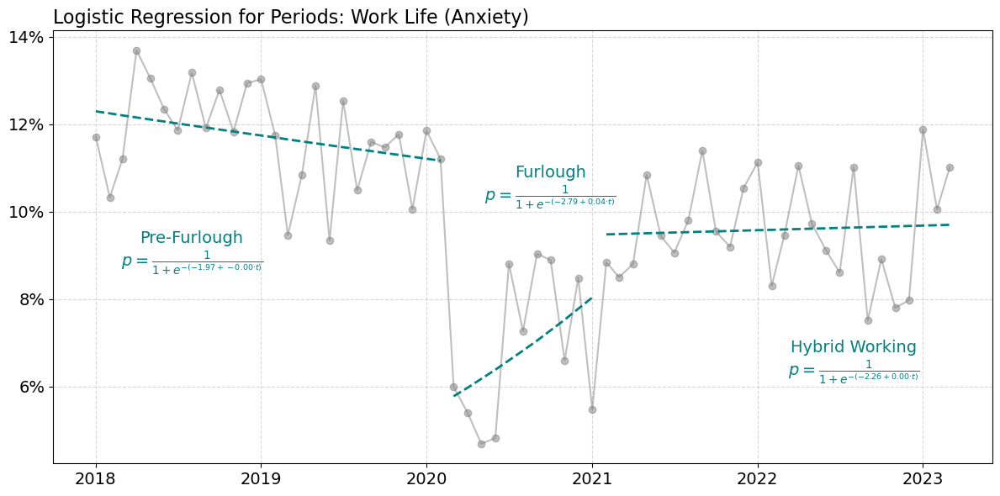



 Summary of Logistic Regression Model and Means for Periods:
           Period  Intercept     Slope  p(Intercept)  p(Slope)  Empirical Mean
0    Pre-Furlough  -1.965033 -0.004359           0.0  0.085549        0.117333
1        Furlough  -2.792436  0.035454           0.0  0.003018        0.068173
2  Hybrid Working  -2.256801  0.001012           0.0  0.743926        0.095795


T-TESTING TO ASSESS VARIATION IN MEANS BETWEEN PERIODS


Pairwise T-Test p-values using Welch's T-Test:
                Pre-Furlough      Furlough  Hybrid Working
Pre-Furlough             NaN  3.931692e-55    5.672010e-14
Furlough        3.931692e-55           NaN    3.751557e-18
Hybrid Working  5.672010e-14  3.751557e-18             NaN

  Calculation of effect size using Cohen's d:
                       Comparison  Cohen's d
0        Pre-Furlough vs Furlough   0.162241
1  Pre-Furlough vs Hybrid Working   0.069473
2      Furlough vs Hybrid Working  -0.098507


GEE MODELLING FOR EACH PERIOD



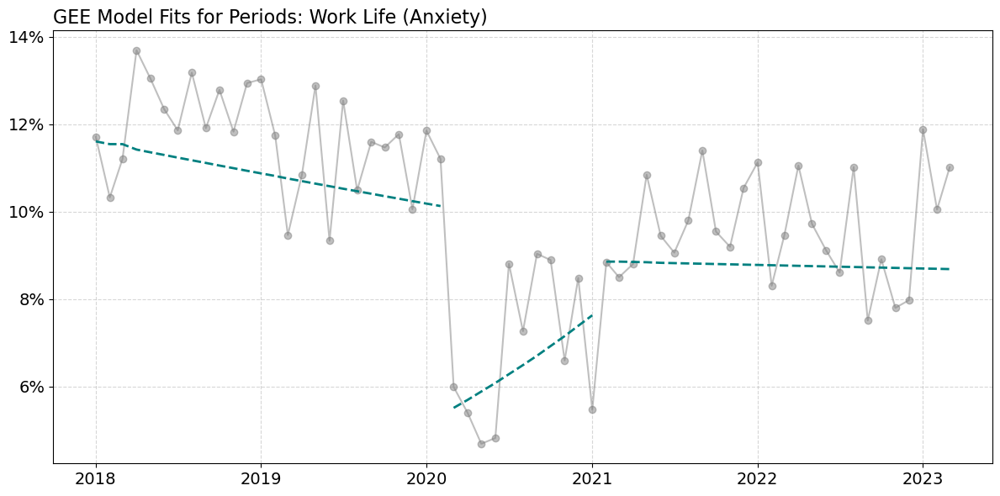


  Generalized Estimating Equations (GEE) Analysis:
           Period  GEE Slope  GEE p-value
0    Pre-Furlough  -0.006118     0.033783
1        Furlough   0.034819     0.003255
2  Hybrid Working  -0.000854     0.795168


In [395]:
### CREATE WC / LINE VIZ : ANX - WORK LIFE
## working from home stats: https://thehomeofficelife.com/blog/work-from-home-statistics
# ons: https://www.ons.gov.uk/employmentandlabourmarket/peopleinwork/employmentandemployeetypes/articles/characteristicsofhomeworkersgreatbritain/september2022tojanuary2023
# ----------> SELECT THEME --------
theme = 'Work Life'
# ---------------------------------

anx_wc_count_dict = anx_longitudinal_df[anx_longitudinal_df['theme'] == theme]['anx_topics_cleansed'].value_counts().to_dict()

## ------ Initiate a figure
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

## ------ Define a function to control colour darkness for background wc
def adjusted_grey_scale_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    max_freq = max(anx_wc_count_dict.values())  # Get max frequency for scaling
    frequency = anx_wc_count_dict.get(word, 1)
    min_darkness = 230  # Adjust this to make the lightest words darker
    darkness = int(200 * (1 - frequency / max_freq))  # Scale from black (0) to white (255)
    darkness = max(darkness, min_darkness)  # Ensure minimum darkness level
    return f"rgb({darkness}, {darkness}, {darkness})"  # Return adjusted grayscale color

## ----- Generate the word cloud with adjusted colours
# initialise wc object
wordcloud = WordCloud(
    width=1000,
    height=500,
    background_color='white',
    contour_width=1,
    max_font_size=300,
    relative_scaling=0.2,
    margin=1,
    collocations=False,
    random_state=2,
    color_func=adjusted_grey_scale_color_func
).generate_from_frequencies(anx_wc_count_dict)
# show wordcloud backgorund
ax.imshow(wordcloud)
ax.set_axis_off()

## ----- Create time series of % measure -----
# filter to theme within pivot table
theme_series = anx_pivot_table.loc[theme]
# transpose and reset index
theme_series_trans = theme_series.reset_index()
# rename columns
theme_series_trans.columns = ['year_month', 'value']
# ensure 'year_month' is a string before conversion
theme_series_trans['year_month'] = theme_series_trans['year_month'].astype(str)
# convert 'year_month' to datetime format (assuming YYYY-MM format)
theme_series_trans['year_month'] = pd.to_datetime(theme_series_trans['year_month'], format='%Y-%m')
# ensure 'value' is numeric
theme_series_trans['value'] = pd.to_numeric(theme_series_trans['value'], errors='coerce').round(2)
# create inset axes
sub_ax = inset_axes(ax, width="90%", height="70%", loc='center', borderpad=1)

## ----- Smooth the line using interpolation ----
x = theme_series_trans['year_month'].map(lambda d: d.timestamp())  # Convert datetime to numerical timestamps
y = theme_series_trans['value']
# Create interpolation function
x_smooth = np.linspace(x.min(), x.max(), 300)  # Generate more points for smooth curve

spline_viz = make_interp_spline(x, y, k=3)  # k=3 for cubic spline smoothing
spline = UnivariateSpline(x, y, k=3, s=len(x)* 1.0)  # s controls the amount of smoothing

y_smooth_viz = spline_viz(x_smooth)
y_smooth = spline(x_smooth)

# === R² CALCULATION ===
y_pred_at_x = spline(x)  # predict at original x
ss_total = np.sum((y - np.mean(y)) ** 2)
ss_res = np.sum((y - y_pred_at_x) ** 2)
r_squared = 1 - (ss_res / ss_total)

# Convert timestamps back to datetime for plotting
x_smooth_dates = pd.to_datetime(x_smooth, unit='s')
#fix y smooth
y_smooth_viz[y_smooth_viz < 0] = 0 
# plot the smooth line chart
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='white', linewidth=9, zorder=5)
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='darkgrey', linewidth=2.5, zorder=5)
# remove background from line chart
sub_ax.set_axis_off()

## ----- Display y-axis labels 
max_rate = 15
min_rate = 0
mid_rate_1 = 5
mid_rate_2 = 10

sub_ax.axhline(y=max_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=min_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=mid_rate_1, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=mid_rate_2, color='black', linestyle='--', lw=0.4)

sub_ax.text(17350, max_rate - 0.25, f"{max_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold' )
sub_ax.text(17350, min_rate - 0.25, f"{min_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')
sub_ax.text(17350, mid_rate_1 - 0.25, f"{mid_rate_1:.0f}%",
    fontsize=10, color='black', fontweight='bold')
sub_ax.text(17350, mid_rate_2 - 0.25, f"{mid_rate_2:.0f}%",
    fontsize=10, color='black', fontweight='bold')

# ----- set title
lower_bound = 1960
upper_bound = 2019
title = theme.title()
title = title.replace("And","and")

fig_text(
    0.185, 0.821,
    title, color='black',
    fontweight='bold',
    fontsize=16,
    #highlight_textprops=[{"color": 'darkred'},{"fontsize": 13,"color": 'darkgrey',"fontweight": 'normal'}],
    ha='center')

##### ICON, TEXT, ARROW 1 (furlough and wfh peak) -------------------------------------------------------------------------------------------

## ----- Display icon image(s)
# define function to load and return image
def open_image_local(path_to_image):
    image = Image.open(path_to_image) # Open the image
    image_array = np.array(image) # Convert to a numpy array
    return image_array # Output
# initialise image object from file
fur_image = open_image_local('E:/twitter_analysis_data/viz/theme_analysis/icons/anx_work_fur_png.png')
# define the position and size parameters
fur_image_xaxis = 0.37
fur_image_yaxis = 0.35
fur_image_width = 0.075
fur_image_height = 0.075
ax_fur_image = fig.add_axes([fur_image_xaxis, fur_image_yaxis, fur_image_width, fur_image_height])
# show icon
ax_fur_image.imshow(fur_image)
ax_fur_image.axis('off')  # Remove axis of the image

## ----- Icon text
sub_ax.text(
    0.31, 0.225,  # X, Y in Axes coordinates
    r"$\bf{Apr'20-Jun'20:}$" + "\nFurlough peaks at 8.9 million\nWFH peaks at 39%-49%",
    #f"Oct 2022:\nRetail Price Index\npeaks at 11.1%.",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='right',
    va='center')

## ----- Draw arrow
def draw_arrow(tail_position, head_position, invert=False):
    kw = dict(
        arrowstyle="Simple, tail_width=0.5, head_width=4, head_length=8", color="k")
    if invert:
        connectionstyle = "arc3,rad=-.5"
    else:
        connectionstyle = "arc3,rad=.5"
    a = FancyArrowPatch(tail_position, head_position,
                        connectionstyle=connectionstyle,
                        transform=fig.transFigure,
                        **kw)
    fig.patches.append(a)
draw_arrow((0.43, 0.38), (0.471, 0.429))

##### ICON, TEXT, ARROW 2 (cost of living payment) -------------------------------------------------------------------------------------------

## ----- Display icon image(s)
# define function to load and return image
def open_image_local(path_to_image):
    image = Image.open(path_to_image) # Open the image
    image_array = np.array(image) # Convert to a numpy array
    return image_array # Output
# initialise image object from file
hybrid_image = open_image_local('E:/twitter_analysis_data/viz/theme_analysis/icons/anx_work_hybrid_png.png')
# define the position and size parameters
hybrid_image_xaxis = 0.59
hybrid_image_yaxis = 0.403
hybrid_image_width = 0.075
hybrid_image_height = 0.075
ax_hybrid_image = fig.add_axes([hybrid_image_xaxis, hybrid_image_yaxis, hybrid_image_width, hybrid_image_height])
# show icon
ax_hybrid_image.imshow(hybrid_image)
ax_hybrid_image.axis('off')  # Remove axis of the image

## ----- Icon text
sub_ax.text(
    0.715, 0.359,  # X, Y in Axes coordinates
    r"$\bf{Post-Pandemic\ Period:}$" + "\nHybrid working culture\nacross many industries.",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='left',
    va='center')

## ----- Draw arrow
def draw_arrow(tail_position, head_position, invert=False):
    kw = dict(
        arrowstyle="Simple, tail_width=0.5, head_width=4, head_length=8", color="k")
    if invert:
        connectionstyle = "arc3,rad=-.5"
    else:
        connectionstyle = "arc3,rad=.5"
    a = FancyArrowPatch(tail_position, head_position,
                        connectionstyle=connectionstyle,
                        transform=fig.transFigure,
                        **kw)
    fig.patches.append(a)
#draw_arrow((0.62, 0.62), (0.555, 0.5325))

# --------------------------------------------------------------------------------------------------
## ------ Save figure
save_path = 'E:/twitter_analysis_data/viz/theme_analysis/wc_line_detail/'
plt.savefig(save_path + "anx " + theme + '.png', bbox_inches='tight', pad_inches=0.15)

## ------ Show figure 
plt.show()


################################################# S T A T I S T I C A L   A N A L Y S I S ##########################################

p1 = "Pre-Furlough"
p2 = "Furlough"
p3 = "Hybrid Working"

stat_analysis_for_theme(
    anx_or_hap = "Anxiety",
    input_dataframe=anx_stat_sig_df,
    theme=theme,
    periods=[
        (p1, "2018-01", "2020-02"),
        (p2, "2020-03", "2021-01"),
        (p3, "2021-02", "2023-03"),
    ],
    logit_text_positions={
        p1: (0.3, 0.085),
        p2: (0.655, 0.1),
        p3: (0.7, 0.06)
    },
    gee_text_positions={
        p1: 0.05,
        p2: 0.05,
        p3: 0.05
    },
    line_color_data="grey",
    r_p_pos = (0.98, 0.21)
)



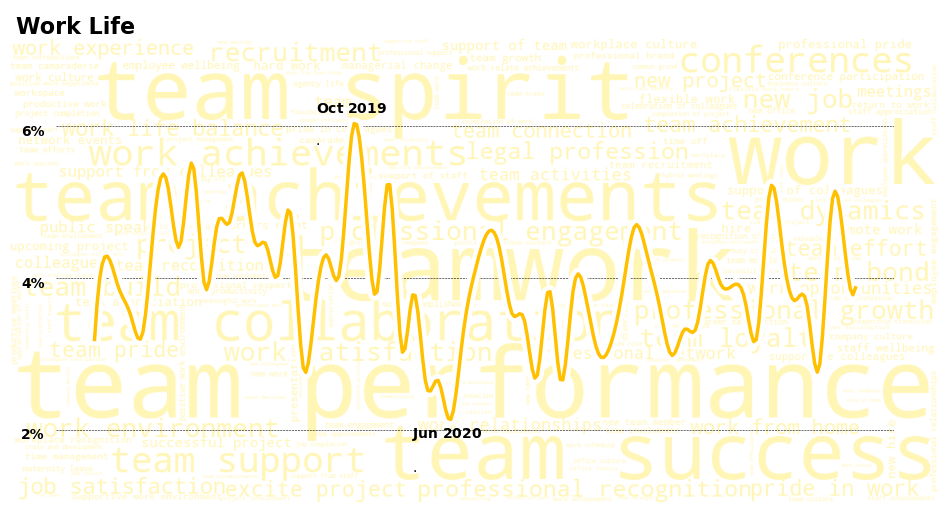

In [397]:
### CREATE WC / LINE VIZ : HAP - WORK LIFE

# ----------> SELECT THEME --------
theme = 'Work Life'
# ---------------------------------

hap_longitudinal_df.loc[:,'hap_topics_cleansed'] = [s.replace('celebrations','celebration') for s in hap_longitudinal_df['hap_topics_cleansed']]

hap_wc_count_dict = hap_longitudinal_df[hap_longitudinal_df['theme'] == theme]['hap_topics_cleansed'].value_counts().to_dict()

## ------ Initiate a figure
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

## ------ Define a function to control colour darkness for background wc
# Define a light version of #FFC000 — you can tweak this RGB as desired
light_yellow_rgb = (255, 245, 180)  # lighter tint of #FFC000

def constant_light_yellow_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    r, g, b = light_yellow_rgb
    return f"rgb({r}, {g}, {b})"

## ----- Generate the word cloud with adjusted colours
# initialise wc object
wordcloud = WordCloud(
    width=1000,
    height=500,
    background_color='white',
    contour_width=1,
    max_font_size=300,
    relative_scaling=0.2,
    margin=1,
    collocations=False,
    random_state=11,               
    color_func=constant_light_yellow_color_func
).generate_from_frequencies(hap_wc_count_dict)
# show wordcloud backgorund
ax.imshow(wordcloud)
ax.set_axis_off()

## ----- Create time series of % measure -----
# filter to theme within pivot table
theme_series = hap_pivot_table.loc[theme]
# transpose and reset index
theme_series_trans = theme_series.reset_index()
# rename columns
theme_series_trans.columns = ['year_month', 'value']
# ensure 'year_month' is a string before conversion
theme_series_trans['year_month'] = theme_series_trans['year_month'].astype(str)
# convert 'year_month' to datetime format (assuming YYYY-MM format)
theme_series_trans['year_month'] = pd.to_datetime(theme_series_trans['year_month'], format='%Y-%m')
# ensure 'value' is numeric
theme_series_trans['value'] = pd.to_numeric(theme_series_trans['value'], errors='coerce').round(2)
# create inset axes
sub_ax = inset_axes(ax, width="90%", height="70%", loc='center', borderpad=1)

## ----- Smooth the line using interpolation ----
x = theme_series_trans['year_month'].map(lambda d: d.timestamp())  # Convert datetime to numerical timestamps
y = theme_series_trans['value']
# Create interpolation function
x_smooth = np.linspace(x.min(), x.max(), 300)  # Generate more points for smooth curve

spline_viz = make_interp_spline(x, y, k=3)  # k=3 for cubic spline smoothing
spline = UnivariateSpline(x, y, k=3, s=len(x)* 1.0)  # s controls the amount of smoothing

y_smooth_viz = spline_viz(x_smooth)
y_smooth = spline(x_smooth)

# === R² CALCULATION ===
y_pred_at_x = spline(x)  # predict at original x
ss_total = np.sum((y - np.mean(y)) ** 2)
ss_res = np.sum((y - y_pred_at_x) ** 2)
r_squared = 1 - (ss_res / ss_total)

# Convert timestamps back to datetime for plotting
x_smooth_dates = pd.to_datetime(x_smooth, unit='s')
#fix y smooth
y_smooth[y_smooth < 0] = 0 
# plot the smooth line chart
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='white', linewidth=9, zorder=5)
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='#FFC000', linewidth=2.5, zorder=5)
# remove background from line chart
sub_ax.set_axis_off()

## ----- Display y-axis labels 
max_rate = 6
min_rate = 2
mid_rate = 4
sub_ax.axhline(y=max_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=min_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=mid_rate, color='black', linestyle='--', lw=0.4)

sub_ax.text(17350, max_rate - 0.125, f"{max_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold' )
sub_ax.text(17350, min_rate - 0.125, f"{min_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')
sub_ax.text(17350, mid_rate - 0.125, f"{mid_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')

# ----- set title
lower_bound = 1960
upper_bound = 2019
title = theme.title()
title = title.replace("And","and")

fig_text(
    0.18, 0.815,
    title, color='black',
    fontweight='bold',
    fontsize=16,
    #highlight_textprops=[{"color": 'darkred'},{"fontsize": 13,"color": 'darkgrey',"fontweight": 'normal'}],
    ha='center')

##### TEXT 1 (June 20) -------------------------------------------------------------------------------------------

## ----- Icon text
sub_ax.text(
    0.31, 0.95,  # X, Y in Axes coordinates
    r"$\bf{Oct\ 2019}$" + "\n\n.",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='left',
    va='center')

sub_ax.text(
    0.425, -0.05,  # X, Y in Axes coordinates
    r"$\bf{Jun\ 2020}$" + "\n\n.",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='left',
    va='center')

# --------------------------------------------------------------------------------------------------
## ------ Save figure
save_path = 'E:/twitter_analysis_data/viz/theme_analysis/wc_line_detail/'
plt.savefig(save_path + "hap " + theme + '.png', bbox_inches='tight', pad_inches=0.15)

## ------ Show figure 
plt.show()

### Public Services (Anxiety and Happiness)

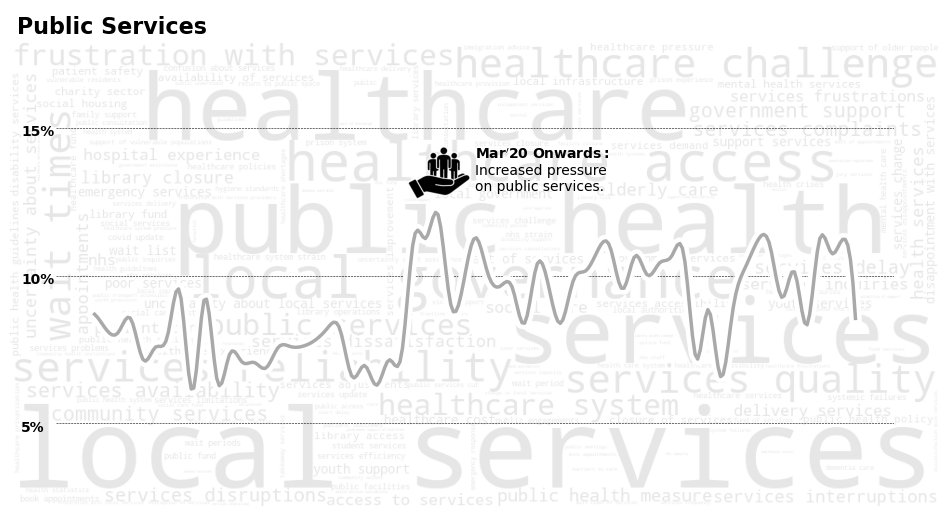



STATISTICAL ANALYSIS FOR THEME:

TESTING CUBIC SPLINE INTERPOLATION MODEL VERSUS NULL HYPOTHESIS:
Permutation p-value: 0.00000000
R² = 0.7913


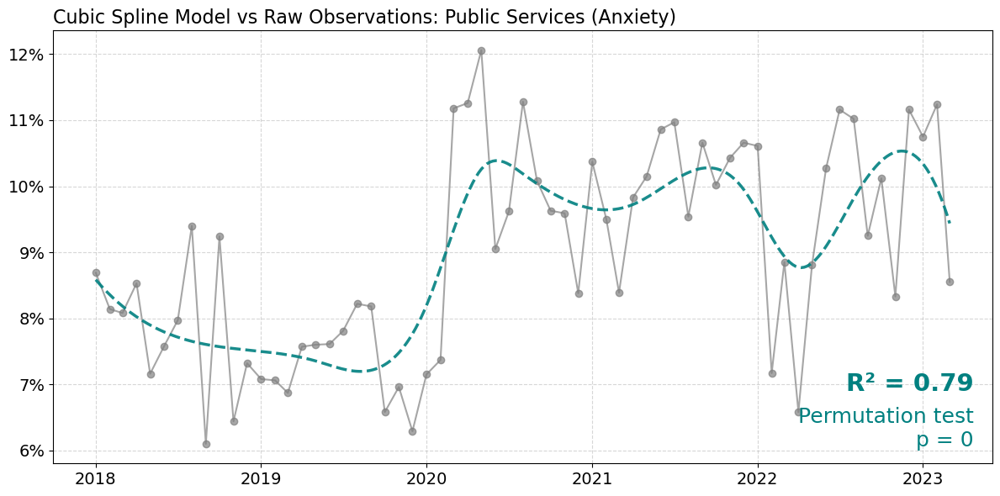


CHANGE POINT DETECTION:


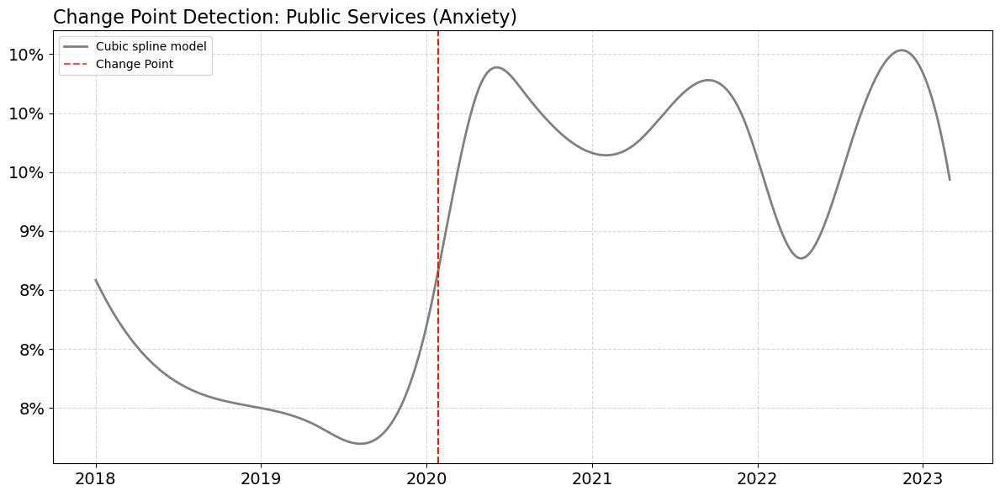


 DEFINED PERIODS
('Pre-2020', '2018-01', '2020-02')
('2020 Onwards', '2020-03', '2023-03')


 LOGISTIC REGRESSION, T-TESTING AND GEE MODELLING 



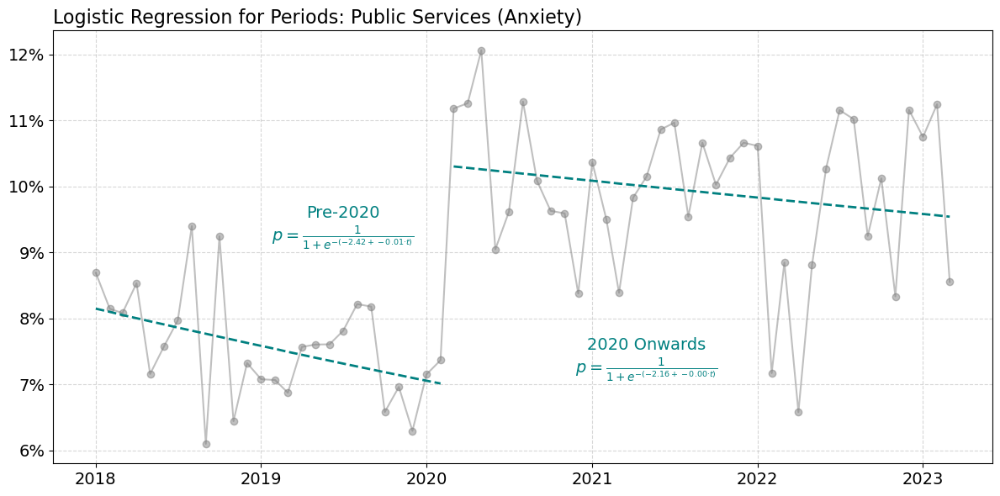



 Summary of Logistic Regression Model and Means for Periods:
         Period  Intercept     Slope  p(Intercept)  p(Slope)  Empirical Mean
0      Pre-2020  -2.422583 -0.006490           0.0  0.035367        0.075793
1  2020 Onwards  -2.164098 -0.002368           0.0  0.181331        0.099457


T-TESTING TO ASSESS VARIATION IN MEANS BETWEEN PERIODS


Pairwise T-Test p-values using Welch's T-Test:
                  Pre-2020  2020 Onwards
Pre-2020               NaN  1.009595e-23
2020 Onwards  1.009595e-23           NaN

  Calculation of effect size using Cohen's d:
                 Comparison  Cohen's d
0  Pre-2020 vs 2020 Onwards  -0.083301


GEE MODELLING FOR EACH PERIOD



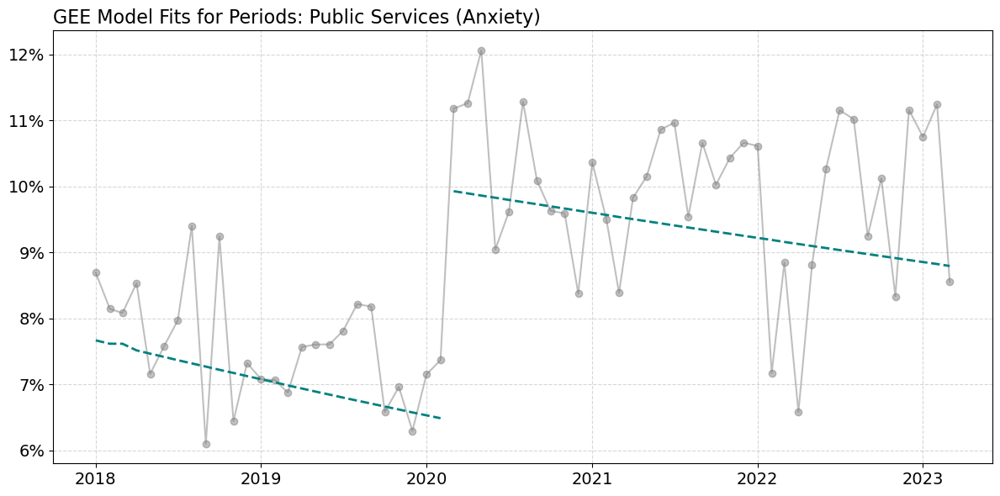


  Generalized Estimating Equations (GEE) Analysis:
         Period  GEE Slope  GEE p-value
0      Pre-2020  -0.007192     0.042439
1  2020 Onwards  -0.003716     0.077180


In [390]:
### CREATE WC / LINE VIZ : ANX - PUBLIC SERVICES
## war in ukraine timeline: https://researchbriefings.files.parliament.uk/documents/CBP-9847/CBP-9847.pdf

# ----------> SELECT THEME --------
theme = 'Public Services'
# ---------------------------------

anx_wc_count_dict = anx_longitudinal_df[anx_longitudinal_df['theme'] == theme]['anx_topics_cleansed'].value_counts().to_dict()

## ------ Initiate a figure
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

## ------ Define a function to control colour darkness for background wc
def adjusted_grey_scale_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    max_freq = max(anx_wc_count_dict.values())  # Get max frequency for scaling
    frequency = anx_wc_count_dict.get(word, 1)
    min_darkness = 230  # Adjust this to make the lightest words darker
    darkness = int(200 * (1 - frequency / max_freq))  # Scale from black (0) to white (255)
    darkness = max(darkness, min_darkness)  # Ensure minimum darkness level
    return f"rgb({darkness}, {darkness}, {darkness})"  # Return adjusted grayscale color

## ----- Generate the word cloud with adjusted colours
# initialise wc object
wordcloud = WordCloud(
    width=1000,
    height=500,
    background_color='white',
    contour_width=1,
    max_font_size=300,
    relative_scaling=0.2,
    margin=1,
    collocations=False,
    random_state=2,
    color_func=adjusted_grey_scale_color_func
).generate_from_frequencies(anx_wc_count_dict)
# show wordcloud backgorund
ax.imshow(wordcloud)
ax.set_axis_off()

## ----- Create time series of % measure -----
# filter to theme within pivot table
theme_series = anx_pivot_table.loc[theme]
# transpose and reset index
theme_series_trans = theme_series.reset_index()
# rename columns
theme_series_trans.columns = ['year_month', 'value']
# ensure 'year_month' is a string before conversion
theme_series_trans['year_month'] = theme_series_trans['year_month'].astype(str)
# convert 'year_month' to datetime format (assuming YYYY-MM format)
theme_series_trans['year_month'] = pd.to_datetime(theme_series_trans['year_month'], format='%Y-%m')
# ensure 'value' is numeric
theme_series_trans['value'] = pd.to_numeric(theme_series_trans['value'], errors='coerce').round(2)
# create inset axes
sub_ax = inset_axes(ax, width="90%", height="70%", loc='center', borderpad=1)

## ----- Smooth the line using interpolation ----
x = theme_series_trans['year_month'].map(lambda d: d.timestamp())  # Convert datetime to numerical timestamps
y = theme_series_trans['value']
# Create interpolation function

x_smooth = np.linspace(x.min(), x.max(), 300)  # Generate more points for smooth curve

spline_viz = make_interp_spline(x, y, k=3)  # k=3 for cubic spline smoothing
spline = UnivariateSpline(x, y, k=3, s=len(x)* 1.0)  # s controls the amount of smoothing

y_smooth_viz = spline_viz(x_smooth)
y_smooth = spline(x_smooth)

# Convert timestamps back to datetime for plotting
x_smooth_dates = pd.to_datetime(x_smooth, unit='s')
#fix y smooth
y_smooth[y_smooth < 0] = 0 
# plot the smooth line chart
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='white', linewidth=9, zorder=5)
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='darkgrey', linewidth=2.5, zorder=5)
# remove background from line chart
sub_ax.set_axis_off()

## ----- Display y-axis labels 
max_rate = 15
min_rate = 5
mid_rate = 10
sub_ax.axhline(y=max_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=min_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=mid_rate, color='black', linestyle='--', lw=0.4)
sub_ax.text(17350, max_rate - 0.25, f"{max_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold' )
sub_ax.text(17350, min_rate - 0.25, f"{min_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')
sub_ax.text(17350, mid_rate - 0.25, f"{mid_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')

# ----- set title
lower_bound = 1960
upper_bound = 2019
title = theme.title()
title = title.replace("And","and")

fig_text(
    0.21, 0.821,
    title, color='black',
    fontweight='bold',
    fontsize=16,
    #highlight_textprops=[{"color": 'darkred'},{"fontsize": 13,"color": 'darkgrey',"fontweight": 'normal'}],
    ha='center')



##### ICON, TEXT, ARROW 1 (invasion of ukraine) -------------------------------------------------------------------------------------------

## ----- Display icon image(s)
# define function to load and return image
def open_image_local(path_to_image):
    image = Image.open(path_to_image) # Open the image
    image_array = np.array(image) # Convert to a numpy array
    return image_array # Output
# initialise image object from file
pub_image = open_image_local('E:/twitter_analysis_data/viz/theme_analysis/icons/anx_pub_png.png')
# define the position and size parameters
pub_image_xaxis = 0.445
pub_image_yaxis = 0.585
pub_image_width = 0.075
pub_image_height = 0.075
ax_pub_image = fig.add_axes([pub_image_xaxis, pub_image_yaxis, pub_image_width, pub_image_height])
# show icon
ax_pub_image.imshow(pub_image)
ax_pub_image.axis('off')  # Remove axis of the image

## ----- Icon text
sub_ax.text(
    0.5, 0.826,  # X, Y in Axes coordinates
    r"$\bf{Mar'20\ Onwards:}$" + "\nIncreased pressure\non public services.",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='left',
    va='center')

## ----- Draw arrow
def draw_arrow(tail_position, head_position, invert=True):
    kw = dict(
        arrowstyle="Simple, tail_width=0.5, head_width=4, head_length=8", color="k")
    if invert:
        connectionstyle = "arc3,rad=-.5"
    else:
        connectionstyle = "arc3,rad=.5"
    a = FancyArrowPatch(tail_position, head_position,
                        connectionstyle=connectionstyle,
                        transform=fig.transFigure,
                        **kw)
    fig.patches.append(a)
#draw_arrow((0.62, 0.61), (0.702, 0.582))


# --------------------------------------------------------------------------------------------------
## ------ Save figure
save_path = 'E:/twitter_analysis_data/viz/theme_analysis/wc_line_detail/'
plt.savefig(save_path + "anx " + theme + '.png', bbox_inches='tight', pad_inches=0.15)

## ------ Show figure 
plt.show()

################################################# S T A T I S T I C A L   A N A L Y S I S ##########################################

p1 = "Pre-2020"
p2 = "2020 Onwards"

stat_analysis_for_theme(
    anx_or_hap = "Anxiety",
    input_dataframe=anx_stat_sig_df,
    theme=theme,
    periods=[
        (p1, "2018-01", "2020-02"),
        (p2, "2020-03", "2023-03"),
    ],
    logit_text_positions={
        p1: (0.7, 0.09),
        p2: (0.4, 0.07),
    },
    gee_text_positions={
        p1: 0.05,
        p2: 0.05,
    },
    line_color_data="grey",
    r_p_pos = (0.98, 0.21)
)



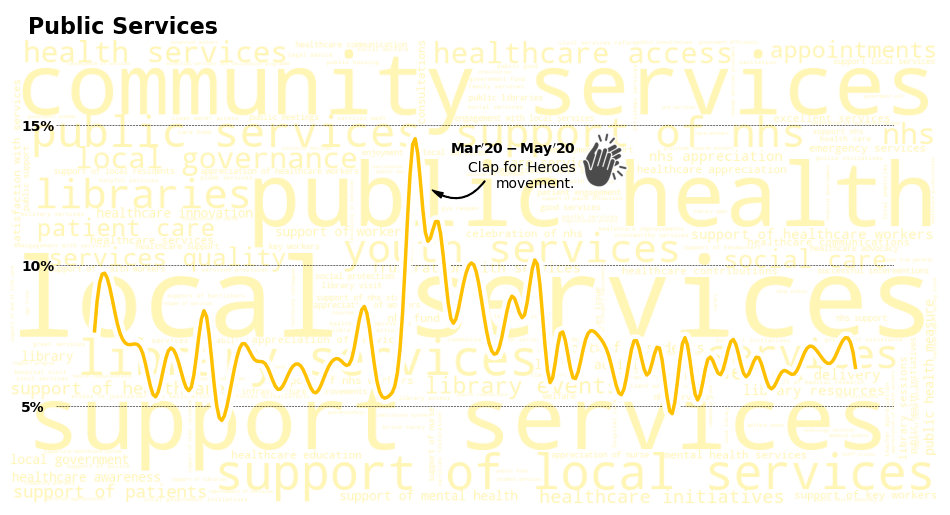



STATISTICAL ANALYSIS FOR THEME:

TESTING CUBIC SPLINE INTERPOLATION MODEL VERSUS NULL HYPOTHESIS:
Permutation p-value: 0.00040000
R² = 0.7913


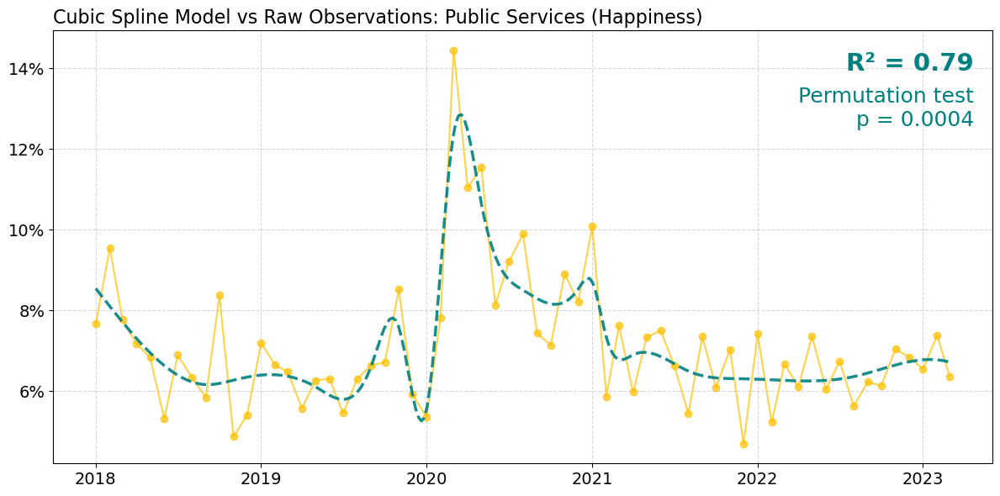


CHANGE POINT DETECTION:


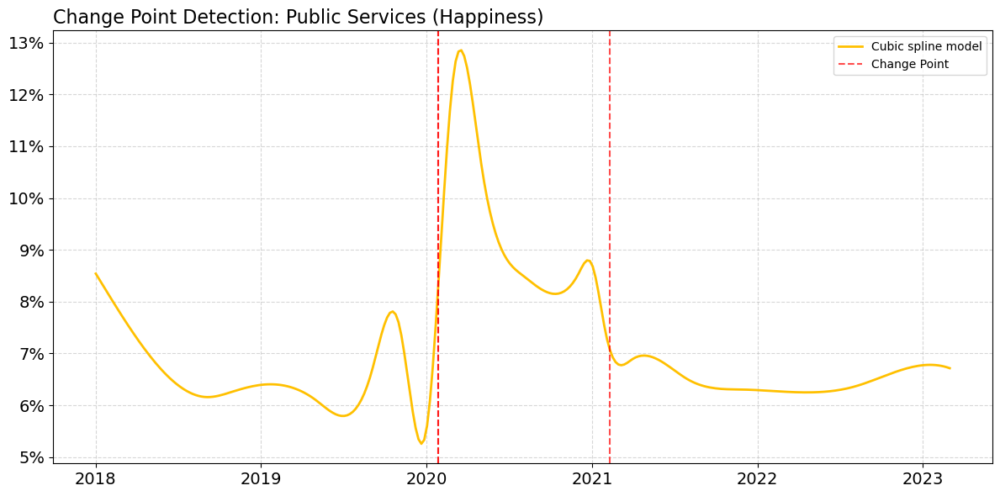


 DEFINED PERIODS
('Pre-pandemic', '2018-01', '2020-02')
('Pandemic', '2020-03', '2021-12')
('Post-Pandemic', '2022-01', '2023-03')


 LOGISTIC REGRESSION, T-TESTING AND GEE MODELLING 



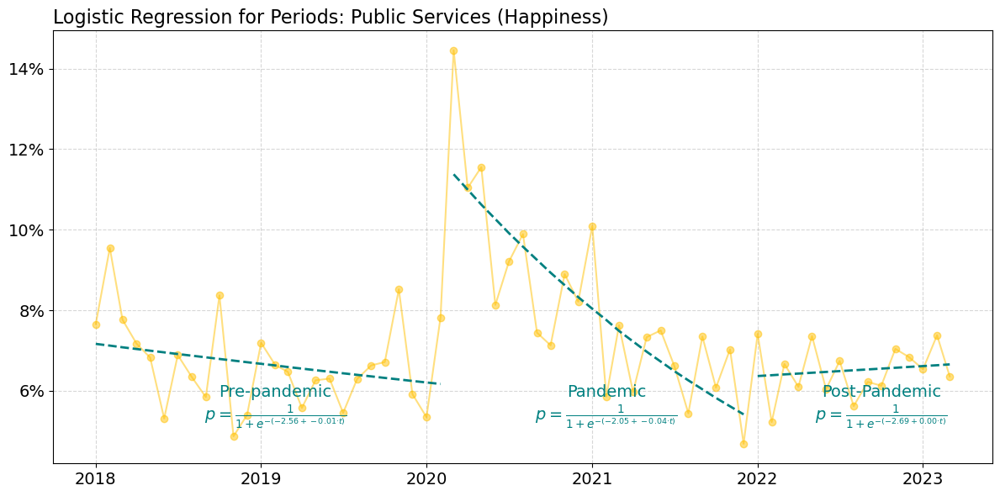



 Summary of Logistic Regression Model and Means for Periods:
          Period  Intercept     Slope  p(Intercept)      p(Slope)  \
0   Pre-pandemic  -2.561606 -0.006404           0.0  3.475340e-02   
1       Pandemic  -2.052964 -0.038435           0.0  1.530059e-22   
2  Post-Pandemic  -2.688178  0.003391           0.0  6.754120e-01   

   Empirical Mean  
0        0.066688  
1        0.081779  
2        0.065052  


T-TESTING TO ASSESS VARIATION IN MEANS BETWEEN PERIODS


Pairwise T-Test p-values using Welch's T-Test:
               Pre-pandemic      Pandemic  Post-Pandemic
Pre-pandemic            NaN  8.468101e-11   5.272002e-01
Pandemic       8.468101e-11           NaN   3.594913e-09
Post-Pandemic  5.272002e-01  3.594913e-09            NaN

  Calculation of effect size using Cohen's d:
                      Comparison  Cohen's d
0       Pre-pandemic vs Pandemic  -0.058015
1  Pre-pandemic vs Post-Pandemic   0.006580
2      Pandemic vs Post-Pandemic   0.063299


GEE MODELLING FOR EAC

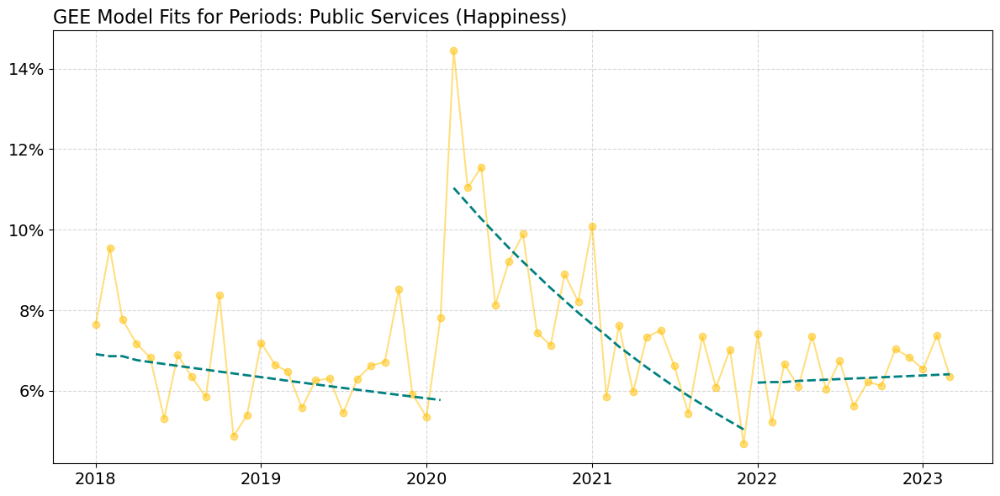


  Generalized Estimating Equations (GEE) Analysis:
          Period  GEE Slope   GEE p-value
0   Pre-pandemic  -0.007674  1.579190e-02
1       Pandemic  -0.040411  2.974285e-18
2  Post-Pandemic   0.002531  7.549111e-01


In [391]:
### CREATE WC / LINE VIZ : HAP - PUBLIC SERVICES

# ----------> SELECT THEME --------
theme = 'Public Services'
# ---------------------------------

hap_longitudinal_df.loc[:,'hap_topics_cleansed'] = [s.replace('celebrations','celebration') for s in hap_longitudinal_df['hap_topics_cleansed']]

hap_wc_count_dict = hap_longitudinal_df[hap_longitudinal_df['theme'] == theme]['hap_topics_cleansed'].value_counts().to_dict()

## ------ Initiate a figure
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

## ------ Define a function to control colour darkness for background wc
# Define a light version of #FFC000 — you can tweak this RGB as desired
light_yellow_rgb = (255, 245, 180)  # lighter tint of #FFC000

def constant_light_yellow_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    r, g, b = light_yellow_rgb
    return f"rgb({r}, {g}, {b})"

## ----- Generate the word cloud with adjusted colours
# initialise wc object
wordcloud = WordCloud(
    width=1000,
    height=500,
    background_color='white',
    contour_width=1,
    max_font_size=300,
    relative_scaling=0.2,
    margin=1,
    collocations=False,
    random_state=11,               
    color_func=constant_light_yellow_color_func
).generate_from_frequencies(hap_wc_count_dict)
# show wordcloud backgorund
ax.imshow(wordcloud)
ax.set_axis_off()

## ----- Create time series of % measure -----
# filter to theme within pivot table
theme_series = hap_pivot_table.loc[theme]
# transpose and reset index
theme_series_trans = theme_series.reset_index()
# rename columns
theme_series_trans.columns = ['year_month', 'value']
# ensure 'year_month' is a string before conversion
theme_series_trans['year_month'] = theme_series_trans['year_month'].astype(str)
# convert 'year_month' to datetime format (assuming YYYY-MM format)
theme_series_trans['year_month'] = pd.to_datetime(theme_series_trans['year_month'], format='%Y-%m')
# ensure 'value' is numeric
theme_series_trans['value'] = pd.to_numeric(theme_series_trans['value'], errors='coerce').round(2)
# create inset axes
sub_ax = inset_axes(ax, width="90%", height="70%", loc='center', borderpad=1)

## ----- Smooth the line using interpolation ----
x = theme_series_trans['year_month'].map(lambda d: d.timestamp())  # Convert datetime to numerical timestamps
y = theme_series_trans['value']
# Create interpolation function
x_smooth = np.linspace(x.min(), x.max(), 300)  # Generate more points for smooth curve

spline_viz = make_interp_spline(x, y, k=3)  # k=3 for cubic spline smoothing
spline = UnivariateSpline(x, y, k=3, s=len(x)* 0.75)  # s controls the amount of smoothing

y_smooth_viz = spline_viz(x_smooth)
y_smooth = spline(x_smooth)

# Convert timestamps back to datetime for plotting
x_smooth_dates = pd.to_datetime(x_smooth, unit='s')
#fix y smooth
y_smooth[y_smooth < 0] = 0 
# plot the smooth line chart
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='white', linewidth=9, zorder=5)
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='#FFC000', linewidth=2.5, zorder=5)
# remove background from line chart
sub_ax.set_axis_off()

## ----- Display y-axis labels 
max_rate = 15
min_rate = 5
mid_rate = 10
sub_ax.axhline(y=max_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=min_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=mid_rate, color='black', linestyle='--', lw=0.4)
sub_ax.text(17350, max_rate - 0.2, f"{max_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold' )
sub_ax.text(17350, min_rate - 0.2, f"{min_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')
sub_ax.text(17350, mid_rate - 0.2, f"{mid_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')


# ----- set title
lower_bound = 1960
upper_bound = 2019
title = theme.title()
title = title.replace("And","and")

fig_text(
    0.219, 0.817,
    title, color='black',
    fontweight='bold',
    fontsize=16,
    #highlight_textprops=[{"color": 'darkred'},{"fontsize": 13,"color": 'darkgrey',"fontweight": 'normal'}],
    ha='center')

##### ICON, TEXT, ARROW 2 (cost of living payment) -------------------------------------------------------------------------------------------

## ----- Display icon image(s)
# define function to load and return image
def open_image_local(path_to_image):
    image = Image.open(path_to_image) # Open the image
    image_array = np.array(image) # Convert to a numpy array
    return image_array # Output
# initialise image object from file
ld_nov_image = open_image_local('E:/twitter_analysis_data/viz/theme_analysis/icons/hap_pub_clap_png.png')
# define the position and size parameters
ld_nov_image_xaxis = 0.58
ld_nov_image_yaxis = 0.595
ld_nov_image_width = 0.08
ld_nov_image_height = 0.08
ax_ld_nov_image = fig.add_axes([ld_nov_image_xaxis, ld_nov_image_yaxis, ld_nov_image_width, ld_nov_image_height])
# show icon
ax_ld_nov_image.imshow(ld_nov_image)
ax_ld_nov_image.axis('off')  # Remove axis of the image

## ----- Icon text
sub_ax.text(
    0.62, 0.83,  # X, Y in Axes coordinates
    r"$\bf{Mar'20-May'20}$" + "\nClap for Heroes\nmovement.",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='right',
    va='center')

## ----- Draw arrow
def draw_arrow(tail_position, head_position, invert=True):
    kw = dict(
        arrowstyle="Simple, tail_width=0.5, head_width=4, head_length=8", color="k")
    if invert:
        connectionstyle = "arc3,rad=-.5"
    else:
        connectionstyle = "arc3,rad=.5"
    a = FancyArrowPatch(tail_position, head_position,
                        connectionstyle=connectionstyle,
                        transform=fig.transFigure,
                        **kw)
    fig.patches.append(a)
draw_arrow((0.522, 0.612), (0.475, 0.6))

# --------------------------------------------------------------------------------------------------
## ------ Save figure
save_path = 'E:/twitter_analysis_data/viz/theme_analysis/wc_line_detail/'
plt.savefig(save_path + "hap " + theme + '.png', bbox_inches='tight', pad_inches=0.15)

## ------ Show figure 
plt.show()


################################################# S T A T I S T I C A L   A N A L Y S I S ##########################################

p1 = "Pre-pandemic"
p2 = "Pandemic"
p3 = "Post-Pandemic"

stat_analysis_for_theme(
    anx_or_hap = "Happiness",
    input_dataframe=hap_stat_sig_df,
    theme=theme,
    periods=[
        (p1, "2018-01", "2020-02"),
        (p2, "2020-03", "2021-12"),
        (p3, "2022-01", "2023-03")
    ],
    logit_text_positions={
        p1: (0.5, 0.05),
        p2: (0.5, 0.05),
        p3: (0.655, 0.05)
    },
    gee_text_positions={
        p1: 0.05,
        p3: 0.05,
        p3: 0.05
    },
    line_color_data='#FFC000',
    r_p_pos = (0.98, 0.95)
)

### Safety and Crime (Anxiety)

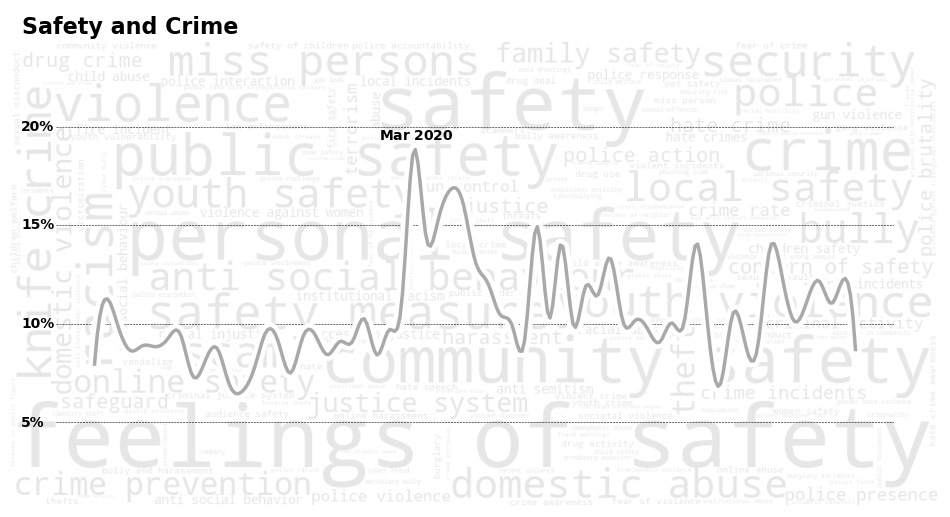



STATISTICAL ANALYSIS FOR THEME:

TESTING CUBIC SPLINE INTERPOLATION MODEL VERSUS NULL HYPOTHESIS:
Permutation p-value: 0.01470000
R² = 0.8403


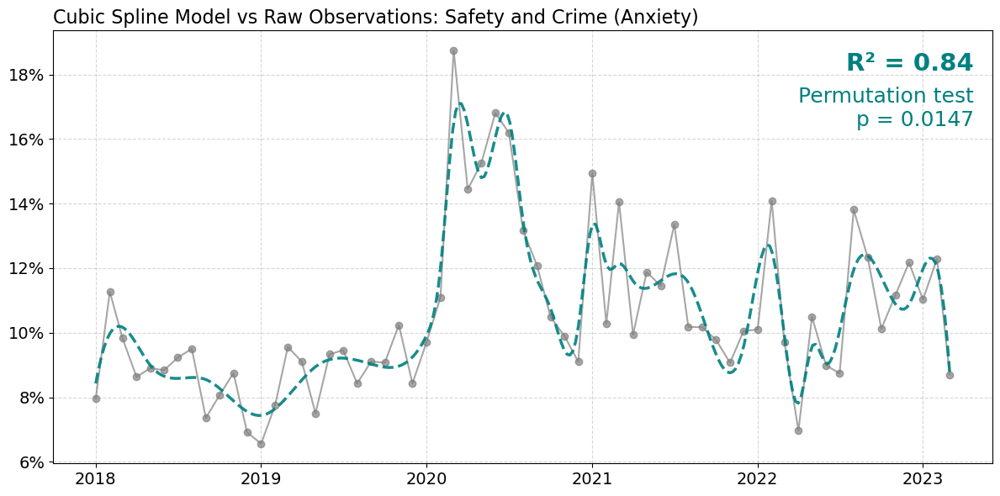


CHANGE POINT DETECTION:


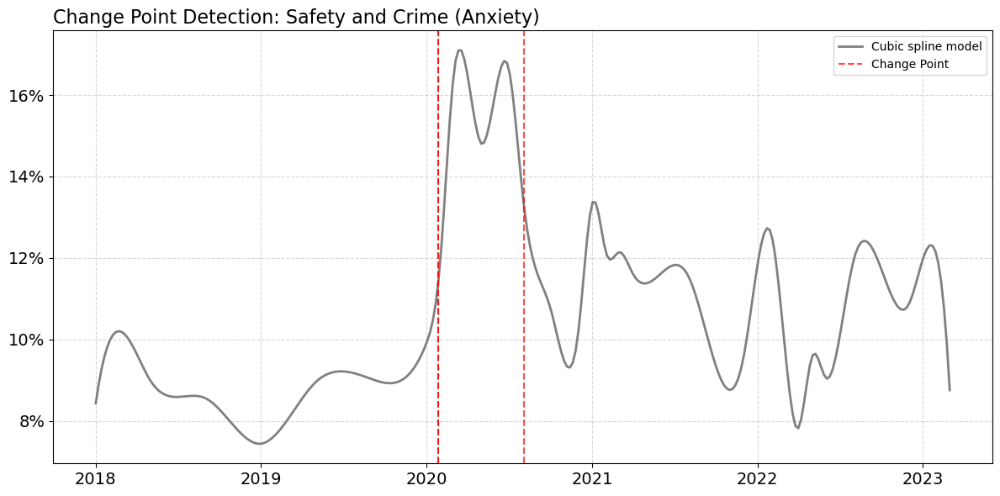


 DEFINED PERIODS
('2018-2019', '2018-01', '2019-12')
('2020', '2020-01', '2020-12')
('2021 Onwards', '2021-01', '2023-03')


 LOGISTIC REGRESSION, T-TESTING AND GEE MODELLING 



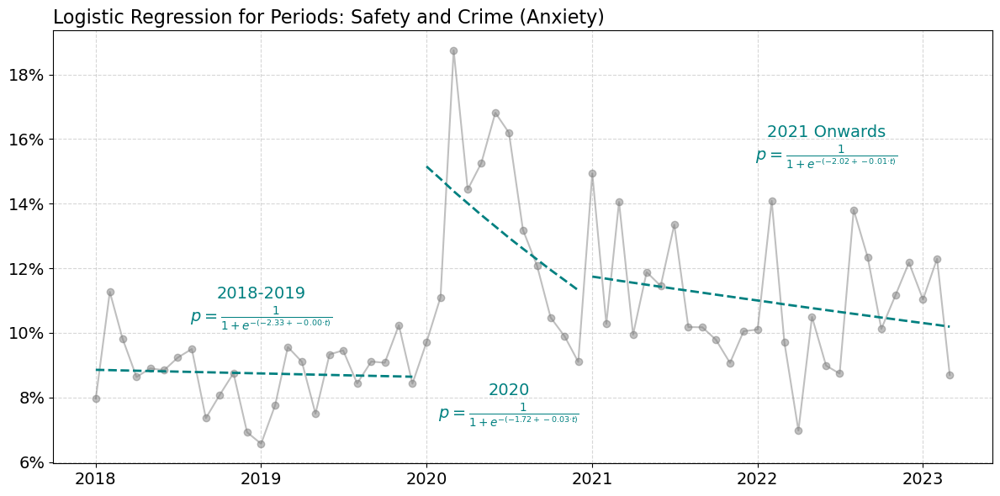



 Summary of Logistic Regression Model and Means for Periods:
         Period  Intercept     Slope   p(Intercept)  p(Slope)  Empirical Mean
0     2018-2019  -2.331593 -0.001164   0.000000e+00  0.720040        0.087492
1          2020  -1.722683 -0.030536  1.160669e-271  0.000111        0.131920
2  2021 Onwards  -2.017268 -0.006118   0.000000e+00  0.028853        0.109898


T-TESTING TO ASSESS VARIATION IN MEANS BETWEEN PERIODS


Pairwise T-Test p-values using Welch's T-Test:
                 2018-2019          2020  2021 Onwards
2018-2019              NaN  6.620132e-35  1.546598e-15
2020          6.620132e-35           NaN  5.283883e-09
2021 Onwards  1.546598e-15  5.283883e-09           NaN

  Calculation of effect size using Cohen's d:
                  Comparison  Cohen's d
0          2018-2019 vs 2020  -0.147046
1  2018-2019 vs 2021 Onwards  -0.075412
2       2020 vs 2021 Onwards   0.068352


GEE MODELLING FOR EACH PERIOD



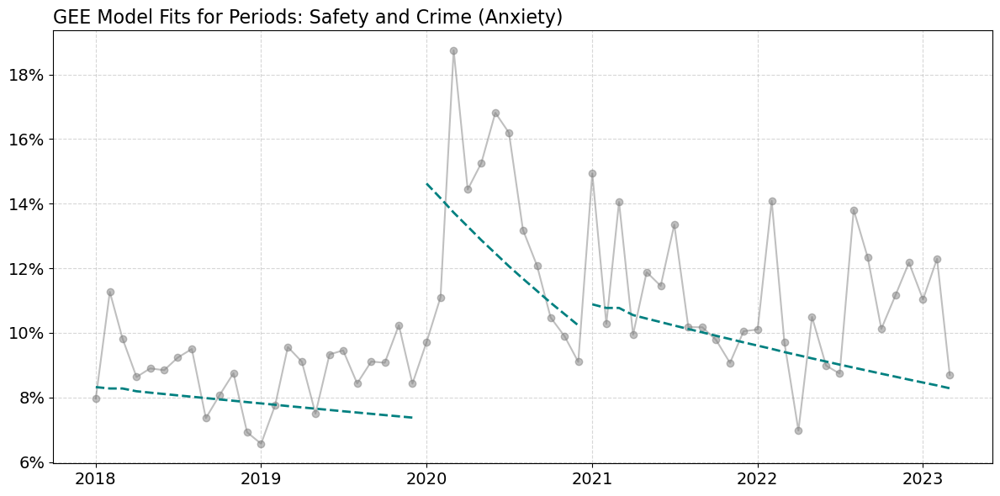


  Generalized Estimating Equations (GEE) Analysis:
         Period  GEE Slope  GEE p-value
0     2018-2019  -0.005690     0.113336
1          2020  -0.037040     0.000002
2  2021 Onwards  -0.011606     0.000475


In [398]:
### CREATE WC / LINE VIZ : ANX - SAFTEY AND CRIME

# ----------> SELECT THEME --------
theme = 'Safety and Crime'
# ---------------------------------

anx_wc_count_dict = anx_longitudinal_df[anx_longitudinal_df['theme'] == theme]['anx_topics_cleansed'].value_counts().to_dict()

## ------ Initiate a figure
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

## ------ Define a function to control colour darkness for background wc
def adjusted_grey_scale_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    max_freq = max(anx_wc_count_dict.values())  # Get max frequency for scaling
    frequency = anx_wc_count_dict.get(word, 1)
    min_darkness = 230  # Adjust this to make the lightest words darker
    darkness = int(200 * (1 - frequency / max_freq))  # Scale from black (0) to white (255)
    darkness = max(darkness, min_darkness)  # Ensure minimum darkness level
    return f"rgb({darkness}, {darkness}, {darkness})"  # Return adjusted grayscale color

## ----- Generate the word cloud with adjusted colours
# initialise wc object
wordcloud = WordCloud(
    width=1000,
    height=500,
    background_color='white',
    contour_width=1,
    max_font_size=300,
    relative_scaling=0.2,
    margin=1,
    collocations=False,
    random_state=2,
    color_func=adjusted_grey_scale_color_func
).generate_from_frequencies(anx_wc_count_dict)
# show wordcloud background
ax.imshow(wordcloud)
ax.set_axis_off()

## ----- Create time series of % measure -----
# filter to theme within pivot table
theme_series = anx_pivot_table.loc[theme]
# transpose and reset index
theme_series_trans = theme_series.reset_index()
# rename columns
theme_series_trans.columns = ['year_month', 'value']
# ensure 'year_month' is a string before conversion
theme_series_trans['year_month'] = theme_series_trans['year_month'].astype(str)
# convert 'year_month' to datetime format (assuming YYYY-MM format)
theme_series_trans['year_month'] = pd.to_datetime(theme_series_trans['year_month'], format='%Y-%m')
# ensure 'value' is numeric
theme_series_trans['value'] = pd.to_numeric(theme_series_trans['value'], errors='coerce').round(2)
# create inset axes
sub_ax = inset_axes(ax, width="90%", height="70%", loc='center', borderpad=1)

## ----- Smooth the line using interpolation ----
x = theme_series_trans['year_month'].map(lambda d: d.timestamp())  # Convert datetime to numerical timestamps
y = theme_series_trans['value']
# Create interpolation function
x_smooth = np.linspace(x.min(), x.max(), 300)  # Generate more points for smooth curve

spline_viz = make_interp_spline(x, y, k=3)  # k=3 for cubic spline smoothing
spline = UnivariateSpline(x, y, k=3, s=len(x)* 1.0)  # s controls the amount of smoothing

y_smooth_viz = spline_viz(x_smooth)
y_smooth = spline(x_smooth)

# === R² CALCULATION ===
y_pred_at_x = spline(x)  # predict at original x
ss_total = np.sum((y - np.mean(y)) ** 2)
ss_res = np.sum((y - y_pred_at_x) ** 2)
r_squared = 1 - (ss_res / ss_total)

# Convert timestamps back to datetime for plotting
x_smooth_dates = pd.to_datetime(x_smooth, unit='s')
#fix y smooth
y_smooth[y_smooth < 0] = 0 
# plot the smooth line chart
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='white', linewidth=9, zorder=5)
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='darkgrey', linewidth=2.5, zorder=5)
# remove background from line chart
sub_ax.set_axis_off()

## ----- Display y-axis labels 
max_rate = 20
min_rate = 5
mid_rate_1 = 10
mid_rate_2 = 15
sub_ax.axhline(y=max_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=min_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=mid_rate_1, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=mid_rate_2, color='black', linestyle='--', lw=0.4)
sub_ax.text(17350, max_rate - 0.2, f"{max_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold' )
sub_ax.text(17350, min_rate - 0.2, f"{min_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')
sub_ax.text(17350, mid_rate_1 - 0.2, f"{mid_rate_1:.0f}%",
    fontsize=10, color='black', fontweight='bold')
sub_ax.text(17350, mid_rate_2 - 0.2, f"{mid_rate_2:.0f}%",
    fontsize=10, color='black', fontweight='bold')

# ----- set title
lower_bound = 1960
upper_bound = 2019
title = theme.title()
title = title.replace("And","and")

fig_text(
    0.225, 0.819,
    title, color='black',
    fontweight='bold',
    fontsize=16,
    #highlight_textprops=[{"color": 'darkred'},{"fontsize": 13,"color": 'darkgrey',"fontweight": 'normal'}],
    ha='center')

##### ICON, TEXT, ARROW 1 (invasion of ukraine) -------------------------------------------------------------------------------------------

## ----- Icon text
sub_ax.text(
    0.385, 0.9,  # X, Y in Axes coordinates
    r"$\bf{Mar\ 2020}$" + "\n",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='left',
    va='center')

## ----- Draw arrow
def draw_arrow(tail_position, head_position, invert=True):
    kw = dict(
        arrowstyle="Simple, tail_width=0.5, head_width=4, head_length=8", color="k")
    if invert:
        connectionstyle = "arc3,rad=-.5"
    else:
        connectionstyle = "arc3,rad=.5"
    a = FancyArrowPatch(tail_position, head_position,
                        connectionstyle=connectionstyle,
                        transform=fig.transFigure,
                        **kw)
    fig.patches.append(a)
#draw_arrow((0.62, 0.61), (0.702, 0.582))

# --------------------------------------------------------------------------------------------------
## ------ Save figure
save_path = 'E:/twitter_analysis_data/viz/theme_analysis/wc_line_detail/'
plt.savefig(save_path + "anx " + theme + '.png', bbox_inches='tight', pad_inches=0.15)

## ------ Show figure 
plt.show()

################################################# S T A T I S T I C A L   A N A L Y S I S ##########################################

p1 = "2018-2019"
p2 = "2020"
p3 = "2021 Onwards"


stat_analysis_for_theme(
    anx_or_hap = "Anxiety",
    input_dataframe=anx_stat_sig_df,
    theme=theme,
    periods=[
        (p1, "2018-01", "2019-12"),
        (p2, "2020-01", "2020-12"),
        (p3, "2021-01", "2023-03")
    ],
    logit_text_positions={
        p1: (0.5, 0.1),
        p2: (0.5,0.07),
        p3: (0.655, 0.15)
    },
    gee_text_positions={
        p1: 0.05,
        p3: 0.05,
        p3: 0.05
    },
    line_color_data="grey",
    r_p_pos = (0.98, 0.95)
)


### Geopolitics (Anxiety)

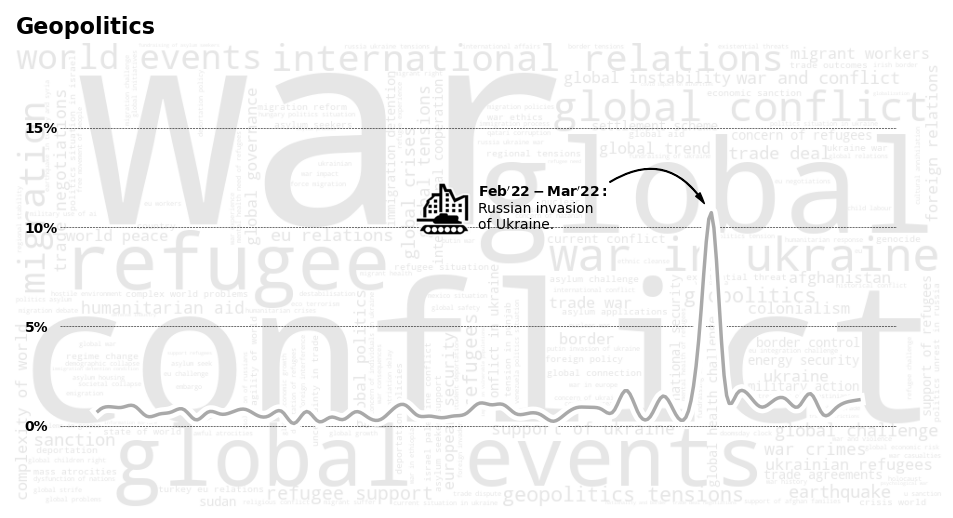



STATISTICAL ANALYSIS FOR THEME:

TESTING CUBIC SPLINE INTERPOLATION MODEL VERSUS NULL HYPOTHESIS:
Permutation p-value: 0.00000000
R² = 0.8746


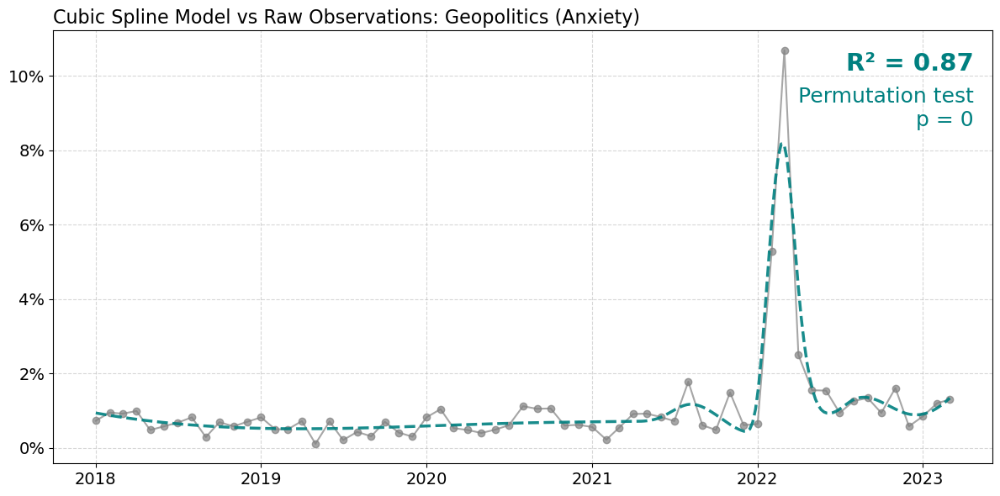


CHANGE POINT DETECTION:


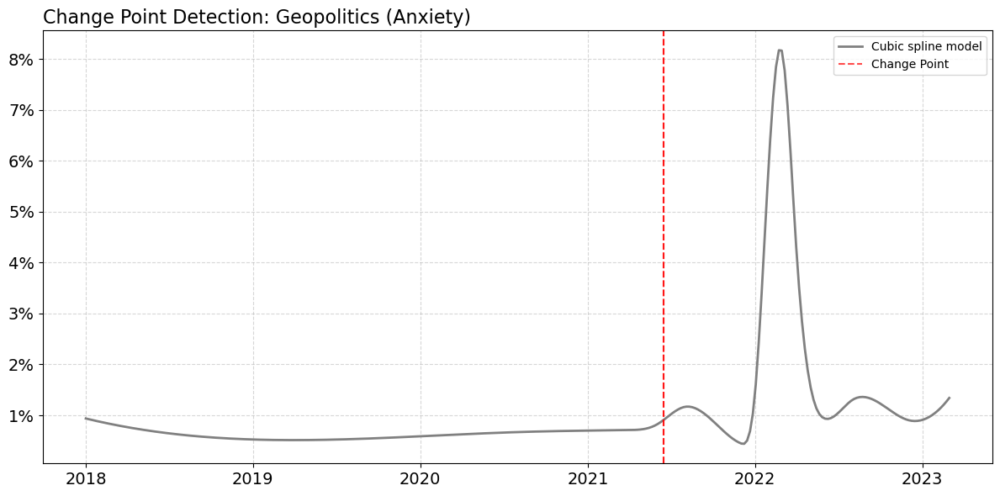


 DEFINED PERIODS
('Pre UA Invasion', '2018-01', '2022-01')
('UA Invasion', '2022-01', '2022-04')
('POST UA Invasion', '2022-04', '2023-03')


 LOGISTIC REGRESSION, T-TESTING AND GEE MODELLING 



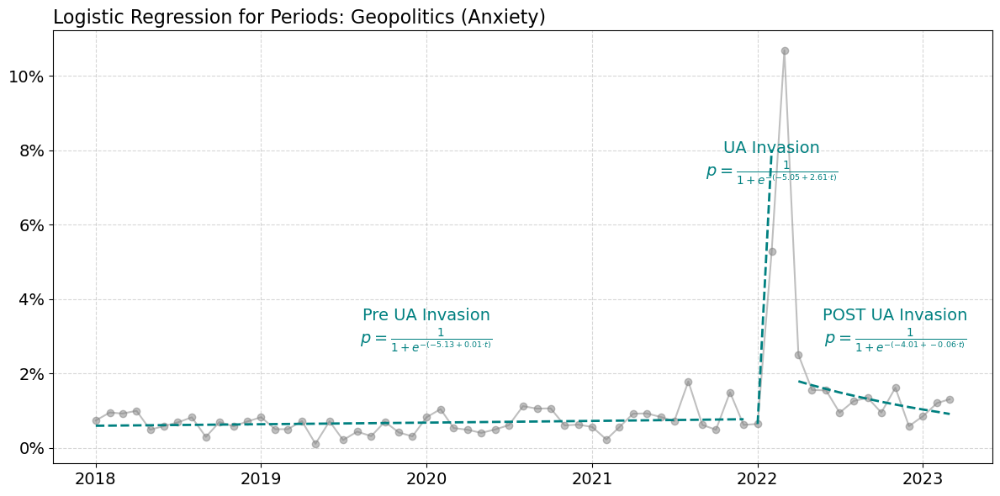



 Summary of Logistic Regression Model and Means for Periods:
             Period  Intercept     Slope   p(Intercept)      p(Slope)  \
0   Pre UA Invasion  -5.125866  0.005553   0.000000e+00  1.810769e-01   
1       UA Invasion  -5.046002  2.606017   2.393999e-29  1.265460e-08   
2  POST UA Invasion  -4.007082 -0.062408  1.063761e-138  2.477560e-02   

   Empirical Mean  
0        0.006708  
1        0.056043  
2        0.013132  


T-TESTING TO ASSESS VARIATION IN MEANS BETWEEN PERIODS


Pairwise T-Test p-values using Welch's T-Test:
                  Pre UA Invasion   UA Invasion  POST UA Invasion
Pre UA Invasion               NaN  4.839884e-25      4.715310e-07
UA Invasion          4.839884e-25           NaN      1.833250e-18
POST UA Invasion     4.715310e-07  1.833250e-18               NaN

  Calculation of effect size using Cohen's d:
                            Comparison  Cohen's d
0       Pre UA Invasion vs UA Invasion  -0.521838
1  Pre UA Invasion vs POST UA Invasion  -0.0733

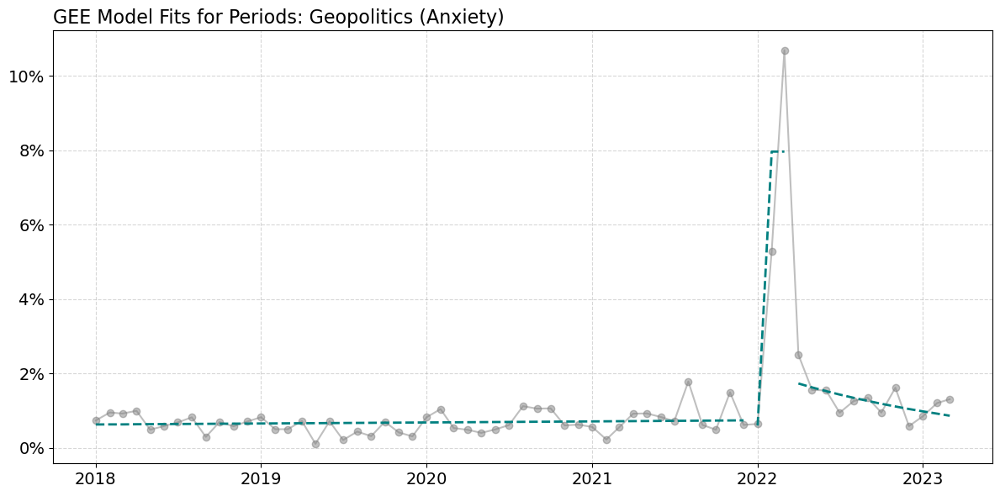


  Generalized Estimating Equations (GEE) Analysis:
             Period  GEE Slope   GEE p-value
0   Pre UA Invasion   0.003490  4.842815e-01
1       UA Invasion   2.670570  4.135109e-08
2  POST UA Invasion  -0.064188  2.827114e-02


In [406]:
### CREATE WC / LINE VIZ : ANX - GEOPOLITICS
## war in ukraine timeline: https://researchbriefings.files.parliament.uk/documents/CBP-9847/CBP-9847.pdf

# ----------> SELECT THEME --------
theme = 'Geopolitics'
# ---------------------------------

anx_wc_count_dict = anx_longitudinal_df[anx_longitudinal_df['theme'] == theme]['anx_topics_cleansed'].value_counts().to_dict()

## ------ Initiate a figure
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

## ------ Define a function to control colour darkness for background wc
def adjusted_grey_scale_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    max_freq = max(anx_wc_count_dict.values())  # Get max frequency for scaling
    frequency = anx_wc_count_dict.get(word, 1)
    min_darkness = 230  # Adjust this to make the lightest words darker
    darkness = int(200 * (1 - frequency / max_freq))  # Scale from black (0) to white (255)
    darkness = max(darkness, min_darkness)  # Ensure minimum darkness level
    return f"rgb({darkness}, {darkness}, {darkness})"  # Return adjusted grayscale color

## ----- Generate the word cloud with adjusted colours
# initialise wc object
wordcloud = WordCloud(
    width=1000,
    height=500,
    background_color='white',
    contour_width=1,
    max_font_size=300,
    relative_scaling=0.2,
    margin=1,
    collocations=False,
    random_state=2,
    color_func=adjusted_grey_scale_color_func
).generate_from_frequencies(anx_wc_count_dict)
# show wordcloud backgorund
ax.imshow(wordcloud)
ax.set_axis_off()

## ----- Create time series of % measure -----
# filter to theme within pivot table
theme_series = anx_pivot_table.loc[theme]
# transpose and reset index
theme_series_trans = theme_series.reset_index()
# rename columns
theme_series_trans.columns = ['year_month', 'value']
# ensure 'year_month' is a string before conversion
theme_series_trans['year_month'] = theme_series_trans['year_month'].astype(str)
# convert 'year_month' to datetime format (assuming YYYY-MM format)
theme_series_trans['year_month'] = pd.to_datetime(theme_series_trans['year_month'], format='%Y-%m')
# ensure 'value' is numeric
theme_series_trans['value'] = pd.to_numeric(theme_series_trans['value'], errors='coerce').round(2)
# create inset axes
sub_ax = inset_axes(ax, width="90%", height="70%", loc='center', borderpad=1)

## ----- Smooth the line using interpolation ----
x = theme_series_trans['year_month'].map(lambda d: d.timestamp())  # Convert datetime to numerical timestamps
y = theme_series_trans['value']
# Create interpolation function
x_smooth = np.linspace(x.min(), x.max(), 300)  # Generate more points for smooth curve

spline_viz = make_interp_spline(x, y, k=3)  # k=3 for cubic spline smoothing
spline = UnivariateSpline(x, y, k=3, s=len(x)*0.25)  # s controls the amount of smoothing

y_smooth_viz = spline_viz(x_smooth)
y_smooth = spline(x_smooth)

# === R² CALCULATION ===
y_pred_at_x = spline(x)  # predict at original x
ss_total = np.sum((y - np.mean(y)) ** 2)
ss_res = np.sum((y - y_pred_at_x) ** 2)
r_squared = 1 - (ss_res / ss_total)

# Convert timestamps back to datetime for plotting
x_smooth_dates = pd.to_datetime(x_smooth, unit='s')
#fix y smooth
y_smooth[y_smooth < 0] = 0 
# plot the smooth line chart
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='white', linewidth=9, zorder=5)
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='darkgrey', linewidth=2.5, zorder=5)
# remove background from line chart
sub_ax.set_axis_off()

## ----- Display y-axis labels 
max_rate = 15
min_rate = 0
mid_rate_1 = 5
mid_rate_2 = 10

sub_ax.axhline(y=max_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=min_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=mid_rate_1, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=mid_rate_2, color='black', linestyle='--', lw=0.4)

sub_ax.text(17350, max_rate - 0.25, f"{max_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold' )
sub_ax.text(17350, min_rate - 0.25, f"{min_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')
sub_ax.text(17350, mid_rate_1 - 0.25, f"{mid_rate_1:.0f}%",
    fontsize=10, color='black', fontweight='bold')
sub_ax.text(17350, mid_rate_2 - 0.25, f"{mid_rate_2:.0f}%",
    fontsize=10, color='black', fontweight='bold')

# ----- set title
lower_bound = 1960
upper_bound = 2019
title = theme.title()
title = title.replace("And","and")

fig_text(
    0.185, 0.821,
    title, color='black',
    fontweight='bold',
    fontsize=16,
    #highlight_textprops=[{"color": 'darkred'},{"fontsize": 13,"color": 'darkgrey',"fontweight": 'normal'}],
    ha='center')


##### ICON, TEXT, ARROW 1 (invasion of ukraine) -------------------------------------------------------------------------------------------

## ----- Display icon image(s)
# define function to load and return image
def open_image_local(path_to_image):
    image = Image.open(path_to_image) # Open the image
    image_array = np.array(image) # Convert to a numpy array
    return image_array # Output
# initialise image object from file
war_image = open_image_local('E:/twitter_analysis_data/viz/theme_analysis/icons/anx_geopol_war_png.png')
# define the position and size parameters
war_image_xaxis = 0.445
war_image_yaxis = 0.54
war_image_width = 0.075
war_image_height = 0.075
ax_war_image = fig.add_axes([war_image_xaxis, war_image_yaxis, war_image_width, war_image_height])
# show icon
ax_war_image.imshow(war_image)
ax_war_image.axis('off')  # Remove axis of the image

## ----- Icon text
sub_ax.text(
    0.5, 0.71,  # X, Y in Axes coordinates
    r"$\bf{Feb'22-Mar'22:}$" + "\nRussian invasion\nof Ukraine.",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='left',
    va='center')

## ----- Draw arrow
def draw_arrow(tail_position, head_position, invert=True):
    kw = dict(
        arrowstyle="Simple, tail_width=0.5, head_width=4, head_length=8", color="k")
    if invert:
        connectionstyle = "arc3,rad=-.5"
    else:
        connectionstyle = "arc3,rad=.5"
    a = FancyArrowPatch(tail_position, head_position,
                        connectionstyle=connectionstyle,
                        transform=fig.transFigure,
                        **kw)
    fig.patches.append(a)
draw_arrow((0.62, 0.61), (0.702, 0.582))

# --------------------------------------------------------------------------------------------------
## ------ Save figure
save_path = 'E:/twitter_analysis_data/viz/theme_analysis/wc_line_detail/'
plt.savefig(save_path + "anx " + theme + '.png', bbox_inches='tight', pad_inches=0.15)

## ------ Show figure 
plt.show()

################################################# S T A T I S T I C A L   A N A L Y S I S ##########################################

p1 = "Pre UA Invasion"
p2 = "UA Invasion"
p3 = "POST UA Invasion"


stat_analysis_for_theme(
    anx_or_hap = "Anxiety",
    input_dataframe=anx_stat_sig_df,
    theme=theme,
    periods=[
        (p1, "2018-01", "2022-01"),
        (p2, "2022-01", "2022-04"),
        (p3, "2022-04", "2023-03")
    ],
    logit_text_positions={
        p1: (0.5, 0.025),
        p2: (0.5,0.07),
        p3: (0.655, 0.025)
    },
    gee_text_positions={
        p1: 0.05,
        p3: 0.05,
        p3: 0.05
    },
    line_color_data="grey",
    r_p_pos = (0.98, 0.95)
)

## Major Drivers of Happiness
---


### Celeration and Seasonal (Happiness)

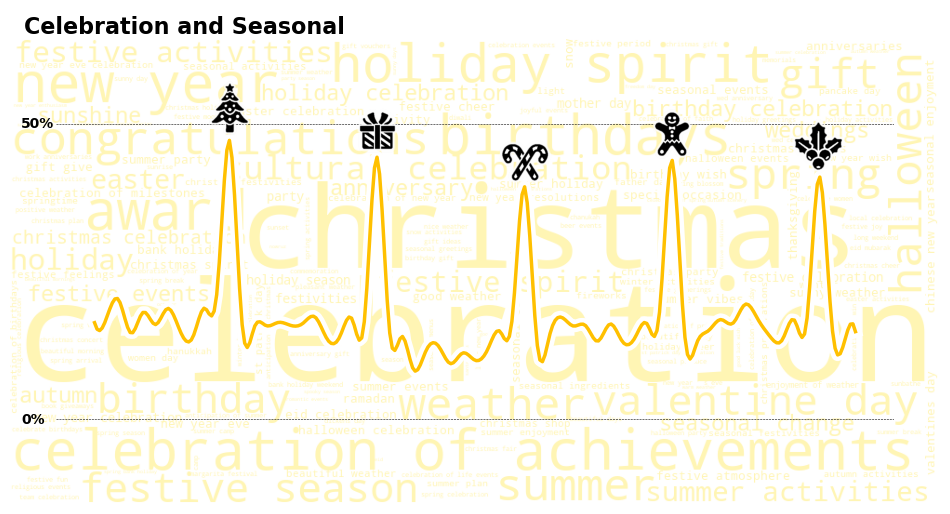



STATISTICAL ANALYSIS FOR THEME:

TESTING CUBIC SPLINE INTERPOLATION MODEL VERSUS NULL HYPOTHESIS:
Permutation p-value: 0.38100000
R² = 0.9683


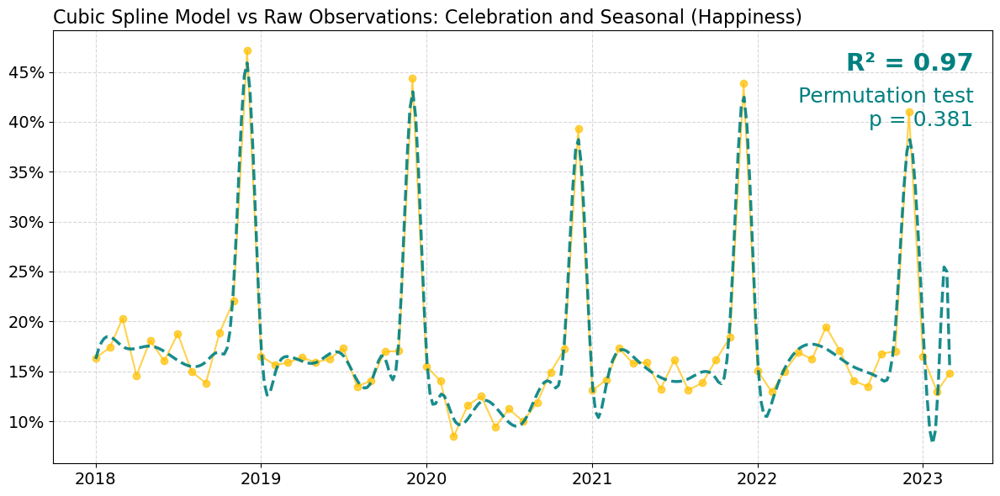


CHANGE POINT DETECTION:
No change points detected.


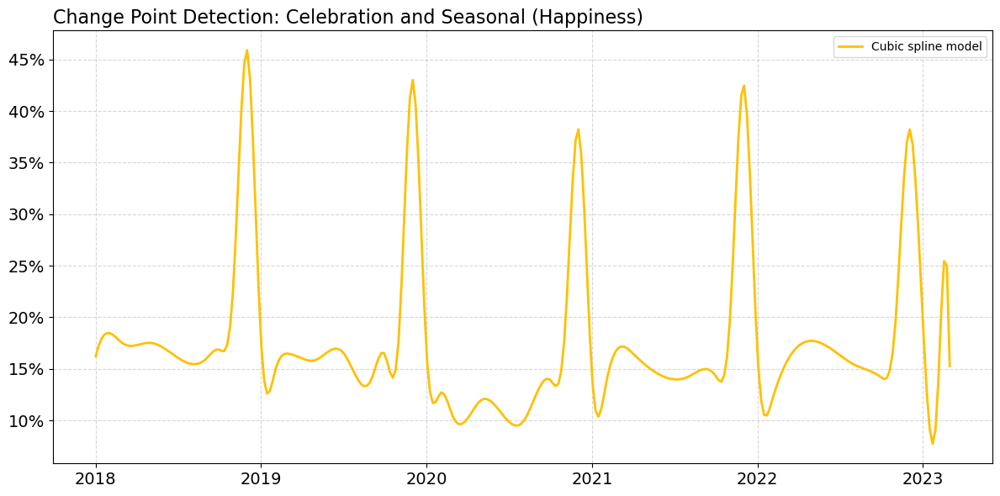


 DEFINED PERIODS
('n/a', '2018-01', '2020-01')
('n/a', '2020-01', '2021-12')
('n/a', '2022-01', '2023-03')


 LOGISTIC REGRESSION, T-TESTING AND GEE MODELLING 



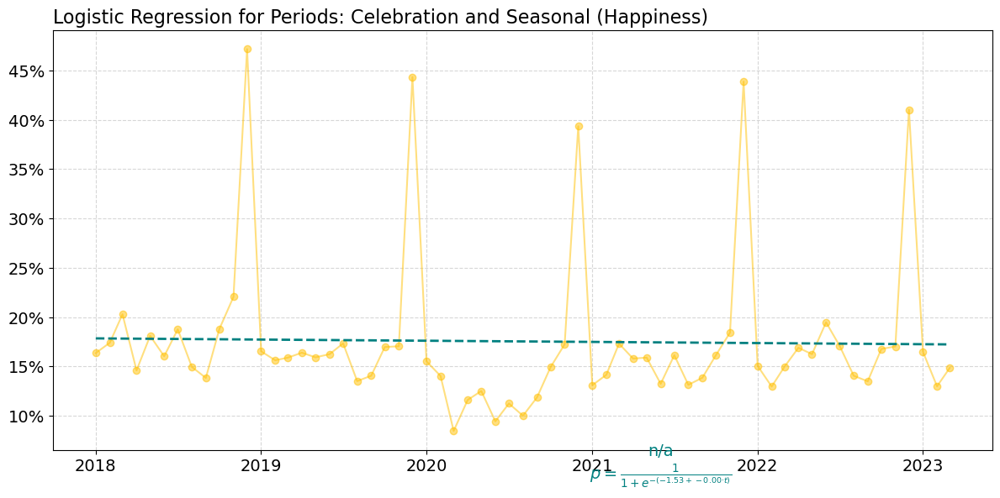



 Summary of Logistic Regression Model and Means for Periods:
  Period  Intercept     Slope  p(Intercept)  p(Slope)  Empirical Mean
0    n/a  -1.527492 -0.000682           0.0  0.230981        0.175515


T-TESTING TO ASSESS VARIATION IN MEANS BETWEEN PERIODS


Pairwise T-Test p-values using Welch's T-Test:
     n/a
n/a  NaN

  Calculation of effect size using Cohen's d:
Empty DataFrame
Columns: []
Index: []


GEE MODELLING FOR EACH PERIOD



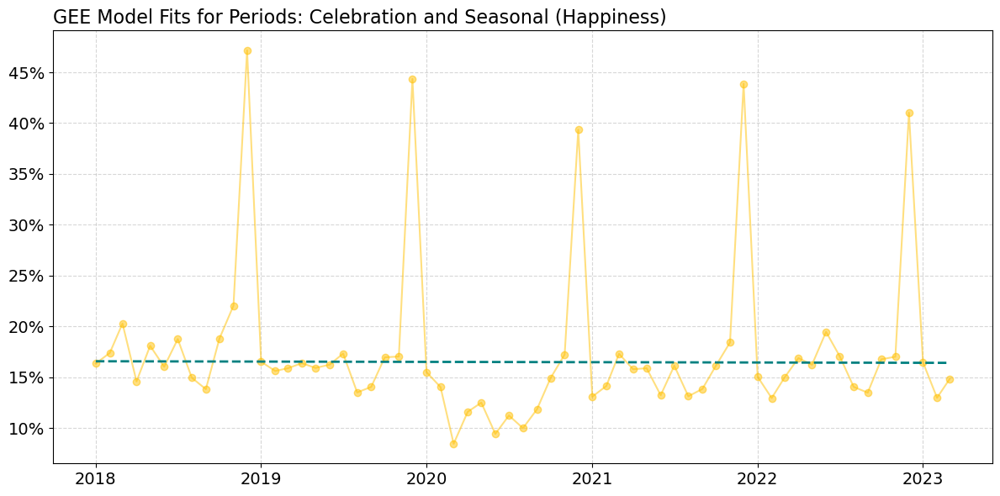


  Generalized Estimating Equations (GEE) Analysis:
  Period  GEE Slope  GEE p-value
0    n/a  -0.000183     0.809324


In [410]:
### CREATE WC / LINE VIZ : HAP  - CELEBRATION AND SEASONAL

# ----------> SELECT THEME --------
theme = 'Celebration and Seasonal'
# ---------------------------------

hap_longitudinal_df.loc[:,'hap_topics_cleansed'] = [s.replace('celebrations','celebration') for s in hap_longitudinal_df['hap_topics_cleansed']]

hap_wc_count_dict = hap_longitudinal_df[hap_longitudinal_df['theme'] == theme]['hap_topics_cleansed'].value_counts().to_dict()

## ------ Initiate a figure
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

## ------ Define a function to control colour darkness for background wc
# Define a light version of #FFC000 — you can tweak this RGB as desired
light_yellow_rgb = (255, 245, 180)  # lighter tint of #FFC000

def constant_light_yellow_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    r, g, b = light_yellow_rgb
    return f"rgb({r}, {g}, {b})"

## ----- Generate the word cloud with adjusted colours
# initialise wc object
wordcloud = WordCloud(
    width=1000,
    height=500,
    background_color='white',
    contour_width=1,
    max_font_size=300,
    relative_scaling=0.2,
    margin=1,
    collocations=False,
    random_state=11,               
    color_func=constant_light_yellow_color_func
).generate_from_frequencies(hap_wc_count_dict)
# show wordcloud backgorund
ax.imshow(wordcloud)
ax.set_axis_off()

## ----- Create time series of % measure -----
# filter to theme within pivot table
theme_series = hap_pivot_table.loc[theme]
# transpose and reset index
theme_series_trans = theme_series.reset_index()
# rename columns
theme_series_trans.columns = ['year_month', 'value']
# ensure 'year_month' is a string before conversion
theme_series_trans['year_month'] = theme_series_trans['year_month'].astype(str)
# convert 'year_month' to datetime format (assuming YYYY-MM format)
theme_series_trans['year_month'] = pd.to_datetime(theme_series_trans['year_month'], format='%Y-%m')
# ensure 'value' is numeric
theme_series_trans['value'] = pd.to_numeric(theme_series_trans['value'], errors='coerce').round(2)
# create inset axes
sub_ax = inset_axes(ax, width="90%", height="70%", loc='center', borderpad=1)

## ----- Smooth the line using interpolation ----
x = theme_series_trans['year_month'].map(lambda d: d.timestamp())  # Convert datetime to numerical timestamps
y = theme_series_trans['value']
# Create interpolation function
x_smooth = np.linspace(x.min(), x.max(), 300)  # Generate more points for smooth curve

spline_viz = make_interp_spline(x, y, k=3)  # k=3 for cubic spline smoothing
spline = UnivariateSpline(x, y, k=3, s=len(x)*2.0)  # s controls the amount of smoothing

y_smooth_viz = spline_viz(x_smooth)
y_smooth = spline(x_smooth)

# === R² CALCULATION ===
y_pred_at_x = spline(x)  # predict at original x
ss_total = np.sum((y - np.mean(y)) ** 2)
ss_res = np.sum((y - y_pred_at_x) ** 2)
r_squared = 1 - (ss_res / ss_total)


# Convert timestamps back to datetime for plotting
x_smooth_dates = pd.to_datetime(x_smooth, unit='s')
#fix y smooth
y_smooth[y_smooth < 0] = 0 
# plot the smooth line chart
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='white', linewidth=9, zorder=5)
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='#FFC000', linewidth=2.5, zorder=5)
# remove background from line chart
sub_ax.set_axis_off()

## ----- Display y-axis labels 
max_rate = 50
min_rate = 0
#mid_rate = 8
sub_ax.axhline(y=max_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=min_rate, color='black', linestyle='--', lw=0.4)
#sub_ax.axhline(y=mid_rate, color='lightgrey', linestyle='--', lw=0.6)
sub_ax.text(17350, max_rate - 0.8, f"{max_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold' )
sub_ax.text(17350, min_rate - 0.8, f"{min_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')

# ----- set title
lower_bound = 1960
upper_bound = 2019
title = theme.title()
title = title.replace("And","and")

fig_text(
    0.27, 0.815,
    title, color='black',
    fontweight='bold',
    fontsize=16,
    #highlight_textprops=[{"color": 'darkred'},{"fontsize": 13,"color": 'darkgrey',"fontweight": 'normal'}],
    ha='center')

## ----- Display icon image(s)
# define function to load and return image
def open_image_local(path_to_image):
    image = Image.open(path_to_image) # Open the image
    image_array = np.array(image) # Convert to a numpy array
    return image_array # Output


##### ICON 1 (tree) -------------------------------------------------------------------------------------------
# initialise image object from file
tree_image = open_image_local('E:/twitter_analysis_data/viz/theme_analysis/icons/hap_celeb_tree_png.png')
# define the position and size parameters
tree_image_xaxis = 0.268
tree_image_yaxis = 0.658
tree_image_width = 0.08
tree_image_height = 0.08
ax_tree_image = fig.add_axes([tree_image_xaxis, tree_image_yaxis, tree_image_width, tree_image_height])
# show icon
ax_tree_image.imshow(tree_image)
ax_tree_image.axis('off')  # Remove axis of the image

##### ICON 2 (gift) -------------------------------------------------------------------------------------------

# initialise image object from file
gift_image = open_image_local('E:/twitter_analysis_data/viz/theme_analysis/icons/hap_celeb_gift_png.png')
# define the position and size parameters
gift_image_xaxis = 0.3965
gift_image_yaxis = 0.635
gift_image_width = 0.07
gift_image_height = 0.07
ax_gift_image = fig.add_axes([gift_image_xaxis, gift_image_yaxis, gift_image_width, gift_image_height])
# show icon
ax_gift_image.imshow(gift_image)
ax_gift_image.axis('off')  # Remove axis of the image

##### ICON 3 (candy) -------------------------------------------------------------------------------------------

# initialise image object from file
candy_image = open_image_local('E:/twitter_analysis_data/viz/theme_analysis/icons/hap_celeb_candy_png.png')
# define the position and size parameters
candy_image_xaxis = 0.5195
candy_image_yaxis = 0.5952
candy_image_width = 0.07
candy_image_height = 0.07
ax_candy_image = fig.add_axes([candy_image_xaxis, candy_image_yaxis, candy_image_width, candy_image_height])
# show icon
ax_candy_image.imshow(candy_image)
ax_candy_image.axis('off')  # Remove axis of the image

##### ICON 4 (man) -------------------------------------------------------------------------------------------

# initialise image object from file
man_image = open_image_local('E:/twitter_analysis_data/viz/theme_analysis/icons/hap_celeb_man_png.png')
# define the position and size parameters
man_image_xaxis = 0.637
man_image_yaxis = 0.625
man_image_width = 0.08
man_image_height = 0.08
ax_man_image = fig.add_axes([man_image_xaxis, man_image_yaxis, man_image_width, man_image_height])
# show icon
ax_man_image.imshow(man_image)
ax_man_image.axis('off')  # Remove axis of the image

##### ICON 5 (holly) -------------------------------------------------------------------------------------------

# initialise image object from file
holly_image = open_image_local('E:/twitter_analysis_data/viz/theme_analysis/icons/hap_celeb_holly_png.png')
# define the position and size parameters
holly_image_xaxis = 0.759
holly_image_yaxis = 0.6125
holly_image_width = 0.08
holly_image_height = 0.08
ax_holly_image = fig.add_axes([holly_image_xaxis, holly_image_yaxis, holly_image_width, holly_image_height])
# show icon
ax_holly_image.imshow(holly_image)
ax_holly_image.axis('off')  # Remove axis of the image


# --------------------------------------------------------------------------------------------------
## ------ Save figure
save_path = 'E:/twitter_analysis_data/viz/theme_analysis/wc_line_detail/'
plt.savefig(save_path + "hap " + theme + '.png', bbox_inches='tight', pad_inches=0.15)

## ------ Show figure 
plt.show()


################################################# S T A T I S T I C A L   A N A L Y S I S ##########################################

p1 = "n/a"
p2 = "n/a"
p3 = "n/a"

stat_analysis_for_theme(
    anx_or_hap = "Happiness",
    input_dataframe=hap_stat_sig_df,
    theme=theme,
    periods=[
        (p1, "2018-01", "2020-01"),
        (p2, "2020-01", "2021-12"),
        (p3, "2022-01", "2023-03")
    ],
    logit_text_positions={
        p1: (0.5, 0.025),
        p2: (0.5,0.07),
        p3: (0.655, 0.025)
    },
    gee_text_positions={
        p1: 0.05,
        p3: 0.05,
        p3: 0.05
    },
    line_color_data='#FFC000',
    r_p_pos = (0.98, 0.95)
)

### Social and Community (Happiness and Anxiety)

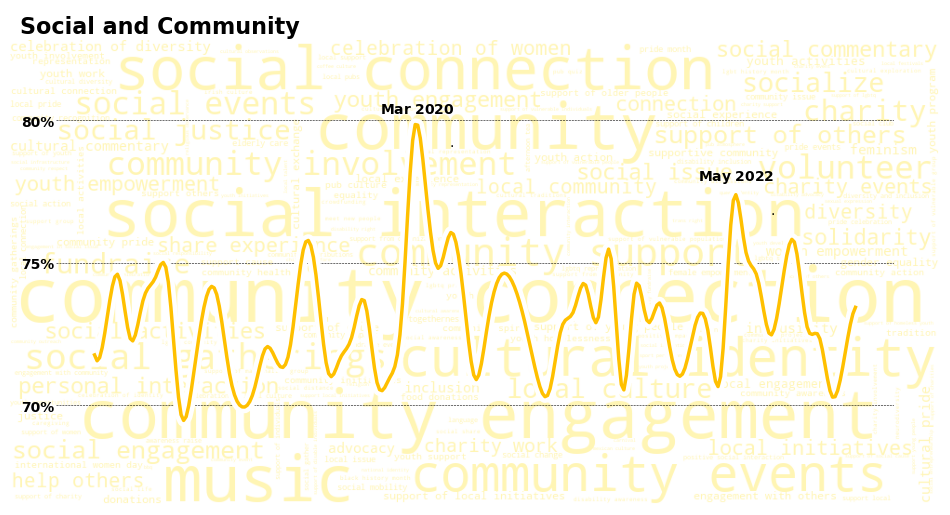



STATISTICAL ANALYSIS FOR THEME:

TESTING CUBIC SPLINE INTERPOLATION MODEL VERSUS NULL HYPOTHESIS:
Permutation p-value: 0.00380000
R² = 0.7319


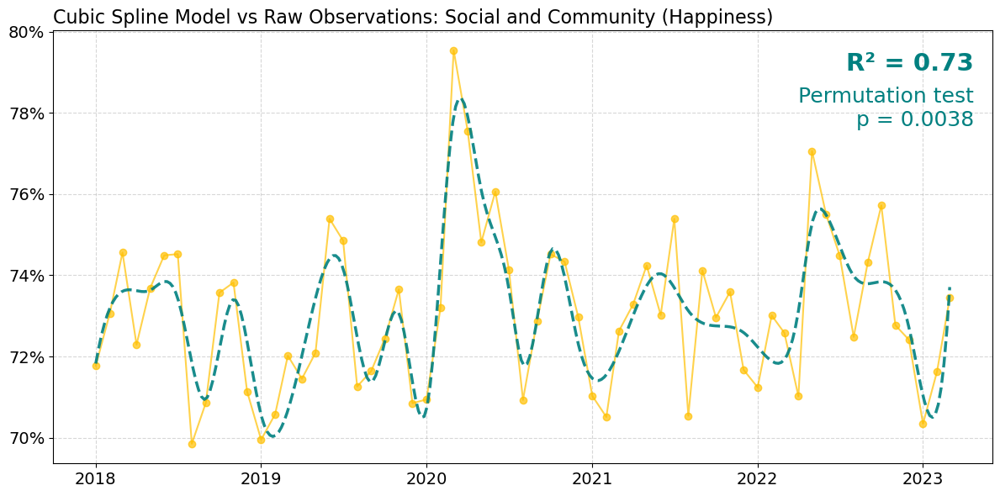


CHANGE POINT DETECTION:
No change points detected.


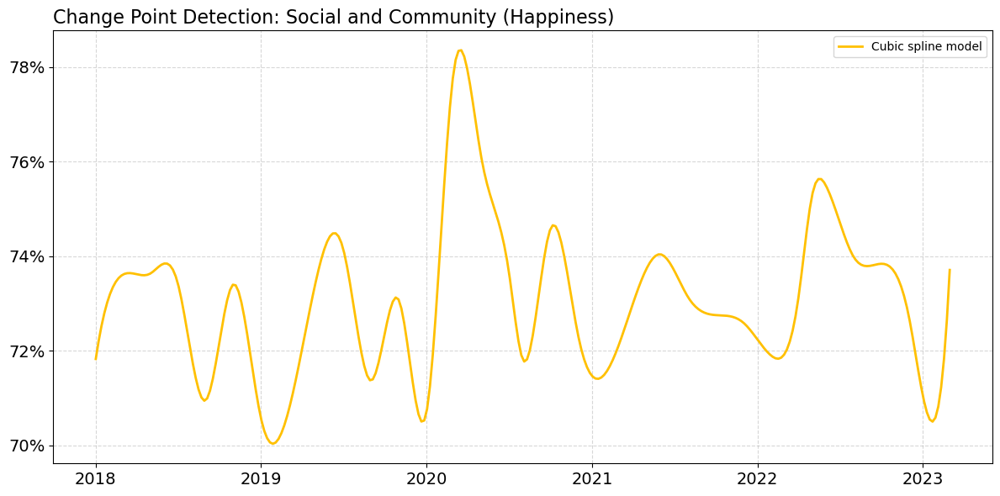


 DEFINED PERIODS
('2018-2019', '2018-01', '2020-01')
('2020-2021', '2020-01', '2021-12')
('2022 and up to Apr 2023', '2022-01', '2023-03')


 LOGISTIC REGRESSION, T-TESTING AND GEE MODELLING 



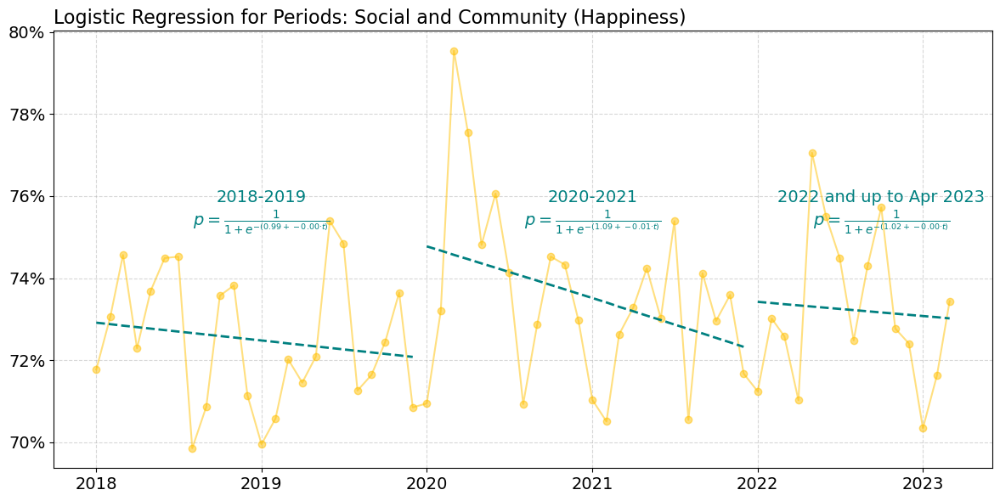



 Summary of Logistic Regression Model and Means for Periods:
                    Period  Intercept     Slope   p(Intercept)  p(Slope)  \
0                2018-2019   0.990209 -0.001818   0.000000e+00  0.339472   
1                2020-2021   1.086598 -0.005478   0.000000e+00  0.008789   
2  2022 and up to Apr 2023   1.016116 -0.001470  5.533707e-173  0.744495   

   Empirical Mean  
0        0.725071  
1        0.736042  
2        0.732281  


T-TESTING TO ASSESS VARIATION IN MEANS BETWEEN PERIODS


Pairwise T-Test p-values using Welch's T-Test:
                         2018-2019  2020-2021  2022 and up to Apr 2023
2018-2019                      NaN   0.004543                 0.124700
2020-2021                 0.004543        NaN                 0.432321
2022 and up to Apr 2023   0.124700   0.432321                      NaN

  Calculation of effect size using Cohen's d:
                             Comparison  Cohen's d
0                2018-2019 vs 2020-2021  -0.024717
1  2018-2019 

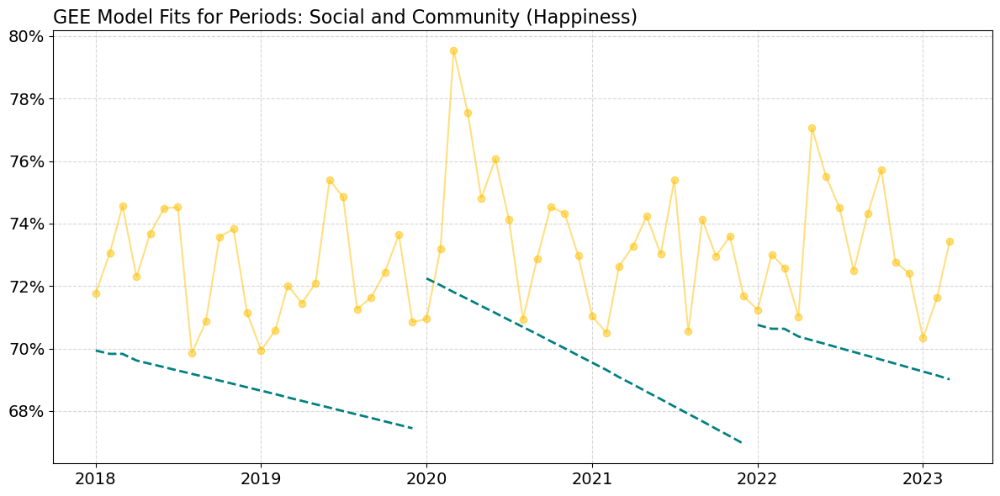


  Generalized Estimating Equations (GEE) Analysis:
                    Period  GEE Slope   GEE p-value
0                2018-2019  -0.005029  3.387239e-03
1                2020-2021  -0.010890  3.852974e-08
2  2022 and up to Apr 2023  -0.005912  1.169163e-01


In [412]:
### CREATE WC / LINE VIZ : HAP - PERSONAL

# ----------> SELECT THEME --------
theme = 'Social and Community'
# ---------------------------------

hap_longitudinal_df.loc[:,'hap_topics_cleansed'] = [s.replace('celebrations','celebration') for s in hap_longitudinal_df['hap_topics_cleansed']]

hap_wc_count_dict = hap_longitudinal_df[hap_longitudinal_df['theme'] == theme]['hap_topics_cleansed'].value_counts().to_dict()

## ------ Initiate a figure
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

## ------ Define a function to control colour darkness for background wc
# Define a light version of #FFC000 — you can tweak this RGB as desired
light_yellow_rgb = (255, 245, 180)  # lighter tint of #FFC000

def constant_light_yellow_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    r, g, b = light_yellow_rgb
    return f"rgb({r}, {g}, {b})"

## ----- Generate the word cloud with adjusted colours
# initialise wc object
wordcloud = WordCloud(
    width=1000,
    height=500,
    background_color='white',
    contour_width=1,
    max_font_size=300,
    relative_scaling=0.2,
    margin=1,
    collocations=False,
    random_state=11,               
    color_func=constant_light_yellow_color_func
).generate_from_frequencies(hap_wc_count_dict)
# show wordcloud backgorund
ax.imshow(wordcloud)
ax.set_axis_off()

## ----- Create time series of % measure -----
# filter to theme within pivot table
theme_series = hap_pivot_table.loc[theme]
# transpose and reset index
theme_series_trans = theme_series.reset_index()
# rename columns
theme_series_trans.columns = ['year_month', 'value']
# ensure 'year_month' is a string before conversion
theme_series_trans['year_month'] = theme_series_trans['year_month'].astype(str)
# convert 'year_month' to datetime format (assuming YYYY-MM format)
theme_series_trans['year_month'] = pd.to_datetime(theme_series_trans['year_month'], format='%Y-%m')
# ensure 'value' is numeric
theme_series_trans['value'] = pd.to_numeric(theme_series_trans['value'], errors='coerce').round(2)
# create inset axes
sub_ax = inset_axes(ax, width="90%", height="70%", loc='center', borderpad=1)

## ----- Smooth the line using interpolation ----
x = theme_series_trans['year_month'].map(lambda d: d.timestamp())  # Convert datetime to numerical timestamps
y = theme_series_trans['value']
# Create interpolation function
x_smooth = np.linspace(x.min(), x.max(), 300)  # Generate more points for smooth curve

spline_viz = make_interp_spline(x, y, k=3)  # k=3 for cubic spline smoothing
spline = UnivariateSpline(x, y, k=3, s=len(x)*1.0)  # s controls the amount of smoothing

y_smooth_viz = spline_viz(x_smooth)
y_smooth = spline(x_smooth)

# === R² CALCULATION ===
y_pred_at_x = spline(x)  # predict at original x
ss_total = np.sum((y - np.mean(y)) ** 2)
ss_res = np.sum((y - y_pred_at_x) ** 2)
r_squared = 1 - (ss_res / ss_total)

# Convert timestamps back to datetime for plotting
x_smooth_dates = pd.to_datetime(x_smooth, unit='s')
#fix y smooth
y_smooth[y_smooth < 0] = 0 
# plot the smooth line chart
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='white', linewidth=9, zorder=5)
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='#FFC000', linewidth=2.5, zorder=5)
# remove background from line chart
sub_ax.set_axis_off()

## ----- Display y-axis labels 
max_rate = 80
min_rate = 70
mid_rate = 75
sub_ax.axhline(y=max_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=min_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=mid_rate, color='black', linestyle='--', lw=0.4)
sub_ax.text(17350, max_rate - 0.2, f"{max_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold' )
sub_ax.text(17350, min_rate - 0.2, f"{min_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')
sub_ax.text(17350, mid_rate - 0.2, f"{mid_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')

# ----- set title
lower_bound = 1960
upper_bound = 2019
title = theme.title()
title = title.replace("And","and")

fig_text(
    0.25, 0.817,
    title, color='black',
    fontweight='bold',
    fontsize=16,
    #highlight_textprops=[{"color": 'darkred'},{"fontsize": 13,"color": 'darkgrey',"fontweight": 'normal'}],
    ha='center')

##### ICON, TEXT, ARROW 2 (cost of living payment) -------------------------------------------------------------------------------------------

## ----- Display icon image(s)
# define function to load and return image
def open_image_local(path_to_image):
    image = Image.open(path_to_image) # Open the image
    image_array = np.array(image) # Convert to a numpy array
    return image_array # Output
# initialise image object from file
ld_nov_image = open_image_local('E:/twitter_analysis_data/viz/theme_analysis/icons/hap_cov_open_png.png')
# define the position and size parameters
ld_nov_image_xaxis = 0.45
ld_nov_image_yaxis = 0.595
ld_nov_image_width = 0.08
ld_nov_image_height = 0.08
ax_ld_nov_image = fig.add_axes([ld_nov_image_xaxis, ld_nov_image_yaxis, ld_nov_image_width, ld_nov_image_height])
# show icon
#ax_ld_nov_image.imshow(ld_nov_image)
ax_ld_nov_image.axis('off')  # Remove axis of the image

## ----- Icon text
sub_ax.text(
    0.475, 0.95,  # X, Y in Axes coordinates
    r"$\bf{Mar\ 2020}$" + "\n\n.",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='right',
    va='center')

sub_ax.text(
    0.858, 0.745,  # X, Y in Axes coordinates
    r"$\bf{May\ 2022}$" + "\n\n.",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='right',
    va='center')

## ----- Draw arrow
def draw_arrow(tail_position, head_position, invert=True):
    kw = dict(
        arrowstyle="Simple, tail_width=0.5, head_width=4, head_length=8", color="k")
    if invert:
        connectionstyle = "arc3,rad=-.5"
    else:
        connectionstyle = "arc3,rad=.5"
    a = FancyArrowPatch(tail_position, head_position,
                        connectionstyle=connectionstyle,
                        transform=fig.transFigure,
                        **kw)
    fig.patches.append(a)
#draw_arrow((0.52, 0.62), (0.58, 0.57))

# --------------------------------------------------------------------------------------------------
## ------ Save figure
save_path = 'E:/twitter_analysis_data/viz/theme_analysis/wc_line_detail/'
plt.savefig(save_path + "hap " + theme + '.png', bbox_inches='tight', pad_inches=0.15)

## ------ Show figure 
plt.show()

################################################# S T A T I S T I C A L   A N A L Y S I S ##########################################

p1 = "2018-2019"
p2 = "2020-2021"
p3 = "2022 and up to Apr 2023"

stat_analysis_for_theme(
    anx_or_hap = "Happiness",
    input_dataframe=hap_stat_sig_df,
    theme=theme,
    periods=[
        (p1, "2018-01", "2020-01"),
        (p2, "2020-01", "2021-12"),
        (p3, "2022-01", "2023-03")
    ],
    logit_text_positions={
        p1: (0.5, 0.75),
        p2: (0.5, 0.75),
        p3: (0.655, 0.75)
    },
    gee_text_positions={
        p1: 0.05,
        p3: 0.05,
        p3: 0.05
    },
    line_color_data='#FFC000',
    r_p_pos = (0.98, 0.95)
)

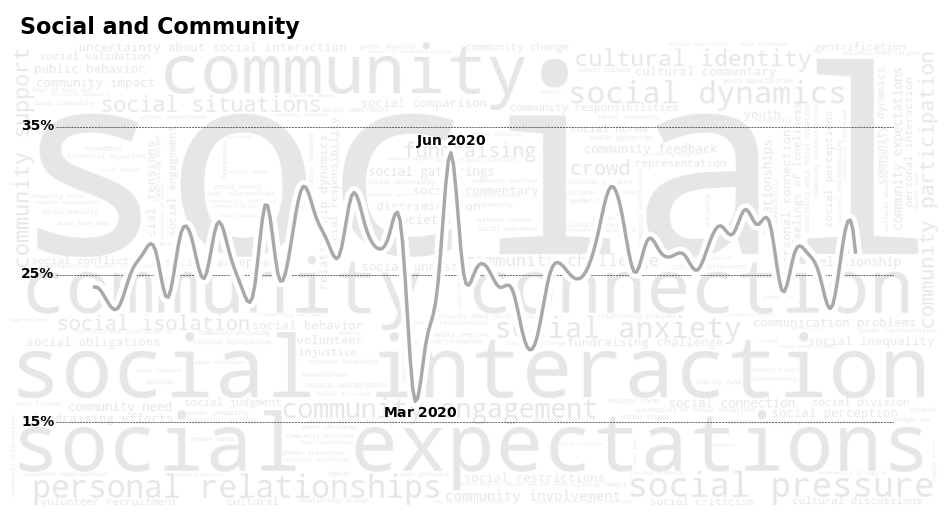



STATISTICAL ANALYSIS FOR THEME:

TESTING CUBIC SPLINE INTERPOLATION MODEL VERSUS NULL HYPOTHESIS:
Permutation p-value: 0.02210000
R² = 0.8630


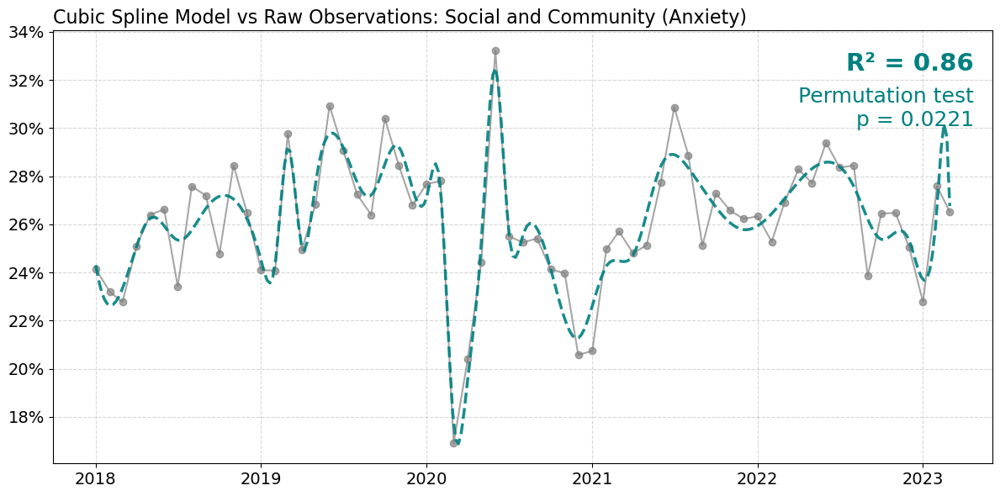


CHANGE POINT DETECTION:
No change points detected.


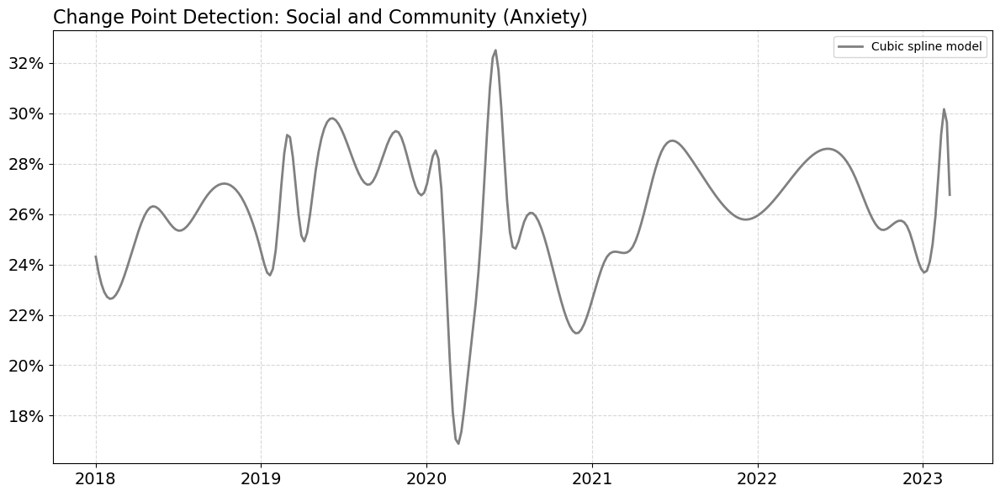


 DEFINED PERIODS
('2018-2019', '2018-01', '2020-01')
('2020-2021', '2020-01', '2021-12')
('2022 and up to Apr 2023', '2022-01', '2023-03')


 LOGISTIC REGRESSION, T-TESTING AND GEE MODELLING 



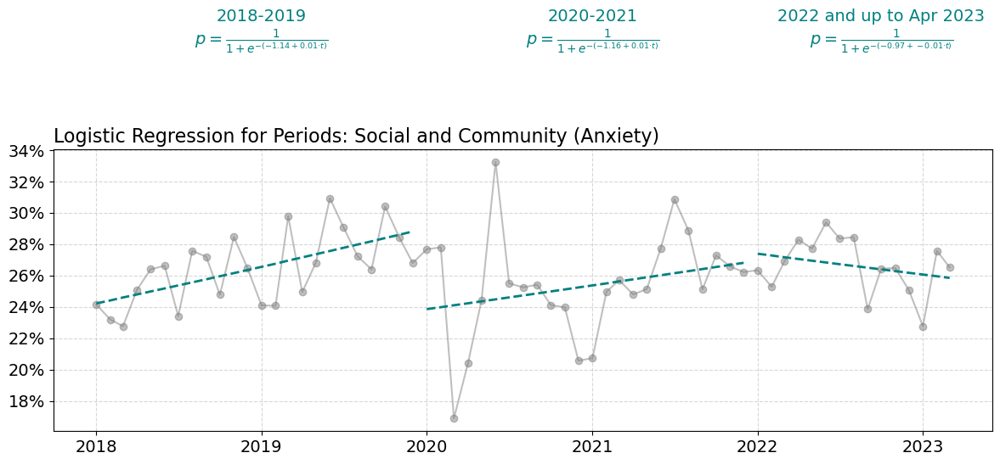



 Summary of Logistic Regression Model and Means for Periods:
                    Period  Intercept     Slope   p(Intercept)      p(Slope)  \
0                2018-2019  -1.140176  0.010247   0.000000e+00  8.667366e-07   
1                2020-2021  -1.160191  0.006790   0.000000e+00  2.541968e-03   
2  2022 and up to Apr 2023  -0.974673 -0.005645  2.002771e-138  2.470445e-01   

   Empirical Mean  
0        0.264299  
1        0.252479  
2        0.266505  


T-TESTING TO ASSESS VARIATION IN MEANS BETWEEN PERIODS


Pairwise T-Test p-values using Welch's T-Test:
                         2018-2019  2020-2021  2022 and up to Apr 2023
2018-2019                      NaN   0.003727                 0.662749
2020-2021                 0.003727        NaN                 0.006030
2022 and up to Apr 2023   0.662749   0.006030                      NaN

  Calculation of effect size using Cohen's d:
                             Comparison  Cohen's d
0                2018-2019 vs 2020-2021   0.0269

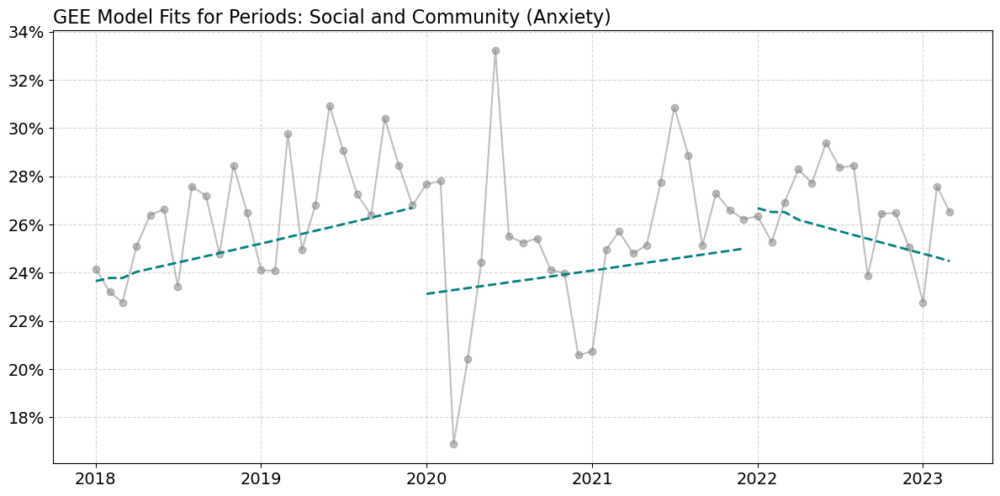


  Generalized Estimating Equations (GEE) Analysis:
                    Period  GEE Slope  GEE p-value
0                2018-2019   0.007024     0.000861
1                2020-2021   0.004470     0.062279
2  2022 and up to Apr 2023  -0.008247     0.080710


In [416]:
### CREATE WC / LINE VIZ : ANX - SOCIAL AND COMMUNITY

# ----------> SELECT THEME --------
theme = 'Social and Community'
# ---------------------------------

anx_wc_count_dict = anx_longitudinal_df[anx_longitudinal_df['theme'] == theme]['anx_topics_cleansed'].value_counts().to_dict()

## ------ Initiate a figure
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

## ------ Define a function to control colour darkness for background wc
def adjusted_grey_scale_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    max_freq = max(anx_wc_count_dict.values())  # Get max frequency for scaling
    frequency = anx_wc_count_dict.get(word, 1)
    min_darkness = 230  # Adjust this to make the lightest words darker
    darkness = int(200 * (1 - frequency / max_freq))  # Scale from black (0) to white (255)
    darkness = max(darkness, min_darkness)  # Ensure minimum darkness level
    return f"rgb({darkness}, {darkness}, {darkness})"  # Return adjusted grayscale color

## ----- Generate the word cloud with adjusted colours
# initialise wc object
wordcloud = WordCloud(
    width=1000,
    height=500,
    background_color='white',
    contour_width=1,
    max_font_size=300,
    relative_scaling=0.2,
    margin=1,
    collocations=False,
    random_state=2,
    color_func=adjusted_grey_scale_color_func
).generate_from_frequencies(anx_wc_count_dict)
# show wordcloud background
ax.imshow(wordcloud)
ax.set_axis_off()

## ----- Create time series of % measure -----
# filter to theme within pivot table
theme_series = anx_pivot_table.loc[theme]
# transpose and reset index
theme_series_trans = theme_series.reset_index()
# rename columns
theme_series_trans.columns = ['year_month', 'value']
# ensure 'year_month' is a string before conversion
theme_series_trans['year_month'] = theme_series_trans['year_month'].astype(str)
# convert 'year_month' to datetime format (assuming YYYY-MM format)
theme_series_trans['year_month'] = pd.to_datetime(theme_series_trans['year_month'], format='%Y-%m')
# ensure 'value' is numeric
theme_series_trans['value'] = pd.to_numeric(theme_series_trans['value'], errors='coerce').round(2)
# create inset axes
sub_ax = inset_axes(ax, width="90%", height="70%", loc='center', borderpad=1)

## ----- Smooth the line using interpolation ----
x = theme_series_trans['year_month'].map(lambda d: d.timestamp())  # Convert datetime to numerical timestamps
y = theme_series_trans['value']
# Create interpolation function
x_smooth = np.linspace(x.min(), x.max(), 300)  # Generate more points for smooth curve

spline_viz = make_interp_spline(x, y, k=3)  # k=3 for cubic spline smoothing
spline = UnivariateSpline(x, y, k=3, s=len(x)*1.0)  # s controls the amount of smoothing

y_smooth_viz = spline_viz(x_smooth)
y_smooth = spline(x_smooth)

# === R² CALCULATION ===
y_pred_at_x = spline(x)  # predict at original x
ss_total = np.sum((y - np.mean(y)) ** 2)
ss_res = np.sum((y - y_pred_at_x) ** 2)
r_squared = 1 - (ss_res / ss_total)

# Convert timestamps back to datetime for plotting
x_smooth_dates = pd.to_datetime(x_smooth, unit='s')
#fix y smooth
y_smooth[y_smooth < 0] = 0 
# plot the smooth line chart
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='white', linewidth=9, zorder=5)
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='darkgrey', linewidth=2.5, zorder=5)
# remove background from line chart
sub_ax.set_axis_off()

## ----- Display y-axis labels 
max_rate = 35
min_rate = 15
mid_rate_1 = 25
#mid_rate_2 = 25
sub_ax.axhline(y=max_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=min_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=mid_rate_1, color='black', linestyle='--', lw=0.4)
#sub_ax.axhline(y=mid_rate_2, color='black', linestyle='--', lw=0.4)
sub_ax.text(17350, max_rate - 0.2, f"{max_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold' )
sub_ax.text(17350, min_rate - 0.2, f"{min_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')
sub_ax.text(17350, mid_rate_1 - 0.2, f"{mid_rate_1:.0f}%",
    fontsize=10, color='black', fontweight='bold')
#sub_ax.text(17350, mid_rate_2 - 0.2, f"{mid_rate_2:.0f}%",
#    fontsize=10, color='black', fontweight='bold')

# ----- set title
lower_bound = 1960
upper_bound = 2019
title = theme.title()
title = title.replace("And","and")

fig_text(
    0.25, 0.819,
    title, color='black',
    fontweight='bold',
    fontsize=16,
    #highlight_textprops=[{"color": 'darkred'},{"fontsize": 13,"color": 'darkgrey',"fontweight": 'normal'}],
    ha='center')

##### ICON, TEXT, ARROW 1 (invasion of ukraine) -------------------------------------------------------------------------------------------

## ----- Icon text
sub_ax.text(
    0.43, 0.885,  # X, Y in Axes coordinates
    r"$\bf{Jun\ 2020}$" + "\n",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='left',
    va='center')

sub_ax.text(
    0.39, 0.05,  # X, Y in Axes coordinates
    r"$\bf{Mar\ 2020}$" + "\n",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='left',
    va='center')


## ----- Draw arrow
def draw_arrow(tail_position, head_position, invert=True):
    kw = dict(
        arrowstyle="Simple, tail_width=0.5, head_width=4, head_length=8", color="k")
    if invert:
        connectionstyle = "arc3,rad=-.5"
    else:
        connectionstyle = "arc3,rad=.5"
    a = FancyArrowPatch(tail_position, head_position,
                        connectionstyle=connectionstyle,
                        transform=fig.transFigure,
                        **kw)
    fig.patches.append(a)
#draw_arrow((0.62, 0.61), (0.702, 0.582))

# --------------------------------------------------------------------------------------------------
## ------ Save figure
save_path = 'E:/twitter_analysis_data/viz/theme_analysis/wc_line_detail/'
plt.savefig(save_path + "anx " + theme + '.png', bbox_inches='tight', pad_inches=0.15)

## ------ Show figure 
plt.show()


################################################# S T A T I S T I C A L   A N A L Y S I S ##########################################

p1 = "2018-2019"
p2 = "2020-2021"
p3 = "2022 and up to Apr 2023"

stat_analysis_for_theme(
    anx_or_hap = "Anxiety",
    input_dataframe=anx_stat_sig_df,
    theme=theme,
    periods=[
        (p1, "2018-01", "2020-01"),
        (p2, "2020-01", "2021-12"),
        (p3, "2022-01", "2023-03")
    ],
    logit_text_positions={
        p1: (0.5, 0.4),
        p2: (0.5, 0.4),
        p3: (0.655, 0.4)
    },
    gee_text_positions={
        p1: 0.05,
        p3: 0.05,
        p3: 0.05
    },
    line_color_data='grey',
    r_p_pos = (0.98, 0.95)
)

### Recreation (Events, Food and Drink, Travel and Transport) (Happiness)

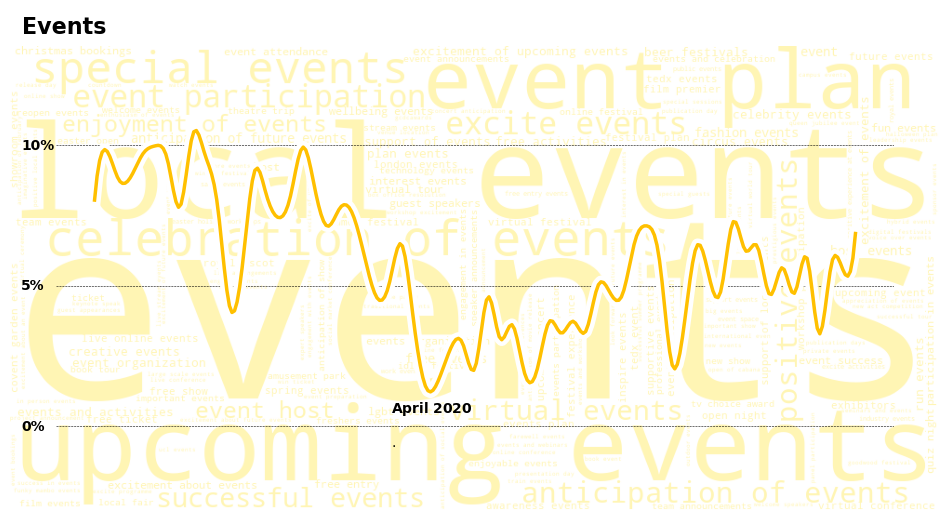



STATISTICAL ANALYSIS FOR THEME:

TESTING CUBIC SPLINE INTERPOLATION MODEL VERSUS NULL HYPOTHESIS:
Permutation p-value: 0.00490000
R² = 0.8275


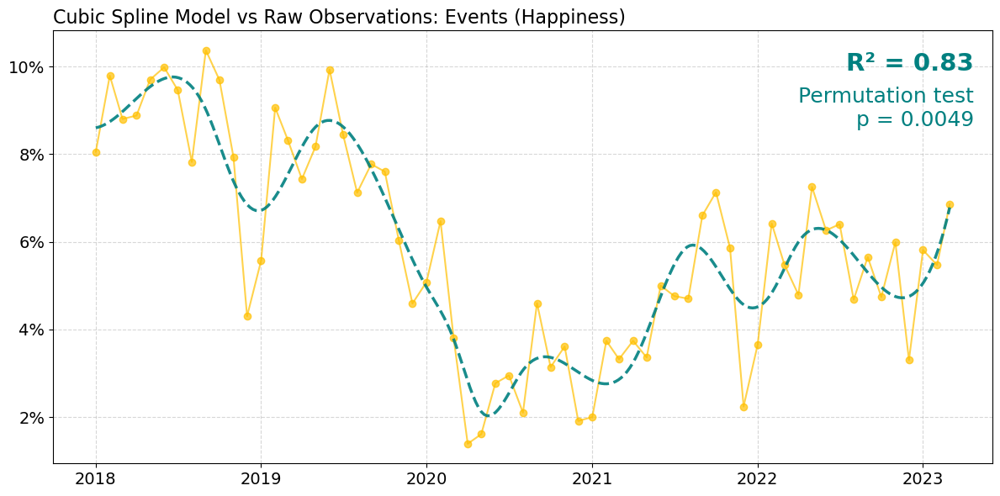


CHANGE POINT DETECTION:


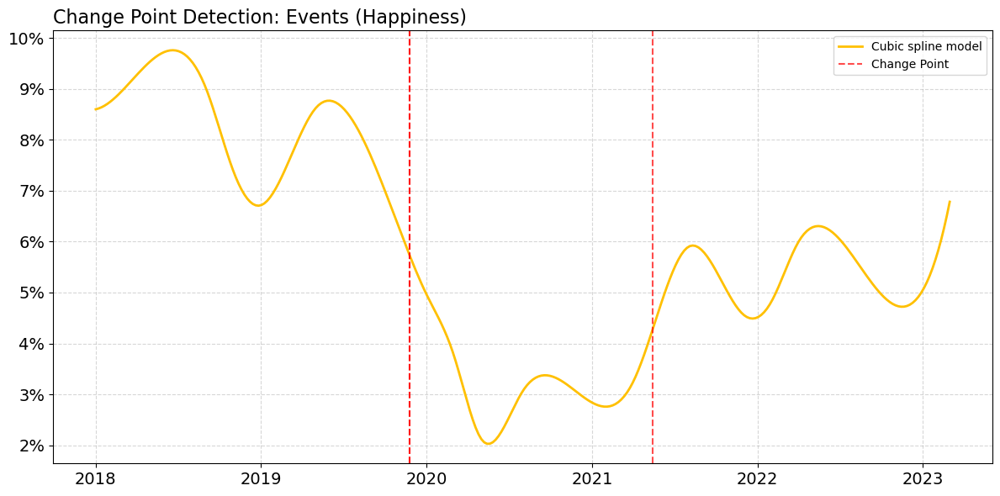


 DEFINED PERIODS
('Pre-Pandemic', '2018-01', '2020-02')
('Pandemic', '2020-03', '2021-05')
('Post-Pendemic', '2021-06', '2023-03')


 LOGISTIC REGRESSION, T-TESTING AND GEE MODELLING 



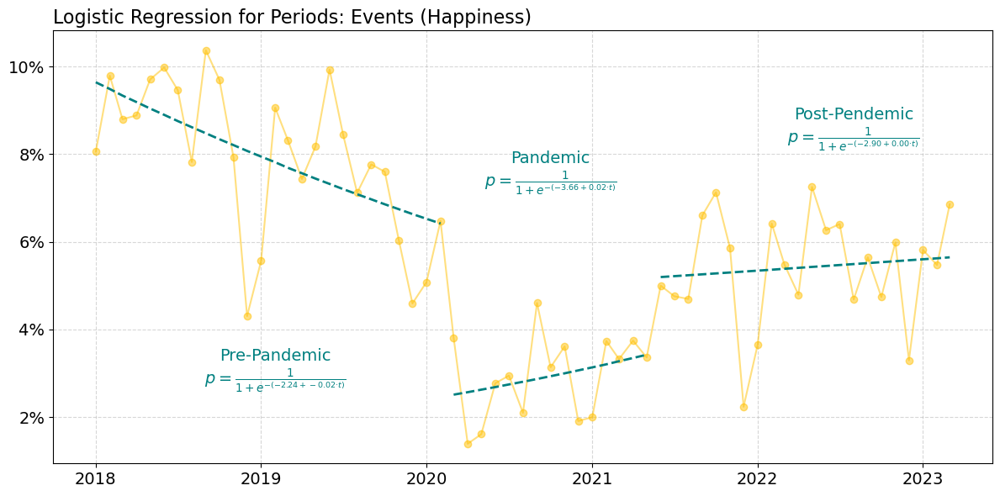



 Summary of Logistic Regression Model and Means for Periods:
          Period  Intercept     Slope  p(Intercept)      p(Slope)  \
0   Pre-Pandemic  -2.238005 -0.017673           0.0  3.111944e-10   
1       Pandemic  -3.658653  0.022773           0.0  3.727720e-02   
2  Post-Pendemic  -2.904080  0.004183           0.0  4.026829e-01   

   Empirical Mean  
0        0.079726  
1        0.029357  
2        0.054099  


T-TESTING TO ASSESS VARIATION IN MEANS BETWEEN PERIODS


Pairwise T-Test p-values using Welch's T-Test:
                Pre-Pandemic       Pandemic  Post-Pendemic
Pre-Pandemic             NaN  5.298970e-132   2.199037e-30
Pandemic       5.298970e-132            NaN   6.330438e-32
Post-Pendemic   2.199037e-30   6.330438e-32            NaN

  Calculation of effect size using Cohen's d:
                      Comparison  Cohen's d
0       Pre-Pandemic vs Pandemic   0.208824
1  Pre-Pandemic vs Post-Pendemic   0.100760
2      Pandemic vs Post-Pendemic  -0.122007


GEE MODELLING

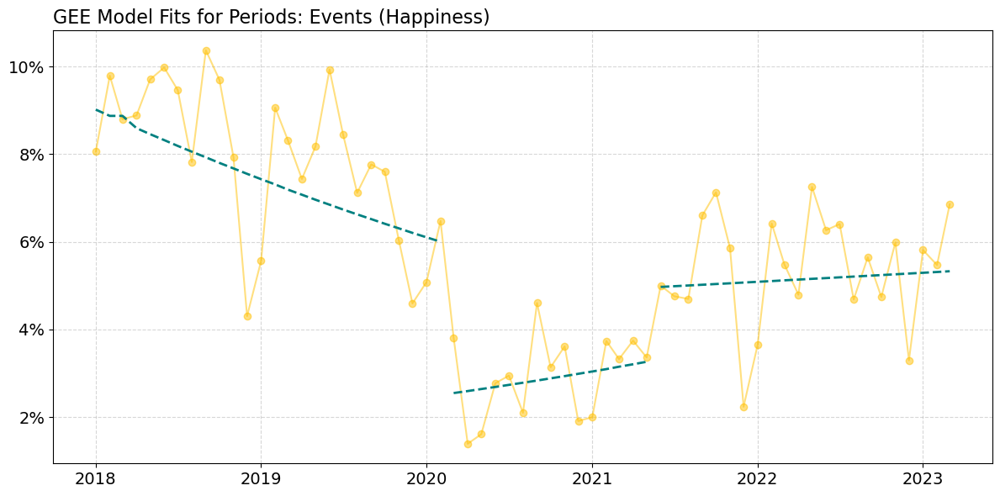


  Generalized Estimating Equations (GEE) Analysis:
          Period  GEE Slope   GEE p-value
0   Pre-Pandemic  -0.017577  6.376249e-09
1       Pandemic   0.018164  9.571597e-02
2  Post-Pendemic   0.003495  4.909889e-01


In [420]:
### CREATE WC / LINE VIZ : HAP - EVENTS
## covid tiemline: https://www.instituteforgovernment.org.uk/sites/default/files/2022-12/timeline-coronavirus-lockdown-december-2021.pdf

# ----------> SELECT THEME --------
theme = 'Events'
# ---------------------------------

hap_longitudinal_df.loc[:,'hap_topics_cleansed'] = [s.replace('celebrations','celebration') for s in hap_longitudinal_df['hap_topics_cleansed']]

hap_wc_count_dict = hap_longitudinal_df[hap_longitudinal_df['theme'] == theme]['hap_topics_cleansed'].value_counts().to_dict()

## ------ Initiate a figure
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

## ------ Define a function to control colour darkness for background wc
# Define a light version of #FFC000 — you can tweak this RGB as desired
light_yellow_rgb = (255, 245, 180)  # lighter tint of #FFC000

def constant_light_yellow_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    r, g, b = light_yellow_rgb
    return f"rgb({r}, {g}, {b})"

## ----- Generate the word cloud with adjusted colours
# initialise wc object
wordcloud = WordCloud(
    width=1000,
    height=500,
    background_color='white',
    contour_width=1,
    max_font_size=300,
    relative_scaling=0.2,
    margin=1,
    collocations=False,
    random_state=11,               
    color_func=constant_light_yellow_color_func
).generate_from_frequencies(hap_wc_count_dict)
# show wordcloud backgorund
ax.imshow(wordcloud)
ax.set_axis_off()

## ----- Create time series of % measure -----
# filter to theme within pivot table
theme_series = hap_pivot_table.loc[theme]
# transpose and reset index
theme_series_trans = theme_series.reset_index()
# rename columns
theme_series_trans.columns = ['year_month', 'value']
# ensure 'year_month' is a string before conversion
theme_series_trans['year_month'] = theme_series_trans['year_month'].astype(str)
# convert 'year_month' to datetime format (assuming YYYY-MM format)
theme_series_trans['year_month'] = pd.to_datetime(theme_series_trans['year_month'], format='%Y-%m')
# ensure 'value' is numeric
theme_series_trans['value'] = pd.to_numeric(theme_series_trans['value'], errors='coerce').round(2)
# create inset axes
sub_ax = inset_axes(ax, width="90%", height="70%", loc='center', borderpad=1)

## ----- Smooth the line using interpolation ----
x = theme_series_trans['year_month'].map(lambda d: d.timestamp())  # Convert datetime to numerical timestamps
y = theme_series_trans['value']
# Create interpolation function
x_smooth = np.linspace(x.min(), x.max(), 300)  # Generate more points for smooth curve

spline_viz = make_interp_spline(x, y, k=3)  # k=3 for cubic spline smoothing
spline = UnivariateSpline(x, y, k=3, s=len(x)*1.0)  # s controls the amount of smoothing

y_smooth_viz = spline_viz(x_smooth)
y_smooth = spline(x_smooth)

# === R² CALCULATION ===
y_pred_at_x = spline(x)  # predict at original x
ss_total = np.sum((y - np.mean(y)) ** 2)
ss_res = np.sum((y - y_pred_at_x) ** 2)
r_squared = 1 - (ss_res / ss_total)

# Convert timestamps back to datetime for plotting
x_smooth_dates = pd.to_datetime(x_smooth, unit='s')
#fix y smooth
y_smooth[y_smooth < 0] = 0 
# plot the smooth line chart
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='white', linewidth=9, zorder=5)
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='#FFC000', linewidth=2.5, zorder=5)
# remove background from line chart
sub_ax.set_axis_off()

## ----- Display y-axis labels 
max_rate = 10
min_rate = 0
mid_rate = 5
sub_ax.axhline(y=max_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=min_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=mid_rate, color='black', linestyle='--', lw=0.4)
sub_ax.text(17350, max_rate - 0.15, f"{max_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold' )
sub_ax.text(17350, min_rate - 0.15, f"{min_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')
sub_ax.text(17350, mid_rate - 0.15, f"{mid_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')

# ----- set title
lower_bound = 1960
upper_bound = 2019
title = theme.title()
title = title.replace("And","and")

fig_text(
    0.17, 0.824,
    title, color='black',
    fontweight='bold',
    fontsize=16,
    #highlight_textprops=[{"color": 'darkred'},{"fontsize": 13,"color": 'darkgrey',"fontweight": 'normal'}],
    ha='center')

##### ICON, TEXT, ARROW 2 (cost of living payment) -------------------------------------------------------------------------------------------

## ----- Display icon image(s)
# define function to load and return image
def open_image_local(path_to_image):
    image = Image.open(path_to_image) # Open the image
    image_array = np.array(image) # Convert to a numpy array
    return image_array # Output
# initialise image object from file
ld_nov_image = open_image_local('E:/twitter_analysis_data/viz/theme_analysis/icons/hap_cov_open_png.png')
# define the position and size parameters
ld_nov_image_xaxis = 0.45
ld_nov_image_yaxis = 0.595
ld_nov_image_width = 0.08
ld_nov_image_height = 0.08
ax_ld_nov_image = fig.add_axes([ld_nov_image_xaxis, ld_nov_image_yaxis, ld_nov_image_width, ld_nov_image_height])
# show icon
#ax_ld_nov_image.imshow(ld_nov_image)
ax_ld_nov_image.axis('off')  # Remove axis of the image

## ----- Icon text
sub_ax.text(
    0.4, 0.05,  # X, Y in Axes coordinates
    r"$\bf{April\ 2020}$" + "\n\n.",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='left',
    va='center')

## ----- Draw arrow
def draw_arrow(tail_position, head_position, invert=True):
    kw = dict(
        arrowstyle="Simple, tail_width=0.5, head_width=4, head_length=8", color="k")
    if invert:
        connectionstyle = "arc3,rad=-.5"
    else:
        connectionstyle = "arc3,rad=.5"
    a = FancyArrowPatch(tail_position, head_position,
                        connectionstyle=connectionstyle,
                        transform=fig.transFigure,
                        **kw)
    fig.patches.append(a)
#draw_arrow((0.52, 0.62), (0.58, 0.57))


# --------------------------------------------------------------------------------------------------
## ------ Save figure
save_path = 'E:/twitter_analysis_data/viz/theme_analysis/wc_line_detail/'
plt.savefig(save_path + "hap " + theme + '.png', bbox_inches='tight', pad_inches=0.15)

## ------ Show figure 
plt.show()

################################################# S T A T I S T I C A L   A N A L Y S I S ##########################################

p1 = "Pre-Pandemic"
p2 = "Pandemic"
p3 = "Post-Pendemic"

stat_analysis_for_theme(
    anx_or_hap = "Happiness",
    input_dataframe=hap_stat_sig_df,
    theme=theme,
    periods=[
        (p1, "2018-01", "2020-02"),
        (p2, "2020-03", "2021-05"),
        (p3, "2021-06", "2023-03")
    ],
    logit_text_positions={
        p1: (0.5, 0.025),
        p2: (0.5, 0.07),
        p3: (0.655, 0.08)
    },
    gee_text_positions={
        p1: 0.05,
        p3: 0.05,
        p3: 0.05
    },
    line_color_data='#FFC000',
    r_p_pos = (0.98, 0.95)
)

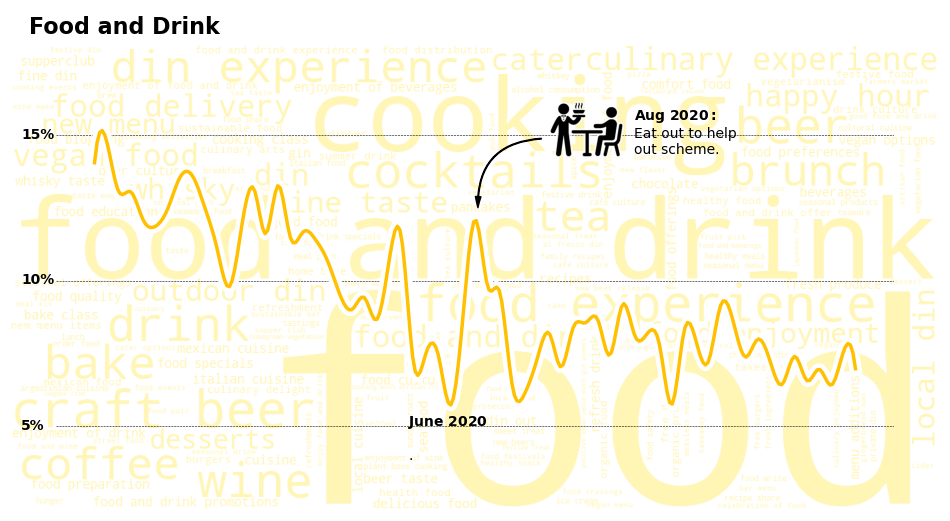



STATISTICAL ANALYSIS FOR THEME:

TESTING CUBIC SPLINE INTERPOLATION MODEL VERSUS NULL HYPOTHESIS:
Permutation p-value: 0.00510000
R² = 0.8262


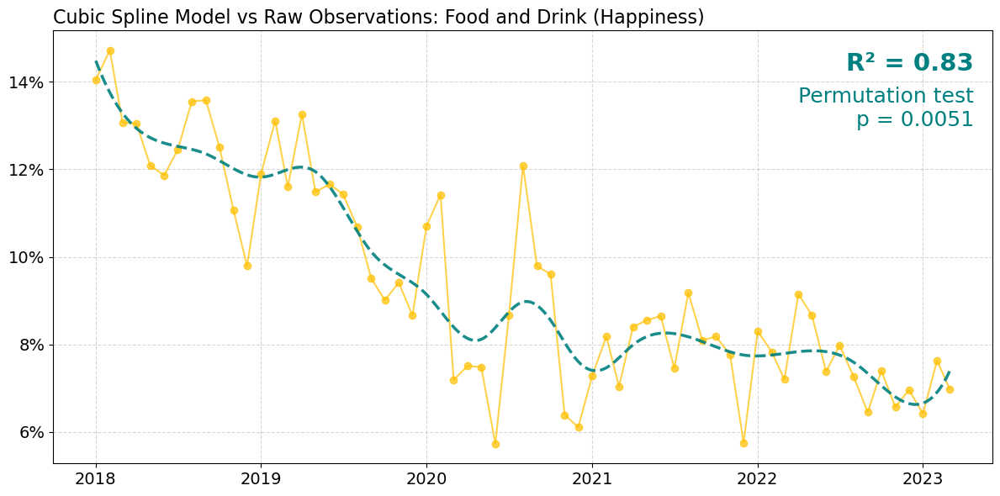


CHANGE POINT DETECTION:


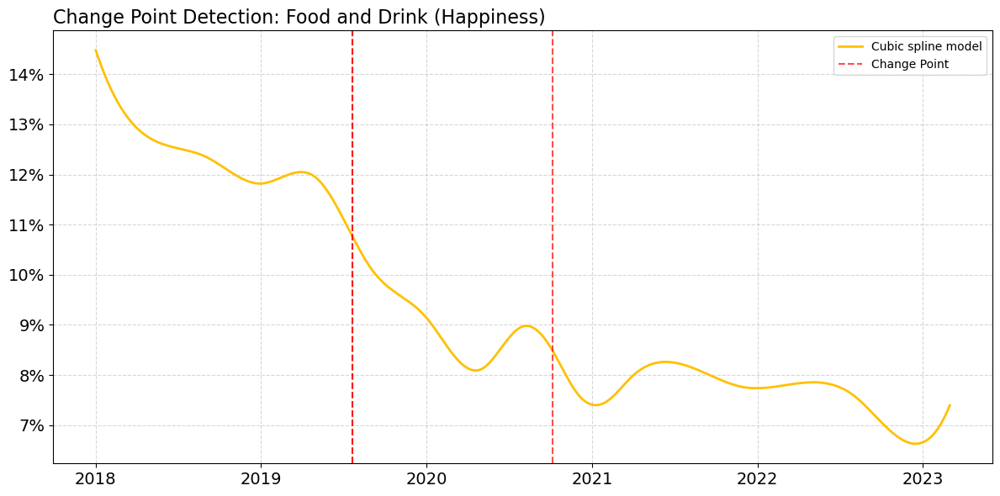


 DEFINED PERIODS
('Pre-Pandemic', '2018-01', '2020-02')
('Pandemic', '2020-03', '2020-12')
('Post-Pendemic', '2021-01', '2023-03')


 LOGISTIC REGRESSION, T-TESTING AND GEE MODELLING 



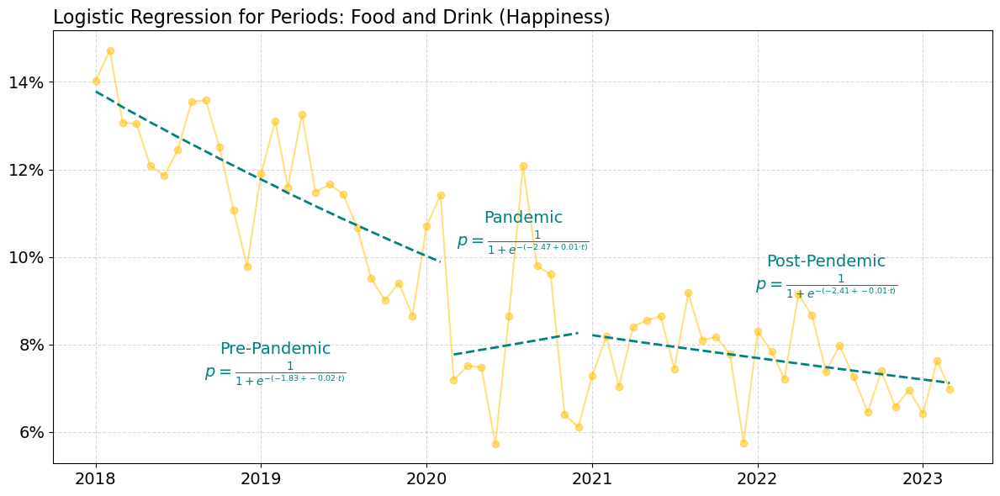



 Summary of Logistic Regression Model and Means for Periods:
          Period  Intercept     Slope  p(Intercept)      p(Slope)  \
0   Pre-Pandemic  -1.833686 -0.015045           0.0  1.658116e-10   
1       Pandemic  -2.473944  0.007433           0.0  5.449908e-01   
2  Post-Pendemic  -2.413995 -0.005938           0.0  5.307261e-02   

   Empirical Mean  
0        0.117922  
1        0.080112  
2        0.076773  


T-TESTING TO ASSESS VARIATION IN MEANS BETWEEN PERIODS


Pairwise T-Test p-values using Welch's T-Test:
               Pre-Pandemic      Pandemic  Post-Pendemic
Pre-Pandemic            NaN  5.956240e-32   1.610851e-60
Pandemic       5.956240e-32           NaN   2.854604e-01
Post-Pendemic  1.610851e-60  2.854604e-01            NaN

  Calculation of effect size using Cohen's d:
                      Comparison  Cohen's d
0       Pre-Pandemic vs Pandemic   0.121919
1  Pre-Pandemic vs Post-Pendemic   0.137752
2      Pandemic vs Post-Pendemic   0.012466


GEE MODELLING FOR EAC

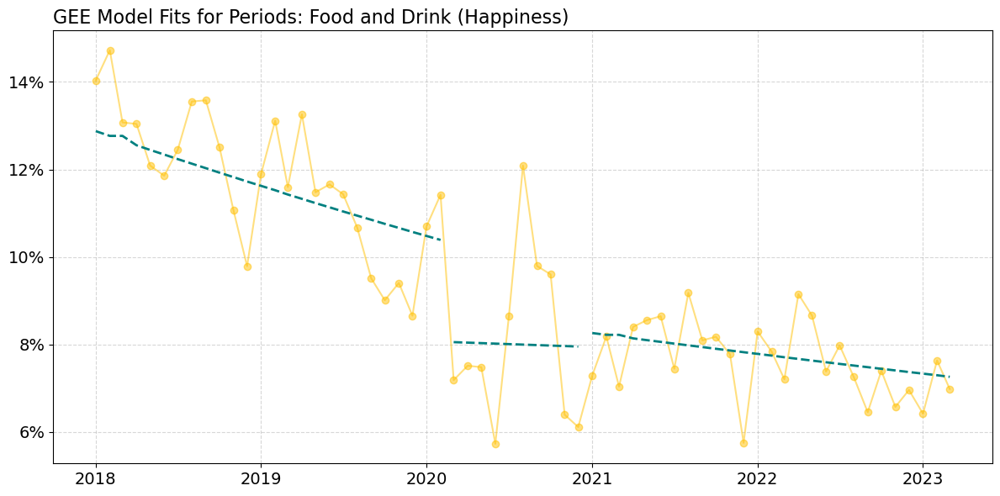


  Generalized Estimating Equations (GEE) Analysis:
          Period  GEE Slope  GEE p-value
0   Pre-Pandemic  -0.009706     0.000004
1       Pandemic  -0.001520     0.882573
2  Post-Pendemic  -0.005383     0.074862


In [421]:
### CREATE WC / LINE VIZ: HAP - FOOD AND DRINK

# ----------> SELECT THEME --------
theme = 'Food and Drink'
# ---------------------------------

hap_longitudinal_df.loc[:,'hap_topics_cleansed'] = [s.replace('celebrations','celebration') for s in hap_longitudinal_df['hap_topics_cleansed']]

hap_wc_count_dict = hap_longitudinal_df[hap_longitudinal_df['theme'] == theme]['hap_topics_cleansed'].value_counts().to_dict()

## ------ Initiate a figure
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

## ------ Define a function to control colour darkness for background wc
# Define a light version of #FFC000 — you can tweak this RGB as desired
light_yellow_rgb = (255, 245, 180)  # lighter tint of #FFC000

def constant_light_yellow_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    r, g, b = light_yellow_rgb
    return f"rgb({r}, {g}, {b})"

## ----- Generate the word cloud with adjusted colours
# initialise wc object
wordcloud = WordCloud(
    width=1000,
    height=500,
    background_color='white',
    contour_width=1,
    max_font_size=300,
    relative_scaling=0.2,
    margin=1,
    collocations=False,
    random_state=11,               
    color_func=constant_light_yellow_color_func
).generate_from_frequencies(hap_wc_count_dict)
# show wordcloud backgorund
ax.imshow(wordcloud)
ax.set_axis_off()

## ----- Create time series of % measure -----
# filter to theme within pivot table
theme_series = hap_pivot_table.loc[theme]
# transpose and reset index
theme_series_trans = theme_series.reset_index()
# rename columns
theme_series_trans.columns = ['year_month', 'value']
# ensure 'year_month' is a string before conversion
theme_series_trans['year_month'] = theme_series_trans['year_month'].astype(str)
# convert 'year_month' to datetime format (assuming YYYY-MM format)
theme_series_trans['year_month'] = pd.to_datetime(theme_series_trans['year_month'], format='%Y-%m')
# ensure 'value' is numeric
theme_series_trans['value'] = pd.to_numeric(theme_series_trans['value'], errors='coerce').round(2)
# create inset axes
sub_ax = inset_axes(ax, width="90%", height="70%", loc='center', borderpad=1)

## ----- Smooth the line using interpolation ----
x = theme_series_trans['year_month'].map(lambda d: d.timestamp())  # Convert datetime to numerical timestamps
y = theme_series_trans['value']
# Create interpolation function
x_smooth = np.linspace(x.min(), x.max(), 300)  # Generate more points for smooth curve

spline_viz = make_interp_spline(x, y, k=3)  # k=3 for cubic spline smoothing
spline = UnivariateSpline(x, y, k=3, s=len(x)*1.0)  # s controls the amount of smoothing

y_smooth_viz = spline_viz(x_smooth)
y_smooth = spline(x_smooth)

# === R² CALCULATION ===
y_pred_at_x = spline(x)  # predict at original x
ss_total = np.sum((y - np.mean(y)) ** 2)
ss_res = np.sum((y - y_pred_at_x) ** 2)
r_squared = 1 - (ss_res / ss_total)

# Convert timestamps back to datetime for plotting
x_smooth_dates = pd.to_datetime(x_smooth, unit='s')
#fix y smooth
y_smooth[y_smooth < 0] = 0 
# plot the smooth line chart
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='white', linewidth=9, zorder=5)
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='#FFC000', linewidth=2.5, zorder=5)
# remove background from line chart
sub_ax.set_axis_off()

## ----- Display y-axis labels 
max_rate = 15
min_rate = 5
mid_rate = 10
sub_ax.axhline(y=max_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=min_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=mid_rate, color='black', linestyle='--', lw=0.4)
sub_ax.text(17350, max_rate - 0.125, f"{max_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold' )
sub_ax.text(17350, min_rate - 0.125, f"{min_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')
sub_ax.text(17350, mid_rate - 0.125, f"{mid_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')


# ----- set title
lower_bound = 1960
upper_bound = 2019
title = theme.title()
title = title.replace("And","and")

fig_text(
    0.22, 0.824,
    title, color='black',
    fontweight='bold',
    fontsize=16,
    #highlight_textprops=[{"color": 'darkred'},{"fontsize": 13,"color": 'darkgrey',"fontweight": 'normal'}],
    ha='center')

##### TEXT 1 (June 20) -------------------------------------------------------------------------------------------

## ----- Icon text
sub_ax.text(
    0.42, 0.01,  # X, Y in Axes coordinates
    r"$\bf{June\ 2020}$" + "\n\n.",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='left',
    va='center')

##### ICON, TEXT, ARROW 2 (eat out to help out) -------------------------------------------------------------------------------------------

## ----- Display icon image(s)
# define function to load and return image
def open_image_local(path_to_image):
    image = Image.open(path_to_image) # Open the image
    image_array = np.array(image) # Convert to a numpy array
    return image_array # Output
# initialise image object from file
ld_nov_image = open_image_local('E:/twitter_analysis_data/viz/theme_analysis/icons/hap_food_eat_png.png')
# define the position and size parameters
ld_nov_image_xaxis = 0.565
ld_nov_image_yaxis = 0.64
ld_nov_image_width = 0.08
ld_nov_image_height = 0.08
ax_ld_nov_image = fig.add_axes([ld_nov_image_xaxis, ld_nov_image_yaxis, ld_nov_image_width, ld_nov_image_height])
# show icon
ax_ld_nov_image.imshow(ld_nov_image)
ax_ld_nov_image.axis('off')  # Remove axis of the image

## ----- Icon text
sub_ax.text(
    0.69, 0.95,  # X, Y in Axes coordinates
    r"$\bf{Aug\ 2020:}$" + "\nEat out to help\nout scheme.",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='left',
    va='center')

## ----- Draw arrow
def draw_arrow(tail_position, head_position, invert=False):
    kw = dict(
        arrowstyle="Simple, tail_width=0.5, head_width=4, head_length=8", color="k")
    if invert:
        connectionstyle = "arc3,rad=-.5"
    else:
        connectionstyle = "arc3,rad=.5"
    a = FancyArrowPatch(tail_position, head_position,
                        connectionstyle=connectionstyle,
                        transform=fig.transFigure,
                        **kw)
    fig.patches.append(a)
draw_arrow((0.57, 0.67), (0.515, 0.58))


# --------------------------------------------------------------------------------------------------
## ------ Save figure
save_path = 'E:/twitter_analysis_data/viz/theme_analysis/wc_line_detail/'
plt.savefig(save_path + "hap " + theme + '.png', bbox_inches='tight', pad_inches=0.15)

## ------ Show figure 
plt.show()

################################################# S T A T I S T I C A L   A N A L Y S I S ##########################################


p1 = "Pre-Pandemic"
p2 = "Pandemic"
p3 = "Post-Pendemic"

stat_analysis_for_theme(
    anx_or_hap = "Happiness",
    input_dataframe=hap_stat_sig_df,
    theme=theme,
    periods=[
        (p1, "2018-01", "2020-02"),
        (p2, "2020-03", "2020-12"),
        (p3, "2021-01", "2023-03")
    ],
    logit_text_positions={
        p1: (0.5, 0.07),
        p2: (0.5, 0.1),
        p3: (0.655, 0.09)
    },
    gee_text_positions={
        p1: 0.05,
        p3: 0.05,
        p3: 0.05
    },
    line_color_data='#FFC000',
    r_p_pos = (0.98, 0.95)
)

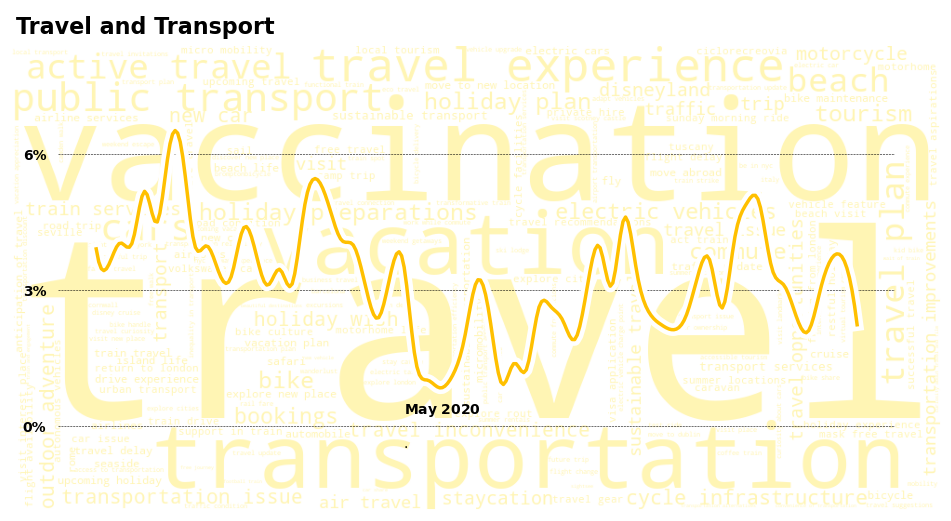



STATISTICAL ANALYSIS FOR THEME:

TESTING CUBIC SPLINE INTERPOLATION MODEL VERSUS NULL HYPOTHESIS:
Permutation p-value: 0.00000000
R² = 0.8278


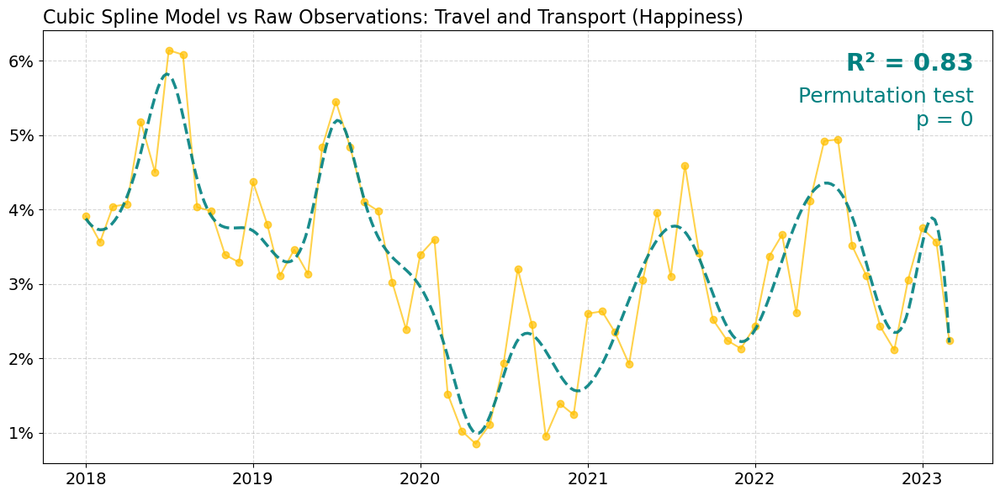


CHANGE POINT DETECTION:


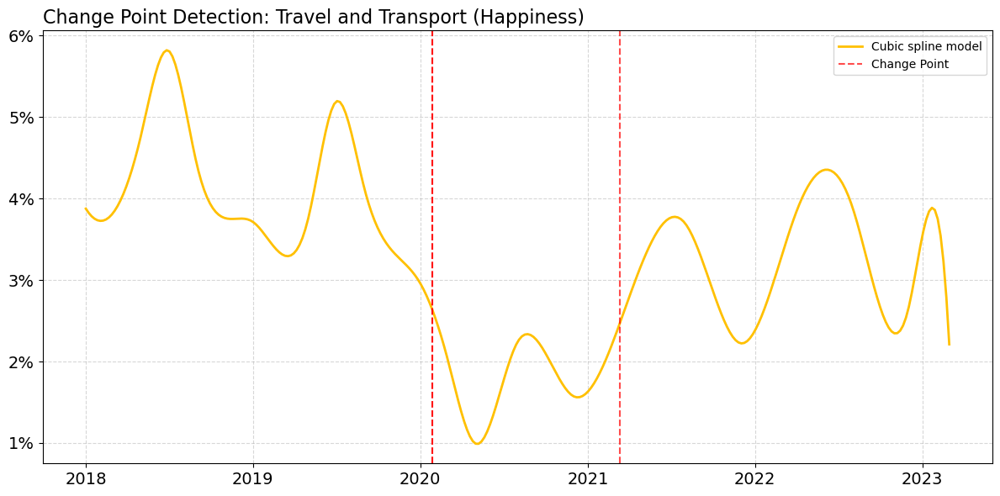


 DEFINED PERIODS
('Pre-Pandemic', '2018-01', '2020-02')
('Pandemic', '2020-03', '2020-12')
('Post-Pendemic', '2021-01', '2023-03')


 LOGISTIC REGRESSION, T-TESTING AND GEE MODELLING 



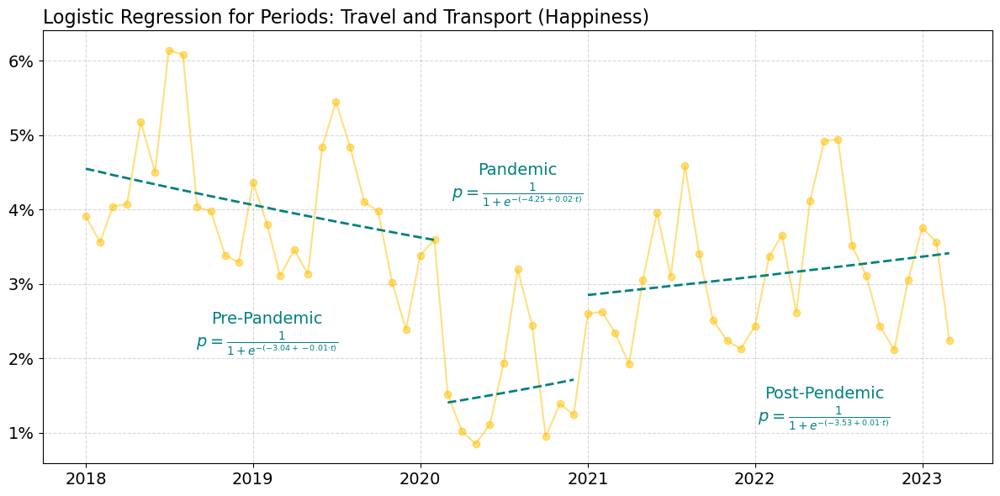



 Summary of Logistic Regression Model and Means for Periods:
          Period  Intercept     Slope   p(Intercept)  p(Slope)  Empirical Mean
0   Pre-Pandemic  -3.043793 -0.009845   0.000000e+00  0.010298        0.040647
1       Pandemic  -4.249800  0.022309  6.453202e-184  0.408201        0.015536
2  Post-Pendemic  -3.528295  0.007142   0.000000e+00  0.128276        0.031131


T-TESTING TO ASSESS VARIATION IN MEANS BETWEEN PERIODS


Pairwise T-Test p-values using Welch's T-Test:
               Pre-Pandemic      Pandemic  Post-Pendemic
Pre-Pandemic            NaN  2.030298e-52   1.730682e-09
Pandemic       2.030298e-52           NaN   1.127182e-21
Post-Pendemic  1.730682e-09  1.127182e-21            NaN

  Calculation of effect size using Cohen's d:
                      Comparison  Cohen's d
0       Pre-Pandemic vs Pandemic   0.138520
1  Pre-Pandemic vs Post-Pendemic   0.050826
2      Pandemic vs Post-Pendemic  -0.097337


GEE MODELLING FOR EACH PERIOD



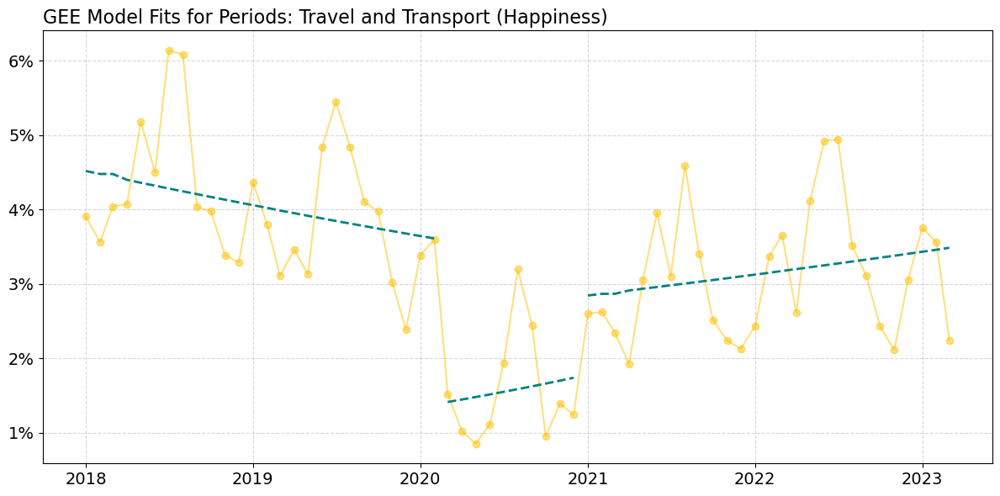


  Generalized Estimating Equations (GEE) Analysis:
          Period  GEE Slope  GEE p-value
0   Pre-Pandemic  -0.009333     0.012335
1       Pandemic   0.023430     0.314252
2  Post-Pendemic   0.008074     0.136185


In [424]:
### CREATE WC / LINE VIZ : HAP - TRAVEL AND TRANSPORT

# ----------> SELECT THEME --------
theme = 'Travel and Transport'
# ---------------------------------

hap_longitudinal_df.loc[:,'hap_topics_cleansed'] = [s.replace('celebrations','celebration') for s in hap_longitudinal_df['hap_topics_cleansed']]

hap_wc_count_dict = hap_longitudinal_df[hap_longitudinal_df['theme'] == theme]['hap_topics_cleansed'].value_counts().to_dict()

## ------ Initiate a figure
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

## ------ Define a function to control colour darkness for background wc
# Define a light version of #FFC000 — you can tweak this RGB as desired
light_yellow_rgb = (255, 245, 180)  # lighter tint of #FFC000

def constant_light_yellow_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    r, g, b = light_yellow_rgb
    return f"rgb({r}, {g}, {b})"

## ----- Generate the word cloud with adjusted colours
# initialise wc object
wordcloud = WordCloud(
    width=1000,
    height=500,
    background_color='white',
    contour_width=1,
    max_font_size=300,
    relative_scaling=0.2,
    margin=1,
    collocations=False,
    random_state=11,               
    color_func=constant_light_yellow_color_func
).generate_from_frequencies(hap_wc_count_dict)
# show wordcloud backgorund
ax.imshow(wordcloud)
ax.set_axis_off()

## ----- Create time series of % measure -----
# filter to theme within pivot table
theme_series = hap_pivot_table.loc[theme]
# transpose and reset index
theme_series_trans = theme_series.reset_index()
# rename columns
theme_series_trans.columns = ['year_month', 'value']
# ensure 'year_month' is a string before conversion
theme_series_trans['year_month'] = theme_series_trans['year_month'].astype(str)
# convert 'year_month' to datetime format (assuming YYYY-MM format)
theme_series_trans['year_month'] = pd.to_datetime(theme_series_trans['year_month'], format='%Y-%m')
# ensure 'value' is numeric
theme_series_trans['value'] = pd.to_numeric(theme_series_trans['value'], errors='coerce').round(2)
# create inset axes
sub_ax = inset_axes(ax, width="90%", height="70%", loc='center', borderpad=1)

## ----- Smooth the line using interpolation ----
x = theme_series_trans['year_month'].map(lambda d: d.timestamp())  # Convert datetime to numerical timestamps
y = theme_series_trans['value']
# Create interpolation function
x_smooth = np.linspace(x.min(), x.max(), 300)  # Generate more points for smooth curve

spline_viz = make_interp_spline(x, y, k=3)  # k=3 for cubic spline smoothing
spline = UnivariateSpline(x, y, k=3, s=len(x)*0.25)  # s controls the amount of smoothing

y_smooth_viz = spline_viz(x_smooth)
y_smooth = spline(x_smooth)

# === R² CALCULATION ===
y_pred_at_x = spline(x)  # predict at original x
ss_total = np.sum((y - np.mean(y)) ** 2)
ss_res = np.sum((y - y_pred_at_x) ** 2)
r_squared = 1 - (ss_res / ss_total)

# Convert timestamps back to datetime for plotting
x_smooth_dates = pd.to_datetime(x_smooth, unit='s')
#fix y smooth
y_smooth[y_smooth < 0] = 0 
# plot the smooth line chart
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='white', linewidth=9, zorder=5)
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='#FFC000', linewidth=2.5, zorder=5)
# remove background from line chart
sub_ax.set_axis_off()

## ----- Display y-axis labels 
max_rate = 6
min_rate = 0
mid_rate = 3
sub_ax.axhline(y=max_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=min_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=mid_rate, color='black', linestyle='--', lw=0.4)
sub_ax.text(17350, max_rate - 0.125, f"{max_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold' )
sub_ax.text(17350, min_rate - 0.125, f"{min_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')
sub_ax.text(17350, mid_rate - 0.125, f"{mid_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')


# ----- set title
lower_bound = 1960
upper_bound = 2019
title = theme.title()
title = title.replace("And","and")

fig_text(
    0.236, 0.824,
    title, color='black',
    fontweight='bold',
    fontsize=16,
    #highlight_textprops=[{"color": 'darkred'},{"fontsize": 13,"color": 'darkgrey',"fontweight": 'normal'}],
    ha='center')

##### TEXT 1 (June 20) -------------------------------------------------------------------------------------------

## ----- Icon text
sub_ax.text(
    0.413, 0.047,  # X, Y in Axes coordinates
    r"$\bf{May\ 2020}$" + "\n\n.",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='left',
    va='center')

# --------------------------------------------------------------------------------------------------
## ------ Save figure
save_path = 'E:/twitter_analysis_data/viz/theme_analysis/wc_line_detail/'
plt.savefig(save_path + "hap " + theme + '.png', bbox_inches='tight', pad_inches=0.15)

## ------ Show figure 
plt.show()


################################################# S T A T I S T I C A L   A N A L Y S I S ##########################################

p1 = "Pre-Pandemic"
p2 = "Pandemic"
p3 = "Post-Pendemic"

stat_analysis_for_theme(
    anx_or_hap = "Happiness",
    input_dataframe=hap_stat_sig_df,
    theme=theme,
    periods=[
        (p1, "2018-01", "2020-02"),
        (p2, "2020-03", "2020-12"),
        (p3, "2021-01", "2023-03")
    ],
    logit_text_positions={
        p1: (0.5, 0.02),
        p2: (0.5, 0.04),
        p3: (0.655, 0.01)
    },
    gee_text_positions={
        p1: 0.05,
        p3: 0.05,
        p3: 0.05
    },
    line_color_data='#FFC000',
    r_p_pos = (0.98, 0.95)
)

### Personal (Happiness)

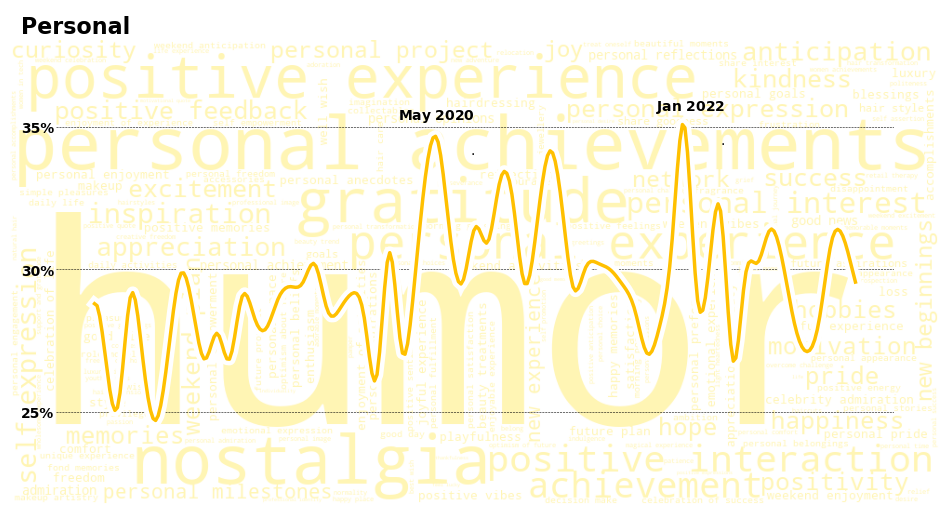



STATISTICAL ANALYSIS FOR THEME:

TESTING CUBIC SPLINE INTERPOLATION MODEL VERSUS NULL HYPOTHESIS:
Permutation p-value: 0.00560000
R² = 0.7824


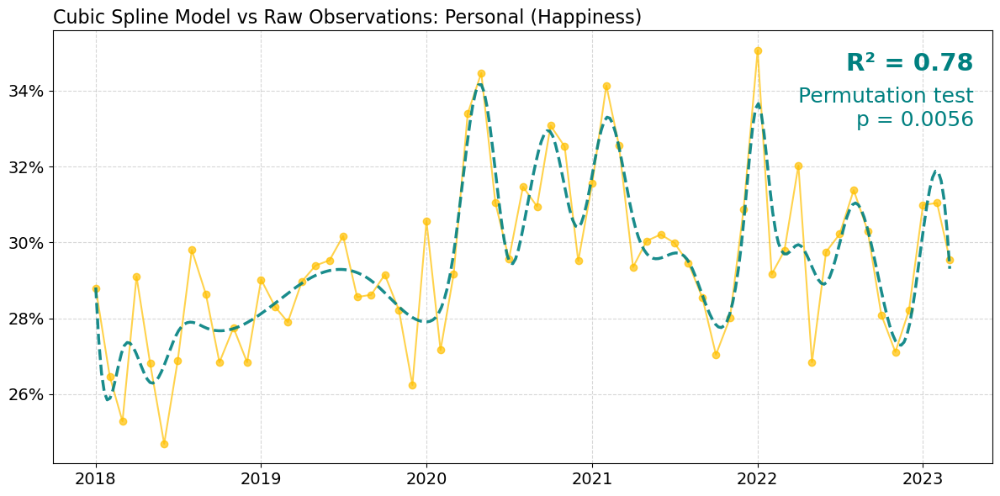


CHANGE POINT DETECTION:


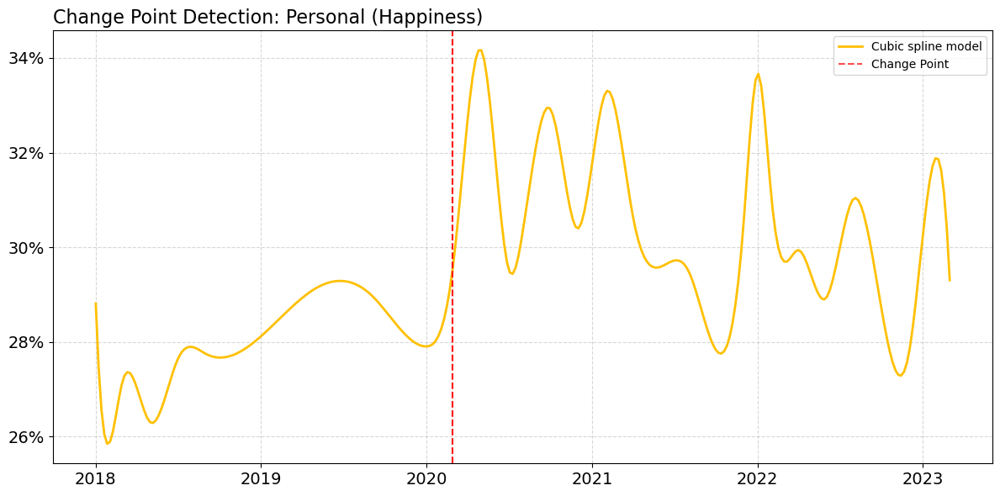


 DEFINED PERIODS
("Pre-March'20", '2018-01', '2020-03')
("Post-March'20", '2020-03', '2023-03')


 LOGISTIC REGRESSION, T-TESTING AND GEE MODELLING 



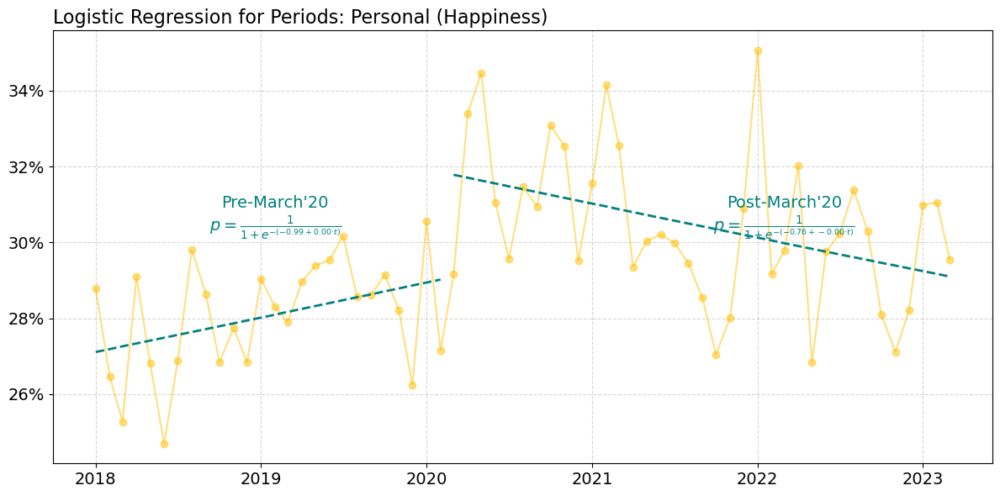



 Summary of Logistic Regression Model and Means for Periods:
          Period  Intercept     Slope   p(Intercept)  p(Slope)  Empirical Mean
0   Pre-March'20  -0.988875  0.003781   0.000000e+00  0.024678        0.280379
1  Post-March'20  -0.763774 -0.003523  6.457005e-272  0.001190        0.305021


T-TESTING TO ASSESS VARIATION IN MEANS BETWEEN PERIODS


Pairwise T-Test p-values using Welch's T-Test:
               Pre-March'20  Post-March'20
Pre-March'20            NaN   3.819169e-12
Post-March'20  3.819169e-12            NaN

  Calculation of effect size using Cohen's d:
                      Comparison  Cohen's d
0  Pre-March'20 vs Post-March'20  -0.054128


GEE MODELLING FOR EACH PERIOD



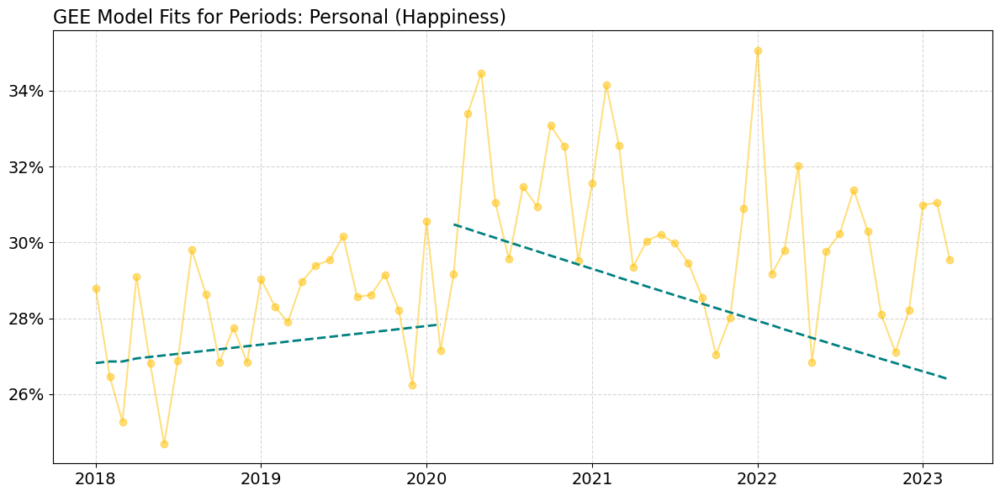


  Generalized Estimating Equations (GEE) Analysis:
          Period  GEE Slope  GEE p-value
0   Pre-March'20   0.002046     0.217978
1  Post-March'20  -0.005594     0.000004


In [427]:
### CREATE WC / LINE VIZ : HAP - PERSONAL

# ----------> SELECT THEME --------
theme = 'Personal'
# ---------------------------------

hap_longitudinal_df.loc[:,'hap_topics_cleansed'] = [s.replace('celebrations','celebration') for s in hap_longitudinal_df['hap_topics_cleansed']]

hap_wc_count_dict = hap_longitudinal_df[hap_longitudinal_df['theme'] == theme]['hap_topics_cleansed'].value_counts().to_dict()

## ------ Initiate a figure
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

## ------ Define a function to control colour darkness for background wc
# Define a light version of #FFC000 — you can tweak this RGB as desired
light_yellow_rgb = (255, 245, 180)  # lighter tint of #FFC000

def constant_light_yellow_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    r, g, b = light_yellow_rgb
    return f"rgb({r}, {g}, {b})"

## ----- Generate the word cloud with adjusted colours
# initialise wc object
wordcloud = WordCloud(
    width=1000,
    height=500,
    background_color='white',
    contour_width=1,
    max_font_size=300,
    relative_scaling=0.2,
    margin=1,
    collocations=False,
    random_state=11,               
    color_func=constant_light_yellow_color_func
).generate_from_frequencies(hap_wc_count_dict)
# show wordcloud backgorund
ax.imshow(wordcloud)
ax.set_axis_off()

## ----- Create time series of % measure -----
# filter to theme within pivot table
theme_series = hap_pivot_table.loc[theme]
# transpose and reset index
theme_series_trans = theme_series.reset_index()
# rename columns
theme_series_trans.columns = ['year_month', 'value']
# ensure 'year_month' is a string before conversion
theme_series_trans['year_month'] = theme_series_trans['year_month'].astype(str)
# convert 'year_month' to datetime format (assuming YYYY-MM format)
theme_series_trans['year_month'] = pd.to_datetime(theme_series_trans['year_month'], format='%Y-%m')
# ensure 'value' is numeric
theme_series_trans['value'] = pd.to_numeric(theme_series_trans['value'], errors='coerce').round(2)
# create inset axes
sub_ax = inset_axes(ax, width="90%", height="70%", loc='center', borderpad=1)

## ----- Smooth the line using interpolation ----
x = theme_series_trans['year_month'].map(lambda d: d.timestamp())  # Convert datetime to numerical timestamps
y = theme_series_trans['value']
# Create interpolation function
x_smooth = np.linspace(x.min(), x.max(), 300)  # Generate more points for smooth curve

spline_viz = make_interp_spline(x, y, k=3)  # k=3 for cubic spline smoothing
spline = UnivariateSpline(x, y, k=3, s=len(x)*1.0)  # s controls the amount of smoothing

y_smooth_viz = spline_viz(x_smooth)
y_smooth = spline(x_smooth)

# === R² CALCULATION ===
y_pred_at_x = spline(x)  # predict at original x
ss_total = np.sum((y - np.mean(y)) ** 2)
ss_res = np.sum((y - y_pred_at_x) ** 2)
r_squared = 1 - (ss_res / ss_total)

# Convert timestamps back to datetime for plotting
x_smooth_dates = pd.to_datetime(x_smooth, unit='s')
#fix y smooth
y_smooth[y_smooth < 0] = 0 
# plot the smooth line chart
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='white', linewidth=9, zorder=5)
sub_ax.plot(x_smooth_dates, y_smooth_viz, color='#FFC000', linewidth=2.5, zorder=5)
# remove background from line chart
sub_ax.set_axis_off()

## ----- Display y-axis labels 
max_rate = 35
min_rate = 25
mid_rate = 30
sub_ax.axhline(y=max_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=min_rate, color='black', linestyle='--', lw=0.4)
sub_ax.axhline(y=mid_rate, color='black', linestyle='--', lw=0.4)
sub_ax.text(17350, max_rate - 0.2, f"{max_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold' )
sub_ax.text(17350, min_rate - 0.2, f"{min_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')
sub_ax.text(17350, mid_rate - 0.2, f"{mid_rate:.0f}%",
    fontsize=10, color='black', fontweight='bold')


# ----- set title
lower_bound = 1960
upper_bound = 2019
title = theme.title()
title = title.replace("And","and")

fig_text(
    0.18, 0.817,
    title, color='black',
    fontweight='bold',
    fontsize=16,
    #highlight_textprops=[{"color": 'darkred'},{"fontsize": 13,"color": 'darkgrey',"fontweight": 'normal'}],
    ha='center')

##### ICON, TEXT, ARROW 2 (cost of living payment) -------------------------------------------------------------------------------------------

## ----- Display icon image(s)
# define function to load and return image
def open_image_local(path_to_image):
    image = Image.open(path_to_image) # Open the image
    image_array = np.array(image) # Convert to a numpy array
    return image_array # Output
# initialise image object from file
ld_nov_image = open_image_local('E:/twitter_analysis_data/viz/theme_analysis/icons/hap_cov_open_png.png')
# define the position and size parameters
ld_nov_image_xaxis = 0.45
ld_nov_image_yaxis = 0.595
ld_nov_image_width = 0.08
ld_nov_image_height = 0.08
ax_ld_nov_image = fig.add_axes([ld_nov_image_xaxis, ld_nov_image_yaxis, ld_nov_image_width, ld_nov_image_height])
# show icon
#ax_ld_nov_image.imshow(ld_nov_image)
ax_ld_nov_image.axis('off')  # Remove axis of the image

## ----- Icon text
sub_ax.text(
    0.5, 0.93,  # X, Y in Axes coordinates
    r"$\bf{May\ 2020}$" + "\n\n.",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='right',
    va='center')

sub_ax.text(
    0.799, 0.96,  # X, Y in Axes coordinates
    r"$\bf{Jan\ 2022}$" + "\n\n.",
    transform=sub_ax.transAxes,
    color='black',
    fontsize=10,
    #fontweight='bold',
    ha='right',
    va='center')

## ----- Draw arrow
def draw_arrow(tail_position, head_position, invert=True):
    kw = dict(
        arrowstyle="Simple, tail_width=0.5, head_width=4, head_length=8", color="k")
    if invert:
        connectionstyle = "arc3,rad=-.5"
    else:
        connectionstyle = "arc3,rad=.5"
    a = FancyArrowPatch(tail_position, head_position,
                        connectionstyle=connectionstyle,
                        transform=fig.transFigure,
                        **kw)
    fig.patches.append(a)
#draw_arrow((0.52, 0.62), (0.58, 0.57))

# --------------------------------------------------------------------------------------------------
## ------ Save figure
save_path = 'E:/twitter_analysis_data/viz/theme_analysis/wc_line_detail/'
plt.savefig(save_path + "hap " + theme + '.png', bbox_inches='tight', pad_inches=0.15)

## ------ Show figure 
plt.show()

################################################# S T A T I S T I C A L   A N A L Y S I S ##########################################

p1 = "Pre-March'20"
p2 = "Post-March'20"

stat_analysis_for_theme(
    anx_or_hap = "Happiness",
    input_dataframe=hap_stat_sig_df,
    theme=theme,
    periods=[
        (p1, "2018-01", "2020-03"),
        (p2, "2020-03", "2023-03")
    ],
    logit_text_positions={
        p1: (0.5, 0.3),
        p2: (0.655, 0.3)
    },
    gee_text_positions={
        p1: 0.05,
        p2: 0.05
    },
    line_color_data='#FFC000',
    r_p_pos = (0.98, 0.95)
)

# External informational sources for cross-validation
---

### ONS Personal Well-being estimates
---
https://www.ons.gov.uk/datasets/wellbeing-local-authority/editions/time-series/versions/4

### Covid Crisis:

Covid Timeline: https://www.instituteforgovernment.org.uk/sites/default/files/timeline-lockdown-web.pdf

### Cost of Living Crisis:

Wikipedia: https://en.wikipedia.org/wiki/2021%E2%80%93present_United_Kingdom_cost-of-living_crisis

Based on an Office for National Statistics (ONS) survey performed between 27 April and 22 May 2022, 77% of UK adults reported feeling worried about the rising cost of living, with 50% saying they worried "nearly every day".

Cost-of-Living Crisis (2022–2023): Rising inflation and economic challenges led to a cost-of-living crisis. By January 2023, approximately 93% of adults identified the cost of living as a major concern. 
ONS: https://www.ons.gov.uk/peoplepopulationandcommunity/wellbeing/bulletins/publicopinionsandsocialtrendsgreatbritain/11to22january2023?utm_source=chatgpt.com
 This period also saw increased public discourse on poverty and economic inequality. 
NATIONAL CENTRE FOR SOCIAL RESEARCH: https://natcen.ac.uk/news/change-public-mood-creates-challenge-next-government?utm_source=chatgpt.com

### Russia-Ukraine War:

House of Commons Timeline: https://researchbriefings.files.parliament.uk/documents/CBP-9476/CBP-9476.pdf

Key events
13 November 2021: President Zelenskyy says nearly 100,000 Russian troops have massed on the border with Ukraine.
17 December 2021: Russia presents a list of security demands in order to defuse the crisis over Ukraine, including a legally binding guarantee that Ukraine will never be accepted as a NATO Member State and that NATO will give up any military activity in eastern Europe and Ukraine.
22 January 2022: In a rare reference to intelligence gathering, the Foreign Office exposes evidence of a plot to install a pro-Russian government in Ukraine.
24 January 2022: The US places 8,500 troops on heightened alert to deploy to Europe as NATO reinforces its eastern borders with warships and fighter jets.
10 February 2022: Russia launches what is being called its largest military exercise since the Cold War, holding joint manoeuvres with Belarus, close to the Belarus/Ukrainian border.
21 February 2022: President Putin recognises the independence of the self-proclaimed Donetsk People’s Republic and the Luhansk People’s Republic. He then orders Russian troops into the territories for what he describes as “peacekeeping duties”.

Dates for the Homes for Ukraine program
March 2022: The Homes for Ukraine program opened 
February 19, 2024: The Ukraine Family Scheme closed to new applications 
May 16, 2024: The Ukraine Extension Scheme closed for most new applications 
February 4, 2025: Holders of the Ukraine Permission Extension scheme will be able to apply to renew their visas for another 18 months 


### National Politics:

December 12, 2019 – A general election was held, resulting in a Conservative Party victory under Boris Johnson, securing an 80-seat majority in the House of Commons.

Political Instability and Leadership Changes (2022): The resignation of Prime Minister Liz Truss in October 2022, after a brief tenure marked by economic challenges, contributed to political uncertainty. Her successor faced the task of stabilizing the government amidst public skepticism.

### National Center for Social Research 
Change of public mood creates challenge for the next government
https://natcen.ac.uk/news/change-public-mood-creates-challenge-next-government?utm_source=chatgpt.com